In [ ]:
!pip install -U scikit-learn==1.2.2 imbalanced-learn==0.10.1
!pip install dice-ml

In [2]:
# === Step 1: Import Required Libraries ===
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFECV
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns

# === Step 2: Load the Dataset ===
df = pd.read_csv("/kaggle/input/mental-3/Anxiety-dataset_2.csv")  # Replace with actual filename
print("✅ Dataset Loaded:", df.shape)

# === Step 3: Encode Demographics ===
demographic_cols = [f'D{i}' for i in range(1, 11)]
df_encoded = pd.get_dummies(df, columns=demographic_cols, drop_first=True)

# === Step 4: Define Targets and Features ===
y_bin = df_encoded["Anxiety-Binary"]
y_multi = df_encoded["Anxiety-Multi"]
X = df_encoded.drop(columns=["GAD_Score", "Anxiety-Binary", "Anxiety-Multi"])

# === Step 5: Feature Scaling ===
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# === Step 6: Train/Test Split ===
X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(X_scaled, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
X_train_multi, X_test_multi, y_train_multi, y_test_multi = train_test_split(X_scaled, y_multi, test_size=0.2, random_state=42, stratify=y_multi)

# === Step 7: Class Balancing using SMOTE ===
smote = SMOTE(random_state=42)
X_res_bin, y_res_bin = smote.fit_resample(X_train_bin, y_train_bin)
X_res_multi, y_res_multi = smote.fit_resample(X_train_multi, y_train_multi)

print("✅ SMOTE Applied")
print("  Binary  ➤", X_res_bin.shape, y_res_bin.value_counts().to_dict())
print("  Multi   ➤", X_res_multi.shape, y_res_multi.value_counts().to_dict())

✅ Dataset Loaded: (672, 56)
✅ SMOTE Applied
  Binary  ➤ (728, 60) {0: 364, 1: 364}
  Multi   ➤ (856, 60) {0: 214, 1: 214, 3: 214, 2: 214}


In [3]:
# === Import Required Modules ===
from sklearn.feature_selection import f_classif
import numpy as np
import pandas as pd

# === Set Desired Number of Top Features ===
top_n_binary = 24
top_n_multi = 29

# === Compute ANOVA F-scores ===
f_scores_bin, _ = f_classif(X_res_bin, y_res_bin)
f_scores_multi, _ = f_classif(X_res_multi, y_res_multi)

# === Create DataFrames for Sorting ===
anova_bin_df = pd.DataFrame({
    'Feature': X_res_bin.columns,
    'F_score': f_scores_bin
}).sort_values(by='F_score', ascending=False)

anova_multi_df = pd.DataFrame({
    'Feature': X_res_multi.columns,
    'F_score': f_scores_multi
}).sort_values(by='F_score', ascending=False)

# === Select Top-N Features ===
top_features_bin = anova_bin_df['Feature'].head(top_n_binary).tolist()
top_features_multi = anova_multi_df['Feature'].head(top_n_multi).tolist()

# === Subset Train/Test Sets with Selected Features ===
X_train_bin_selected = X_res_bin[top_features_bin]
X_test_bin_selected = X_test_bin[top_features_bin]

X_train_multi_selected = X_res_multi[top_features_multi]
X_test_multi_selected = X_test_multi[top_features_multi]

# === Display Output ===
print(f"✅ Selected Top {top_n_binary} Features (Binary): {top_features_bin}")
print(f"✅ Selected Top {top_n_multi} Features (MultiClass): {top_features_multi}")
print(f"📐 Final Shapes ➤ Binary: {X_train_bin_selected.shape}, MultiClass: {X_train_multi_selected.shape}")

✅ Selected Top 24 Features (Binary): ['GAD2', 'GAD1', 'GAD3', 'GAD7', 'GAD6', 'PHQ9', 'GAD4', 'PHQ6', 'PHQ8', 'GAD5', 'UCLA6', 'UCLA1', 'PSQI19', 'PHQ7', 'PHQ2', 'PSQI6', 'UCLA2', 'PSQI13', 'PSQI18', 'PHQ5', 'PHQ4', 'PSQI7', 'PSQI8', 'PSQI15']
✅ Selected Top 29 Features (MultiClass): ['GAD2', 'GAD1', 'GAD3', 'GAD7', 'GAD6', 'PHQ9', 'GAD5', 'GAD4', 'UCLA1', 'PHQ2', 'PHQ8', 'PHQ6', 'UCLA6', 'PHQ5', 'PHQ7', 'PSQI19', 'PHQ4', 'PSQI17', 'PSQI6', 'PSQI18', 'UCLA2', 'PSQI13', 'PSQI15', 'PSQI14', 'PSQI7', 'PSQI16', 'PSQI8', 'PSQI2', 'PSQI1']
📐 Final Shapes ➤ Binary: (728, 24), MultiClass: (856, 29)


In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, f1_score

class TabularTransformerClassifier(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=64, nhead=4, num_layers=2, dropout=0.1):
        super(TabularTransformerClassifier, self).__init__()
        self.num_classes = num_classes
        self.embedding = nn.Linear(input_dim, d_model)
        
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, num_classes if num_classes > 2 else 1)  # 1 neuron for binary
        )
    
    def forward(self, x):
        x = self.embedding(x)
        x = x.unsqueeze(1)  # (batch_size, seq_len=1, d_model)
        x = self.transformer(x)
        x = x.squeeze(1)  # (batch_size, d_model)
        out = self.classifier(x)
        return out

def get_loss_function(num_classes, smoothing=0.1):
    if num_classes == 2:
        return nn.BCEWithLogitsLoss()
    else:
        return LabelSmoothingCrossEntropy(smoothing=smoothing)

def compute_metrics(outputs, targets, num_classes):
    if num_classes == 2:
        preds = (torch.sigmoid(outputs) > 0.5).int().squeeze()
    else:
        preds = torch.argmax(outputs, dim=1)
    
    acc = accuracy_score(targets.cpu(), preds.cpu())
    f1 = f1_score(targets.cpu(), preds.cpu(), average='macro')
    return acc, f1

# === Setup ===
input_dim = X_train_bin_selected.shape[1]
num_classes_bin = 2

model_bin = TabularTransformerClassifier(input_dim=input_dim, num_classes=num_classes_bin)
optimizer = torch.optim.AdamW(model_bin.parameters(), lr=5e-4)
criterion = get_loss_function(num_classes_bin)

# === Convert to Tensor ===
X_train_tensor = torch.tensor(X_train_bin_selected.values, dtype=torch.float32)
y_train_tensor = torch.tensor(y_res_bin.values, dtype=torch.float32).unsqueeze(1)  # for BCEWithLogits

X_test_tensor = torch.tensor(X_test_bin_selected.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_bin.values, dtype=torch.float32).unsqueeze(1)

# === Train (simple loop for demo) ===
for epoch in range(100):
    model_bin.train()
    optimizer.zero_grad()
    outputs = model_bin(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()

# === Evaluate ===
model_bin.eval()
with torch.no_grad():
    test_outputs = model_bin(X_test_tensor)
    acc, f1 = compute_metrics(test_outputs, y_test_tensor, num_classes_bin)

print(f"✅ Binary ➤ Accuracy: {acc:.4f}, Macro F1: {f1:.4f}")

✅ Binary ➤ Accuracy: 0.9926, Macro F1: 0.9916


In [5]:
import torch

X_tensor_bin = torch.tensor(X_train_bin_selected.values, dtype=torch.float32)
y_tensor_bin = torch.tensor(y_res_bin.values, dtype=torch.float32).unsqueeze(1)  # for BCEWithLogits

In [6]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score

def train_with_early_stopping_binary(model, optimizer, criterion, X_train, y_train, X_val, y_val, max_epochs=100, patience=10):
    best_acc = 0
    best_weights = None
    patience_counter = 0

    acc_curve, loss_curve = [], []

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()

        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val)
            val_probs = torch.sigmoid(val_outputs)
            val_preds = (val_probs > 0.5).int()
            acc = accuracy_score(y_val.cpu(), val_preds.cpu())
            acc_curve.append(acc)
            loss_curve.append(loss.item())

            if acc > best_acc:
                best_acc = acc
                best_weights = model.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    break

    model.load_state_dict(best_weights)
    return best_acc, acc_curve, loss_curve

# === 5-Fold CV ===
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_curves_bin = []

for fold, (train_idx, val_idx) in enumerate(kfold.split(X_tensor_bin, y_res_bin.values)):
    print(f"\n🔁 Fold {fold+1}/5")
    X_train_fold, y_train_fold = X_tensor_bin[train_idx], y_tensor_bin[train_idx]
    X_val_fold, y_val_fold = X_tensor_bin[val_idx], y_tensor_bin[val_idx]

    model = TabularTransformerClassifier(input_dim=X_tensor_bin.shape[1], num_classes=2)
    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)
    criterion = torch.nn.BCEWithLogitsLoss()

    acc, acc_curve, loss_curve = train_with_early_stopping_binary(
        model, optimizer, criterion,
        X_train_fold, y_train_fold, X_val_fold, y_val_fold,
        max_epochs=100, patience=10
    )
    print(f"✅ Fold {fold+1} Best Accuracy: {acc:.4f}")
    all_curves_bin.append((acc_curve, loss_curve))


🔁 Fold 1/5
✅ Fold 1 Best Accuracy: 1.0000

🔁 Fold 2/5
✅ Fold 2 Best Accuracy: 0.9932

🔁 Fold 3/5
✅ Fold 3 Best Accuracy: 0.9932

🔁 Fold 4/5
✅ Fold 4 Best Accuracy: 0.9793

🔁 Fold 5/5
✅ Fold 5 Best Accuracy: 0.9724


In [7]:
# === Final Train/Test Tensors ===
X_train_full_bin = torch.tensor(X_train_bin_selected.values, dtype=torch.float32)
y_train_full_bin = torch.tensor(y_res_bin.values, dtype=torch.float32).unsqueeze(1)

X_test_tensor_bin = torch.tensor(X_test_bin_selected.values, dtype=torch.float32)
y_test_tensor_bin = torch.tensor(y_test_bin.values, dtype=torch.float32).unsqueeze(1)

# === Train Final Model ===
final_model_bin = TabularTransformerClassifier(input_dim=X_train_full_bin.shape[1], num_classes=2)
optimizer = torch.optim.AdamW(final_model_bin.parameters(), lr=5e-4)
criterion = torch.nn.BCEWithLogitsLoss()

best_acc = 0
best_weights = None
patience = 10
counter = 0
max_epochs = 100

for epoch in range(max_epochs):
    final_model_bin.train()
    optimizer.zero_grad()
    outputs = final_model_bin(X_train_full_bin)
    loss = criterion(outputs, y_train_full_bin)
    loss.backward()
    optimizer.step()

    # Early stopping on train set (or split a val set if desired)
    final_model_bin.eval()
    with torch.no_grad():
        val_outputs = final_model_bin(X_train_full_bin)
        val_preds = (torch.sigmoid(val_outputs) > 0.5).int()
        acc = accuracy_score(y_train_full_bin.cpu(), val_preds.cpu())

        if acc > best_acc:
            best_acc = acc
            best_weights = final_model_bin.state_dict()
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                break

final_model_bin.load_state_dict(best_weights)

# === Test Evaluation ===
final_model_bin.eval()
with torch.no_grad():
    test_outputs = final_model_bin(X_test_tensor_bin)
    test_preds = (torch.sigmoid(test_outputs) > 0.5).int()

    acc = accuracy_score(y_test_tensor_bin.cpu(), test_preds.cpu())
    f1 = f1_score(y_test_tensor_bin.cpu(), test_preds.cpu())

print("\n📌 Final Binary Hold-Out Test Set Evaluation:")
print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ F1 Score: {f1:.4f}")


📌 Final Binary Hold-Out Test Set Evaluation:
✅ Accuracy: 0.9852
✅ F1 Score: 0.9773


In [8]:
# === Step 1: Prepare Multiclass Tensors ===
X_train_tensor_multi = torch.tensor(X_train_multi_selected.values, dtype=torch.float32)
y_train_tensor_multi = torch.tensor(y_res_multi.values, dtype=torch.long)  # long for CrossEntropy

X_test_tensor_multi = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_tensor_multi = torch.tensor(y_test_multi.values, dtype=torch.long)

num_classes_multi = len(np.unique(y_res_multi))
input_dim_multi = X_train_multi_selected.shape[1]

print(f"📊 Multiclass Setup: Input dim = {input_dim_multi}, Classes = {num_classes_multi}")

# === Multiclass Model ===
model_multi = TabularTransformerClassifier(input_dim=input_dim_multi, num_classes=num_classes_multi)

# === Optimizer & Loss ===
optimizer_multi = torch.optim.AdamW(model_multi.parameters(), lr=5e-4)
criterion_multi = nn.CrossEntropyLoss()  # For multiclass

from sklearn.metrics import accuracy_score, f1_score, classification_report

def compute_metrics_multi(outputs, targets):
    preds = torch.argmax(outputs, dim=1)
    acc = accuracy_score(targets.cpu(), preds.cpu())
    f1 = f1_score(targets.cpu(), preds.cpu(), average='macro')
    return acc, f1

📊 Multiclass Setup: Input dim = 29, Classes = 4


In [9]:
# === Train Simple Loop (Demo) ===
for epoch in range(100):
    model_multi.train()
    optimizer_multi.zero_grad()
    outputs = model_multi(X_train_tensor_multi)
    loss = criterion_multi(outputs, y_train_tensor_multi)
    loss.backward()
    optimizer_multi.step()

# === Evaluate ===
model_multi.eval()
with torch.no_grad():
    test_outputs_multi = model_multi(X_test_tensor_multi)
    acc, f1 = compute_metrics_multi(test_outputs_multi, y_test_tensor_multi)

print(f"✅ Multiclass ➤ Accuracy: {acc:.4f}, Macro F1: {f1:.4f}")

✅ Multiclass ➤ Accuracy: 0.8593, Macro F1: 0.8313


In [10]:
def train_with_early_stopping_multi(model, optimizer, criterion, 
                                    X_train, y_train, X_val, y_val, 
                                    max_epochs=100, patience=10):
    best_acc = 0
    best_weights = None
    patience_counter = 0

    acc_curve, loss_curve = [], []

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()

        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val)
            acc, _ = compute_metrics_multi(val_outputs, y_val)
            acc_curve.append(acc)
            loss_curve.append(loss.item())

            if acc > best_acc:
                best_acc = acc
                best_weights = model.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    break

    model.load_state_dict(best_weights)
    return best_acc, acc_curve, loss_curve


# === 5-Fold CV for Multiclass ===
X_tensor_multi = torch.tensor(X_train_multi_selected.values, dtype=torch.float32)
y_tensor_multi = torch.tensor(y_res_multi.values, dtype=torch.long)

kfold_multi = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_curves_multi = []

for fold, (train_idx, val_idx) in enumerate(kfold_multi.split(X_tensor_multi, y_res_multi.values)):
    print(f"\n🔁 [Multiclass] Fold {fold+1}/5")
    X_train_fold, y_train_fold = X_tensor_multi[train_idx], y_tensor_multi[train_idx]
    X_val_fold, y_val_fold = X_tensor_multi[val_idx], y_tensor_multi[val_idx]

    model = TabularTransformerClassifier(input_dim=input_dim_multi, num_classes=num_classes_multi)
    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)
    criterion = nn.CrossEntropyLoss()

    acc, acc_curve, loss_curve = train_with_early_stopping_multi(
        model, optimizer, criterion,
        X_train_fold, y_train_fold, X_val_fold, y_val_fold,
        max_epochs=100, patience=10
    )
    print(f"✅ Fold {fold+1} Best Accuracy: {acc:.4f}")
    all_curves_multi.append((acc_curve, loss_curve))


🔁 [Multiclass] Fold 1/5
✅ Fold 1 Best Accuracy: 0.9419

🔁 [Multiclass] Fold 2/5
✅ Fold 2 Best Accuracy: 0.9649

🔁 [Multiclass] Fold 3/5
✅ Fold 3 Best Accuracy: 0.9532

🔁 [Multiclass] Fold 4/5
✅ Fold 4 Best Accuracy: 0.9532

🔁 [Multiclass] Fold 5/5
✅ Fold 5 Best Accuracy: 0.9181


In [11]:
# === Final Train/Test ===
X_train_full_multi = torch.tensor(X_train_multi_selected.values, dtype=torch.float32)
y_train_full_multi = torch.tensor(y_res_multi.values, dtype=torch.long)

X_test_tensor_multi = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_tensor_multi = torch.tensor(y_test_multi.values, dtype=torch.long)

final_model_multi = TabularTransformerClassifier(input_dim=input_dim_multi, num_classes=num_classes_multi)
optimizer = torch.optim.AdamW(final_model_multi.parameters(), lr=5e-4)
criterion = nn.CrossEntropyLoss()

best_acc = 0
best_weights = None
patience = 10
counter = 0
max_epochs = 100

for epoch in range(max_epochs):
    final_model_multi.train()
    optimizer.zero_grad()
    outputs = final_model_multi(X_train_full_multi)
    loss = criterion(outputs, y_train_full_multi)
    loss.backward()
    optimizer.step()

    final_model_multi.eval()
    with torch.no_grad():
        val_outputs = final_model_multi(X_train_full_multi)
        acc, _ = compute_metrics_multi(val_outputs, y_train_full_multi)

        if acc > best_acc:
            best_acc = acc
            best_weights = final_model_multi.state_dict()
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                break

final_model_multi.load_state_dict(best_weights)

# === Test Evaluation ===
final_model_multi.eval()
with torch.no_grad():
    test_outputs_multi = final_model_multi(X_test_tensor_multi)
    preds_multi = torch.argmax(test_outputs_multi, dim=1)
    acc = accuracy_score(y_test_tensor_multi.cpu(), preds_multi.cpu())
    f1 = f1_score(y_test_tensor_multi.cpu(), preds_multi.cpu(), average='macro')

print("\n📌 Final Multiclass Hold-Out Test Set Evaluation:")
print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Macro F1: {f1:.4f}")
print("\nClassification Report:\n", classification_report(y_test_tensor_multi.cpu(), preds_multi.cpu()))


📌 Final Multiclass Hold-Out Test Set Evaluation:
✅ Accuracy: 0.8370
✅ Macro F1: 0.7960

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92        38
           1       0.89      0.89      0.89        53
           2       0.81      0.67      0.73        33
           3       0.53      0.82      0.64        11

    accuracy                           0.84       135
   macro avg       0.79      0.82      0.80       135
weighted avg       0.85      0.84      0.84       135



In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score, classification_report
import numpy as np


def train_and_evaluate_transformer(X_train, y_train, X_test, y_test, num_classes, input_dim=None,
                                   d_model=64, nhead=4, num_layers=2, dropout=0.1, lr=5e-4,
                                   max_epochs=100, patience=10, k_folds=5, verbose=True):

    if input_dim is None:
        input_dim = X_train.shape[1]

    # === Define Model Class ===
    class TabularTransformerClassifier(nn.Module):
        def __init__(self, input_dim, num_classes, d_model=64, nhead=4, num_layers=2, dropout=0.1):
            super().__init__()
            self.embedding = nn.Linear(input_dim, d_model)
            encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
                                                       dropout=dropout, batch_first=True)
            self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
            self.classifier = nn.Sequential(
                nn.LayerNorm(d_model),
                nn.Linear(d_model, 64),
                nn.ReLU(),
                nn.Dropout(dropout),
                nn.Linear(64, num_classes if num_classes > 2 else 1)
            )

        def forward(self, x):
            x = self.embedding(x).unsqueeze(1)
            x = self.transformer(x).squeeze(1)
            return self.classifier(x)

    # === Define Loss Function ===
    criterion = nn.BCEWithLogitsLoss() if num_classes == 2 else nn.CrossEntropyLoss()

    # === Define Metric Function ===
    def compute_metrics(outputs, targets):
        if num_classes == 2:
            preds = (torch.sigmoid(outputs) > 0.5).int().squeeze()
        else:
            preds = torch.argmax(outputs, dim=1)
        acc = accuracy_score(targets.cpu(), preds.cpu())
        f1 = f1_score(targets.cpu(), preds.cpu(), average='macro')
        return acc, f1, preds

    # === Convert to Tensor ===
    dtype_y = torch.float32 if num_classes == 2 else torch.long
    y_train_tensor = torch.tensor(y_train.values, dtype=dtype_y).unsqueeze(1) if num_classes == 2 else torch.tensor(y_train.values, dtype=dtype_y)
    y_test_tensor = torch.tensor(y_test.values, dtype=dtype_y).unsqueeze(1) if num_classes == 2 else torch.tensor(y_test.values, dtype=dtype_y)

    X_tensor = torch.tensor(X_train.values, dtype=torch.float32)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)

    # === Cross-validation ===
    kfold = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)
    all_curves = []
    if verbose: print(f"\n📂 Cross-validation ({k_folds}-folds) started...")

    for fold, (train_idx, val_idx) in enumerate(kfold.split(X_tensor, y_train.values)):
        X_train_fold, y_train_fold = X_tensor[train_idx], y_train_tensor[train_idx]
        X_val_fold, y_val_fold = X_tensor[val_idx], y_train_tensor[val_idx]

        model = TabularTransformerClassifier(input_dim=input_dim, num_classes=num_classes,
                                             d_model=d_model, nhead=nhead, num_layers=num_layers, dropout=dropout)
        optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

        best_acc, best_weights, counter = 0, None, 0
        acc_curve, loss_curve = [], []

        for epoch in range(max_epochs):
            model.train()
            optimizer.zero_grad()
            output = model(X_train_fold)
            loss = criterion(output, y_train_fold)
            loss.backward()
            optimizer.step()

            model.eval()
            with torch.no_grad():
                val_output = model(X_val_fold)
                acc, _, _ = compute_metrics(val_output, y_val_fold)
                acc_curve.append(acc)
                loss_curve.append(loss.item())

                if acc > best_acc:
                    best_acc = acc
                    best_weights = model.state_dict()
                    counter = 0
                else:
                    counter += 1
                    if counter >= patience:
                        break

        model.load_state_dict(best_weights)
        if verbose: print(f"✅ Fold {fold+1} Best Accuracy: {best_acc:.4f}")
        all_curves.append((acc_curve, loss_curve))

    # === Final Training ===
    final_model = TabularTransformerClassifier(input_dim=input_dim, num_classes=num_classes,
                                               d_model=d_model, nhead=nhead, num_layers=num_layers, dropout=dropout)
    optimizer = torch.optim.AdamW(final_model.parameters(), lr=lr)

    best_acc, best_weights, counter = 0, None, 0

    for epoch in range(max_epochs):
        final_model.train()
        optimizer.zero_grad()
        output = final_model(X_tensor)
        loss = criterion(output, y_train_tensor)
        loss.backward()
        optimizer.step()

        final_model.eval()
        with torch.no_grad():
            val_output = final_model(X_tensor)
            acc, _, _ = compute_metrics(val_output, y_train_tensor)
            if acc > best_acc:
                best_acc = acc
                best_weights = final_model.state_dict()
                counter = 0
            else:
                counter += 1
                if counter >= patience:
                    break

    final_model.load_state_dict(best_weights)

    # === Test Evaluation ===
    final_model.eval()
    with torch.no_grad():
        test_output = final_model(X_test_tensor)
        acc, f1, preds = compute_metrics(test_output, y_test_tensor)

    print(f"\n📌 Final Hold-Out Test Set Evaluation (Classes = {num_classes}):")
    print(f"✅ Accuracy: {acc:.4f}")
    print(f"✅ Macro F1 Score: {f1:.4f}")
    print("\n📋 Classification Report:\n", classification_report(y_test_tensor.cpu(), preds.cpu()))

    return final_model, all_curves, (acc, f1)

final_model_bin, curves_bin, (acc_bin, f1_bin) = train_and_evaluate_transformer(
    X_train_bin_selected, y_res_bin, X_test_bin_selected, y_test_bin, num_classes=2
)


📂 Cross-validation (5-folds) started...
✅ Fold 1 Best Accuracy: 0.9589
✅ Fold 2 Best Accuracy: 0.9726
✅ Fold 3 Best Accuracy: 0.9932
✅ Fold 4 Best Accuracy: 1.0000
✅ Fold 5 Best Accuracy: 0.9517

📌 Final Hold-Out Test Set Evaluation (Classes = 2):
✅ Accuracy: 0.9926
✅ Macro F1 Score: 0.9916

📋 Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.99      0.99        91
         1.0       0.98      1.00      0.99        44

    accuracy                           0.99       135
   macro avg       0.99      0.99      0.99       135
weighted avg       0.99      0.99      0.99       135



In [13]:
final_model_multi, curves_multi, (acc_multi, f1_multi) = train_and_evaluate_transformer(
    X_train_multi_selected, y_res_multi, X_test_multi_selected, y_test_multi, num_classes=len(np.unique(y_res_multi))
)


📂 Cross-validation (5-folds) started...
✅ Fold 1 Best Accuracy: 0.9477
✅ Fold 2 Best Accuracy: 0.9064
✅ Fold 3 Best Accuracy: 0.9591
✅ Fold 4 Best Accuracy: 0.9357
✅ Fold 5 Best Accuracy: 0.9357

📌 Final Hold-Out Test Set Evaluation (Classes = 4):
✅ Accuracy: 0.8296
✅ Macro F1 Score: 0.8071

📋 Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.87      0.86        38
           1       0.87      0.85      0.86        53
           2       0.89      0.73      0.80        33
           3       0.59      0.91      0.71        11

    accuracy                           0.83       135
   macro avg       0.80      0.84      0.81       135
weighted avg       0.84      0.83      0.83       135



In [14]:
# =========================================================
# Tabular Transformer: CV training + final fit + 2-panel plot
# =========================================================
import numpy as np
import torch
import torch.nn as nn
from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, f1_score, classification_report
import matplotlib.pyplot as plt

# -------------------------
# Reproducibility helpers
# -------------------------
def set_seed(seed: int = 42):
    import random, os
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def to_tensor(X, y=None, num_classes=2):
    X_t = torch.tensor(X.values if hasattr(X, "values") else X, dtype=torch.float32)
    if y is None:
        return X_t, None
    if num_classes == 2:
        y_t = torch.tensor((y.values if hasattr(y, "values") else y), dtype=torch.float32).unsqueeze(1)
    else:
        y_t = torch.tensor((y.values if hasattr(y, "values") else y), dtype=torch.long)
    return X_t, y_t

def preds_from_logits(logits, num_classes):
    if num_classes == 2:
        return (torch.sigmoid(logits) > 0.5).long().squeeze()
    else:
        return torch.argmax(logits, dim=1)

# -------------------------
# Model
# -------------------------
class TabularTransformerClassifier(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=64, nhead=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.num_classes = num_classes
        self.embedding = nn.Linear(input_dim, d_model)
        enc = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout, batch_first=True)
        self.transformer = nn.TransformerEncoder(enc, num_layers=num_layers)
        out_dim = 1 if num_classes == 2 else num_classes
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, out_dim),
        )

    def forward(self, x):
        x = self.embedding(x).unsqueeze(1)   # [B, 1, d_model]
        x = self.transformer(x).squeeze(1)   # [B, d_model]
        return self.classifier(x)

# -------------------------
# Train + Evaluate
# -------------------------
def train_and_evaluate_transformer(
    X_train_df, y_train_ser, X_test_df, y_test_ser,
    num_classes=2, input_dim=None,
    d_model=64, nhead=4, num_layers=2, dropout=0.1, lr=5e-4,
    max_epochs=100, patience=10, k_folds=5, seed=42, final_val_size=0.15, verbose=True
):
    set_seed(seed)
    if input_dim is None:
        input_dim = X_train_df.shape[1]

    criterion = nn.BCEWithLogitsLoss() if num_classes == 2 else nn.CrossEntropyLoss()

    # ---------- Cross-validation (records train/val acc & loss per epoch per fold) ----------
    if verbose: print(f"\n📂 Cross-validation ({k_folds}-folds) started...")
    kf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=seed)
    X_np, y_np = X_train_df.values, y_train_ser.values

    all_curves = []  # list of dicts: {train_acc, val_acc, train_loss, val_loss}

    for fold, (idx_tr, idx_val) in enumerate(kf.split(X_np, y_np), 1):
        X_tr_t, y_tr_t   = to_tensor(X_np[idx_tr],  y_np[idx_tr],  num_classes)
        X_val_t, y_val_t = to_tensor(X_np[idx_val], y_np[idx_val], num_classes)

        model = TabularTransformerClassifier(
            input_dim=input_dim, num_classes=num_classes,
            d_model=d_model, nhead=nhead, num_layers=num_layers, dropout=dropout
        )
        optim = torch.optim.AdamW(model.parameters(), lr=lr)

        tr_acc_curve, val_acc_curve = [], []
        tr_loss_curve, val_loss_curve = [], []

        best_acc, best_state, no_improve = -np.inf, None, 0

        for epoch in range(max_epochs):
            # train
            model.train()
            optim.zero_grad()
            logits_tr = model(X_tr_t)
            loss_tr = criterion(logits_tr, y_tr_t)
            loss_tr.backward()
            optim.step()

            # evaluate train + val
            model.eval()
            with torch.no_grad():
                logits_tr = model(X_tr_t)
                preds_tr = preds_from_logits(logits_tr, num_classes)
                y_tr_np = y_tr_t.squeeze().cpu().numpy() if num_classes == 2 else y_tr_t.cpu().numpy()
                train_acc = accuracy_score(y_tr_np, preds_tr.cpu().numpy())
                train_loss = criterion(logits_tr, y_tr_t).item()

                logits_val = model(X_val_t)
                preds_val = preds_from_logits(logits_val, num_classes)
                y_val_np = y_val_t.squeeze().cpu().numpy() if num_classes == 2 else y_val_t.cpu().numpy()
                val_acc = accuracy_score(y_val_np, preds_val.cpu().numpy())
                val_loss = criterion(logits_val, y_val_t).item()

            tr_acc_curve.append(train_acc);  val_acc_curve.append(val_acc)
            tr_loss_curve.append(train_loss); val_loss_curve.append(val_loss)

            # early stopping on validation accuracy
            if val_acc > best_acc:
                best_acc = val_acc
                best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
                no_improve = 0
            else:
                no_improve += 1
                if no_improve >= patience:
                    break

        # restore best
        if best_state is not None:
            model.load_state_dict(best_state)
        if verbose: print(f"✅ Fold {fold} Best Val Acc: {best_acc:.4f}")

        all_curves.append({
            "train_acc":  tr_acc_curve,
            "val_acc":    val_acc_curve,
            "train_loss": tr_loss_curve,
            "val_loss":   val_loss_curve
        })

    # ---------- Final fit: train/val split carved from training only ----------
    sss = StratifiedShuffleSplit(n_splits=1, test_size=final_val_size, random_state=seed)
    idx_tr_final, idx_val_final = next(sss.split(X_np, y_np))
    X_tr_final_t, y_tr_final_t   = to_tensor(X_np[idx_tr_final],  y_np[idx_tr_final],  num_classes)
    X_val_final_t, y_val_final_t = to_tensor(X_np[idx_val_final], y_np[idx_val_final], num_classes)

    final_model = TabularTransformerClassifier(
        input_dim=input_dim, num_classes=num_classes,
        d_model=d_model, nhead=nhead, num_layers=num_layers, dropout=dropout
    )
    optim = torch.optim.AdamW(final_model.parameters(), lr=lr)

    best_acc, best_state, no_improve = -np.inf, None, 0
    for epoch in range(max_epochs):
        final_model.train()
        optim.zero_grad()
        logits = final_model(X_tr_final_t)
        loss = criterion(logits, y_tr_final_t)
        loss.backward()
        optim.step()

        # validate on held-out slice from training
        final_model.eval()
        with torch.no_grad():
            logits_val = final_model(X_val_final_t)
            preds_val = preds_from_logits(logits_val, num_classes)
            y_val_np = y_val_final_t.squeeze().cpu().numpy() if num_classes == 2 else y_val_final_t.cpu().numpy()
            val_acc = accuracy_score(y_val_np, preds_val.cpu().numpy())

        if val_acc > best_acc:
            best_acc = val_acc
            best_state = {k: v.cpu().clone() for k, v in final_model.state_dict().items()}
            no_improve = 0
        else:
            no_improve += 1
            if no_improve >= patience:
                break

    if best_state is not None:
        final_model.load_state_dict(best_state)

    # ---------- One-shot Test evaluation ----------
    X_test_t, y_test_t = to_tensor(X_test_df, y_test_ser, num_classes)
    final_model.eval()
    with torch.no_grad():
        test_logits = final_model(X_test_t)
        preds_test = preds_from_logits(test_logits, num_classes)
        y_true = y_test_t.squeeze().cpu().numpy() if num_classes == 2 else y_test_t.cpu().numpy()
        y_pred = preds_test.cpu().numpy()
        acc = accuracy_score(y_true, y_pred)
        f1  = f1_score(y_true, y_pred, average='macro')

    print(f"\n📌 Final Hold-Out Test Set (Classes = {num_classes}):")
    print(f"✅ Accuracy: {acc:.4f}")
    print(f"✅ Macro F1 Score: {f1:.4f}")
    print("\n📋 Classification Report:\n", classification_report(y_true, y_pred))

    return final_model, all_curves, (acc, f1)

# -------------------------
# Plot: two-panel (accuracy + loss, per-fold + bold averages)
# -------------------------
def _pad_to_same_length(curves):
    max_len = max(len(c) for c in curves)
    padded = [np.pad(np.asarray(c, dtype=float), (0, max_len - len(c)), constant_values=np.nan)
              for c in curves]
    return np.vstack(padded), max_len

def plot_train_val_accloss_across_folds(
    all_curves,
    title_left="Training and Validation Accuracy Across Folds",
    title_right="Training and Validation Loss Across Folds",
    save_path="cv_train_val_dual.png",
    dpi=300
):
    tr_acc_list  = [d["train_acc"]  for d in all_curves]
    val_acc_list = [d["val_acc"]    for d in all_curves]
    tr_loss_list = [d["train_loss"] for d in all_curves]
    val_loss_list= [d["val_loss"]   for d in all_curves]

    tr_acc_arr,  L = _pad_to_same_length(tr_acc_list)
    val_acc_arr, _ = _pad_to_same_length(val_acc_list)
    tr_loss_arr, _ = _pad_to_same_length(tr_loss_list)
    val_loss_arr, _= _pad_to_same_length(val_loss_list)

    epochs = np.arange(1, L+1)
    avg_tr_acc  = np.nanmean(tr_acc_arr,  axis=0)
    avg_val_acc = np.nanmean(val_acc_arr, axis=0)
    avg_tr_loss = np.nanmean(tr_loss_arr, axis=0)
    avg_val_loss= np.nanmean(val_loss_arr,axis=0)

    fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=dpi)

    # Accuracy
    ax = axes[0]
    for i, (tr, vl) in enumerate(zip(tr_acc_list, val_acc_list), 1):
        ax.plot(np.arange(1, len(tr)+1), tr, lw=1.5, label=f"Train (Fold {i})")
        ax.plot(np.arange(1, len(vl)+1), vl, lw=1.5, ls="--", label=f"Val (Fold {i})")
    ax.plot(epochs, avg_tr_acc,  color="k", lw=4, label="Average Train")
    ax.plot(epochs, avg_val_acc, color="k", lw=4, ls="--", label="Average Val")
    ax.set_title(title_left, fontsize=18, weight="bold")
    ax.set_xlabel("Epoch", fontsize=14); ax.set_ylabel("Accuracy", fontsize=14)
    ax.set_ylim(0.0, 1.01); ax.grid(True, alpha=0.3)

    # Compact legend (first two folds + averages)
    handles, labels = ax.get_legend_handles_labels()
    keep, seen = [], set()
    for h, l in zip(handles, labels):
        if ("Average" in l) or l.endswith("(Fold 1)") or l.endswith("(Fold 2)"):
            if l not in seen:
                keep.append((h, l)); seen.add(l)
    ax.legend([h for h,_ in keep], [l for _,l in keep], fontsize=10, frameon=True)

    # Loss
    ax = axes[1]
    for i, (tr, vl) in enumerate(zip(tr_loss_list, val_loss_list), 1):
        ax.plot(np.arange(1, len(tr)+1), tr, lw=1.5, label=f"Train (Fold {i})")
        ax.plot(np.arange(1, len(vl)+1), vl, lw=1.5, ls="--", label=f"Val (Fold {i})")
    ax.plot(epochs, avg_tr_loss,  color="k", lw=4, label="Average Train")
    ax.plot(epochs, avg_val_loss, color="k", lw=4, ls="--", label="Average Val")
    ax.set_title(title_right, fontsize=18, weight="bold")
    ax.set_xlabel("Epoch", fontsize=14); ax.set_ylabel("Loss", fontsize=14)
    ax.grid(True, alpha=0.3)

    handles, labels = ax.get_legend_handles_labels()
    keep, seen = [], set()
    for h, l in zip(handles, labels):
        if ("Average" in l) or l.endswith("(Fold 1)") or l.endswith("(Fold 2)"):
            if l not in seen:
                keep.append((h, l)); seen.add(l)
    ax.legend([h for h,_ in keep], [l for _,l in keep], fontsize=10, frameon=True)

    plt.tight_layout()
    plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
    print(f"✅ Figure saved to {save_path}")

# -------------------------
# Example calls (swap in your actual variables)
# -------------------------
 #Binary
final_model_bin, curves_bin, (acc_bin, f1_bin) = train_and_evaluate_transformer(
     X_train_df=X_train_bin_selected,
     y_train_ser=y_res_bin,
     X_test_df=X_test_bin_selected,
     y_test_ser=y_test_bin,
     num_classes=2,
     k_folds=5, max_epochs=100, patience=10, seed=42
 )
#plot_train_val_accloss_across_folds(curves_bin, save_path="cv_train_val_dual_binary.png")

# Multiclass
final_model_multi, curves_multi, (acc_multi, f1_multi) = train_and_evaluate_transformer(
     X_train_df=X_train_multi_selected,
     y_train_ser=y_res_multi,
     X_test_df=X_test_multi_selected,
     y_test_ser=y_test_multi,
     num_classes=len(np.unique(y_res_multi)),
     k_folds=5, max_epochs=100, patience=10, seed=42
 )
#plot_train_val_accloss_across_folds(curves_multi, save_path="cv_train_val_dual_multiclass.png")


📂 Cross-validation (5-folds) started...
✅ Fold 1 Best Val Acc: 0.9863
✅ Fold 2 Best Val Acc: 0.9795
✅ Fold 3 Best Val Acc: 0.9795
✅ Fold 4 Best Val Acc: 0.9931
✅ Fold 5 Best Val Acc: 0.9793

📌 Final Hold-Out Test Set (Classes = 2):
✅ Accuracy: 0.8593
✅ Macro F1 Score: 0.8529

📋 Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.79      0.88        91
         1.0       0.70      1.00      0.82        44

    accuracy                           0.86       135
   macro avg       0.85      0.90      0.85       135
weighted avg       0.90      0.86      0.86       135


📂 Cross-validation (5-folds) started...
✅ Fold 1 Best Val Acc: 0.9419
✅ Fold 2 Best Val Acc: 0.9415
✅ Fold 3 Best Val Acc: 0.9006
✅ Fold 4 Best Val Acc: 0.9474
✅ Fold 5 Best Val Acc: 0.9415

📌 Final Hold-Out Test Set (Classes = 4):
✅ Accuracy: 0.8741
✅ Macro F1 Score: 0.8450

📋 Classification Report:
               precision    recall  f1-score   support

          

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import textwrap

# ---- Tokenize each scalar feature to a d_model vector ----
class FeatureTokenizer(nn.Module):
    def __init__(self, num_features, d_model):
        super().__init__()
        self.weight = nn.Parameter(torch.randn(num_features, d_model) * 0.02)
        self.bias   = nn.Parameter(torch.zeros(num_features, d_model))
    def forward(self, x):                   # x: [B, F]
        return x.unsqueeze(-1) * self.weight.unsqueeze(0) + self.bias.unsqueeze(0)  # [B, F, d_model]

# ---- One encoder layer that returns attention weights ----
class AttnEncoderLayer(nn.Module):
    def __init__(self, d_model=64, nhead=4, dim_feedforward=256, dropout=0.1):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.activation = F.gelu

    def forward(self, src):                 # src: [B, T, d_model]
        attn_out, attn_w = self.self_attn(src, src, src, need_weights=True, average_attn_weights=False)
        src = self.norm1(src + self.dropout1(attn_out))
        ff  = self.linear2(self.dropout(self.activation(self.linear1(src))))
        src = self.norm2(src + self.dropout2(ff))
        return src, attn_w                  # attn_w: [B, H, T, T]

class AttnTransformerEncoder(nn.Module):
    def __init__(self, num_layers=2, d_model=64, nhead=4, dim_feedforward=256, dropout=0.1):
        super().__init__()
        self.layers = nn.ModuleList([
            AttnEncoderLayer(d_model, nhead, dim_feedforward, dropout) for _ in range(num_layers)
        ])
    def forward(self, x):                   # x: [B, T, d_model]
        attn_maps = []
        out = x
        for layer in self.layers:
            out, attn_w = layer(out)
            attn_maps.append(attn_w)        # list of [B, H, T, T]
        return out, attn_maps

# ---- New classifier that uses feature tokens and returns attention on demand ----
class TabularTransformerTokensClassifier(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=64, nhead=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.num_classes = num_classes
        self.num_features = input_dim
        self.d_model = d_model

        self.tokenizer = FeatureTokenizer(input_dim, d_model)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.encoder   = AttnTransformerEncoder(num_layers, d_model, nhead, dim_feedforward=d_model*4, dropout=dropout)

        out_dim = 1 if num_classes == 2 else num_classes
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, out_dim),
        )

    def forward(self, x, return_attn: bool=False):   # x: [B, F]
        B = x.size(0)
        feat_tokens = self.tokenizer(x)               # [B, F, d_model]
        cls = self.cls_token.expand(B, 1, self.d_model)
        tokens = torch.cat([cls, feat_tokens], dim=1) # [B, 1+F, d_model]

        enc_out, attn_maps = self.encoder(tokens)     # attn_maps: list of [B,H,T,T]
        cls_repr = enc_out[:, 0, :]                   # [B, d_model]
        logits = self.classifier(cls_repr)
        if return_attn:
            return logits, attn_maps
        return logits

In [21]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import textwrap

@torch.no_grad()
def get_feature_attention_importance(
    model: TabularTransformerTokensClassifier,
    x_row_df,                    # pandas DataFrame with shape (1, F) or Series
    feature_names,
    method: str = "last_cls",    # "last_cls" or "rollout"
    head_agg: str = "mean",      # "mean" or "max"
    add_identity: bool = True
):
    """
    Returns per-feature attention importance for a single sample.
    """
    model.eval()
    if hasattr(x_row_df, "values"):
        x_t = torch.tensor(x_row_df.values, dtype=torch.float32)
        if x_t.ndim == 1:
            x_t = x_t.unsqueeze(0)
    else:
        x_t = torch.tensor(np.asarray(x_row_df, dtype=np.float32)).reshape(1, -1)

    logits, attn_list = model(x_t, return_attn=True)  # attn_list: list of [B, H, T, T]
    # We need the single-sample matrices
    attn_list = [a.squeeze(0).cpu().numpy() for a in attn_list]  # each: [H, T, T]
    T = attn_list[-1].shape[-1]  # 1 + F
    cls_idx = 0
    feat_slice = slice(1, T)

    # Helper to aggregate heads
    def agg_heads(A):  # A: [H, T, T]
        if head_agg == "max":
            return A.max(axis=0)  # [T, T]
        return A.mean(axis=0)     # [T, T]

    if method == "last_cls":
        A = agg_heads(attn_list[-1])            # [T, T]
        scores = A[cls_idx, feat_slice]         # [F]
    elif method == "rollout":
        # Attention rollout across layers: multiply (A_hat) from first to last
        roll = np.eye(T, dtype=np.float32)
        for A_h in attn_list:
            A = agg_heads(A_h)                  # [T, T]
            if add_identity:
                A = A + np.eye(T, dtype=A.dtype)
            # Row-normalize
            A = A / (A.sum(axis=-1, keepdims=True) + 1e-8)
            roll = roll @ A
        scores = roll[cls_idx, feat_slice]      # [F]
    else:
        raise ValueError("method must be 'last_cls' or 'rollout'")

    scores = np.maximum(scores, 0)
    if scores.sum() > 0:
        scores = scores / scores.sum()

    return {fn: float(s) for fn, s in zip(feature_names, scores)}

def plot_feature_attention_importance(attn_dict, top_k=20, wrap_at=22, title="Feature attention (per sample)", save_path=None, dpi=300):
    # Top-k
    items = sorted(attn_dict.items(), key=lambda kv: kv[1], reverse=True)[:top_k]
    names = ['\n'.join(textwrap.wrap(k, width=wrap_at, break_long_words=False)) for k,_ in items][::-1]
    vals  = [v for _,v in items][::-1]

    plt.figure(figsize=(10, max(6, 0.45*len(names))), dpi=dpi)
    plt.barh(range(len(names)), vals, color="tab:blue")
    plt.yticks(range(len(names)), names, fontsize=12)
    plt.xlabel("Attention importance (normalized)", fontsize=14)
    plt.title(title, fontsize=16, weight="bold")
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
        print(f"✅ Saved to {save_path}")
    else:
        plt.show()


📂 Cross-validation (5-folds) started...
✅ Fold 1 Best Val Acc: 0.9863
✅ Fold 2 Best Val Acc: 0.9795
✅ Fold 3 Best Val Acc: 0.9932
✅ Fold 4 Best Val Acc: 0.9931
✅ Fold 5 Best Val Acc: 0.9793

📌 Final Hold-Out Test Set (Classes = 2):
✅ Accuracy: 0.9778
✅ Macro F1 Score: 0.9742

📋 Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      1.00      0.98        91
         1.0       1.00      0.93      0.96        44

    accuracy                           0.98       135
   macro avg       0.98      0.97      0.97       135
weighted avg       0.98      0.98      0.98       135

✅ Saved to attn_binary_30.png

📂 Cross-validation (5-folds) started...
✅ Fold 1 Best Val Acc: 0.9942
✅ Fold 2 Best Val Acc: 0.9766
✅ Fold 3 Best Val Acc: 0.9883
✅ Fold 4 Best Val Acc: 0.9766
✅ Fold 5 Best Val Acc: 1.0000

📌 Final Hold-Out Test Set (Classes = 4):
✅ Accuracy: 0.9333
✅ Macro F1 Score: 0.9236

📋 Classification Report:
               precision    recall  

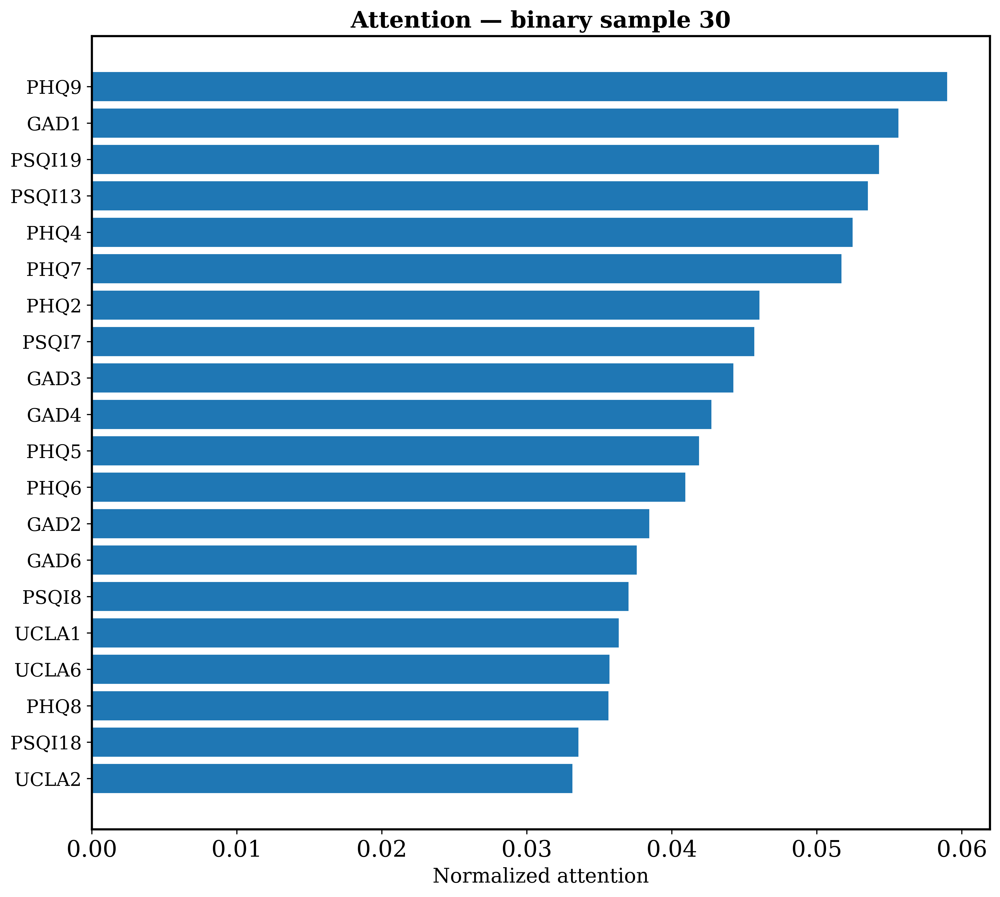

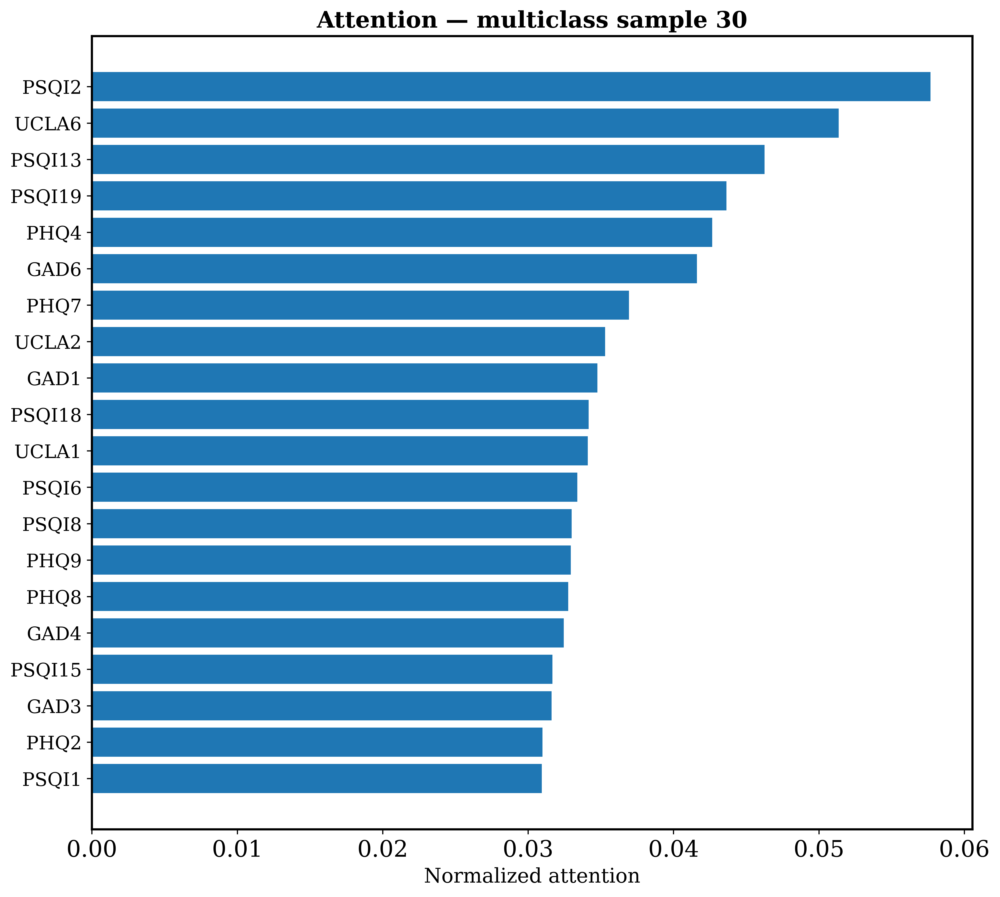

In [29]:
# =========================================================
# Tabular Transformer with Feature Tokens + Attention XAI
# =========================================================
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, f1_score, classification_report
import matplotlib.pyplot as plt
import textwrap

# -------------------------
# Reproducibility helpers
# -------------------------
def set_seed(seed: int = 42):
    import random, os
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def to_tensor(X, y=None, num_classes=2):
    X_t = torch.tensor(X.values if hasattr(X, "values") else X, dtype=torch.float32)
    if y is None:
        return X_t, None
    if num_classes == 2:
        y_t = torch.tensor((y.values if hasattr(y, "values") else y), dtype=torch.float32).unsqueeze(1)
    else:
        y_t = torch.tensor((y.values if hasattr(y, "values") else y), dtype=torch.long)
    return X_t, y_t

def preds_from_logits(logits, num_classes):
    if num_classes == 2:
        return (torch.sigmoid(logits) > 0.5).long().squeeze()
    else:
        return torch.argmax(logits, dim=1)

# -------------------------
# Model (feature tokens + attention capture)
# -------------------------
class FeatureTokenizer(nn.Module):
    """Each scalar feature i is mapped to a d_model vector via learnable (w_i, b_i)."""
    def __init__(self, num_features, d_model):
        super().__init__()
        self.weight = nn.Parameter(torch.randn(num_features, d_model) * 0.02)
        self.bias   = nn.Parameter(torch.zeros(num_features, d_model))
    def forward(self, x):  # x: [B, F]
        return x.unsqueeze(-1) * self.weight.unsqueeze(0) + self.bias.unsqueeze(0)  # [B, F, d_model]

class AttnEncoderLayer(nn.Module):
    def __init__(self, d_model=64, nhead=4, dim_feedforward=256, dropout=0.1):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.activation = F.gelu
    def forward(self, src):  # src: [B, T, d_model]
        attn_out, attn_w = self.self_attn(src, src, src, need_weights=True, average_attn_weights=False)
        src = self.norm1(src + self.dropout1(attn_out))
        ff  = self.linear2(self.dropout(self.activation(self.linear1(src))))
        src = self.norm2(src + self.dropout2(ff))
        return src, attn_w  # attn_w: [B, H, T, T] (PyTorch >=2.0)

class AttnTransformerEncoder(nn.Module):
    def __init__(self, num_layers=2, d_model=64, nhead=4, dim_feedforward=256, dropout=0.1):
        super().__init__()
        self.layers = nn.ModuleList([
            AttnEncoderLayer(d_model, nhead, dim_feedforward, dropout) for _ in range(num_layers)
        ])
    def forward(self, x):  # x: [B, T, d_model]
        attn_maps = []
        out = x
        for layer in self.layers:
            out, attn_w = layer(out)
            attn_maps.append(attn_w)  # list of [B,H,T,T]
        return out, attn_maps

class TabularTransformerTokensClassifier(nn.Module):
    """
    Uses one token per feature + leading [CLS] token.
    Returns attention maps when return_attn=True so we can build per-feature attributions.
    """
    def __init__(self, input_dim, num_classes, d_model=64, nhead=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.num_classes = num_classes
        self.num_features = input_dim
        self.d_model = d_model

        self.tokenizer = FeatureTokenizer(input_dim, d_model)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, d_model))
        self.encoder   = AttnTransformerEncoder(num_layers, d_model, nhead, dim_feedforward=d_model*4, dropout=dropout)

        out_dim = 1 if num_classes == 2 else num_classes
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, out_dim),
        )

    def forward(self, x, return_attn: bool = False):  # x: [B, F]
        B = x.size(0)
        feat_tokens = self.tokenizer(x)               # [B, F, d_model]
        cls = self.cls_token.expand(B, 1, self.d_model)
        tokens = torch.cat([cls, feat_tokens], dim=1) # [B, 1+F, d_model]
        enc_out, attn_maps = self.encoder(tokens)     # enc_out: [B, 1+F, d_model]
        cls_repr = enc_out[:, 0, :]                   # [B, d_model]
        logits = self.classifier(cls_repr)
        if return_attn:
            return logits, attn_maps
        return logits

# -------------------------
# Train + Evaluate (unchanged logic; new model by default)
# -------------------------
def train_and_evaluate_transformer(
    X_train_df, y_train_ser, X_test_df, y_test_ser,
    num_classes=2, input_dim=None,
    d_model=64, nhead=4, num_layers=2, dropout=0.1, lr=5e-4,
    max_epochs=100, patience=10, k_folds=5, seed=42, final_val_size=0.15, verbose=True,
    model_cls=TabularTransformerTokensClassifier  # <-- use the token model by default
):
    set_seed(seed)
    if input_dim is None:
        input_dim = X_train_df.shape[1]

    criterion = nn.BCEWithLogitsLoss() if num_classes == 2 else nn.CrossEntropyLoss()

    # ---------- Cross-validation ----------
    if verbose: print(f"\n📂 Cross-validation ({k_folds}-folds) started...")
    kf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=seed)
    X_np, y_np = X_train_df.values, y_train_ser.values

    all_curves = []  # list of dicts: {train_acc, val_acc, train_loss, val_loss}

    for fold, (idx_tr, idx_val) in enumerate(kf.split(X_np, y_np), 1):
        X_tr_t, y_tr_t   = to_tensor(X_np[idx_tr],  y_np[idx_tr],  num_classes)
        X_val_t, y_val_t = to_tensor(X_np[idx_val], y_np[idx_val], num_classes)

        model = model_cls(
            input_dim=input_dim, num_classes=num_classes,
            d_model=d_model, nhead=nhead, num_layers=num_layers, dropout=dropout
        )
        optim = torch.optim.AdamW(model.parameters(), lr=lr)

        tr_acc_curve, val_acc_curve = [], []
        tr_loss_curve, val_loss_curve = [], []

        best_acc, best_state, no_improve = -np.inf, None, 0

        for epoch in range(max_epochs):
            model.train()
            optim.zero_grad()
            logits_tr = model(X_tr_t)
            loss_tr = criterion(logits_tr, y_tr_t)
            loss_tr.backward()
            optim.step()

            model.eval()
            with torch.no_grad():
                logits_tr = model(X_tr_t)
                preds_tr = preds_from_logits(logits_tr, num_classes)
                y_tr_np_local = y_tr_t.squeeze().cpu().numpy() if num_classes == 2 else y_tr_t.cpu().numpy()
                train_acc = accuracy_score(y_tr_np_local, preds_tr.cpu().numpy())
                train_loss = criterion(logits_tr, y_tr_t).item()

                logits_val = model(X_val_t)
                preds_val = preds_from_logits(logits_val, num_classes)
                y_val_np_local = y_val_t.squeeze().cpu().numpy() if num_classes == 2 else y_val_t.cpu().numpy()
                val_acc = accuracy_score(y_val_np_local, preds_val.cpu().numpy())
                val_loss = criterion(logits_val, y_val_t).item()

            tr_acc_curve.append(train_acc);  val_acc_curve.append(val_acc)
            tr_loss_curve.append(train_loss); val_loss_curve.append(val_loss)

            if val_acc > best_acc:
                best_acc = val_acc
                best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
                no_improve = 0
            else:
                no_improve += 1
                if no_improve >= patience:
                    break

        if best_state is not None:
            model.load_state_dict(best_state)
        if verbose: print(f"✅ Fold {fold} Best Val Acc: {best_acc:.4f}")

        all_curves.append({
            "train_acc":  tr_acc_curve,
            "val_acc":    val_acc_curve,
            "train_loss": tr_loss_curve,
            "val_loss":   val_loss_curve
        })

    # ---------- Final fit on training (with small internal val) ----------
    sss = StratifiedShuffleSplit(n_splits=1, test_size=final_val_size, random_state=seed)
    idx_tr_final, idx_val_final = next(sss.split(X_np, y_np))
    X_tr_final_t, y_tr_final_t   = to_tensor(X_np[idx_tr_final],  y_np[idx_tr_final],  num_classes)
    X_val_final_t, y_val_final_t = to_tensor(X_np[idx_val_final], y_np[idx_val_final], num_classes)

    final_model = model_cls(
        input_dim=input_dim, num_classes=num_classes,
        d_model=d_model, nhead=nhead, num_layers=num_layers, dropout=dropout
    )
    optim = torch.optim.AdamW(final_model.parameters(), lr=lr)

    best_acc, best_state, no_improve = -np.inf, None, 0
    for epoch in range(max_epochs):
        final_model.train()
        optim.zero_grad()
        logits = final_model(X_tr_final_t)
        loss = criterion(logits, y_tr_final_t)
        loss.backward()
        optim.step()

        final_model.eval()
        with torch.no_grad():
            logits_val = final_model(X_val_final_t)
            preds_val = preds_from_logits(logits_val, num_classes)
            y_val_np_local = y_val_final_t.squeeze().cpu().numpy() if num_classes == 2 else y_val_final_t.cpu().numpy()
            val_acc = accuracy_score(y_val_np_local, preds_val.cpu().numpy())

        if val_acc > best_acc:
            best_acc = val_acc
            best_state = {k: v.cpu().clone() for k, v in final_model.state_dict().items()}
            no_improve = 0
        else:
            no_improve += 1
            if no_improve >= patience:
                break

    if best_state is not None:
        final_model.load_state_dict(best_state)

    # ---------- One-shot Test evaluation ----------
    X_test_t, y_test_t = to_tensor(X_test_df, y_test_ser, num_classes)
    final_model.eval()
    with torch.no_grad():
        test_logits = final_model(X_test_t)
        preds_test = preds_from_logits(test_logits, num_classes)
        y_true = y_test_t.squeeze().cpu().numpy() if num_classes == 2 else y_test_t.cpu().numpy()
        y_pred = preds_test.cpu().numpy()
        acc = accuracy_score(y_true, y_pred)
        f1  = f1_score(y_true, y_pred, average='macro')

    print(f"\n📌 Final Hold-Out Test Set (Classes = {num_classes}):")
    print(f"✅ Accuracy: {acc:.4f}")
    print(f"✅ Macro F1 Score: {f1:.4f}")
    print("\n📋 Classification Report:\n", classification_report(y_true, y_pred))

    return final_model, all_curves, (acc, f1)

# -------------------------
# Optional: CV plot (same as before)
# -------------------------
def _pad_to_same_length(curves):
    max_len = max(len(c) for c in curves)
    padded = [np.pad(np.asarray(c, dtype=float), (0, max_len - len(c)), constant_values=np.nan)
              for c in curves]
    return np.vstack(padded), max_len

def plot_train_val_accloss_across_folds(
    all_curves,
    title_left="Training and Validation Accuracy Across Folds",
    title_right="Training and Validation Loss Across Folds",
    save_path="cv_train_val_dual.png",
    dpi=300
):
    tr_acc_list  = [d["train_acc"]  for d in all_curves]
    val_acc_list = [d["val_acc"]    for d in all_curves]
    tr_loss_list = [d["train_loss"] for d in all_curves]
    val_loss_list= [d["val_loss"]   for d in all_curves]

    tr_acc_arr,  L = _pad_to_same_length(tr_acc_list)
    val_acc_arr, _ = _pad_to_same_length(val_acc_list)
    tr_loss_arr, _ = _pad_to_same_length(tr_loss_list)
    val_loss_arr, _= _pad_to_same_length(val_loss_list)

    epochs = np.arange(1, L+1)
    avg_tr_acc  = np.nanmean(tr_acc_arr,  axis=0)
    avg_val_acc = np.nanmean(val_acc_arr, axis=0)
    avg_tr_loss = np.nanmean(tr_loss_arr, axis=0)
    avg_val_loss= np.nanmean(val_loss_arr,axis=0)

    fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=dpi)

    ax = axes[0]
    for i, (tr, vl) in enumerate(zip(tr_acc_list, val_acc_list), 1):
        ax.plot(np.arange(1, len(tr)+1), tr, lw=1.5, label=f"Train (Fold {i})")
        ax.plot(np.arange(1, len(vl)+1), vl, lw=1.5, ls="--", label=f"Val (Fold {i})")
    ax.plot(epochs, avg_tr_acc,  color="k", lw=4, label="Average Train")
    ax.plot(epochs, avg_val_acc, color="k", lw=4, ls="--", label="Average Val")
    ax.set_title(title_left, fontsize=18, weight="bold")
    ax.set_xlabel("Epoch", fontsize=14); ax.set_ylabel("Accuracy", fontsize=14)
    ax.set_ylim(0.0, 1.01); ax.grid(True, alpha=0.3)
    handles, labels = ax.get_legend_handles_labels()
    keep, seen = [], set()
    for h, l in zip(handles, labels):
        if ("Average" in l) or l.endswith("(Fold 1)") or l.endswith("(Fold 2)"):
            if l not in seen:
                keep.append((h, l)); seen.add(l)
    ax.legend([h for h,_ in keep], [l for _,l in keep], fontsize=10, frameon=True)

    ax = axes[1]
    for i, (tr, vl) in enumerate(zip(tr_loss_list, val_loss_list), 1):
        ax.plot(np.arange(1, len(tr)+1), tr, lw=1.5, label=f"Train (Fold {i})")
        ax.plot(np.arange(1, len(vl)+1), vl, lw=1.5, ls="--", label=f"Val (Fold {i})")
    ax.plot(epochs, avg_tr_loss,  color="k", lw=4, label="Average Train")
    ax.plot(epochs, avg_val_loss, color="k", lw=4, ls="--", label="Average Val")
    ax.set_title(title_right, fontsize=18, weight="bold")
    ax.set_xlabel("Epoch", fontsize=14); ax.set_ylabel("Loss", fontsize=14)
    ax.grid(True, alpha=0.3)
    handles, labels = ax.get_legend_handles_labels()
    keep, seen = [], set()
    for h, l in zip(handles, labels):
        if ("Average" in l) or l.endswith("(Fold 1)") or l.endswith("(Fold 2)"):
            if l not in seen:
                keep.append((h, l)); seen.add(l)
    ax.legend([h for h,_ in keep], [l for _,l in keep], fontsize=10, frameon=True)

    plt.tight_layout()
    plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
    print(f"✅ Figure saved to {save_path}")

# -------------------------
# Attention XAI: extract & plot per-feature importance for ONE sample
# -------------------------
@torch.no_grad()
def get_feature_attention_importance(
    model: TabularTransformerTokensClassifier,
    x_row_df,                       # 1×F DataFrame or Series/array
    feature_names,
    method: str = "rollout",        # "rollout" (recommended) or "last_cls"
    head_agg: str = "mean",         # "mean" or "max"
    add_identity: bool = True
):
    """
    Returns {feature_name: normalized attention score} for a single sample.
    Uses CLS->feature attention (last layer) or Attention Rollout across layers.
    """
    model.eval()
    device = next(model.parameters()).device
    if hasattr(x_row_df, "values"):
        x_t = torch.tensor(x_row_df.values, dtype=torch.float32, device=device)
        if x_t.ndim == 1:
            x_t = x_t.unsqueeze(0)
    else:
        x_t = torch.tensor(np.asarray(x_row_df, dtype=np.float32), device=device).reshape(1, -1)

    logits, attn_list = model(x_t, return_attn=True)      # list of [B,H,T,T]
    # standardize to numpy [H,T,T] for each layer (single-sample)
    proc = []
    for a in attn_list:
        arr = a
        if arr.dim() != 4:
            raise RuntimeError(f"Unexpected attn shape: {arr.shape}")
        # Expect [B,H,T,T]; take B=0
        if arr.shape[0] == 1:
            arr = arr[0]          # [H,T,T]
        else:
            arr = arr[:1].squeeze(0)
        proc.append(arr.detach().cpu().numpy())
    attn_list = proc

    T = attn_list[-1].shape[-1]   # 1 + F
    cls_idx = 0
    feat_slice = slice(1, T)

    def agg_heads(A):             # A: [H,T,T]
        return A.max(axis=0) if head_agg == "max" else A.mean(axis=0)

    if method == "last_cls":
        A = agg_heads(attn_list[-1])                 # [T,T]
        scores = A[cls_idx, feat_slice]              # [F]
    elif method == "rollout":
        roll = np.eye(T, dtype=np.float32)
        for A_h in attn_list:
            A = agg_heads(A_h)                       # [T,T]
            if add_identity:
                A = A + np.eye(T, dtype=A.dtype)
            A = A / (A.sum(axis=-1, keepdims=True) + 1e-8)  # row-normalize
            roll = roll @ A
        scores = roll[cls_idx, feat_slice]           # [F]
    else:
        raise ValueError("method must be 'last_cls' or 'rollout'")

    scores = np.clip(scores, 0, None)
    if scores.sum() > 0:
        scores = scores / scores.sum()
    return {fn: float(s) for fn, s in zip(feature_names, scores)}

def plot_feature_attention_importance(attn_dict, top_k=20, wrap_at=22, title="Attention (per sample)", save_path=None, dpi=600):
    items = sorted(attn_dict.items(), key=lambda kv: kv[1], reverse=True)[:top_k]
    names = ['\n'.join(textwrap.wrap(k, width=wrap_at, break_long_words=False)) for k,_ in items][::-1]
    vals  = [v for _,v in items][::-1]

    plt.figure(figsize=(10, max(6, 0.45*len(names))), dpi=dpi)
    plt.barh(range(len(names)), vals, color="tab:blue")
    plt.yticks(range(len(names)), names, fontsize=13)
    plt.xlabel("Normalized attention", fontsize=14)
    plt.title(title, fontsize=16, weight="bold")
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
        print(f"✅ Saved to {save_path}")
    else:
        plt.show()

# -------------------------
# Example calls (swap in your actual variables)
# -------------------------
# Binary
final_model_bin, curves_bin, (acc_bin, f1_bin) = train_and_evaluate_transformer(
     X_train_df=X_train_bin_selected,
     y_train_ser=y_res_bin,
     X_test_df=X_test_bin_selected,
     y_test_ser=y_test_bin,
     num_classes=2,
     k_folds=5, max_epochs=100, patience=10, seed=42
 )
 # Explain a binary sample
idx = 30
x_row = X_test_bin_selected.iloc[[idx]]
feat_names = X_test_bin_selected.columns.tolist()
attn_scores = get_feature_attention_importance(final_model_bin, x_row, feat_names, method="rollout", head_agg="mean")
plot_feature_attention_importance(attn_scores, top_k=20, wrap_at=22, title=f"Attention — binary sample {idx}", save_path=f"attn_binary_{idx}.png")

# Multiclass
final_model_multi, curves_multi, (acc_multi, f1_multi) = train_and_evaluate_transformer(
    X_train_df=X_train_multi_selected,
     y_train_ser=y_res_multi,
     X_test_df=X_test_multi_selected,
     y_test_ser=y_test_multi,
     num_classes=len(np.unique(y_res_multi)),
     k_folds=5, max_epochs=100, patience=10, seed=42
 )
idx = 30
x_row = X_test_multi_selected.iloc[[idx]]
feat_names = X_test_multi_selected.columns.tolist()
attn_scores = get_feature_attention_importance(final_model_multi, x_row, feat_names, method="rollout", head_agg="mean")
plot_feature_attention_importance(attn_scores, top_k=20, wrap_at=22, title=f"Attention — multiclass sample {idx}", save_path=f"attn_multi_{idx}.png")

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# ===== helper: array version of per-sample attention (rollout or last layer) =====
@torch.no_grad()
def get_feature_attention_scores_array(
    model,
    x_row_df,                   # 1×F DataFrame or Series/array
    method="rollout",           # "rollout" (recommended) or "last_cls"
    head_agg="mean",            # "mean" or "max"
    add_identity=True
):
    model.eval()
    device = next(model.parameters()).device
    if hasattr(x_row_df, "values"):
        x_t = torch.tensor(x_row_df.values, dtype=torch.float32, device=device)
        if x_t.ndim == 1:
            x_t = x_t.unsqueeze(0)
    else:
        x_t = torch.tensor(np.asarray(x_row_df, dtype=np.float32), device=device).reshape(1, -1)

    logits, attn_list = model(x_t, return_attn=True)      # list of [B,H,T,T]
    # [H,T,T] per layer (single sample)
    mats = []
    for a in attn_list:
        a = a[0] if a.shape[0] == 1 else a[:1].squeeze(0)
        mats.append(a.detach().cpu().numpy())             # [H,T,T]
    T = mats[-1].shape[-1]                                 # 1 + F
    cls, feats = 0, slice(1, T)

    def agg_heads(A):
        return A.max(axis=0) if head_agg == "max" else A.mean(axis=0)

    if method == "last_cls":
        A = agg_heads(mats[-1])                            # [T,T]
        s = A[cls, feats]                                  # [F]
    else:  # rollout
        R = np.eye(T, dtype=np.float32)
        for A_h in mats:
            A = agg_heads(A_h)
            if add_identity:
                A = A + np.eye(T, dtype=A.dtype)
            A = A / (A.sum(axis=-1, keepdims=True) + 1e-8) # row-normalize
            R = R @ A
        s = R[cls, feats]                                  # [F]

    s = np.clip(s, 0, None)
    if s.sum() > 0:
        s = s / s.sum()
    return s  # numpy array (F,)

# ===== plot: stacked bars for multiple samples (like your screenshot) =====
def plot_attention_weights_for_samples(
    model,
    X_df,
    sample_indices,
    feature_names=None,
    method="rollout",
    head_agg="mean",
    top_k=None,                    # None = plot all features; else plot top-k by attention
    figsize=(12, 12),
    dpi=400,
    save_path=None
):
    mpl.rcParams["pdf.fonttype"] = 42
    mpl.rcParams["ps.fonttype"]  = 42

    F = X_df.shape[1]
    if feature_names is None:
        feature_names = X_df.columns.tolist()

    # Prepare data
    scores_list = []
    for idx in sample_indices:
        x_row = X_df.iloc[[idx]]
        s = get_feature_attention_scores_array(model, x_row, method=method, head_agg=head_agg)
        scores_list.append(s)

    nrows = len(sample_indices)
    fig, axes = plt.subplots(nrows, 1, figsize=figsize, dpi=dpi, sharex=True)
    if nrows == 1:
        axes = [axes]

    # Choose x labels (feature indices by default to avoid clutter)
    x = np.arange(F)
    xlab = np.arange(F)  # indices
    bar_colors = plt.cm.Blues(np.linspace(0.35, 0.85, F))

    for ax, idx, s in zip(axes, sample_indices, scores_list):
        if top_k is not None and 0 < top_k < F:
            # show only top-k features, keep order by index for neat spacing
            top_idx = np.argsort(-s)[:top_k]
            top_mask = np.zeros_like(s, dtype=bool)
            top_mask[top_idx] = True
            s_plot = np.where(top_mask, s, 0.0)
        else:
            s_plot = s

        ax.bar(x, s_plot, color=bar_colors, edgecolor="none")
        ax.set_title(f"Attention Weights for Sample {idx}", fontsize=18, weight="bold", pad=6)
        ax.set_ylabel("Weight", fontsize=14)
        ax.grid(axis="y", alpha=0.25)
        # optional: mark top-k with a darker edge
        if top_k is not None and 0 < top_k < F:
            ax.bar(top_idx, s[top_idx], color="tab:blue", edgecolor="k", linewidth=0.5)

        # thicker spines
        for sp in ax.spines.values():
            sp.set_linewidth(1.2)

    axes[-1].set_xlabel("Feature Index", fontsize=14)
    axes[-1].set_xticks(x)
    # Thin out ticks if many features
    if F > 40:
        step = max(1, F // 20)
        axes[-1].set_xticks(x[::step])

    plt.tight_layout(h_pad=1.0)
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
        print(f"✅ Saved attention grid to {save_path}")
    else:
        plt.show()

# After you train with the tokens model (final_model_multi or final_model_bin)
# e.g., for multiclass:
sample_indices = [0, 1, 2]  # any you like
plot_attention_weights_for_samples(
    model=final_model_multi,
    X_df=X_test_multi_selected,
    sample_indices=sample_indices,
    method="rollout",      # or "last_cls"
    head_agg="mean",
    top_k=None,            # or e.g. 15 to highlight only the most important features
    figsize=(14, 12),
    dpi=400,
    save_path="attention_weights_samples_multi.png"
)

# For binary, just swap model/X_df to the binary ones.

TypeError: TabularTransformerClassifier.forward() got an unexpected keyword argument 'return_attn'

In [15]:
# ===== Scientific plotting defaults (run once) =====
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

# Embed fonts correctly for publisher pipelines
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"]  = 42

# Typographic scale
BASE = 16  # bump this to 18–20 if your journal wants even larger text
mpl.rcParams.update({
    "figure.dpi": 150,               # canvas dpi (export will override)
    "savefig.dpi": 900,              # PNG export dpi
    "font.size": BASE,               # base font size
    "axes.titlesize": BASE + 4,
    "axes.labelsize": BASE + 2,
    "xtick.labelsize": BASE,
    "ytick.labelsize": BASE,
    "legend.fontsize": BASE - 2,
    "figure.titlesize": BASE + 6,
    "font.family": "serif",          # will pick system serif; swap to "Times New Roman" if installed
    "mathtext.fontset": "stix",      # LaTeX-like math glyphs
    "axes.linewidth": 1.5,
    "grid.color": "0.85",
    "grid.linestyle": "-",
    "grid.linewidth": 0.8,
})

# ===== Utility to pad curves =====
def _pad_to_same_length(curves):
    max_len = max(len(c) for c in curves)
    padded = [np.pad(np.asarray(c, dtype=float),
                     (0, max_len - len(c)),
                     constant_values=np.nan) for c in curves]
    return np.vstack(padded), max_len

# ===== High-res, scientific figure: per-fold Train/Val + bold Averages =====
def plot_train_val_accloss_across_folds_scientific(
    all_curves,
    title_left="Training and Validation Accuracy Across Folds",
    title_right="Training and Validation Loss Across Folds",
    basename="cv_train_val_dual",   # saves basename.{pdf,svg,png}
    fig_width=18, fig_height=6,     # inches
    png_dpi=900
):
    # Collect series
    tr_acc_list  = [d["train_acc"]  for d in all_curves]
    val_acc_list = [d["val_acc"]    for d in all_curves]
    tr_loss_list = [d["train_loss"] for d in all_curves]
    val_loss_list= [d["val_loss"]   for d in all_curves]

    tr_acc_arr,  L = _pad_to_same_length(tr_acc_list)
    val_acc_arr, _ = _pad_to_same_length(val_acc_list)
    tr_loss_arr, _ = _pad_to_same_length(tr_loss_list)
    val_loss_arr, _= _pad_to_same_length(val_loss_list)

    epochs = np.arange(1, L+1)
    avg_tr_acc  = np.nanmean(tr_acc_arr,  axis=0)
    avg_val_acc = np.nanmean(val_acc_arr, axis=0)
    avg_tr_loss = np.nanmean(tr_loss_arr, axis=0)
    avg_val_loss= np.nanmean(val_loss_arr, axis=0)

    # Greyscale-friendly style:
    # - thin light-gray lines for individual folds
    # - thick black solid (train) and dashed (val) for averages
    per_fold_color = "0.55"
    avg_color = "0.0"
    per_fold_lw = 1.4
    avg_lw = 4.0

    fig, axes = plt.subplots(1, 2, figsize=(fig_width, fig_height))

    # ---- Accuracy panel ----
    ax = axes[0]
    for i, (tr, vl) in enumerate(zip(tr_acc_list, val_acc_list), 1):
        ax.plot(np.arange(1, len(tr)+1), tr, lw=per_fold_lw, color=per_fold_color)
        ax.plot(np.arange(1, len(vl)+1), vl, lw=per_fold_lw, ls="--", color=per_fold_color)
    ax.plot(epochs, avg_tr_acc,  color=avg_color, lw=avg_lw, label="Average Train")
    ax.plot(epochs, avg_val_acc, color=avg_color, lw=avg_lw, ls="--", label="Average Val")
    ax.set_title(title_left, weight="bold")
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Accuracy")
    ax.set_ylim(0.0, 1.01)
    ax.grid(True, alpha=0.6)
    # Minimal legend: only averages
    leg = ax.legend(frameon=True, fancybox=False, edgecolor="0.2")
    leg.get_frame().set_alpha(0.9)

    # ---- Loss panel ----
    ax = axes[1]
    for i, (tr, vl) in enumerate(zip(tr_loss_list, val_loss_list), 1):
        ax.plot(np.arange(1, len(tr)+1), tr, lw=per_fold_lw, color=per_fold_color)
        ax.plot(np.arange(1, len(vl)+1), vl, lw=per_fold_lw, ls="--", color=per_fold_color)
    ax.plot(epochs, avg_tr_loss,  color=avg_color, lw=avg_lw, label="Average Train")
    ax.plot(epochs, avg_val_loss, color=avg_color, lw=avg_lw, ls="--", label="Average Val")
    ax.set_title(title_right, weight="bold")
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.grid(True, alpha=0.6)
    leg = ax.legend(frameon=True, fancybox=False, edgecolor="0.2")
    leg.get_frame().set_alpha(0.9)

    # Thicker spines for print
    for ax in axes:
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)

    plt.tight_layout()

    # Save in multiple formats
    plt.savefig(f"{basename}.pdf",  bbox_inches="tight")
    plt.savefig(f"{basename}.svg",  bbox_inches="tight")
    plt.savefig(f"{basename}.png",  dpi=png_dpi, bbox_inches="tight")
    print(f"✅ Saved: {basename}.pdf (vector), {basename}.svg (vector), {basename}.png @{png_dpi} dpi")
    plt.close(fig)

# Example (binary):
# final_model_bin, curves_bin, (acc_bin, f1_bin) = train_and_evaluate_transformer_fresh(...)

plot_train_val_accloss_across_folds_scientific(
    all_curves=curves_bin,
    basename="cv_train_val_dual_binary",
    fig_width=18, fig_height=6,  # enlarge if needed, e.g., 20x7
    png_dpi=900                  # 600–1200 dpi is typical; 900 is a nice sweet spot
)

✅ Saved: cv_train_val_dual_binary.pdf (vector), cv_train_val_dual_binary.svg (vector), cv_train_val_dual_binary.png @900 dpi


In [16]:
# --- Drop-in replacement for your "second figure" function ---
import numpy as np
import matplotlib.pyplot as plt

def plot_train_val_accloss_across_folds(
    all_curves,
    title_left="Training and Validation Accuracy Across Folds",
    title_right="Training and Validation Loss Across Folds",
    save_path="cv_train_val_dual.png",
    png_dpi=900,
    also_save_pdf=True
):
    # unpack
    tr_acc_list  = [d["train_acc"]  for d in all_curves]
    val_acc_list = [d["val_acc"]    for d in all_curves]
    tr_loss_list = [d["train_loss"] for d in all_curves]
    val_loss_list= [d["val_loss"]   for d in all_curves]

    def _pad(curves):
        L = max(len(c) for c in curves)
        mat = [np.pad(np.asarray(c, float), (0, L - len(c)), constant_values=np.nan) for c in curves]
        return np.vstack(mat), L

    tr_acc_arr,  L = _pad(tr_acc_list)
    val_acc_arr, _ = _pad(val_acc_list)
    tr_loss_arr, _ = _pad(tr_loss_list)
    val_loss_arr, _= _pad(val_loss_list)

    epochs = np.arange(1, L+1)
    avg_tr_acc  = np.nanmean(tr_acc_arr,  axis=0)
    avg_val_acc = np.nanmean(val_acc_arr, axis=0)
    avg_tr_loss = np.nanmean(tr_loss_arr, axis=0)
    avg_val_loss= np.nanmean(val_loss_arr, axis=0)

    # grayscale-friendly styling
    per_fold_color = "0.55"
    avg_color = "0.0"
    per_fold_lw = 1.4
    avg_lw = 4.0

    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # --- Accuracy panel ---
    ax = axes[0]
    for tr, vl in zip(tr_acc_list, val_acc_list):
        ax.plot(np.arange(1, len(tr)+1), tr, lw=per_fold_lw, color=per_fold_color)
        ax.plot(np.arange(1, len(vl)+1), vl, lw=per_fold_lw, ls="--", color=per_fold_color)
    ax.plot(epochs, avg_tr_acc,  color=avg_color, lw=avg_lw, label="Average Train")
    ax.plot(epochs, avg_val_acc, color=avg_color, lw=avg_lw, ls="--", label="Average Val")
    ax.set_title(title_left, weight="bold")
    ax.set_xlabel("Epoch"); ax.set_ylabel("Accuracy")
    ax.set_ylim(0.0, 1.01); ax.grid(True, alpha=0.6)
    leg = ax.legend(frameon=True, edgecolor="0.2"); leg.get_frame().set_alpha(0.9)

    # --- Loss panel ---
    ax = axes[1]
    for tr, vl in zip(tr_loss_list, val_loss_list):
        ax.plot(np.arange(1, len(tr)+1), tr, lw=per_fold_lw, color=per_fold_color)
        ax.plot(np.arange(1, len(vl)+1), vl, lw=per_fold_lw, ls="--", color=per_fold_color)
    ax.plot(epochs, avg_tr_loss,  color=avg_color, lw=avg_lw, label="Average Train")
    ax.plot(epochs, avg_val_loss, color=avg_color, lw=avg_lw, ls="--", label="Average Val")
    ax.set_title(title_right, weight="bold")
    ax.set_xlabel("Epoch"); ax.set_ylabel("Loss")
    ax.grid(True, alpha=0.6)
    leg = ax.legend(frameon=True, edgecolor="0.2"); leg.get_frame().set_alpha(0.9)

    # thicker spines
    for ax in axes:
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)

    plt.tight_layout()
    plt.savefig(save_path, dpi=png_dpi, bbox_inches="tight")
    if also_save_pdf:
        pdf_path = save_path.rsplit(".", 1)[0] + ".pdf"
        plt.savefig(pdf_path, bbox_inches="tight")
        print(f"✅ Saved PDF: {pdf_path}")
    print(f"✅ Saved PNG: {save_path} @ {png_dpi} dpi")
    plt.close(fig)

plot_train_val_accloss_across_folds(
    all_curves=curves_bin,
    save_path="cv_train_val_dual_binary2.png",
    png_dpi=900,
    also_save_pdf=True
)

✅ Saved PDF: cv_train_val_dual_binary2.pdf
✅ Saved PNG: cv_train_val_dual_binary2.png @ 900 dpi


✅ Figure saved to binary_cv_accuracy.png
✅ Figure saved to binary_cv_loss.png


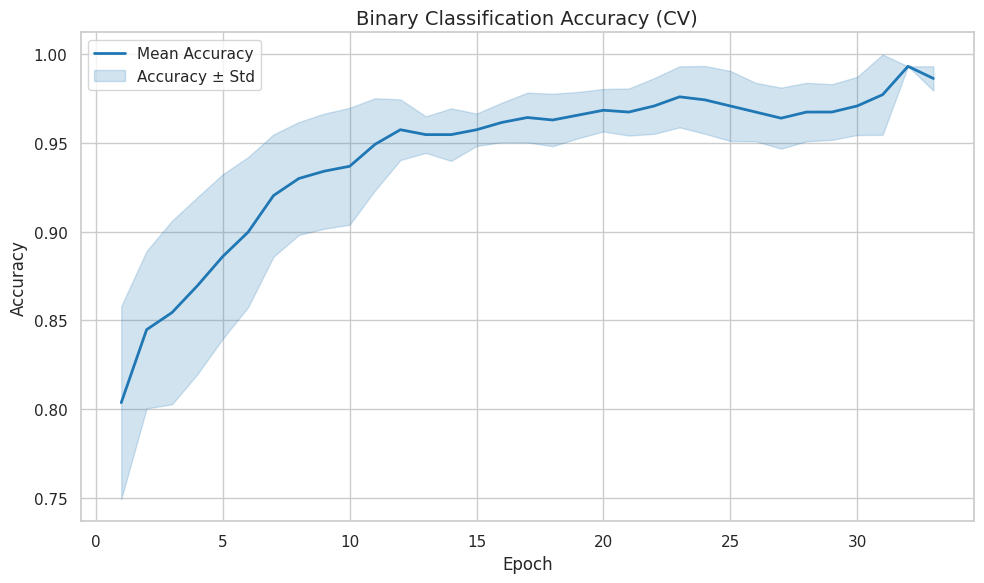

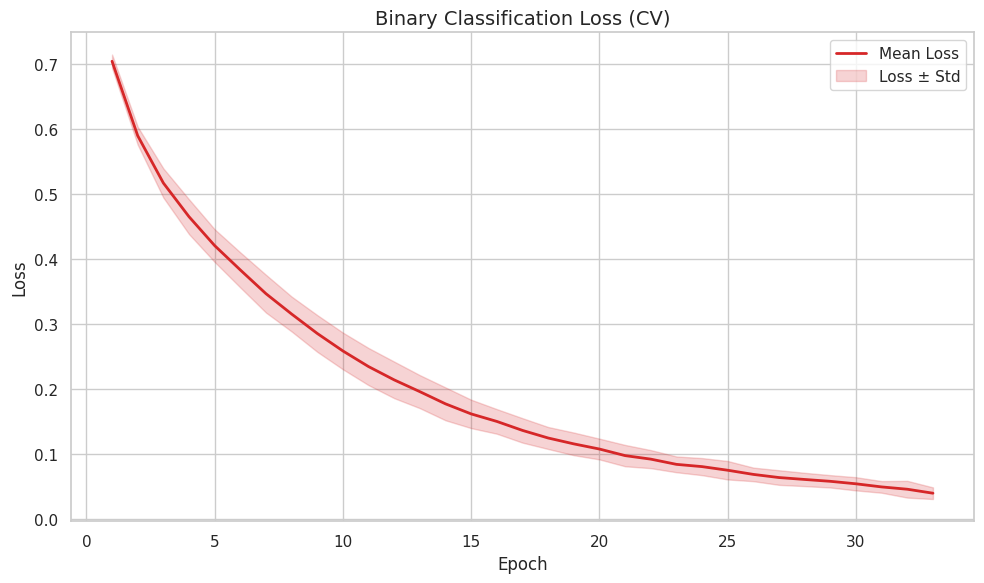

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

def plot_cv_curves(all_curves, metric='accuracy', title='Cross-Validation Curve', save_path=None, dpi=300):
    """
    Plots averaged accuracy or loss curves across folds.

    Parameters:
    - all_curves: list of (acc_curve, loss_curve) from each fold
    - metric: 'accuracy' or 'loss'
    - title: Title of the plot
    - save_path: Path to save the figure (e.g., 'cv_accuracy.png')
    - dpi: Resolution for saving the figure
    """
    sns.set(style="whitegrid")
    plt.figure(figsize=(10, 6))

    # Align epochs
    max_len = max(len(curve[0]) for curve in all_curves)
    aligned_curves = []
    for acc, loss in all_curves:
        if metric == 'accuracy':
            padded = np.pad(acc, (0, max_len - len(acc)), constant_values=np.nan)
        else:
            padded = np.pad(loss, (0, max_len - len(loss)), constant_values=np.nan)
        aligned_curves.append(padded)

    aligned_curves = np.array(aligned_curves)
    mean_curve = np.nanmean(aligned_curves, axis=0)
    std_curve = np.nanstd(aligned_curves, axis=0)

    epochs = np.arange(1, max_len + 1)

    label = "Accuracy" if metric == 'accuracy' else "Loss"
    color = "tab:blue" if metric == 'accuracy' else "tab:red"

    plt.plot(epochs, mean_curve, label=f"Mean {label}", color=color, lw=2)
    plt.fill_between(epochs, mean_curve - std_curve, mean_curve + std_curve, 
                     color=color, alpha=0.2, label=f"{label} ± Std")

    plt.xlabel("Epoch", fontsize=12)
    plt.ylabel(label, fontsize=12)
    plt.title(title, fontsize=14)
    plt.legend()
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=dpi)
        print(f"✅ Figure saved to {save_path}")
    else:
        plt.show()

plot_cv_curves(all_curves_bin, metric='accuracy', title='Binary Classification Accuracy (CV)', save_path='binary_cv_accuracy.png')
plot_cv_curves(all_curves_bin, metric='loss', title='Binary Classification Loss (CV)', save_path='binary_cv_loss.png')

✅ Figure saved to multi_cv_accuracy.png
✅ Figure saved to multi_cv_loss.png


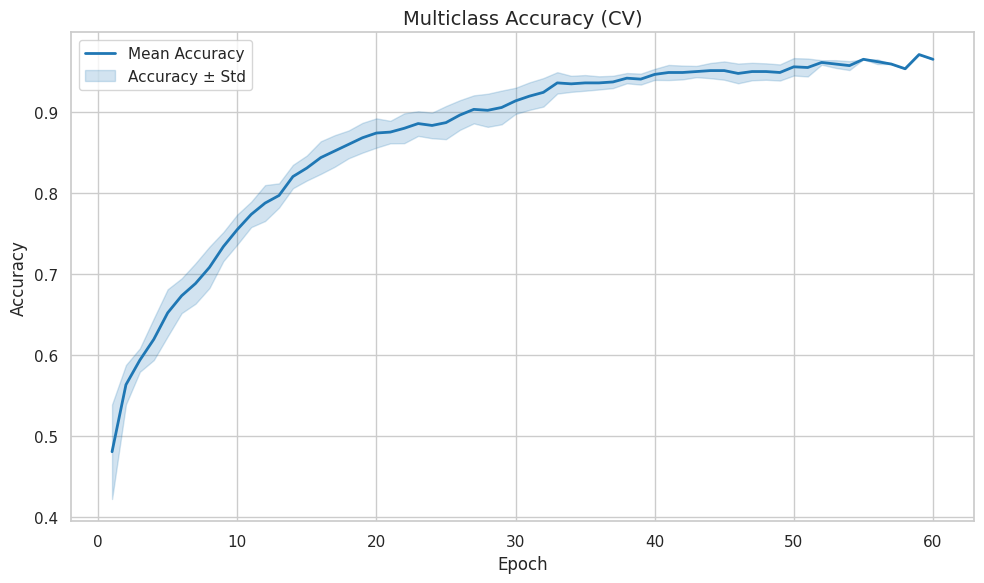

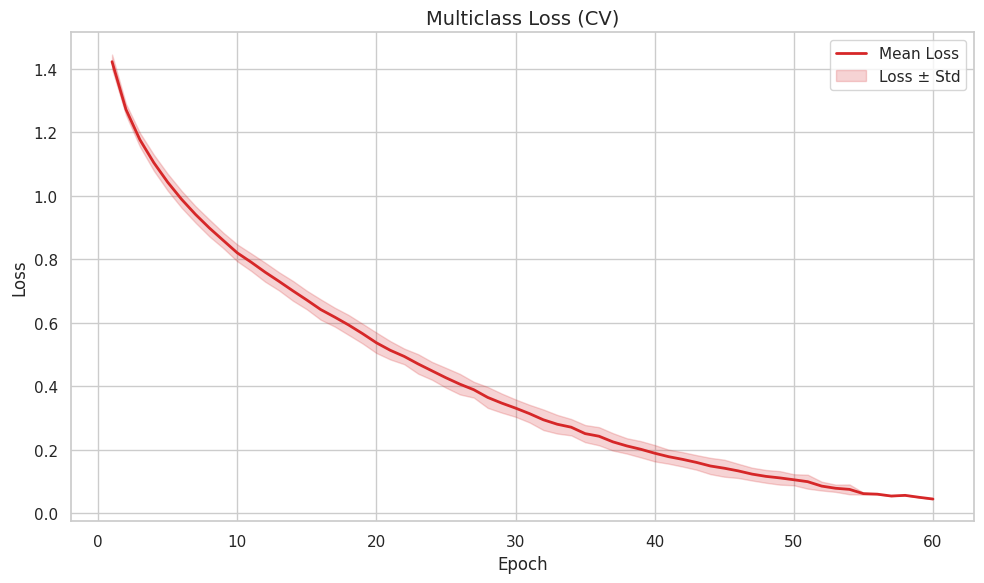

In [17]:
plot_cv_curves(all_curves_multi, metric='accuracy', title='Multiclass Accuracy (CV)', save_path='multi_cv_accuracy.png')
plot_cv_curves(all_curves_multi, metric='loss', title='Multiclass Loss (CV)', save_path='multi_cv_loss.png')

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib as mpl

# --- Massive font setup for journals ---
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"]  = 42
BIG = 28  # main font size (can go to 30–32 if needed)
mpl.rcParams.update({
    "font.size": BIG,
    "axes.titlesize": BIG + 6,
    "axes.labelsize": BIG + 4,
    "xtick.labelsize": BIG,
    "ytick.labelsize": BIG,
    "legend.fontsize": BIG - 2,
    "axes.linewidth": 2.0,
    "grid.color": "0.8",
    "grid.linewidth": 1.2,
})

def plot_cv_curves_side_by_side(
    all_curves,
    title_prefix='',
    save_path='cv_curves.png',
    dpi=500,
    also_save_pdf=True
):
    """
    Plots averaged Accuracy and Loss curves side-by-side in one figure, BIG font version.
    """
    sns.set(style="whitegrid")
    fig, axes = plt.subplots(1, 2, figsize=(30, 9))  # larger figure size for space

    metrics_info = [
        ('accuracy', "Accuracy", "tab:blue"),
        ('loss', "Loss", "tab:red")
    ]

    for ax, (metric, label, color) in zip(axes, metrics_info):
        max_len = max(len(curve[0]) for curve in all_curves)
        aligned_curves = []
        for acc, loss in all_curves:
            if metric == 'accuracy':
                padded = np.pad(acc, (0, max_len - len(acc)), constant_values=np.nan)
            else:
                padded = np.pad(loss, (0, max_len - len(loss)), constant_values=np.nan)
            aligned_curves.append(padded)

        aligned_curves = np.array(aligned_curves)
        mean_curve = np.nanmean(aligned_curves, axis=0)
        std_curve = np.nanstd(aligned_curves, axis=0)
        epochs = np.arange(1, max_len + 1)

        ax.plot(epochs, mean_curve, label=f"Mean {label}", color=color, lw=4)
        ax.fill_between(epochs, mean_curve - std_curve, mean_curve + std_curve,
                        color=color, alpha=0.2, label=f"{label} ± Std")

        ax.set_xlabel("Epoch", fontsize=BIG + 2, fontweight='bold')
        ax.set_ylabel(label, fontsize=BIG + 2, fontweight='bold')
        ax.set_title(f"{title_prefix} {label} (CV)", fontsize=BIG + 6, fontweight='bold')
        ax.tick_params(axis='both', which='major', labelsize=BIG)
        ax.grid(True, alpha=0.6)
        ax.legend(frameon=True, edgecolor="0.2", fontsize=BIG - 2)

        for spine in ax.spines.values():
            spine.set_linewidth(2.0)

    plt.tight_layout()
    plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
    if also_save_pdf:
        pdf_path = save_path.rsplit(".", 1)[0] + ".pdf"
        plt.savefig(pdf_path, bbox_inches="tight")
        print(f"✅ Saved PDF: {pdf_path}")
    print(f"✅ Saved PNG: {save_path} @ {dpi} dpi")
    plt.close(fig)

# ==== Example usage ====
plot_cv_curves_side_by_side(all_curves_bin, title_prefix='Binary Classification', save_path='binary_cv_curves4.png')
plot_cv_curves_side_by_side(all_curves_multi, title_prefix='Multiclass Classification', save_path='multi_cv_curves4.png')

✅ Saved PDF: binary_cv_curves4.pdf
✅ Saved PNG: binary_cv_curves4.png @ 500 dpi
✅ Saved PDF: multi_cv_curves4.pdf
✅ Saved PNG: multi_cv_curves4.png @ 500 dpi


In [17]:
def fgsm_attack(model, loss_fn, X, y, epsilon, num_classes=2):
    """
    Generates FGSM adversarial examples.
    """
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()

    outputs = model(X_adv)
    loss = loss_fn(outputs, y)
    model.zero_grad()
    loss.backward()

    X_adv = X_adv + epsilon * X_adv.grad.sign()
    return X_adv.detach()

# === Binary case ===
criterion_bin = nn.BCEWithLogitsLoss()
epsilon_values = [0.01, 0.03, 0.05]  # Perturbation strengths

for eps in epsilon_values:
    X_adv_bin = fgsm_attack(final_model_bin, criterion_bin, X_test_tensor_bin, y_test_tensor_bin, eps, num_classes=2)
    
    with torch.no_grad():
        preds_adv_bin = (torch.sigmoid(final_model_bin(X_adv_bin)) > 0.5).int()
        acc_adv = accuracy_score(y_test_tensor_bin.cpu(), preds_adv_bin.cpu())
        f1_adv = f1_score(y_test_tensor_bin.cpu(), preds_adv_bin.cpu())
    
    print(f"[Binary] Eps={eps:.2f} ➤ Acc={acc_adv:.4f}, F1={f1_adv:.4f}")

[Binary] Eps=0.01 ➤ Acc=0.8222, F1=0.7778
[Binary] Eps=0.03 ➤ Acc=0.7926, F1=0.7500
[Binary] Eps=0.05 ➤ Acc=0.7778, F1=0.7368


In [18]:
def fgsm_attack(model, loss_fn, X, y, epsilon, num_classes=2):
    """
    FGSM: Fast Gradient Sign Method
    """
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    outputs = model(X_adv)
    loss = loss_fn(outputs, y)
    model.zero_grad()
    loss.backward()
    X_adv = X_adv + epsilon * X_adv.grad.sign()
    return X_adv.detach()


def pgd_attack(model, loss_fn, X, y, epsilon=0.03, alpha=0.01, iters=40, num_classes=2):
    """
    PGD: Projected Gradient Descent Attack
    """
    X_adv = X.clone().detach()
    X_adv.requires_grad = True
    
    for _ in range(iters):
        outputs = model(X_adv)
        loss = loss_fn(outputs, y)
        model.zero_grad()
        loss.backward()
        
        with torch.no_grad():
            X_adv = X_adv + alpha * X_adv.grad.sign()
            eta = torch.clamp(X_adv - X, min=-epsilon, max=epsilon)
            X_adv = torch.clamp(X + eta, min=X.min(), max=X.max())
        
        X_adv.requires_grad = True

    return X_adv.detach()

In [19]:
def adversarial_training(model, optimizer, loss_fn, X_train, y_train, 
                         epsilon=0.03, alpha=0.01, iters=5, adv_ratio=0.5, 
                         attack_type="fgsm", num_classes=2, epochs=20):
    """
    Adversarial Training with Clean + Adversarial samples
    """
    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        
        adv_count = int(adv_ratio * len(X_train))
        X_adv_part = X_train[:adv_count]
        y_adv_part = y_train[:adv_count]
        
        if attack_type == "fgsm":
            X_adv = fgsm_attack(model, loss_fn, X_adv_part, y_adv_part, epsilon, num_classes)
        elif attack_type == "pgd":
            X_adv = pgd_attack(model, loss_fn, X_adv_part, y_adv_part, epsilon, alpha, iters, num_classes)
        else:
            raise ValueError("Invalid attack type")
        
        X_combined = torch.cat([X_train, X_adv])
        y_combined = torch.cat([y_train, y_adv_part])
        
        outputs = model(X_combined)
        loss = loss_fn(outputs, y_combined)
        loss.backward()
        optimizer.step()

        if (epoch+1) % 5 == 0:
            print(f"Epoch [{epoch+1}/{epochs}] - Loss: {loss.item():.4f}")

In [20]:
from sklearn.metrics import accuracy_score, f1_score

def evaluate_under_attack(model, X_clean, y_true, epsilon_list, attack_type="fgsm", num_classes=2):
    results = []
    
    if num_classes == 2:
        loss_fn = nn.BCEWithLogitsLoss()
    else:
        loss_fn = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        outputs_clean = model(X_clean)
        if num_classes == 2:
            preds_clean = (torch.sigmoid(outputs_clean) > 0.5).int()
        else:
            preds_clean = torch.argmax(outputs_clean, dim=1)
        
        acc_clean = accuracy_score(y_true.cpu(), preds_clean.cpu())
        f1_clean = f1_score(y_true.cpu(), preds_clean.cpu(), average='macro')
        results.append(("Clean", acc_clean, f1_clean))
    
    for eps in epsilon_list:
        if attack_type == "fgsm":
            X_adv = fgsm_attack(model, loss_fn, X_clean, y_true, eps, num_classes)
        else:
            X_adv = pgd_attack(model, loss_fn, X_clean, y_true, epsilon=eps, alpha=0.01, iters=10, num_classes=num_classes)
        
        with torch.no_grad():
            outputs_adv = model(X_adv)
            if num_classes == 2:
                preds_adv = (torch.sigmoid(outputs_adv) > 0.5).int()
            else:
                preds_adv = torch.argmax(outputs_adv, dim=1)
            
            acc_adv = accuracy_score(y_true.cpu(), preds_adv.cpu())
            f1_adv = f1_score(y_true.cpu(), preds_adv.cpu(), average='macro')
            results.append((f"{attack_type.upper()} eps={eps}", acc_adv, f1_adv))
    
    return results

In [21]:
epsilon_list = [0.01, 0.03, 0.05]

# === Binary evaluation
bin_results_fgsm = evaluate_under_attack(final_model_bin, X_test_tensor_bin, y_test_tensor_bin, epsilon_list, "fgsm", num_classes=2)
bin_results_pgd = evaluate_under_attack(final_model_bin, X_test_tensor_bin, y_test_tensor_bin, epsilon_list, "pgd", num_classes=2)

# === Multiclass evaluation
multi_results_fgsm = evaluate_under_attack(final_model_multi, X_test_tensor_multi, y_test_tensor_multi, epsilon_list, "fgsm", num_classes=len(np.unique(y_res_multi)))
multi_results_pgd = evaluate_under_attack(final_model_multi, X_test_tensor_multi, y_test_tensor_multi, epsilon_list, "pgd", num_classes=len(np.unique(y_res_multi)))

# Print results
print("\nBinary - FGSM:\n", bin_results_fgsm)
print("\nBinary - PGD:\n", bin_results_pgd)
print("\nMulticlass - FGSM:\n", multi_results_fgsm)
print("\nMulticlass - PGD:\n", multi_results_pgd)


Binary - FGSM:
 [('Clean', 0.8592592592592593, 0.8529327446820709), ('FGSM eps=0.01', 0.8222222222222222, 0.8148148148148149), ('FGSM eps=0.03', 0.7925925925925926, 0.7863924050632911), ('FGSM eps=0.05', 0.7777777777777778, 0.7722672064777327)]

Binary - PGD:
 [('Clean', 0.8592592592592593, 0.8529327446820709), ('PGD eps=0.01', 0.8222222222222222, 0.8148148148148149), ('PGD eps=0.03', 0.7925925925925926, 0.7863924050632911), ('PGD eps=0.05', 0.7777777777777778, 0.7722672064777327)]

Multiclass - FGSM:
 [('Clean', 0.8740740740740741, 0.844969313387035), ('FGSM eps=0.01', 0.8592592592592593, 0.8276927011104227), ('FGSM eps=0.03', 0.7777777777777778, 0.7300569800569802), ('FGSM eps=0.05', 0.7185185185185186, 0.6696683563724195)]

Multiclass - PGD:
 [('Clean', 0.8740740740740741, 0.844969313387035), ('PGD eps=0.01', 0.8592592592592593, 0.8276927011104227), ('PGD eps=0.03', 0.7777777777777778, 0.7300569800569802), ('PGD eps=0.05', 0.7185185185185186, 0.6696683563724195)]


In [22]:
def adversarial_training(model, optimizer, loss_fn, 
                         X_train, y_train, 
                         attack_type="fgsm", epsilon=0.03, alpha=0.01, iters=5, adv_ratio=0.5, 
                         num_classes=2, epochs=20):
    """
    Adversarial training with a mix of clean and adversarial samples.
    """
    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()

        # Select part of batch for adversarial attack
        adv_count = int(adv_ratio * len(X_train))
        X_adv_part = X_train[:adv_count]
        y_adv_part = y_train[:adv_count]

        # Generate adversarial examples
        if attack_type == "fgsm":
            X_adv = fgsm_attack(model, loss_fn, X_adv_part, y_adv_part, epsilon, num_classes)
        elif attack_type == "pgd":
            X_adv = pgd_attack(model, loss_fn, X_adv_part, y_adv_part, epsilon, alpha, iters, num_classes)
        else:
            raise ValueError("Invalid attack type. Choose 'fgsm' or 'pgd'.")

        # Combine clean + adversarial
        X_combined = torch.cat([X_train, X_adv])
        y_combined = torch.cat([y_train, y_adv_part])

        # Forward + backward pass
        outputs = model(X_combined)
        loss = loss_fn(outputs, y_combined)
        loss.backward()
        optimizer.step()

        if (epoch+1) % 5 == 0:
            print(f"[{attack_type.upper()} Adv Training] Epoch [{epoch+1}/{epochs}] - Loss: {loss.item():.4f}")

loss_fn_bin = nn.BCEWithLogitsLoss()
loss_fn_multi = nn.CrossEntropyLoss()

# === Binary FGSM adversarial training ===
model_bin_adv_fgsm = TabularTransformerClassifier(input_dim=X_train_bin_selected.shape[1], num_classes=2)
optimizer_bin_fgsm = torch.optim.AdamW(model_bin_adv_fgsm.parameters(), lr=5e-4)
adversarial_training(model_bin_adv_fgsm, optimizer_bin_fgsm, loss_fn_bin, 
                     X_train_full_bin, y_train_full_bin, 
                     attack_type="fgsm", epsilon=0.03, adv_ratio=0.5, num_classes=2, epochs=20)

# === Binary PGD adversarial training ===
model_bin_adv_pgd = TabularTransformerClassifier(input_dim=X_train_bin_selected.shape[1], num_classes=2)
optimizer_bin_pgd = torch.optim.AdamW(model_bin_adv_pgd.parameters(), lr=5e-4)
adversarial_training(model_bin_adv_pgd, optimizer_bin_pgd, loss_fn_bin, 
                     X_train_full_bin, y_train_full_bin, 
                     attack_type="pgd", epsilon=0.03, alpha=0.01, iters=5, adv_ratio=0.5, num_classes=2, epochs=20)

# === Multiclass FGSM adversarial training ===
model_multi_adv_fgsm = TabularTransformerClassifier(input_dim=X_train_multi_selected.shape[1], num_classes=len(np.unique(y_res_multi)))
optimizer_multi_fgsm = torch.optim.AdamW(model_multi_adv_fgsm.parameters(), lr=5e-4)
adversarial_training(model_multi_adv_fgsm, optimizer_multi_fgsm, loss_fn_multi, 
                     X_train_full_multi, y_train_full_multi, 
                     attack_type="fgsm", epsilon=0.03, adv_ratio=0.5, num_classes=len(np.unique(y_res_multi)), epochs=20)

# === Multiclass PGD adversarial training ===
model_multi_adv_pgd = TabularTransformerClassifier(input_dim=X_train_multi_selected.shape[1], num_classes=len(np.unique(y_res_multi)))
optimizer_multi_pgd = torch.optim.AdamW(model_multi_adv_pgd.parameters(), lr=5e-4)
adversarial_training(model_multi_adv_pgd, optimizer_multi_pgd, loss_fn_multi, 
                     X_train_full_multi, y_train_full_multi, 
                     attack_type="pgd", epsilon=0.03, alpha=0.01, iters=5, adv_ratio=0.5, num_classes=len(np.unique(y_res_multi)), epochs=20)

[FGSM Adv Training] Epoch [5/20] - Loss: 0.4286
[FGSM Adv Training] Epoch [10/20] - Loss: 0.2531
[FGSM Adv Training] Epoch [15/20] - Loss: 0.1533
[FGSM Adv Training] Epoch [20/20] - Loss: 0.0969
[PGD Adv Training] Epoch [5/20] - Loss: 0.3611
[PGD Adv Training] Epoch [10/20] - Loss: 0.2106
[PGD Adv Training] Epoch [15/20] - Loss: 0.1367
[PGD Adv Training] Epoch [20/20] - Loss: 0.0966
[FGSM Adv Training] Epoch [5/20] - Loss: 1.0225
[FGSM Adv Training] Epoch [10/20] - Loss: 0.8256
[FGSM Adv Training] Epoch [15/20] - Loss: 0.6920
[FGSM Adv Training] Epoch [20/20] - Loss: 0.5569
[PGD Adv Training] Epoch [5/20] - Loss: 1.0830
[PGD Adv Training] Epoch [10/20] - Loss: 0.8590
[PGD Adv Training] Epoch [15/20] - Loss: 0.7195
[PGD Adv Training] Epoch [20/20] - Loss: 0.6084


In [23]:
epsilon_list = [0.01, 0.03, 0.05]

# Binary after FGSM training
bin_results_fgsm_trained = evaluate_under_attack(model_bin_adv_fgsm, X_test_tensor_bin, y_test_tensor_bin, epsilon_list, "fgsm", num_classes=2)
bin_results_pgd_trained = evaluate_under_attack(model_bin_adv_pgd, X_test_tensor_bin, y_test_tensor_bin, epsilon_list, "pgd", num_classes=2)

# Multiclass after FGSM training
multi_results_fgsm_trained = evaluate_under_attack(model_multi_adv_fgsm, X_test_tensor_multi, y_test_tensor_multi, epsilon_list, "fgsm", num_classes=len(np.unique(y_res_multi)))
multi_results_pgd_trained = evaluate_under_attack(model_multi_adv_pgd, X_test_tensor_multi, y_test_tensor_multi, epsilon_list, "pgd", num_classes=len(np.unique(y_res_multi)))

print("\n[Binary FGSM-trained] FGSM robustness:", bin_results_fgsm_trained)
print("\n[Binary PGD-trained] PGD robustness:", bin_results_pgd_trained)
print("\n[Multi FGSM-trained] FGSM robustness:", multi_results_fgsm_trained)
print("\n[Multi PGD-trained] PGD robustness:", multi_results_pgd_trained)


[Binary FGSM-trained] FGSM robustness: [('Clean', 0.9777777777777777, 0.9751365952483271), ('FGSM eps=0.01', 0.9777777777777777, 0.9751365952483271), ('FGSM eps=0.03', 0.9481481481481482, 0.9419853889127632), ('FGSM eps=0.05', 0.9407407407407408, 0.9333333333333333)]

[Binary PGD-trained] PGD robustness: [('Clean', 0.9777777777777777, 0.9751365952483271), ('PGD eps=0.01', 0.9777777777777777, 0.9748587745980508), ('PGD eps=0.03', 0.9777777777777777, 0.9751365952483271), ('PGD eps=0.05', 0.9629629629629629, 0.9585609920805451)]

[Multi FGSM-trained] FGSM robustness: [('Clean', 0.8740740740740741, 0.808991080988857), ('FGSM eps=0.01', 0.8592592592592593, 0.7919560702455439), ('FGSM eps=0.03', 0.7925925925925926, 0.7305004152519858), ('FGSM eps=0.05', 0.7333333333333333, 0.665669354104213)]

[Multi PGD-trained] PGD robustness: [('Clean', 0.8296296296296296, 0.8118534745040771), ('PGD eps=0.01', 0.8814814814814815, 0.8587243710030689), ('PGD eps=0.03', 0.8074074074074075, 0.774257891014665

In [111]:
def enable_mc_dropout(model):
    """
    Enable dropout layers during inference for MC Dropout.
    """
    for module in model.modules():
        if isinstance(module, nn.Dropout):
            module.train()

def mc_dropout_predictions(model, X_tensor, num_samples=50, num_classes=2):
    """
    Runs MC Dropout to estimate uncertainty.
    Returns mean_probs, std_probs, entropy, epistemic, aleatoric, all_preds
    """
    model.eval()
    enable_mc_dropout(model)

    all_probs = []

    with torch.no_grad():
        for _ in range(num_samples):
            outputs = model(X_tensor)
            if num_classes == 2:
                probs = torch.sigmoid(outputs).cpu().numpy()
            else:
                probs = torch.softmax(outputs, dim=1).cpu().numpy()
            all_probs.append(probs)

    all_probs = np.array(all_probs)  # shape: (num_samples, n_instances, n_classes)
    mean_probs = np.mean(all_probs, axis=0)

    if num_classes == 2:
        mean_probs = mean_probs.squeeze()
        std_probs = np.std(all_probs.squeeze(), axis=0)
        entropy = - (mean_probs * np.log(mean_probs + 1e-8) + (1 - mean_probs) * np.log(1 - mean_probs + 1e-8))
        epistemic = np.var(all_probs.squeeze(), axis=0)
        aleatoric = np.mean(all_probs.squeeze() * (1 - all_probs.squeeze()), axis=0)
    else:
        std_probs = np.std(mean_probs, axis=1)
        entropy = -np.sum(mean_probs * np.log(mean_probs + 1e-8), axis=1)
        epistemic = np.var(all_probs, axis=0).mean(axis=1)
        aleatoric = np.mean(mean_probs * (1 - mean_probs), axis=1)

    return mean_probs, std_probs, entropy, epistemic, aleatoric, all_probs

# Binary clean
mean_probs_clean_bin, std_probs_clean_bin, entropy_clean_bin, epi_clean_bin, alea_clean_bin, _ = mc_dropout_predictions(final_model_bin, X_test_tensor_bin, num_samples=50, num_classes=2)

# Binary adversarial (FGSM eps=0.03)
X_adv_bin = fgsm_attack(final_model_bin, nn.BCEWithLogitsLoss(), X_test_tensor_bin, y_test_tensor_bin, epsilon=0.03, num_classes=2)
mean_probs_adv_bin, std_probs_adv_bin, entropy_adv_bin, epi_adv_bin, alea_adv_bin, _ = mc_dropout_predictions(final_model_bin, X_adv_bin, num_samples=50, num_classes=2)

import matplotlib.pyplot as plt
plt.rcParams.update({
    'font.size': 18,
    'axes.titlesize': 20,
    'axes.labelsize': 20,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18
})

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Std Dev Histogram
axes[0,0].hist(std_probs_clean_bin, bins=30, alpha=0.6, label="Clean", color='blue')
axes[0,0].hist(std_probs_adv_bin, bins=30, alpha=0.6, label="Adversarial", color='red')
axes[0,0].set_title("Predictive Std Dev Distribution")
axes[0,0].set_xlabel("Std Dev")
axes[0,0].set_ylabel("Frequency")
axes[0,0].legend()

# Entropy Histogram
axes[0,1].hist(entropy_clean_bin, bins=30, alpha=0.6, label="Clean", color='blue')
axes[0,1].hist(entropy_adv_bin, bins=30, alpha=0.6, label="Adversarial", color='red')
axes[0,1].set_title("Predictive Entropy Distribution")
axes[0,1].set_xlabel("Entropy")
axes[0,1].set_ylabel("Frequency")
axes[0,1].legend()

# Aleatoric vs Epistemic Scatter
sc = axes[1,0].scatter(epi_clean_bin, alea_clean_bin, alpha=0.6, c='blue', label="Clean")
axes[1,0].scatter(epi_adv_bin, alea_adv_bin, alpha=0.6, c='red', label="Adversarial")
axes[1,0].set_title("Aleatoric vs Epistemic")
axes[1,0].set_xlabel("Epistemic")
axes[1,0].set_ylabel("Aleatoric")
axes[1,0].legend()

# Radar Plot
metrics = ['Mean Std Dev', 'Mean Entropy', 'Mean Epistemic', 'Mean Aleatoric']
values_clean = [np.mean(std_probs_clean_bin), np.mean(entropy_clean_bin), np.mean(epi_clean_bin), np.mean(alea_clean_bin)]
values_adv = [np.mean(std_probs_adv_bin), np.mean(entropy_adv_bin), np.mean(epi_adv_bin), np.mean(alea_adv_bin)]

angles = np.linspace(0, 2*np.pi, len(metrics), endpoint=False).tolist()
values_clean += values_clean[:1]
values_adv += values_adv[:1]
angles += angles[:1]

ax_radar = plt.subplot(2, 2, 4, polar=True)
ax_radar.plot(angles, values_clean, marker='o', label='Clean', color='blue')
ax_radar.plot(angles, values_adv, marker='o', label='Adversarial', color='red')
ax_radar.fill(angles, values_clean, alpha=0.25, color='blue')
ax_radar.fill(angles, values_adv, alpha=0.25, color='red')
ax_radar.set_thetagrids(np.degrees(angles[:-1]), metrics)
ax_radar.set_title("Uncertainty Radar Plot")
ax_radar.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

plt.tight_layout()
plt.savefig("uq_bin_distributions_and_decomposition.png", dpi=300)
plt.close()

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.


In [112]:
from sklearn.calibration import calibration_curve

def plot_reliability_diagram(y_true, y_probs, title, save_path):
    plt.figure(figsize=(8, 7))
    prob_true, prob_pred = calibration_curve(y_true, y_probs, n_bins=10, strategy='uniform')

    plt.plot(prob_pred, prob_true, marker='o', label='Model')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibration')
    plt.xlabel("Mean Predicted Probability", fontsize=18)
    plt.ylabel("Fraction of Positives", fontsize=18)
    plt.title(title, fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.legend(fontsize=16)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.close()

# Reliability diagram for clean
plot_reliability_diagram(y_test_tensor_bin.cpu().numpy(),
                         mean_probs_clean_bin,
                         "Calibration Curve - Binary (Clean)",
                         "calibration_curve_binary_clean.png")

# Reliability diagram for adversarial
plot_reliability_diagram(y_test_tensor_bin.cpu().numpy(),
                         mean_probs_adv_bin,
                         "Calibration Curve - Binary (Adversarial FGSM eps=0.01)",
                         "calibration_curve_binary_adv.png")

In [113]:
def plot_uncertainty_shift(std_clean, std_adv, entropy_clean, entropy_adv, save_path):
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Std Dev Shift
    axes[0].hist(std_clean, bins=30, alpha=0.6, label="Clean", color='blue')
    axes[0].hist(std_adv, bins=30, alpha=0.6, label="Adversarial", color='red')
    axes[0].set_title("Predictive Std Dev Shift", fontsize=20)
    axes[0].set_xlabel("Std Dev", fontsize=18)
    axes[0].set_ylabel("Frequency", fontsize=18)
    axes[0].legend(fontsize=16)
    axes[0].tick_params(axis='both', labelsize=16)

    # Entropy Shift
    axes[1].hist(entropy_clean, bins=30, alpha=0.6, label="Clean", color='blue')
    axes[1].hist(entropy_adv, bins=30, alpha=0.6, label="Adversarial", color='red')
    axes[1].set_title("Predictive Entropy Shift", fontsize=20)
    axes[1].set_xlabel("Entropy", fontsize=18)
    axes[1].set_ylabel("Frequency", fontsize=18)
    axes[1].legend(fontsize=16)
    axes[1].tick_params(axis='both', labelsize=16)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.close()

plot_uncertainty_shift(std_probs_clean_bin, std_probs_adv_bin,
                       entropy_clean_bin, entropy_adv_bin,
                       "uq_binary_uncertainty_shift.png")

In [114]:
def plot_classwise_uncertainty_heatmap(y_true, y_pred, std_probs, entropy, save_path):
    # Ensure 1D arrays
    y_true = np.array(y_true).ravel()
    y_pred = np.array(y_pred).ravel()
    std_probs = np.array(std_probs).ravel()
    entropy = np.array(entropy).ravel()

    df = pd.DataFrame({
        'True Class': y_true,
        'Predicted Class': y_pred,
        'Std Dev': std_probs,
        'Entropy': entropy
    })

    # Group by predicted class
    grouped_std = df.groupby('Predicted Class')['Std Dev'].mean()
    grouped_entropy = df.groupby('Predicted Class')['Entropy'].mean()

    heatmap_df = pd.DataFrame({
        'Mean Std Dev': grouped_std,
        'Mean Entropy': grouped_entropy
    })

    plt.figure(figsize=(8, 7))
    sns.heatmap(heatmap_df, annot=True, cmap='coolwarm', fmt=".3f", cbar_kws={'label': 'Value'})
    plt.title("Class-wise Mean Uncertainty", fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16, rotation=0)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.close()

# Get predicted classes for clean & adv (binary)
preds_clean_bin = (mean_probs_clean_bin > 0.5).astype(int)
preds_adv_bin = (mean_probs_adv_bin > 0.5).astype(int)

plot_classwise_uncertainty_heatmap(y_test_tensor_bin.cpu().numpy(),
                                   preds_clean_bin,
                                   std_probs_clean_bin,
                                   entropy_clean_bin,
                                   "uq_binary_classwise_clean.png")

plot_classwise_uncertainty_heatmap(y_test_tensor_bin.cpu().numpy(),
                                   preds_adv_bin,
                                   std_probs_adv_bin,
                                   entropy_adv_bin,
                                   "uq_binary_classwise_adv.png")


In [115]:
# 1. Get deterministic predictions on adversarial set (no MC Dropout here)
with torch.no_grad():
    logits_adv_bin = final_model_bin(X_adv_bin)
    preds_adv_bin = (torch.sigmoid(logits_adv_bin) > 0.5).int().cpu().numpy().ravel()

# 2. Compare with true labels
correct_after_attack = (preds_adv_bin == y_test_tensor_bin.cpu().numpy().ravel())

# 3. Ensure uncertainties are 1D
epi_clean_bin = np.array(epi_clean_bin).ravel()
epi_adv_bin   = np.array(epi_adv_bin).ravel()

# 4. Create colors for scatter
colors = np.where(correct_after_attack, 'green', 'red')

# 5. Plot Clean-to-Adversarial Uncertainty Shift Map
plt.figure(figsize=(9, 8))
plt.scatter(
    epi_clean_bin, epi_adv_bin,
    c=colors,
    alpha=0.6,
    edgecolor='k',
    s=100
)

# Reference line
min_val = min(epi_clean_bin.min(), epi_adv_bin.min())
max_val = max(epi_clean_bin.max(), epi_adv_bin.max())
plt.plot([min_val, max_val], [min_val, max_val], linestyle='--', color='gray', linewidth=2)

plt.xlabel("Epistemic Uncertainty (Clean)", fontsize=18)
plt.ylabel("Epistemic Uncertainty (Adversarial)", fontsize=18)
plt.title("Clean-to-Adversarial Uncertainty Shift", fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.savefig("uq_binary_uncertainty_shift_map.png", dpi=300)
plt.close()

In [116]:
# Ensure uncertainties are 1D
epi_clean_bin = np.array(epi_clean_bin).ravel()
entropy_clean_bin = np.array(entropy_clean_bin).ravel()
alea_clean_bin = np.array(alea_clean_bin).ravel()
std_clean_bin = np.array(std_probs_clean_bin).ravel()

# Convert test set to DataFrame
X_test_df_bin = pd.DataFrame(X_test_bin_selected, columns=top_features_bin)

# Correlate each feature with epistemic uncertainty
corr_df = pd.DataFrame({
    'Feature': X_test_df_bin.columns,
    'Correlation': [np.corrcoef(X_test_df_bin[col], epi_clean_bin)[0, 1] for col in X_test_df_bin.columns]
}).sort_values(by='Correlation', key=abs, ascending=False)

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_df.set_index('Feature').T,
    annot=True, fmt=".2f", cmap='coolwarm', center=0, cbar_kws={'label': 'Correlation with Epistemic Uncertainty'}
)
plt.title("Feature–Uncertainty Correlation Heatmap (Binary, Clean)", fontsize=20)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig("uq_binary_feature_uncertainty_corr.png", dpi=300)
plt.close()

invalid value encountered in less


In [117]:
plt.figure(figsize=(8, 6))
plt.hist(std_probs_clean_bin, bins=30, alpha=0.6, label="Clean", color='blue')
plt.hist(std_probs_adv_bin, bins=30, alpha=0.6, label="Adversarial", color='red')
plt.xlabel("Predictive Std Dev", fontsize=16)
plt.ylabel("Frequency", fontsize=16)
plt.title("Predictive Uncertainty Distribution", fontsize=18)
plt.legend(fontsize=14)
plt.tight_layout()
plt.savefig("uq_binary_uncertainty_hist.png", dpi=300)
plt.close()

In [118]:
def plot_confidence_rejection_curve(mean_probs, y_true, save_path):
    confidence = np.abs(mean_probs - 0.5) * 2
    sorted_idx = np.argsort(confidence)
    total = len(confidence)

    retained, accuracies = [], []
    for keep_ratio in np.linspace(1.0, 0.1, 10):
        k = int(keep_ratio * total)
        idx = sorted_idx[-k:]
        acc = np.mean((mean_probs[idx] > 0.5) == y_true[idx])
        retained.append(keep_ratio)
        accuracies.append(acc)

    plt.figure(figsize=(8, 6))
    plt.plot(retained, accuracies, marker='o')
    plt.xlabel("Fraction of Samples Retained", fontsize=16)
    plt.ylabel("Accuracy", fontsize=16)
    plt.title("Confidence–Rejection Curve", fontsize=18)
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.close()

# Clean
plot_confidence_rejection_curve(mean_probs_clean_bin, y_test_tensor_bin.cpu().numpy(), "uq_bin_conf_reject_clean.png")

# Adversarial
plot_confidence_rejection_curve(mean_probs_adv_bin, y_test_tensor_bin.cpu().numpy(), "uq_bin_conf_reject_adv.png")

In [119]:
# Flatten arrays to 1D
std_probs_clean_bin = np.array(std_probs_clean_bin).ravel()
mean_probs_clean_bin = np.array(mean_probs_clean_bin).ravel()
y_true_clean_bin = np.array(y_test_tensor_bin.cpu()).ravel()

# Create mask for correctness
preds_clean_bin = (mean_probs_clean_bin > 0.5).astype(int)
correct_mask_clean = preds_clean_bin == y_true_clean_bin

plt.figure(figsize=(8, 6))
plt.boxplot(
    [
        std_probs_clean_bin[correct_mask_clean],
        std_probs_clean_bin[~correct_mask_clean]
    ],
    labels=['Correct', 'Incorrect']
)
plt.ylabel("Predictive Std Dev", fontsize=16)
plt.title("Uncertainty for Correct vs Incorrect Predictions (Clean)", fontsize=18)
plt.tight_layout()
plt.savefig("uq_bin_correct_vs_incorrect_clean.png", dpi=300)
plt.close()

# Flatten arrays to 1D
std_probs_adv_bin = np.array(std_probs_adv_bin).ravel()
mean_probs_adv_bin = np.array(mean_probs_adv_bin).ravel()
y_true_adv_bin = np.array(y_test_tensor_bin.cpu()).ravel()

# Create mask for correctness
preds_adv_bin = (mean_probs_adv_bin > 0.5).astype(int)
correct_mask_adv = preds_adv_bin == y_true_adv_bin

plt.figure(figsize=(8, 6))
plt.boxplot(
    [
        std_probs_adv_bin[correct_mask_adv],
        std_probs_adv_bin[~correct_mask_adv]
    ],
    labels=['Correct', 'Incorrect']
)
plt.ylabel("Predictive Std Dev", fontsize=16)
plt.title("Uncertainty for Correct vs Incorrect Predictions (Adversarial)", fontsize=18)
plt.tight_layout()
plt.savefig("uq_bin_correct_vs_incorrect_adv.png", dpi=300)
plt.close()

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ==== Ensure arrays are 1D ====
std_probs_clean_bin = np.array(std_probs_clean_bin).ravel()
std_probs_adv_bin = np.array(std_probs_adv_bin).ravel()
entropy_clean_bin = np.array(entropy_clean_bin).ravel()
entropy_adv_bin = np.array(entropy_adv_bin).ravel()
epi_clean_bin = np.array(epi_clean_bin).ravel()
alea_clean_bin = np.array(alea_clean_bin).ravel()
epi_adv_bin = np.array(epi_adv_bin).ravel()
alea_adv_bin = np.array(alea_adv_bin).ravel()

# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22
legend_size = 22
scatter_size = 80  # larger for visibility

# ==== Plot ====
fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# === (a) Predictive Std Dev Histogram ===
axes[0,0].hist(std_probs_clean_bin, bins=30, alpha=0.6, label="Clean", color='blue')
axes[0,0].hist(std_probs_adv_bin, bins=30, alpha=0.6, label="Adversarial", color='red')
axes[0,0].set_xlabel("Predictive Std Dev", fontsize=label_size)
axes[0,0].set_ylabel("Frequency", fontsize=label_size)
axes[0,0].set_title("(a) Predictive Std Dev Distribution", fontsize=title_size, pad=15)
axes[0,0].tick_params(axis='x', labelsize=tick_size)
axes[0,0].tick_params(axis='y', labelsize=tick_size)
axes[0,0].legend(fontsize=legend_size)

# === (b) Predictive Entropy Histogram ===
axes[0,1].hist(entropy_clean_bin, bins=30, alpha=0.6, label="Clean", color='blue')
axes[0,1].hist(entropy_adv_bin, bins=30, alpha=0.6, label="Adversarial", color='red')
axes[0,1].set_xlabel("Predictive Entropy", fontsize=label_size)
axes[0,1].set_ylabel("Frequency", fontsize=label_size)
axes[0,1].set_title("(b) Predictive Entropy Distribution", fontsize=title_size, pad=15)
axes[0,1].tick_params(axis='x', labelsize=tick_size)
axes[0,1].tick_params(axis='y', labelsize=tick_size)
axes[0,1].legend(fontsize=legend_size)

# === (c) Epistemic vs Aleatoric Scatter ===
axes[1,0].scatter(epi_clean_bin, alea_clean_bin, alpha=0.5, label="Clean",
                  color='blue', s=scatter_size, edgecolors='k')
axes[1,0].scatter(epi_adv_bin, alea_adv_bin, alpha=0.5, label="Adversarial",
                  color='red', s=scatter_size, edgecolors='k')
axes[1,0].set_xlabel("Epistemic Uncertainty", fontsize=label_size)
axes[1,0].set_ylabel("Aleatoric Uncertainty", fontsize=label_size)
axes[1,0].set_title("(c) Epistemic vs Aleatoric", fontsize=title_size, pad=15)
axes[1,0].tick_params(axis='x', labelsize=tick_size)
axes[1,0].tick_params(axis='y', labelsize=tick_size)
axes[1,0].legend(fontsize=legend_size)

# === (d) KDE of Predictive Std Dev ===
sns.kdeplot(std_probs_clean_bin, fill=True, color='blue', alpha=0.4, label="Clean", ax=axes[1,1])
sns.kdeplot(std_probs_adv_bin, fill=True, color='red', alpha=0.4, label="Adversarial", ax=axes[1,1])
axes[1,1].set_xlabel("Predictive Std Dev", fontsize=label_size)
axes[1,1].set_ylabel("Density", fontsize=label_size)
axes[1,1].set_title("(d) KDE of Predictive Std Dev", fontsize=title_size, pad=15)
axes[1,1].tick_params(axis='x', labelsize=tick_size)
axes[1,1].tick_params(axis='y', labelsize=tick_size)
axes[1,1].legend(fontsize=legend_size)

# === Save high-quality figure ===
plt.tight_layout()
plt.savefig("binary_uq_figure1_uncertainty_distributions.png", dpi=400, bbox_inches="tight")
plt.close()

print("✅ Binary Figure 1 saved with enlarged labels and optimized for publication.")

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


✅ Binary Figure 1 saved with enlarged labels and optimized for publication.


In [121]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# ===== Ensure data is 1D =====
mean_probs_clean_bin = np.array(mean_probs_clean_bin).ravel()
mean_probs_adv_bin = np.array(mean_probs_adv_bin).ravel()
std_probs_clean_bin = np.array(std_probs_clean_bin).ravel()
std_probs_adv_bin = np.array(std_probs_adv_bin).ravel()
y_true_bin = np.array(y_test_tensor_bin.cpu()).ravel()

# ===== Correctness masks =====
preds_clean_bin = (mean_probs_clean_bin > 0.5).astype(int)
correct_mask_clean = preds_clean_bin == y_true_bin

preds_adv_bin = (mean_probs_adv_bin > 0.5).astype(int)
correct_mask_adv = preds_adv_bin == y_true_bin

# ===== Class-wise mean uncertainty =====
classes_bin = np.unique(y_true_bin)
mean_uncertainty_clean = [np.mean(std_probs_clean_bin[y_true_bin == c]) for c in classes_bin]
mean_uncertainty_adv = [np.mean(std_probs_adv_bin[y_true_bin == c]) for c in classes_bin]

# ===== Function: Confidence–Rejection data =====
def conf_reject_data(mean_probs, y_true):
    confidence = np.abs(mean_probs - 0.5) * 2
    sorted_idx = np.argsort(confidence)
    total = len(confidence)
    retained, accuracies = [], []
    for keep_ratio in np.linspace(1.0, 0.1, 10):
        k = int(keep_ratio * total)
        idx = sorted_idx[-k:]
        acc = np.mean((mean_probs[idx] > 0.5) == y_true[idx])
        retained.append(keep_ratio)
        accuracies.append(acc)
    return retained, accuracies

ret_clean, acc_clean = conf_reject_data(mean_probs_clean_bin, y_true_bin)
ret_adv, acc_adv = conf_reject_data(mean_probs_adv_bin, y_true_bin)

# ===== Plot =====
fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# === (a) Confidence–Rejection Curve ===
axes[0,0].plot(1 - np.array(ret_clean), acc_clean, marker='o', label="Clean", color='blue')
axes[0,0].plot(1 - np.array(ret_adv), acc_adv, marker='o', label="Adversarial", color='red')
axes[0,0].set_xlabel("Rejection Rate", fontsize=20)
axes[0,0].set_ylabel("Accuracy on Kept Samples", fontsize=20)
axes[0,0].set_title("(a) Confidence–Rejection Curve", fontsize=22, pad=15)
axes[0,0].tick_params(axis='x', labelsize=18)
axes[0,0].tick_params(axis='y', labelsize=18)
axes[0,0].legend(fontsize=18)
axes[0,0].grid(True, linestyle="--", alpha=0.5)

# === (b) Correct vs Incorrect Boxplot (Clean) ===
axes[0,1].boxplot(
    [std_probs_clean_bin[correct_mask_clean], std_probs_clean_bin[~correct_mask_clean]],
    labels=['Correct', 'Incorrect']
)
axes[0,1].set_ylabel("Predictive Std Dev", fontsize=20)
axes[0,1].set_title("(b) Correct vs Incorrect (Clean)", fontsize=22, pad=15)
axes[0,1].tick_params(axis='x', labelsize=18)
axes[0,1].tick_params(axis='y', labelsize=18)

# === (c) Correct vs Incorrect Boxplot (Adversarial) ===
axes[1,0].boxplot(
    [std_probs_adv_bin[correct_mask_adv], std_probs_adv_bin[~correct_mask_adv]],
    labels=['Correct', 'Incorrect']
)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=20)
axes[1,0].set_title("(c) Correct vs Incorrect (Adversarial)", fontsize=22, pad=15)
axes[1,0].tick_params(axis='x', labelsize=18)
axes[1,0].tick_params(axis='y', labelsize=18)

# === (d) Class-wise Mean Uncertainty ===
x = np.arange(len(classes_bin))
width = 0.35
axes[1,1].bar(x - width/2, mean_uncertainty_clean, width, label="Clean", color='blue', alpha=0.7)
axes[1,1].bar(x + width/2, mean_uncertainty_adv, width, label="Adversarial", color='red', alpha=0.7)
axes[1,1].set_xlabel("Class", fontsize=20)
axes[1,1].set_ylabel("Mean Predictive Std Dev", fontsize=20)
axes[1,1].set_title("(d) Class-wise Mean Uncertainty", fontsize=22, pad=15)
axes[1,1].set_xticks(x)
axes[1,1].set_xticklabels([str(c) for c in classes_bin], fontsize=18)
axes[1,1].tick_params(axis='y', labelsize=18)
axes[1,1].legend(fontsize=18)

# Save high-quality figure
#plt.tight_layout()
#plt.savefig("binary_uq_figure2_uncertainty_performance.png", dpi=300, bbox_inches="tight")
#plt.close()

#print("✅ Binary Figure 2 saved: binary_uq_figure2_uncertainty_performance.png")

In [122]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# ==== Ensure data is 1D ====
mean_probs_clean_bin = np.array(mean_probs_clean_bin).ravel()
mean_probs_adv_bin = np.array(mean_probs_adv_bin).ravel()
std_probs_clean_bin = np.array(std_probs_clean_bin).ravel()
std_probs_adv_bin = np.array(std_probs_adv_bin).ravel()
y_true_bin = np.array(y_test_tensor_bin.cpu()).ravel()

# ==== Correctness masks ====
preds_clean_bin = (mean_probs_clean_bin > 0.5).astype(int)
correct_mask_clean = preds_clean_bin == y_true_bin

preds_adv_bin = (mean_probs_adv_bin > 0.5).astype(int)
correct_mask_adv = preds_adv_bin == y_true_bin

# ==== Class-wise mean uncertainty ====
classes_bin = np.unique(y_true_bin)
mean_uncertainty_clean = [np.mean(std_probs_clean_bin[y_true_bin == c]) for c in classes_bin]
mean_uncertainty_adv = [np.mean(std_probs_adv_bin[y_true_bin == c]) for c in classes_bin]

# ==== Confidence–Rejection function ====
def conf_reject_data(mean_probs, y_true):
    confidence = np.abs(mean_probs - 0.5) * 2
    sorted_idx = np.argsort(confidence)
    total = len(confidence)
    retained, accuracies = [], []
    for keep_ratio in np.linspace(1.0, 0.1, 10):
        k = int(keep_ratio * total)
        idx = sorted_idx[-k:]
        acc = np.mean((mean_probs[idx] > 0.5) == y_true[idx])
        retained.append(keep_ratio)
        accuracies.append(acc)
    return retained, accuracies

ret_clean, acc_clean = conf_reject_data(mean_probs_clean_bin, y_true_bin)
ret_adv, acc_adv = conf_reject_data(mean_probs_adv_bin, y_true_bin)

# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22
legend_size = 22
scatter_size = 90

# ===== Figure 2: Uncertainty–Performance =====
fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Confidence–Rejection Curve
axes[0,0].plot(1 - np.array(ret_clean), acc_clean, marker='o', label="Clean", color='blue')
axes[0,0].plot(1 - np.array(ret_adv), acc_adv, marker='o', label="Adversarial", color='red')
axes[0,0].set_xlabel("Rejection Rate", fontsize=label_size)
axes[0,0].set_ylabel("Accuracy on Kept Samples", fontsize=label_size)
axes[0,0].set_title("(a) Confidence–Rejection Curve", fontsize=title_size, pad=15)
axes[0,0].tick_params(axis='x', labelsize=tick_size)
axes[0,0].tick_params(axis='y', labelsize=tick_size)
axes[0,0].legend(fontsize=legend_size)
axes[0,0].grid(True, linestyle="--", alpha=0.5)

# (b) Correct vs Incorrect (Clean)
axes[0,1].boxplot(
    [std_probs_clean_bin[correct_mask_clean], std_probs_clean_bin[~correct_mask_clean]],
    labels=['Correct', 'Incorrect']
)
axes[0,1].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[0,1].set_title("(b) Correct vs Incorrect (Clean)", fontsize=title_size, pad=15)
axes[0,1].tick_params(axis='x', labelsize=tick_size)
axes[0,1].tick_params(axis='y', labelsize=tick_size)

# (c) Correct vs Incorrect (Adversarial)
axes[1,0].boxplot(
    [std_probs_adv_bin[correct_mask_adv], std_probs_adv_bin[~correct_mask_adv]],
    labels=['Correct', 'Incorrect']
)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,0].set_title("(c) Correct vs Incorrect (Adversarial)", fontsize=title_size, pad=15)
axes[1,0].tick_params(axis='x', labelsize=tick_size)
axes[1,0].tick_params(axis='y', labelsize=tick_size)

# (d) Class-wise Mean Uncertainty
x = np.arange(len(classes_bin))
width = 0.35
axes[1,1].bar(x - width/2, mean_uncertainty_clean, width, label="Clean", color='blue', alpha=0.7)
axes[1,1].bar(x + width/2, mean_uncertainty_adv, width, label="Adversarial", color='red', alpha=0.7)
axes[1,1].set_xlabel("Class", fontsize=label_size)
axes[1,1].set_ylabel("Mean Predictive Std Dev", fontsize=label_size)
axes[1,1].set_title("(d) Class-wise Mean Uncertainty", fontsize=title_size, pad=15)
axes[1,1].set_xticks(x)
axes[1,1].set_xticklabels([str(c) for c in classes_bin], fontsize=tick_size)
axes[1,1].tick_params(axis='y', labelsize=tick_size)
axes[1,1].legend(fontsize=legend_size)

plt.tight_layout()
plt.savefig("binary_uq_figure2_uncertainty_performance.png", dpi=400, bbox_inches="tight")
plt.close()

# ===== Figure 4: Radar Plot =====
sample_idx = 30  # Example index
features = X_test_bin_selected.columns.tolist()
values_clean = X_test_bin_selected.iloc[sample_idx].values
values_adv = values_clean.copy()  # Replace with real adversarial features if available

num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]
values_clean = np.concatenate((values_clean, [values_clean[0]]))
values_adv = np.concatenate((values_adv, [values_adv[0]]))

fig, axes = plt.subplots(1, 2, subplot_kw=dict(polar=True), figsize=(20, 10), dpi=400)
plt.subplots_adjust(wspace=0.4)

# Clean
axes[0].plot(angles, values_clean, color="red", linewidth=2)
axes[0].fill(angles, values_clean, color="red", alpha=0.25)
axes[0].set_xticks(angles[:-1])
axes[0].set_xticklabels(features, fontsize=14)
axes[0].set_yticklabels([])
axes[0].set_title(f"Sample {sample_idx} - Clean", fontsize=title_size, pad=15)

# Adversarial
axes[1].plot(angles, values_adv, color="red", linewidth=2)
axes[1].fill(angles, values_adv, color="red", alpha=0.25)
axes[1].set_xticks(angles[:-1])
axes[1].set_xticklabels(features, fontsize=14)
axes[1].set_yticklabels([])
axes[1].set_title(f"Sample {sample_idx} - Adversarial", fontsize=title_size, pad=15)

plt.savefig("binary_uq_figure4_radar_plot.png", dpi=400, bbox_inches="tight")
plt.close()

In [123]:
import pandas as pd

# Compute correlation DataFrames
corr_clean_df = pd.DataFrame({
    'Feature': X_test_bin_selected.columns,
    'Correlation': np.corrcoef(X_test_bin_selected.T, epi_clean_bin)[0:len(X_test_bin_selected.columns), -1]
})

corr_adv_df = pd.DataFrame({
    'Feature': X_test_bin_selected.columns,
    'Correlation': np.corrcoef(X_test_bin_selected.T, epi_adv_bin)[0:len(X_test_bin_selected.columns), -1]
})

# Make sure epi_clean_bin and epi_adv_bin are Series
epi_clean_series = pd.Series(epi_clean_bin, name='Epistemic_Clean')
epi_adv_series = pd.Series(epi_adv_bin, name='Epistemic_Adv')

# Compute correlations for clean
corr_clean_df = X_test_bin_selected.corrwith(epi_clean_series).reset_index()
corr_clean_df.columns = ['Feature', 'Correlation']

# Compute correlations for adversarial
corr_adv_df = X_test_bin_selected.corrwith(epi_adv_series).reset_index()
corr_adv_df.columns = ['Feature', 'Correlation']

In [124]:
# ===== Figure 3: Shift & Feature Correlation =====
fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Uncertainty Shift Map with Color Gradient
colors = np.abs(epi_adv_bin - epi_clean_bin)  # magnitude of change
scatter_plot = axes[0,0].scatter(
    epi_clean_bin, epi_adv_bin,
    c=colors, cmap='viridis', alpha=0.7,
    edgecolors='k', s=scatter_size
)
min_val = min(epi_clean_bin.min(), epi_adv_bin.min())
max_val = max(epi_clean_bin.max(), epi_adv_bin.max())
axes[0,0].plot([min_val, max_val], [min_val, max_val],
               linestyle='--', color='gray', linewidth=2)
axes[0,0].set_xlabel("Epistemic Uncertainty (Clean)", fontsize=label_size)
axes[0,0].set_ylabel("Epistemic Uncertainty (Adversarial)", fontsize=label_size)
axes[0,0].set_title("(a) Uncertainty Shift Map", fontsize=title_size, pad=15)
axes[0,0].tick_params(axis='x', labelsize=tick_size)
axes[0,0].tick_params(axis='y', labelsize=tick_size)
cbar = fig.colorbar(scatter_plot, ax=axes[0,0])
cbar.set_label("Magnitude of Shift", fontsize=label_size)
cbar.ax.tick_params(labelsize=tick_size)

# (b) Heatmap (Clean)
sns.heatmap(
    corr_clean_df.set_index('Feature'),
    annot=True, fmt=".2f", annot_kws={'size': 14},
    cmap='coolwarm', center=0, ax=axes[0,1],
    cbar_kws={'label': 'Correlation'}
)
axes[0,1].set_title("(b) Feature–Uncertainty Correlation (Clean)", fontsize=title_size, pad=15)
axes[0,1].tick_params(axis='x', labelrotation=0, labelsize=16)
axes[0,1].tick_params(axis='y', labelsize=16)

# (c) Heatmap (Adversarial)
sns.heatmap(
    corr_adv_df.set_index('Feature'),
    annot=True, fmt=".2f", annot_kws={'size': 14},
    cmap='coolwarm', center=0, ax=axes[1,0],
    cbar_kws={'label': 'Correlation'}
)
axes[1,0].set_title("(c) Feature–Uncertainty Correlation (Adversarial)", fontsize=title_size, pad=15)
axes[1,0].tick_params(axis='x', labelrotation=0, labelsize=16)
axes[1,0].tick_params(axis='y', labelsize=16)

# (d) Correlation Comparison
merged_corr = pd.merge(corr_clean_df, corr_adv_df, on='Feature', suffixes=('_Clean', '_Adv'))
x = np.arange(len(merged_corr['Feature']))
width = 0.4
axes[1,1].bar(x - width/2, merged_corr['Correlation_Clean'], width, label='Clean', color='blue', alpha=0.7)
axes[1,1].bar(x + width/2, merged_corr['Correlation_Adv'], width, label='Adversarial', color='red', alpha=0.7)
axes[1,1].set_xticks(x)
axes[1,1].set_xticklabels(merged_corr['Feature'], rotation=90, ha='center', fontsize=16)
axes[1,1].set_ylabel("Correlation with Epistemic Uncertainty", fontsize=label_size)
axes[1,1].set_title("(d) Feature–Uncertainty Correlation Comparison", fontsize=title_size, pad=15)
axes[1,1].tick_params(axis='y', labelsize=tick_size)
axes[1,1].legend(fontsize=legend_size)

plt.tight_layout()
plt.savefig("binary_uq_figure3_shift_and_feature_corr_vertical.png", dpi=400, bbox_inches="tight")
plt.close()

invalid value encountered in less
invalid value encountered in less


In [125]:
# ===== Updated Plot with Vertical Row Heatmaps =====
fig, axes = plt.subplots(2, 2, figsize=(18, 12), dpi=300)  # Still wide, but taller cells
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# === (a) Clean→Adversarial Uncertainty Shift Map ===
axes[0,0].scatter(epi_clean_bin, epi_adv_bin, c=colors, alpha=0.6, edgecolors='k', s=70)
min_val = min(epi_clean_bin.min(), epi_adv_bin.min())
max_val = max(epi_clean_bin.max(), epi_adv_bin.max())
axes[0,0].plot([min_val, max_val], [min_val, max_val], linestyle='--', color='gray', linewidth=2)
axes[0,0].set_xlabel("Epistemic Uncertainty (Clean)", fontsize=20)
axes[0,0].set_ylabel("Epistemic Uncertainty (Adversarial)", fontsize=20)
axes[0,0].set_title("(a) Uncertainty Shift Map", fontsize=22, pad=15)
axes[0,0].tick_params(axis='x', labelsize=18)
axes[0,0].tick_params(axis='y', labelsize=18)

# === (b) Feature–Uncertainty Correlation (Clean) ===
sns.heatmap(
    corr_clean_df.set_index('Feature'),  # Features as rows
    annot=True,
    fmt=".2f",
    annot_kws={'size': 12},
    cmap='coolwarm',
    center=0,
    ax=axes[0,1],
    cbar_kws={'label': 'Correlation'}
)
axes[0,1].set_title("(b) Feature–Uncertainty Correlation (Clean)", fontsize=22, pad=15)
axes[0,1].tick_params(axis='x', labelrotation=0, labelsize=14)
axes[0,1].tick_params(axis='y', labelsize=14)

# === (c) Feature–Uncertainty Correlation (Adversarial) ===
sns.heatmap(
    corr_adv_df.set_index('Feature'),  # Features as rows
    annot=True,
    fmt=".2f",
    annot_kws={'size': 12},
    cmap='coolwarm',
    center=0,
    ax=axes[1,0],
    cbar_kws={'label': 'Correlation'}
)
axes[1,0].set_title("(c) Feature–Uncertainty Correlation (Adversarial)", fontsize=22, pad=15)
axes[1,0].tick_params(axis='x', labelrotation=0, labelsize=14)
axes[1,0].tick_params(axis='y', labelsize=14)

# === (d) Clean vs Adversarial Correlation Bar Chart ===
merged_corr = pd.merge(corr_clean_df, corr_adv_df, on='Feature', suffixes=('_Clean', '_Adv'))
x = np.arange(len(merged_corr['Feature']))
width = 0.4
axes[1,1].bar(x - width/2, merged_corr['Correlation_Clean'], width, label='Clean', color='blue', alpha=0.7)
axes[1,1].bar(x + width/2, merged_corr['Correlation_Adv'], width, label='Adversarial', color='red', alpha=0.7)
axes[1,1].set_xticks(x)
axes[1,1].set_xticklabels(merged_corr['Feature'], rotation=90, ha='center', fontsize=14)
axes[1,1].set_ylabel("Correlation with Epistemic Uncertainty", fontsize=20)
axes[1,1].set_title("(d) Feature–Uncertainty Correlation Comparison", fontsize=22, pad=15)
axes[1,1].tick_params(axis='y', labelsize=18)
axes[1,1].legend(fontsize=18)

# Save high-quality figure
plt.tight_layout()
plt.savefig("binary_uq_figure3_shift_and_feature_corr_vertical.png", dpi=300, bbox_inches="tight")
plt.close()

print("✅ Binary Figure 3 updated with vertical row heatmaps and saved.")

invalid value encountered in less
invalid value encountered in less


✅ Binary Figure 3 updated with vertical row heatmaps and saved.


In [126]:
import numpy as np
import matplotlib.pyplot as plt

# ===== Select a sample index to visualize =====
sample_idx = 30  # Change if needed
features = X_test_bin_selected.columns.tolist()

# Clean and adversarial feature values for this sample
values_clean = X_test_bin_selected.iloc[sample_idx].values
values_adv = values_clean.copy()  # Replace with actual adv features if available

# ===== Radar chart setup =====
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Close the loop

# Close the loop for values
values_clean = np.concatenate((values_clean, [values_clean[0]]))
values_adv = np.concatenate((values_adv, [values_adv[0]]))

# ===== Plot =====
fig, axes = plt.subplots(1, 2, subplot_kw=dict(polar=True), figsize=(18, 8), dpi=400)
plt.subplots_adjust(wspace=0.3)

# --- (a) Clean ---
axes[0].plot(angles, values_clean, color="blue", linewidth=2)
axes[0].fill(angles, values_clean, color="blue", alpha=0.25)
axes[0].set_xticks(angles[:-1])
axes[0].set_xticklabels(features, fontsize=13)
axes[0].set_yticklabels([])
axes[0].set_title(f"Sample {sample_idx} - Clean", fontsize=18, pad=15)

# --- (b) Adversarial ---
axes[1].plot(angles, values_adv, color="red", linewidth=2)
axes[1].fill(angles, values_adv, color="red", alpha=0.25)
axes[1].set_xticks(angles[:-1])
axes[1].set_xticklabels(features, fontsize=13)
axes[1].set_yticklabels([])
axes[1].set_title(f"Sample {sample_idx} - Adversarial", fontsize=18, pad=15)

# Save high-quality figure
plt.savefig("binary_uq_figure4_radar_plot.png", dpi=400, bbox_inches="tight")
plt.close()

print("✅ Binary Figure 4 saved: binary_uq_figure4_radar_plot.png")

✅ Binary Figure 4 saved: binary_uq_figure4_radar_plot.png


In [127]:
import numpy as np
import matplotlib.pyplot as plt

# ===== Select a sample index to visualize =====
sample_idx = 30  # change if needed
features = X_test_bin_selected.columns.tolist()

# Clean and (optional) adversarial feature values for this sample
values_clean = X_test_bin_selected.iloc[sample_idx].values.astype(float)

# If you have an adversarial version, name it X_test_bin_selected_adv
# Otherwise this will fall back to the clean values
try:
    values_adv = X_test_bin_selected_adv.iloc[sample_idx].values.astype(float)
except NameError:
    values_adv = values_clean.copy()  # Replace with actual adv features if available

# ===== Radar chart setup =====
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # close the loop

# Close the loop for values
values_clean = np.concatenate((values_clean, [values_clean[0]]))
values_adv   = np.concatenate((values_adv,   [values_adv[0]]))

# ===== Plot (same style as multiclass) =====
fig, axes = plt.subplots(1, 2, subplot_kw=dict(polar=True), figsize=(18, 8), dpi=400)
plt.subplots_adjust(wspace=0.3)

# --- (a) Clean ---
axes[0].plot(angles, values_clean, color="blue", linewidth=2)
axes[0].fill(angles, values_clean, color="blue", alpha=0.25)
axes[0].set_xticks(angles[:-1])
axes[0].set_xticklabels(features, fontsize=13)
axes[0].set_yticklabels([])
axes[0].set_title(f"Sample {sample_idx} - Clean (Binary)", fontsize=18, pad=15)

# --- (b) Adversarial ---
axes[1].plot(angles, values_adv, color="red", linewidth=2)
axes[1].fill(angles, values_adv, color="red", alpha=0.25)
axes[1].set_xticks(angles[:-1])
axes[1].set_xticklabels(features, fontsize=13)
axes[1].set_yticklabels([])
axes[1].set_title(f"Sample {sample_idx} - Adversarial (Binary)", fontsize=18, pad=15)

# Save high-quality figure
plt.savefig("binary_uq_figure4_radar_plot2.png", dpi=400, bbox_inches="tight")
plt.close()

print("✅ Binary Figure 4 saved: binary_uq_figure4_radar_plot.png")

✅ Binary Figure 4 saved: binary_uq_figure4_radar_plot.png


In [128]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# ===== Prepare Data =====
df_bin_uq = pd.DataFrame({
    "TrueLabel": y_true_bin,
    "PredLabel_Clean": preds_clean_bin,
    "PredLabel_Adv": preds_adv_bin,
    "Uncertainty_Clean": std_probs_clean_bin,
    "Uncertainty_Adv": std_probs_adv_bin
})

classes_bin = sorted(df_bin_uq["TrueLabel"].unique())

# ===== Calculate Mean & Std per Class =====
mean_unc_clean = df_bin_uq.groupby("PredLabel_Clean")["Uncertainty_Clean"].mean()
mean_unc_adv = df_bin_uq.groupby("PredLabel_Adv")["Uncertainty_Adv"].mean()
std_unc_clean = df_bin_uq.groupby("PredLabel_Clean")["Uncertainty_Clean"].std()
std_unc_adv = df_bin_uq.groupby("PredLabel_Adv")["Uncertainty_Adv"].std()

# ===== Plot =====
fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# --- (a) Mean Uncertainty per Class ---
x = np.arange(len(classes_bin))
width = 0.35
axes[0,0].bar(x - width/2, mean_unc_clean, width, label="Clean", color="blue", alpha=0.7)
axes[0,0].bar(x + width/2, mean_unc_adv, width, label="Adversarial", color="red", alpha=0.7)
axes[0,0].set_xticks(x)
axes[0,0].set_xticklabels(classes_bin, fontsize=14)
axes[0,0].set_ylabel("Mean Predictive Std Dev", fontsize=16)
axes[0,0].set_title("(a) Mean Uncertainty per Class", fontsize=18, pad=15)
axes[0,0].legend(fontsize=14)
axes[0,0].tick_params(axis='y', labelsize=14)

# --- (b) Std Dev of Uncertainty per Class ---
axes[0,1].bar(x - width/2, std_unc_clean, width, label="Clean", color="blue", alpha=0.7)
axes[0,1].bar(x + width/2, std_unc_adv, width, label="Adversarial", color="red", alpha=0.7)
axes[0,1].set_xticks(x)
axes[0,1].set_xticklabels(classes_bin, fontsize=14)
axes[0,1].set_ylabel("Std Dev of Predictive Std Dev", fontsize=16)
axes[0,1].set_title("(b) Std Dev of Uncertainty per Class", fontsize=18, pad=15)
axes[0,1].legend(fontsize=14)
axes[0,1].tick_params(axis='y', labelsize=14)

# --- (c) Boxplot (Clean) ---
sns.boxplot(x="PredLabel_Clean", y="Uncertainty_Clean", data=df_bin_uq, ax=axes[1,0],
            palette="Blues", width=0.6)
axes[1,0].set_xlabel("Predicted Class", fontsize=16)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=16)
axes[1,0].set_title("(c) Uncertainty Distribution by Class (Clean)", fontsize=18, pad=15)
axes[1,0].tick_params(axis='x', labelsize=14)
axes[1,0].tick_params(axis='y', labelsize=14)

# --- (d) Boxplot (Adversarial) ---
sns.boxplot(x="PredLabel_Adv", y="Uncertainty_Adv", data=df_bin_uq, ax=axes[1,1],
            palette="Reds", width=0.6)
axes[1,1].set_xlabel("Predicted Class", fontsize=16)
axes[1,1].set_ylabel("Predictive Std Dev", fontsize=16)
axes[1,1].set_title("(d) Uncertainty Distribution by Class (Adversarial)", fontsize=18, pad=15)
axes[1,1].tick_params(axis='x', labelsize=14)
axes[1,1].tick_params(axis='y', labelsize=14)

# Save high-quality figure
plt.tight_layout()
plt.savefig("binary_uq_figure5_class_breakdown.png", dpi=300, bbox_inches="tight")
plt.close()

print("✅ Binary Figure 5 saved: binary_uq_figure5_class_breakdown.png")

✅ Binary Figure 5 saved: binary_uq_figure5_class_breakdown.png


In [129]:
import matplotlib.pyplot as plt
import numpy as np

# ===== Confidence values =====
conf_clean = np.abs(mean_probs_clean_bin - 0.5) * 2
conf_adv = np.abs(mean_probs_adv_bin - 0.5) * 2

# ===== Masks =====
correct_clean = preds_clean_bin == y_true_bin
incorrect_clean = ~correct_clean
correct_adv = preds_adv_bin == y_true_bin
incorrect_adv = ~correct_adv

# ===== Plot =====
fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# (a) Clean — Correct
axes[0,0].scatter(conf_clean[correct_clean], std_probs_clean_bin[correct_clean],
                  alpha=0.6, color='green', edgecolors='k')
axes[0,0].set_title("(a) Clean — Correct", fontsize=20, pad=15)
axes[0,0].set_xlabel("Confidence", fontsize=18)
axes[0,0].set_ylabel("Predictive Std Dev", fontsize=18)
axes[0,0].tick_params(axis='both', labelsize=16)

# (b) Clean — Incorrect
axes[0,1].scatter(conf_clean[incorrect_clean], std_probs_clean_bin[incorrect_clean],
                  alpha=0.6, color='red', edgecolors='k')
axes[0,1].set_title("(b) Clean — Incorrect", fontsize=20, pad=15)
axes[0,1].set_xlabel("Confidence", fontsize=18)
axes[0,1].set_ylabel("Predictive Std Dev", fontsize=18)
axes[0,1].tick_params(axis='both', labelsize=16)

# (c) Adv — Correct
axes[1,0].scatter(conf_adv[correct_adv], std_probs_adv_bin[correct_adv],
                  alpha=0.6, color='green', edgecolors='k')
axes[1,0].set_title("(c) Adversarial — Correct", fontsize=20, pad=15)
axes[1,0].set_xlabel("Confidence", fontsize=18)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=18)
axes[1,0].tick_params(axis='both', labelsize=16)

# (d) Adv — Incorrect
axes[1,1].scatter(conf_adv[incorrect_adv], std_probs_adv_bin[incorrect_adv],
                  alpha=0.6, color='red', edgecolors='k')
axes[1,1].set_title("(d) Adversarial — Incorrect", fontsize=20, pad=15)
axes[1,1].set_xlabel("Confidence", fontsize=18)
axes[1,1].set_ylabel("Predictive Std Dev", fontsize=18)
axes[1,1].tick_params(axis='both', labelsize=16)

# Save
plt.tight_layout()
plt.savefig("binary_uq_figure6_conf_vs_uncertainty.png", dpi=300, bbox_inches="tight")
plt.close()

print("✅ Binary Figure 6 saved: binary_uq_figure6_conf_vs_uncertainty.png")

✅ Binary Figure 6 saved: binary_uq_figure6_conf_vs_uncertainty.png


In [130]:
import pandas as pd
import seaborn as sns

# ===== Uncertainty shift =====
unc_shift = std_probs_adv_bin - std_probs_clean_bin

# ===== Correctness change categories =====
change_labels = []
for i in range(len(y_true_bin)):
    if correct_clean[i] and not correct_adv[i]:
        change_labels.append("Correct → Incorrect")
    elif not correct_clean[i] and correct_adv[i]:
        change_labels.append("Incorrect → Correct")
    elif correct_clean[i] and correct_adv[i]:
        change_labels.append("Correct → Correct")
    else:
        change_labels.append("Incorrect → Incorrect")

df_shift = pd.DataFrame({
    "UncertaintyShift": unc_shift,
    "ChangeCategory": change_labels
})

# ===== Plot =====
fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=300)
plt.subplots_adjust(wspace=0.3)

# (a) Histogram of uncertainty shifts
sns.histplot(unc_shift, bins=30, kde=True, color='purple', ax=axes[0])
axes[0].set_title("(a) Uncertainty Shift Histogram", fontsize=20, pad=15)
axes[0].set_xlabel("Shift (Adv - Clean)", fontsize=18)
axes[0].set_ylabel("Frequency", fontsize=18)
axes[0].tick_params(axis='both', labelsize=16)

# (b) Boxplot by correctness change
sns.boxplot(x="ChangeCategory", y="UncertaintyShift", data=df_shift, palette="Set2", ax=axes[1])
axes[1].set_title("(b) Uncertainty Shift by Correctness Change", fontsize=20, pad=15)
axes[1].set_xlabel("Correctness Change", fontsize=18)
axes[1].set_ylabel("Shift (Adv - Clean)", fontsize=18)
axes[1].tick_params(axis='x', labelrotation=20, labelsize=14)
axes[1].tick_params(axis='y', labelsize=16)

# Save
plt.tight_layout()
plt.savefig("binary_uq_figure7_uncertainty_shift.png", dpi=300, bbox_inches="tight")
plt.close()

print("✅ Binary Figure 7 saved: binary_uq_figure7_uncertainty_shift.png")

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


✅ Binary Figure 7 saved: binary_uq_figure7_uncertainty_shift.png


In [131]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22
legend_size = 22
scatter_size = 90

# ===== Prepare Data =====
df_bin_uq = pd.DataFrame({
    "TrueLabel": y_true_bin,
    "PredLabel_Clean": preds_clean_bin,
    "PredLabel_Adv": preds_adv_bin,
    "Uncertainty_Clean": std_probs_clean_bin,
    "Uncertainty_Adv": std_probs_adv_bin
})

classes_bin = sorted(df_bin_uq["TrueLabel"].unique())

# ===== Calculate Mean & Std per Class =====
mean_unc_clean = df_bin_uq.groupby("PredLabel_Clean")["Uncertainty_Clean"].mean()
mean_unc_adv = df_bin_uq.groupby("PredLabel_Adv")["Uncertainty_Adv"].mean()
std_unc_clean = df_bin_uq.groupby("PredLabel_Clean")["Uncertainty_Clean"].std()
std_unc_adv = df_bin_uq.groupby("PredLabel_Adv")["Uncertainty_Adv"].std()

# ===== Figure 5: Class Breakdown =====
fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Mean Uncertainty per Class
x = np.arange(len(classes_bin))
width = 0.35
axes[0,0].bar(x - width/2, mean_unc_clean, width, label="Clean", color="blue", alpha=0.7)
axes[0,0].bar(x + width/2, mean_unc_adv, width, label="Adversarial", color="red", alpha=0.7)
axes[0,0].set_xticks(x)
axes[0,0].set_xticklabels(classes_bin, fontsize=tick_size)
axes[0,0].set_ylabel("Mean Predictive Std Dev", fontsize=label_size)
axes[0,0].set_title("(a) Mean Uncertainty per Class", fontsize=title_size, pad=15)
axes[0,0].legend(fontsize=legend_size)
axes[0,0].tick_params(axis='y', labelsize=tick_size)

# (b) Std Dev of Uncertainty per Class
axes[0,1].bar(x - width/2, std_unc_clean, width, label="Clean", color="blue", alpha=0.7)
axes[0,1].bar(x + width/2, std_unc_adv, width, label="Adversarial", color="red", alpha=0.7)
axes[0,1].set_xticks(x)
axes[0,1].set_xticklabels(classes_bin, fontsize=tick_size)
axes[0,1].set_ylabel("Std Dev of Predictive Std Dev", fontsize=label_size)
axes[0,1].set_title("(b) Std Dev of Uncertainty per Class", fontsize=title_size, pad=15)
axes[0,1].legend(fontsize=legend_size)
axes[0,1].tick_params(axis='y', labelsize=tick_size)

# (c) Boxplot (Clean)
sns.boxplot(x="PredLabel_Clean", y="Uncertainty_Clean", data=df_bin_uq, ax=axes[1,0],
            palette="Blues", width=0.6)
axes[1,0].set_xlabel("Predicted Class", fontsize=label_size)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,0].set_title("(c) Uncertainty Distribution by Class (Clean)", fontsize=title_size, pad=15)
axes[1,0].tick_params(axis='x', labelsize=tick_size)
axes[1,0].tick_params(axis='y', labelsize=tick_size)

# (d) Boxplot (Adversarial)
sns.boxplot(x="PredLabel_Adv", y="Uncertainty_Adv", data=df_bin_uq, ax=axes[1,1],
            palette="Reds", width=0.6)
axes[1,1].set_xlabel("Predicted Class", fontsize=label_size)
axes[1,1].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,1].set_title("(d) Uncertainty Distribution by Class (Adversarial)", fontsize=title_size, pad=15)
axes[1,1].tick_params(axis='x', labelsize=tick_size)
axes[1,1].tick_params(axis='y', labelsize=tick_size)

plt.tight_layout()
plt.savefig("binary_uq_figure5_class_breakdown.png", dpi=400, bbox_inches="tight")
plt.close()

# ===== Figure 6: Confidence vs Uncertainty =====
conf_clean = np.abs(mean_probs_clean_bin - 0.5) * 2
conf_adv = np.abs(mean_probs_adv_bin - 0.5) * 2

correct_clean = preds_clean_bin == y_true_bin
incorrect_clean = ~correct_clean
correct_adv = preds_adv_bin == y_true_bin
incorrect_adv = ~correct_adv

fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Clean — Correct
axes[0,0].scatter(conf_clean[correct_clean], std_probs_clean_bin[correct_clean],
                  alpha=0.6, color='green', edgecolors='k', s=scatter_size)
axes[0,0].set_title("(a) Clean — Correct", fontsize=title_size, pad=15)
axes[0,0].set_xlabel("Confidence", fontsize=label_size)
axes[0,0].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[0,0].tick_params(axis='both', labelsize=tick_size)

# (b) Clean — Incorrect
axes[0,1].scatter(conf_clean[incorrect_clean], std_probs_clean_bin[incorrect_clean],
                  alpha=0.6, color='red', edgecolors='k', s=scatter_size)
axes[0,1].set_title("(b) Clean — Incorrect", fontsize=title_size, pad=15)
axes[0,1].set_xlabel("Confidence", fontsize=label_size)
axes[0,1].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[0,1].tick_params(axis='both', labelsize=tick_size)

# (c) Adv — Correct
axes[1,0].scatter(conf_adv[correct_adv], std_probs_adv_bin[correct_adv],
                  alpha=0.6, color='green', edgecolors='k', s=scatter_size)
axes[1,0].set_title("(c) Adversarial — Correct", fontsize=title_size, pad=15)
axes[1,0].set_xlabel("Confidence", fontsize=label_size)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,0].tick_params(axis='both', labelsize=tick_size)

# (d) Adv — Incorrect
axes[1,1].scatter(conf_adv[incorrect_adv], std_probs_adv_bin[incorrect_adv],
                  alpha=0.6, color='red', edgecolors='k', s=scatter_size)
axes[1,1].set_title("(d) Adversarial — Incorrect", fontsize=title_size, pad=15)
axes[1,1].set_xlabel("Confidence", fontsize=label_size)
axes[1,1].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,1].tick_params(axis='both', labelsize=tick_size)

plt.tight_layout()
plt.savefig("binary_uq_figure6_conf_vs_uncertainty.png", dpi=400, bbox_inches="tight")
plt.close()

# ===== Figure 7: Uncertainty Shift =====
unc_shift = std_probs_adv_bin - std_probs_clean_bin

change_labels = []
for i in range(len(y_true_bin)):
    if correct_clean[i] and not correct_adv[i]:
        change_labels.append("Correct → Incorrect")
    elif not correct_clean[i] and correct_adv[i]:
        change_labels.append("Incorrect → Correct")
    elif correct_clean[i] and correct_adv[i]:
        change_labels.append("Correct → Correct")
    else:
        change_labels.append("Incorrect → Incorrect")

df_shift = pd.DataFrame({
    "UncertaintyShift": unc_shift,
    "ChangeCategory": change_labels
})

fig, axes = plt.subplots(1, 2, figsize=(18, 7), dpi=400)
plt.subplots_adjust(wspace=0.4)

# (a) Histogram of uncertainty shifts
sns.histplot(unc_shift, bins=30, kde=True, color='purple', ax=axes[0])
axes[0].set_title("(a) Uncertainty Shift Histogram", fontsize=title_size, pad=15)
axes[0].set_xlabel("Shift (Adv - Clean)", fontsize=label_size)
axes[0].set_ylabel("Frequency", fontsize=label_size)
axes[0].tick_params(axis='both', labelsize=tick_size)

# (b) Boxplot by correctness change
sns.boxplot(x="ChangeCategory", y="UncertaintyShift", data=df_shift, palette="Set2", ax=axes[1])
axes[1].set_title("(b) Uncertainty Shift by Correctness Change", fontsize=title_size, pad=15)
axes[1].set_xlabel("Correctness Change", fontsize=label_size)
axes[1].set_ylabel("Shift (Adv - Clean)", fontsize=label_size)
axes[1].tick_params(axis='x', labelrotation=20, labelsize=tick_size)
axes[1].tick_params(axis='y', labelsize=tick_size)

plt.tight_layout()
plt.savefig("binary_uq_figure7_uncertainty_shift.png", dpi=400, bbox_inches="tight")
plt.close()

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


In [132]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ==== Ensure arrays are 1D ====
std_probs_clean_multi = np.array(std_probs_clean_multi).ravel()
std_probs_adv_multi = np.array(std_probs_adv_multi).ravel()
entropy_clean_multi = np.array(entropy_clean_multi).ravel()
entropy_adv_multi = np.array(entropy_adv_multi).ravel()
epi_clean_multi = np.array(epi_clean_multi).ravel()
alea_clean_multi = np.array(alea_clean_multi).ravel()
epi_adv_multi = np.array(epi_adv_multi).ravel()
alea_adv_multi = np.array(alea_adv_multi).ravel()

# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22
legend_size = 22
scatter_size = 90

# ==== Plot ====
fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Predictive Std Dev Histogram
axes[0,0].hist(std_probs_clean_multi, bins=30, alpha=0.6, label="Clean", color='blue')
axes[0,0].hist(std_probs_adv_multi, bins=30, alpha=0.6, label="Adversarial", color='red')
axes[0,0].set_xlabel("Predictive Std Dev", fontsize=label_size)
axes[0,0].set_ylabel("Frequency", fontsize=label_size)
axes[0,0].set_title("(a) Predictive Std Dev Distribution", fontsize=title_size, pad=15)
axes[0,0].tick_params(axis='x', labelsize=tick_size)
axes[0,0].tick_params(axis='y', labelsize=tick_size)
axes[0,0].legend(fontsize=legend_size)

# (b) Predictive Entropy Histogram
axes[0,1].hist(entropy_clean_multi, bins=30, alpha=0.6, label="Clean", color='blue')
axes[0,1].hist(entropy_adv_multi, bins=30, alpha=0.6, label="Adversarial", color='red')
axes[0,1].set_xlabel("Predictive Entropy", fontsize=label_size)
axes[0,1].set_ylabel("Frequency", fontsize=label_size)
axes[0,1].set_title("(b) Predictive Entropy Distribution", fontsize=title_size, pad=15)
axes[0,1].tick_params(axis='x', labelsize=tick_size)
axes[0,1].tick_params(axis='y', labelsize=tick_size)
axes[0,1].legend(fontsize=legend_size)

# (c) Epistemic vs Aleatoric Scatter
axes[1,0].scatter(epi_clean_multi, alea_clean_multi,
                  alpha=0.5, label="Clean", color='blue',
                  s=scatter_size, edgecolors='k')
axes[1,0].scatter(epi_adv_multi, alea_adv_multi,
                  alpha=0.5, label="Adversarial", color='red',
                  s=scatter_size, edgecolors='k')
axes[1,0].set_xlabel("Epistemic Uncertainty", fontsize=label_size)
axes[1,0].set_ylabel("Aleatoric Uncertainty", fontsize=label_size)
axes[1,0].set_title("(c) Epistemic vs Aleatoric", fontsize=title_size, pad=15)
axes[1,0].tick_params(axis='x', labelsize=tick_size)
axes[1,0].tick_params(axis='y', labelsize=tick_size)
axes[1,0].legend(fontsize=legend_size)

# (d) KDE of Predictive Std Dev
sns.kdeplot(std_probs_clean_multi, fill=True, color='blue', alpha=0.4, label="Clean", ax=axes[1,1])
sns.kdeplot(std_probs_adv_multi, fill=True, color='red', alpha=0.4, label="Adversarial", ax=axes[1,1])
axes[1,1].set_xlabel("Predictive Std Dev", fontsize=label_size)
axes[1,1].set_ylabel("Density", fontsize=label_size)
axes[1,1].set_title("(d) KDE of Predictive Std Dev", fontsize=title_size, pad=15)
axes[1,1].tick_params(axis='x', labelsize=tick_size)
axes[1,1].tick_params(axis='y', labelsize=tick_size)
axes[1,1].legend(fontsize=legend_size)

# Save high-quality figure
plt.tight_layout()
plt.savefig("multiclass_uq_figure1_uncertainty_distributions.png", dpi=400, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 1 saved (journal-optimized)")

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22
legend_size = 22
scatter_size = 90

# ===== Prepare confidence values =====
conf_clean_multi = np.max(mean_probs_clean_multi, axis=1)
conf_adv_multi = np.max(mean_probs_adv_multi, axis=1)

# ===== Correctness masks =====
y_true_multi = np.array(y_true_multi)
correct_clean_multi = preds_clean_multi == y_true_multi
correct_adv_multi = preds_adv_multi == y_true_multi

# ===== Class-wise mean uncertainty =====
classes_multi = np.unique(y_true_multi)
mean_unc_clean_multi = [np.mean(std_probs_clean_multi[y_true_multi == c]) for c in classes_multi]
mean_unc_adv_multi = [np.mean(std_probs_adv_multi[y_true_multi == c]) for c in classes_multi]

# ===== Function: Confidence–Rejection curve =====
def conf_reject_data_multiclass(confidence, preds, y_true):
    sorted_idx = np.argsort(confidence)
    total = len(confidence)
    retained, accuracies = [], []
    for keep_ratio in np.linspace(1.0, 0.1, 10):
        k = int(keep_ratio * total)
        idx = sorted_idx[-k:]
        acc = np.mean(preds[idx] == y_true[idx])
        retained.append(keep_ratio)
        accuracies.append(acc)
    return retained, accuracies

ret_clean_multi, acc_clean_multi = conf_reject_data_multiclass(conf_clean_multi, preds_clean_multi, y_true_multi)
ret_adv_multi, acc_adv_multi = conf_reject_data_multiclass(conf_adv_multi, preds_adv_multi, y_true_multi)

# ===== Figure 2: Uncertainty–Performance =====
fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Confidence–Rejection Curve
axes[0,0].plot(1 - np.array(ret_clean_multi), acc_clean_multi, marker='o', label="Clean", color='blue')
axes[0,0].plot(1 - np.array(ret_adv_multi), acc_adv_multi, marker='o', label="Adversarial", color='red')
axes[0,0].set_xlabel("Rejection Rate", fontsize=label_size)
axes[0,0].set_ylabel("Accuracy on Kept Samples", fontsize=label_size)
axes[0,0].set_title("(a) Confidence–Rejection Curve", fontsize=title_size, pad=15)
axes[0,0].tick_params(axis='x', labelsize=tick_size)
axes[0,0].tick_params(axis='y', labelsize=tick_size)
axes[0,0].legend(fontsize=legend_size)
axes[0,0].grid(True, linestyle="--", alpha=0.5)

# (b) Correct vs Incorrect (Clean)
axes[0,1].boxplot(
    [std_probs_clean_multi[correct_clean_multi], std_probs_clean_multi[~correct_clean_multi]],
    labels=['Correct', 'Incorrect']
)
axes[0,1].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[0,1].set_title("(b) Correct vs Incorrect (Clean)", fontsize=title_size, pad=15)
axes[0,1].tick_params(axis='x', labelsize=tick_size)
axes[0,1].tick_params(axis='y', labelsize=tick_size)

# (c) Correct vs Incorrect (Adversarial)
axes[1,0].boxplot(
    [std_probs_adv_multi[correct_adv_multi], std_probs_adv_multi[~correct_adv_multi]],
    labels=['Correct', 'Incorrect']
)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,0].set_title("(c) Correct vs Incorrect (Adversarial)", fontsize=title_size, pad=15)
axes[1,0].tick_params(axis='x', labelsize=tick_size)
axes[1,0].tick_params(axis='y', labelsize=tick_size)

# (d) Class-wise Mean Uncertainty
x = np.arange(len(classes_multi))
width = 0.35
axes[1,1].bar(x - width/2, mean_unc_clean_multi, width, label="Clean", color='blue', alpha=0.7)
axes[1,1].bar(x + width/2, mean_unc_adv_multi, width, label="Adversarial", color='red', alpha=0.7)
axes[1,1].set_xlabel("Class", fontsize=label_size)
axes[1,1].set_ylabel("Mean Predictive Std Dev", fontsize=label_size)
axes[1,1].set_title("(d) Class-wise Mean Uncertainty", fontsize=title_size, pad=15)
axes[1,1].set_xticks(x)
axes[1,1].set_xticklabels([str(c) for c in classes_multi], fontsize=tick_size)
axes[1,1].tick_params(axis='y', labelsize=tick_size)
axes[1,1].legend(fontsize=legend_size)

plt.tight_layout()
plt.savefig("multiclass_uq_figure2_uncertainty_performance.png", dpi=400, bbox_inches="tight")
plt.close()

# ===== Figure 3: Shift & Feature Correlation =====
X_test_df_multi = pd.DataFrame(X_test_multi_selected, columns=top_features_multi)

# Feature–Uncertainty Correlation
def feature_uncertainty_corr(X_df, uncertainty_values):
    return pd.DataFrame({
        'Feature': X_df.columns,
        'Correlation': [np.corrcoef(X_df[col], uncertainty_values)[0, 1] for col in X_df.columns]
    }).sort_values(by='Correlation', key=abs, ascending=False)

corr_clean_multi_df = feature_uncertainty_corr(X_test_df_multi, epi_clean_multi)
corr_adv_multi_df = feature_uncertainty_corr(X_test_df_multi, epi_adv_multi)

fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Uncertainty Shift Map with Magnitude Gradient
shift_colors = np.abs(epi_adv_multi - epi_clean_multi)
scatter_map = axes[0,0].scatter(epi_clean_multi, epi_adv_multi,
                                c=shift_colors, cmap='viridis',
                                alpha=0.7, edgecolors='k', s=scatter_size)
min_val = min(epi_clean_multi.min(), epi_adv_multi.min())
max_val = max(epi_clean_multi.max(), epi_adv_multi.max())
axes[0,0].plot([min_val, max_val], [min_val, max_val], linestyle='--', color='gray', linewidth=2)
axes[0,0].set_xlabel("Epistemic Uncertainty (Clean)", fontsize=label_size)
axes[0,0].set_ylabel("Epistemic Uncertainty (Adversarial)", fontsize=label_size)
axes[0,0].set_title("(a) Uncertainty Shift Map", fontsize=title_size, pad=15)
axes[0,0].tick_params(axis='x', labelsize=tick_size)
axes[0,0].tick_params(axis='y', labelsize=tick_size)
cbar = fig.colorbar(scatter_map, ax=axes[0,0])
cbar.set_label("Magnitude of Shift", fontsize=label_size)
cbar.ax.tick_params(labelsize=tick_size)

# (b) Feature–Uncertainty Correlation (Clean)
sns.heatmap(
    corr_clean_multi_df.set_index('Feature'),
    annot=True, fmt=".2f", annot_kws={'size': 14},
    cmap='coolwarm', center=0, ax=axes[0,1],
    cbar_kws={'label': 'Correlation'}
)
axes[0,1].set_title("(b) Feature–Uncertainty Correlation (Clean)", fontsize=title_size, pad=15)
axes[0,1].tick_params(axis='x', labelrotation=0, labelsize=16)
axes[0,1].tick_params(axis='y', labelsize=16)

# (c) Feature–Uncertainty Correlation (Adversarial)
sns.heatmap(
    corr_adv_multi_df.set_index('Feature'),
    annot=True, fmt=".2f", annot_kws={'size': 14},
    cmap='coolwarm', center=0, ax=axes[1,0],
    cbar_kws={'label': 'Correlation'}
)
axes[1,0].set_title("(c) Feature–Uncertainty Correlation (Adversarial)", fontsize=title_size, pad=15)
axes[1,0].tick_params(axis='x', labelrotation=0, labelsize=16)
axes[1,0].tick_params(axis='y', labelsize=16)

# (d) Clean vs Adversarial Correlation Bar Chart
merged_corr_multi = pd.merge(corr_clean_multi_df, corr_adv_multi_df, on='Feature', suffixes=('_Clean', '_Adv'))
x = np.arange(len(merged_corr_multi['Feature']))
width = 0.4
axes[1,1].bar(x - width/2, merged_corr_multi['Correlation_Clean'], width, label='Clean', color='blue', alpha=0.7)
axes[1,1].bar(x + width/2, merged_corr_multi['Correlation_Adv'], width, label='Adversarial', color='red', alpha=0.7)
axes[1,1].set_xticks(x)
axes[1,1].set_xticklabels(merged_corr_multi['Feature'], rotation=90, ha='center', fontsize=16)
axes[1,1].set_ylabel("Correlation with Epistemic Uncertainty", fontsize=label_size)
axes[1,1].set_title("(d) Feature–Uncertainty Correlation Comparison", fontsize=title_size, pad=15)
axes[1,1].tick_params(axis='y', labelsize=tick_size)
axes[1,1].legend(fontsize=legend_size)

plt.tight_layout()
plt.savefig("multiclass_uq_figure3_shift_and_feature_corr.png", dpi=400, bbox_inches="tight")
plt.close()

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22
legend_size = 22
scatter_size = 90

# ===== Figure 4: Radar Plot =====
sample_idx = 42  # Change as needed
features_multi = X_test_multi_selected.columns.tolist()

# Clean and adversarial feature values
values_clean_multi = X_test_multi_selected.iloc[sample_idx].values
values_adv_multi = values_clean_multi.copy()  # Replace with actual adv features if available

# Radar chart setup
num_vars = len(features_multi)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]
values_clean_multi = np.concatenate((values_clean_multi, [values_clean_multi[0]]))
values_adv_multi = np.concatenate((values_adv_multi, [values_adv_multi[0]]))

fig, axes = plt.subplots(1, 2, subplot_kw=dict(polar=True), figsize=(20, 10), dpi=400)
plt.subplots_adjust(wspace=0.4)

# (a) Clean
axes[0].plot(angles, values_clean_multi, color="blue", linewidth=2)
axes[0].fill(angles, values_clean_multi, color="blue", alpha=0.25)
axes[0].set_xticks(angles[:-1])
axes[0].set_xticklabels(features_multi, fontsize=tick_size)
axes[0].set_yticklabels([])
axes[0].set_title(f"Sample {sample_idx} - Clean", fontsize=title_size, pad=15)

# (b) Adversarial
axes[1].plot(angles, values_adv_multi, color="red", linewidth=2)
axes[1].fill(angles, values_adv_multi, color="red", alpha=0.25)
axes[1].set_xticks(angles[:-1])
axes[1].set_xticklabels(features_multi, fontsize=tick_size)
axes[1].set_yticklabels([])
axes[1].set_title(f"Sample {sample_idx} - Adversarial", fontsize=title_size, pad=15)

plt.savefig("multiclass_uq_figure4_radar_plot.png", dpi=400, bbox_inches="tight")
plt.close()

# ===== Figure 5: Class Breakdown =====
df_multi_uq = pd.DataFrame({
    "TrueLabel": y_true_multi,
    "PredLabel_Clean": preds_clean_multi,
    "PredLabel_Adv": preds_adv_multi,
    "Uncertainty_Clean": std_probs_clean_multi,
    "Uncertainty_Adv": std_probs_adv_multi
})

classes_multi = sorted(df_multi_uq["TrueLabel"].unique())
mean_unc_clean_multi = df_multi_uq.groupby("PredLabel_Clean")["Uncertainty_Clean"].mean()
mean_unc_adv_multi = df_multi_uq.groupby("PredLabel_Adv")["Uncertainty_Adv"].mean()
std_unc_clean_multi = df_multi_uq.groupby("PredLabel_Clean")["Uncertainty_Clean"].std()
std_unc_adv_multi = df_multi_uq.groupby("PredLabel_Adv")["Uncertainty_Adv"].std()

fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Mean Uncertainty per Class
x = np.arange(len(classes_multi))
width = 0.35
axes[0,0].bar(x - width/2, mean_unc_clean_multi, width, label="Clean", color="blue", alpha=0.7)
axes[0,0].bar(x + width/2, mean_unc_adv_multi, width, label="Adversarial", color="red", alpha=0.7)
axes[0,0].set_xticks(x)
axes[0,0].set_xticklabels(classes_multi, fontsize=tick_size)
axes[0,0].set_ylabel("Mean Predictive Std Dev", fontsize=label_size)
axes[0,0].set_title("(a) Mean Uncertainty per Class", fontsize=title_size, pad=15)
axes[0,0].legend(fontsize=legend_size)
axes[0,0].tick_params(axis='y', labelsize=tick_size)

# (b) Std Dev of Uncertainty per Class
axes[0,1].bar(x - width/2, std_unc_clean_multi, width, label="Clean", color="blue", alpha=0.7)
axes[0,1].bar(x + width/2, std_unc_adv_multi, width, label="Adversarial", color="red", alpha=0.7)
axes[0,1].set_xticks(x)
axes[0,1].set_xticklabels(classes_multi, fontsize=tick_size)
axes[0,1].set_ylabel("Std Dev of Predictive Std Dev", fontsize=label_size)
axes[0,1].set_title("(b) Std Dev of Uncertainty per Class", fontsize=title_size, pad=15)
axes[0,1].legend(fontsize=legend_size)
axes[0,1].tick_params(axis='y', labelsize=tick_size)

# (c) Boxplot (Clean)
sns.boxplot(x="PredLabel_Clean", y="Uncertainty_Clean", data=df_multi_uq, ax=axes[1,0],
            palette="Blues", width=0.6)
axes[1,0].set_xlabel("Predicted Class", fontsize=label_size)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,0].set_title("(c) Uncertainty Distribution by Class (Clean)", fontsize=title_size, pad=15)
axes[1,0].tick_params(axis='x', labelsize=tick_size)
axes[1,0].tick_params(axis='y', labelsize=tick_size)

# (d) Boxplot (Adversarial)
sns.boxplot(x="PredLabel_Adv", y="Uncertainty_Adv", data=df_multi_uq, ax=axes[1,1],
            palette="Reds", width=0.6)
axes[1,1].set_xlabel("Predicted Class", fontsize=label_size)
axes[1,1].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,1].set_title("(d) Uncertainty Distribution by Class (Adversarial)", fontsize=title_size, pad=15)
axes[1,1].tick_params(axis='x', labelsize=tick_size)
axes[1,1].tick_params(axis='y', labelsize=tick_size)

plt.tight_layout()
plt.savefig("multiclass_uq_figure5_class_breakdown.png", dpi=400, bbox_inches="tight")
plt.close()

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22
legend_size = 22
scatter_size = 90

# ===== Confidence values =====
conf_clean_multi = np.max(mean_probs_clean_multi, axis=1)
conf_adv_multi = np.max(mean_probs_adv_multi, axis=1)

# ===== Correctness masks =====
correct_clean_multi = preds_clean_multi == y_true_multi
incorrect_clean_multi = ~correct_clean_multi
correct_adv_multi = preds_adv_multi == y_true_multi
incorrect_adv_multi = ~correct_adv_multi

# ===== Figure 6: Confidence vs Uncertainty =====
fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
plt.subplots_adjust(hspace=0.4, wspace=0.35)

# (a) Clean — Correct
axes[0,0].scatter(conf_clean_multi[correct_clean_multi], std_probs_clean_multi[correct_clean_multi],
                  alpha=0.6, color='green', edgecolors='k', s=scatter_size)
axes[0,0].set_title("(a) Clean — Correct", fontsize=title_size, pad=15)
axes[0,0].set_xlabel("Confidence", fontsize=label_size)
axes[0,0].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[0,0].tick_params(axis='both', labelsize=tick_size)

# (b) Clean — Incorrect
axes[0,1].scatter(conf_clean_multi[incorrect_clean_multi], std_probs_clean_multi[incorrect_clean_multi],
                  alpha=0.6, color='red', edgecolors='k', s=scatter_size)
axes[0,1].set_title("(b) Clean — Incorrect", fontsize=title_size, pad=15)
axes[0,1].set_xlabel("Confidence", fontsize=label_size)
axes[0,1].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[0,1].tick_params(axis='both', labelsize=tick_size)

# (c) Adv — Correct
axes[1,0].scatter(conf_adv_multi[correct_adv_multi], std_probs_adv_multi[correct_adv_multi],
                  alpha=0.6, color='green', edgecolors='k', s=scatter_size)
axes[1,0].set_title("(c) Adversarial — Correct", fontsize=title_size, pad=15)
axes[1,0].set_xlabel("Confidence", fontsize=label_size)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,0].tick_params(axis='both', labelsize=tick_size)

# (d) Adv — Incorrect
axes[1,1].scatter(conf_adv_multi[incorrect_adv_multi], std_probs_adv_multi[incorrect_adv_multi],
                  alpha=0.6, color='red', edgecolors='k', s=scatter_size)
axes[1,1].set_title("(d) Adversarial — Incorrect", fontsize=title_size, pad=15)
axes[1,1].set_xlabel("Confidence", fontsize=label_size)
axes[1,1].set_ylabel("Predictive Std Dev", fontsize=label_size)
axes[1,1].tick_params(axis='both', labelsize=tick_size)

plt.tight_layout()
plt.savefig("multiclass_uq_figure6_conf_vs_uncertainty.png", dpi=400, bbox_inches="tight")
plt.close()

# ===== Figure 7: Uncertainty Shift =====
unc_shift_multi = std_probs_adv_multi - std_probs_clean_multi

change_labels_multi = []
for i in range(len(y_true_multi)):
    if correct_clean_multi[i] and not correct_adv_multi[i]:
        change_labels_multi.append("Correct → Incorrect")
    elif not correct_clean_multi[i] and correct_adv_multi[i]:
        change_labels_multi.append("Incorrect → Correct")
    elif correct_clean_multi[i] and correct_adv_multi[i]:
        change_labels_multi.append("Correct → Correct")
    else:
        change_labels_multi.append("Incorrect → Incorrect")

df_shift_multi = pd.DataFrame({
    "UncertaintyShift": unc_shift_multi,
    "ChangeCategory": change_labels_multi
})

fig, axes = plt.subplots(1, 2, figsize=(18, 7), dpi=400)
plt.subplots_adjust(wspace=0.4)

# (a) Histogram of uncertainty shifts
sns.histplot(unc_shift_multi, bins=30, kde=True, color='purple', ax=axes[0])
axes[0].set_title("(a) Uncertainty Shift Histogram", fontsize=title_size, pad=15)
axes[0].set_xlabel("Shift (Adv - Clean)", fontsize=label_size)
axes[0].set_ylabel("Frequency", fontsize=label_size)
axes[0].tick_params(axis='both', labelsize=tick_size)

# (b) Boxplot by correctness change
sns.boxplot(x="ChangeCategory", y="UncertaintyShift", data=df_shift_multi, palette="Set2", ax=axes[1])
axes[1].set_title("(b) Uncertainty Shift by Correctness Change", fontsize=title_size, pad=15)
axes[1].set_xlabel("Correctness Change", fontsize=label_size)
axes[1].set_ylabel("Shift (Adv - Clean)", fontsize=label_size)
axes[1].tick_params(axis='x', labelrotation=20, labelsize=tick_size)
axes[1].tick_params(axis='y', labelsize=tick_size)

plt.tight_layout()
plt.savefig("multiclass_uq_figure7_uncertainty_shift.png", dpi=400, bbox_inches="tight")
plt.close()

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


✅ Multiclass Figure 1 saved (journal-optimized)


invalid value encountered in less
invalid value encountered in less
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


In [133]:
import torch
import numpy as np
import torch.nn.functional as F

def mc_dropout_predictions_multiclass(model, X_data, num_samples=50, num_classes=4):
    """
    Perform MC Dropout for multiclass classification.
    Returns: mean_probs, std_probs, entropy, epistemic, aleatoric, all_probs
    """
    model.eval()
    for m in model.modules():
        if m.__class__.__name__.startswith('Dropout'):
            m.train()

    all_probs = []
    with torch.no_grad():
        for _ in range(num_samples):
            logits = model(X_data)
            probs = F.softmax(logits, dim=1).cpu().numpy()
            all_probs.append(probs)

    all_probs = np.array(all_probs)  # Shape: [num_samples, N, num_classes]
    mean_probs = np.mean(all_probs, axis=0)
    std_probs = np.std(all_probs, axis=0).mean(axis=1)  # mean std dev across classes
    entropy = -np.sum(mean_probs * np.log(mean_probs + 1e-12), axis=1)
    epistemic = np.mean(np.var(all_probs, axis=0), axis=1)
    aleatoric = np.mean(mean_probs * (1 - mean_probs), axis=1)

    return mean_probs, std_probs, entropy, epistemic, aleatoric, all_probs

# ==== Clean Multiclass ====
mean_probs_clean_multi, std_probs_clean_multi, entropy_clean_multi, \
epi_clean_multi, alea_clean_multi, all_probs_clean_multi = mc_dropout_predictions_multiclass(
    final_model_multi,  # your trained multiclass model
    X_test_tensor_multi,  # your test tensor for multiclass
    num_samples=50,
    num_classes=len(np.unique(y_test_multi))
)

# Predicted labels (Clean)
preds_clean_multi = np.argmax(mean_probs_clean_multi, axis=1)
y_true_multi = y_test_multi.to_numpy() if hasattr(y_test_multi, "to_numpy") else np.array(y_test_multi)

# ==== Adversarial Multiclass ====
X_adv_multi = fgsm_attack(
    final_model_multi,
    torch.nn.CrossEntropyLoss(),
    X_test_tensor_multi,
    torch.tensor(y_true_multi, dtype=torch.long),
    epsilon=0.03,
    num_classes=len(np.unique(y_test_multi))
)

mean_probs_adv_multi, std_probs_adv_multi, entropy_adv_multi, \
epi_adv_multi, alea_adv_multi, all_probs_adv_multi = mc_dropout_predictions_multiclass(
    final_model_multi,
    X_adv_multi,
    num_samples=50,
    num_classes=len(np.unique(y_test_multi))
)

# Predicted labels (Adversarial)
preds_adv_multi = np.argmax(mean_probs_adv_multi, axis=1)

print("✅ MC Dropout outputs generated for Multiclass (Clean & Adversarial)")

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ===== Ensure arrays are 1D =====
std_probs_clean_multi = np.array(std_probs_clean_multi).ravel()
std_probs_adv_multi = np.array(std_probs_adv_multi).ravel()
entropy_clean_multi = np.array(entropy_clean_multi).ravel()
entropy_adv_multi = np.array(entropy_adv_multi).ravel()
epi_clean_multi = np.array(epi_clean_multi).ravel()
alea_clean_multi = np.array(alea_clean_multi).ravel()
epi_adv_multi = np.array(epi_adv_multi).ravel()
alea_adv_multi = np.array(alea_adv_multi).ravel()

# ===== Plot =====
fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=450)
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# (a) Predictive Std Dev Histogram
axes[0,0].hist(std_probs_clean_multi, bins=30, alpha=0.6, label="Clean", color='blue')
axes[0,0].hist(std_probs_adv_multi, bins=30, alpha=0.6, label="Adversarial", color='red')
axes[0,0].set_xlabel("Predictive Std Dev", fontsize=20)
axes[0,0].set_ylabel("Frequency", fontsize=20)
axes[0,0].set_title("(a) Predictive Std Dev Distribution", fontsize=22, pad=15)
axes[0,0].tick_params(axis='x', labelsize=18)
axes[0,0].tick_params(axis='y', labelsize=18)
axes[0,0].legend(fontsize=18)

# (b) Predictive Entropy Histogram
axes[0,1].hist(entropy_clean_multi, bins=30, alpha=0.6, label="Clean", color='blue')
axes[0,1].hist(entropy_adv_multi, bins=30, alpha=0.6, label="Adversarial", color='red')
axes[0,1].set_xlabel("Predictive Entropy", fontsize=20)
axes[0,1].set_ylabel("Frequency", fontsize=20)
axes[0,1].set_title("(b) Predictive Entropy Distribution", fontsize=22, pad=15)
axes[0,1].tick_params(axis='x', labelsize=18)
axes[0,1].tick_params(axis='y', labelsize=18)
axes[0,1].legend(fontsize=18)

# (c) Epistemic vs Aleatoric Scatter
axes[1,0].scatter(epi_clean_multi, alea_clean_multi, alpha=0.5, label="Clean", color='blue', s=60, edgecolors='k')
axes[1,0].scatter(epi_adv_multi, alea_adv_multi, alpha=0.5, label="Adversarial", color='red', s=60, edgecolors='k')
axes[1,0].set_xlabel("Epistemic Uncertainty", fontsize=20)
axes[1,0].set_ylabel("Aleatoric Uncertainty", fontsize=20)
axes[1,0].set_title("(c) Epistemic vs Aleatoric", fontsize=22, pad=15)
axes[1,0].tick_params(axis='x', labelsize=18)
axes[1,0].tick_params(axis='y', labelsize=18)
axes[1,0].legend(fontsize=18)

# (d) KDE of Predictive Std Dev
sns.kdeplot(std_probs_clean_multi, fill=True, color='blue', alpha=0.4, label="Clean", ax=axes[1,1])
sns.kdeplot(std_probs_adv_multi, fill=True, color='red', alpha=0.4, label="Adversarial", ax=axes[1,1])
axes[1,1].set_xlabel("Predictive Std Dev", fontsize=20)
axes[1,1].set_ylabel("Density", fontsize=20)
axes[1,1].set_title("(d) KDE of Predictive Std Dev", fontsize=22, pad=15)
axes[1,1].tick_params(axis='x', labelsize=18)
axes[1,1].tick_params(axis='y', labelsize=18)
axes[1,1].legend(fontsize=18)

# Save
plt.tight_layout()
plt.savefig("multiclass_uq_figure1_uncertainty_distributions.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 1 saved: multiclass_uq_figure1_uncertainty_distributions.png")

✅ MC Dropout outputs generated for Multiclass (Clean & Adversarial)


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


✅ Multiclass Figure 1 saved: multiclass_uq_figure1_uncertainty_distributions.png


In [134]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# ===== Prepare confidence values =====
conf_clean_multi = np.max(mean_probs_clean_multi, axis=1)
conf_adv_multi = np.max(mean_probs_adv_multi, axis=1)

# ===== Correctness masks =====
y_true_multi = np.array(y_true_multi)
correct_clean_multi = preds_clean_multi == y_true_multi
correct_adv_multi = preds_adv_multi == y_true_multi

# ===== Class-wise mean uncertainty =====
classes_multi = np.unique(y_true_multi)
mean_unc_clean_multi = [np.mean(std_probs_clean_multi[y_true_multi == c]) for c in classes_multi]
mean_unc_adv_multi = [np.mean(std_probs_adv_multi[y_true_multi == c]) for c in classes_multi]

# ===== Function: Confidence–Rejection curve =====
def conf_reject_data_multiclass(confidence, preds, y_true):
    sorted_idx = np.argsort(confidence)
    total = len(confidence)
    retained, accuracies = [], []
    for keep_ratio in np.linspace(1.0, 0.1, 10):
        k = int(keep_ratio * total)
        idx = sorted_idx[-k:]
        acc = np.mean(preds[idx] == y_true[idx])
        retained.append(keep_ratio)
        accuracies.append(acc)
    return retained, accuracies

ret_clean_multi, acc_clean_multi = conf_reject_data_multiclass(conf_clean_multi, preds_clean_multi, y_true_multi)
ret_adv_multi, acc_adv_multi = conf_reject_data_multiclass(conf_adv_multi, preds_adv_multi, y_true_multi)

# ===== Plot =====
fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=450)
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# (a) Confidence–Rejection Curve
axes[0,0].plot(1 - np.array(ret_clean_multi), acc_clean_multi, marker='o', label="Clean", color='blue')
axes[0,0].plot(1 - np.array(ret_adv_multi), acc_adv_multi, marker='o', label="Adversarial", color='red')
axes[0,0].set_xlabel("Rejection Rate", fontsize=20)
axes[0,0].set_ylabel("Accuracy on Kept Samples", fontsize=20)
axes[0,0].set_title("(a) Confidence–Rejection Curve", fontsize=22, pad=15)
axes[0,0].tick_params(axis='x', labelsize=18)
axes[0,0].tick_params(axis='y', labelsize=18)
axes[0,0].legend(fontsize=18)
axes[0,0].grid(True, linestyle="--", alpha=0.5)

# (b) Correct vs Incorrect (Clean)
axes[0,1].boxplot(
    [std_probs_clean_multi[correct_clean_multi], std_probs_clean_multi[~correct_clean_multi]],
    labels=['Correct', 'Incorrect']
)
axes[0,1].set_ylabel("Predictive Std Dev", fontsize=20)
axes[0,1].set_title("(b) Correct vs Incorrect (Clean)", fontsize=22, pad=15)
axes[0,1].tick_params(axis='x', labelsize=18)
axes[0,1].tick_params(axis='y', labelsize=18)

# (c) Correct vs Incorrect (Adversarial)
axes[1,0].boxplot(
    [std_probs_adv_multi[correct_adv_multi], std_probs_adv_multi[~correct_adv_multi]],
    labels=['Correct', 'Incorrect']
)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=20)
axes[1,0].set_title("(c) Correct vs Incorrect (Adversarial)", fontsize=22, pad=15)
axes[1,0].tick_params(axis='x', labelsize=18)
axes[1,0].tick_params(axis='y', labelsize=18)

# (d) Class-wise Mean Uncertainty
x = np.arange(len(classes_multi))
width = 0.35
axes[1,1].bar(x - width/2, mean_unc_clean_multi, width, label="Clean", color='blue', alpha=0.7)
axes[1,1].bar(x + width/2, mean_unc_adv_multi, width, label="Adversarial", color='red', alpha=0.7)
axes[1,1].set_xlabel("Class", fontsize=20)
axes[1,1].set_ylabel("Mean Predictive Std Dev", fontsize=20)
axes[1,1].set_title("(d) Class-wise Mean Uncertainty", fontsize=22, pad=15)
axes[1,1].set_xticks(x)
axes[1,1].set_xticklabels([str(c) for c in classes_multi], fontsize=18)
axes[1,1].tick_params(axis='y', labelsize=18)
axes[1,1].legend(fontsize=18)

# Save
plt.tight_layout()
plt.savefig("multiclass_uq_figure2_uncertainty_performance.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 2 saved: multiclass_uq_figure2_uncertainty_performance.png")

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ===== Test features DataFrame =====
X_test_df_multi = pd.DataFrame(X_test_multi_selected, columns=top_features_multi)

# ===== Correctness after attack =====
correct_after_attack_multi = preds_adv_multi == y_true_multi
colors_multi = np.where(correct_after_attack_multi, 'green', 'red')

# ===== Function: Correlation with uncertainty =====
def feature_uncertainty_corr(X_df, uncertainty_values):
    return pd.DataFrame({
        'Feature': X_df.columns,
        'Correlation': [np.corrcoef(X_df[col], uncertainty_values)[0, 1] for col in X_df.columns]
    }).sort_values(by='Correlation', key=abs, ascending=False)

corr_clean_multi_df = feature_uncertainty_corr(X_test_df_multi, epi_clean_multi)
corr_adv_multi_df = feature_uncertainty_corr(X_test_df_multi, epi_adv_multi)

# ===== Plot =====
fig, axes = plt.subplots(2, 2, figsize=(18, 12), dpi=450)
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# (a) Clean→Adversarial Uncertainty Shift Map
axes[0,0].scatter(epi_clean_multi, epi_adv_multi, c=colors_multi, alpha=0.6, edgecolors='k', s=70)
min_val = min(epi_clean_multi.min(), epi_adv_multi.min())
max_val = max(epi_clean_multi.max(), epi_adv_multi.max())
axes[0,0].plot([min_val, max_val], [min_val, max_val], linestyle='--', color='gray', linewidth=2)
axes[0,0].set_xlabel("Epistemic Uncertainty (Clean)", fontsize=20)
axes[0,0].set_ylabel("Epistemic Uncertainty (Adversarial)", fontsize=20)
axes[0,0].set_title("(a) Uncertainty Shift Map", fontsize=22, pad=15)
axes[0,0].tick_params(axis='x', labelsize=18)
axes[0,0].tick_params(axis='y', labelsize=18)

# (b) Feature–Uncertainty Correlation (Clean)
sns.heatmap(
    corr_clean_multi_df.set_index('Feature'),
    annot=True, fmt=".2f",
    annot_kws={'size': 12},
    cmap='coolwarm',
    center=0,
    ax=axes[0,1],
    cbar_kws={'label': 'Correlation'}
)
axes[0,1].set_title("(b) Feature–Uncertainty Correlation (Clean)", fontsize=22, pad=15)
axes[0,1].tick_params(axis='x', labelrotation=0, labelsize=14)
axes[0,1].tick_params(axis='y', labelsize=14)

# (c) Feature–Uncertainty Correlation (Adversarial)
sns.heatmap(
    corr_adv_multi_df.set_index('Feature'),
    annot=True, fmt=".2f",
    annot_kws={'size': 12},
    cmap='coolwarm',
    center=0,
    ax=axes[1,0],
    cbar_kws={'label': 'Correlation'}
)
axes[1,0].set_title("(c) Feature–Uncertainty Correlation (Adversarial)", fontsize=22, pad=15)
axes[1,0].tick_params(axis='x', labelrotation=0, labelsize=14)
axes[1,0].tick_params(axis='y', labelsize=14)

# (d) Clean vs Adversarial Correlation Bar Chart
merged_corr_multi = pd.merge(corr_clean_multi_df, corr_adv_multi_df, on='Feature', suffixes=('_Clean', '_Adv'))
x = np.arange(len(merged_corr_multi['Feature']))
width = 0.4
axes[1,1].bar(x - width/2, merged_corr_multi['Correlation_Clean'], width, label='Clean', color='blue', alpha=0.7)
axes[1,1].bar(x + width/2, merged_corr_multi['Correlation_Adv'], width, label='Adversarial', color='red', alpha=0.7)
axes[1,1].set_xticks(x)
axes[1,1].set_xticklabels(merged_corr_multi['Feature'], rotation=90, ha='center', fontsize=14)
axes[1,1].set_ylabel("Correlation with Epistemic Uncertainty", fontsize=20)
axes[1,1].set_title("(d) Feature–Uncertainty Correlation Comparison", fontsize=22, pad=15)
axes[1,1].tick_params(axis='y', labelsize=18)
axes[1,1].legend(fontsize=18)

# Save
plt.tight_layout()
plt.savefig("multiclass_uq_figure3_shift_and_feature_corr.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 3 saved: multiclass_uq_figure3_shift_and_feature_corr.png")

✅ Multiclass Figure 2 saved: multiclass_uq_figure2_uncertainty_performance.png


invalid value encountered in less
invalid value encountered in less


✅ Multiclass Figure 3 saved: multiclass_uq_figure3_shift_and_feature_corr.png


In [135]:
import numpy as np
import matplotlib.pyplot as plt

# ===== Select a sample index to visualize =====
sample_idx = 30  # Change if needed
features = X_test_multi_selected.columns.tolist()

# Clean and (optional) adversarial feature values for this sample
values_clean = X_test_multi_selected.iloc[sample_idx].values.astype(float)

# If you have an adversarial version, name it X_test_multi_selected_adv
# Otherwise this will fall back to the clean values
try:
    values_adv = X_test_multi_selected_adv.iloc[sample_idx].values.astype(float)
except NameError:
    values_adv = values_clean.copy()  # Replace with actual adv features if available

# ===== Radar chart setup =====
num_vars = len(features)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Close the loop

# Close the loop for values
values_clean = np.concatenate((values_clean, [values_clean[0]]))
values_adv   = np.concatenate((values_adv,   [values_adv[0]]))

# ===== Plot (same style as binary) =====
fig, axes = plt.subplots(1, 2, subplot_kw=dict(polar=True), figsize=(18, 8), dpi=400)
plt.subplots_adjust(wspace=0.3)

# --- (a) Clean ---
axes[0].plot(angles, values_clean, color="blue", linewidth=2)
axes[0].fill(angles, values_clean, color="blue", alpha=0.25)
axes[0].set_xticks(angles[:-1])
axes[0].set_xticklabels(features, fontsize=13)
axes[0].set_yticklabels([])
axes[0].set_title(f"Sample {sample_idx} - Clean (Multiclass)", fontsize=18, pad=15)

# --- (b) Adversarial ---
axes[1].plot(angles, values_adv, color="red", linewidth=2)
axes[1].fill(angles, values_adv, color="red", alpha=0.25)
axes[1].set_xticks(angles[:-1])
axes[1].set_xticklabels(features, fontsize=13)
axes[1].set_yticklabels([])
axes[1].set_title(f"Sample {sample_idx} - Adversarial (Multiclass)", fontsize=18, pad=15)

# Save high-quality figure
plt.savefig("multiclass_uq_figure4_radar_plot.png", dpi=400, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 4 saved: multiclass_uq_figure4_radar_plot.png")

✅ Multiclass Figure 4 saved: multiclass_uq_figure4_radar_plot.png


In [136]:
import numpy as np
import matplotlib.pyplot as plt

# ===== Select a sample index to visualize =====
sample_idx = 42  # Change to any test index you want to visualize
features_multi = X_test_multi_selected.columns.tolist()

# Clean and adversarial feature values for this sample
values_clean_multi = X_test_multi_selected.iloc[sample_idx].values
values_adv_multi = values_clean_multi.copy()  # Replace with actual adv features if available

# ===== Radar chart setup =====
num_vars = len(features_multi)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Close the loop

# Close the loop for values
values_clean_multi = np.concatenate((values_clean_multi, [values_clean_multi[0]]))
values_adv_multi = np.concatenate((values_adv_multi, [values_adv_multi[0]]))

# ===== Plot =====
fig, axes = plt.subplots(1, 2, subplot_kw=dict(polar=True), figsize=(18, 8), dpi=450)
plt.subplots_adjust(wspace=0.3)

# --- (a) Clean ---
axes[0].plot(angles, values_clean_multi, color="blue", linewidth=2)
axes[0].fill(angles, values_clean_multi, color="blue", alpha=0.25)
axes[0].set_xticks(angles[:-1])
axes[0].set_xticklabels(features_multi, fontsize=12)
axes[0].set_yticklabels([])
axes[0].set_title(f"Sample {sample_idx} - Clean", fontsize=18, pad=15)

# --- (b) Adversarial ---
axes[1].plot(angles, values_adv_multi, color="red", linewidth=2)
axes[1].fill(angles, values_adv_multi, color="red", alpha=0.25)
axes[1].set_xticks(angles[:-1])
axes[1].set_xticklabels(features_multi, fontsize=12)
axes[1].set_yticklabels([])
axes[1].set_title(f"Sample {sample_idx} - Adversarial", fontsize=18, pad=15)

# Save
plt.savefig("multiclass_uq_figure4_radar_plot.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 4 saved: multiclass_uq_figure4_radar_plot.png")

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ===== Prepare Data =====
df_multi_uq = pd.DataFrame({
    "TrueLabel": y_true_multi,
    "PredLabel_Clean": preds_clean_multi,
    "PredLabel_Adv": preds_adv_multi,
    "Uncertainty_Clean": std_probs_clean_multi,
    "Uncertainty_Adv": std_probs_adv_multi
})

classes_multi = sorted(df_multi_uq["TrueLabel"].unique())

# ===== Calculate Mean & Std per Class =====
mean_unc_clean_multi = df_multi_uq.groupby("PredLabel_Clean")["Uncertainty_Clean"].mean()
mean_unc_adv_multi = df_multi_uq.groupby("PredLabel_Adv")["Uncertainty_Adv"].mean()
std_unc_clean_multi = df_multi_uq.groupby("PredLabel_Clean")["Uncertainty_Clean"].std()
std_unc_adv_multi = df_multi_uq.groupby("PredLabel_Adv")["Uncertainty_Adv"].std()

# ===== Plot =====
fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=450)
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# --- (a) Mean Uncertainty per Class ---
x = np.arange(len(classes_multi))
width = 0.35
axes[0,0].bar(x - width/2, mean_unc_clean_multi, width, label="Clean", color="blue", alpha=0.7)
axes[0,0].bar(x + width/2, mean_unc_adv_multi, width, label="Adversarial", color="red", alpha=0.7)
axes[0,0].set_xticks(x)
axes[0,0].set_xticklabels(classes_multi, fontsize=14)
axes[0,0].set_ylabel("Mean Predictive Std Dev", fontsize=16)
axes[0,0].set_title("(a) Mean Uncertainty per Class", fontsize=18, pad=15)
axes[0,0].legend(fontsize=14)
axes[0,0].tick_params(axis='y', labelsize=14)

# --- (b) Std Dev of Uncertainty per Class ---
axes[0,1].bar(x - width/2, std_unc_clean_multi, width, label="Clean", color="blue", alpha=0.7)
axes[0,1].bar(x + width/2, std_unc_adv_multi, width, label="Adversarial", color="red", alpha=0.7)
axes[0,1].set_xticks(x)
axes[0,1].set_xticklabels(classes_multi, fontsize=14)
axes[0,1].set_ylabel("Std Dev of Predictive Std Dev", fontsize=16)
axes[0,1].set_title("(b) Std Dev of Uncertainty per Class", fontsize=18, pad=15)
axes[0,1].legend(fontsize=14)
axes[0,1].tick_params(axis='y', labelsize=14)

# --- (c) Boxplot (Clean) ---
sns.boxplot(x="PredLabel_Clean", y="Uncertainty_Clean", data=df_multi_uq, ax=axes[1,0],
            palette="Blues", width=0.6)
axes[1,0].set_xlabel("Predicted Class", fontsize=16)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=16)
axes[1,0].set_title("(c) Uncertainty Distribution by Class (Clean)", fontsize=18, pad=15)
axes[1,0].tick_params(axis='x', labelsize=14)
axes[1,0].tick_params(axis='y', labelsize=14)

# --- (d) Boxplot (Adversarial) ---
sns.boxplot(x="PredLabel_Adv", y="Uncertainty_Adv", data=df_multi_uq, ax=axes[1,1],
            palette="Reds", width=0.6)
axes[1,1].set_xlabel("Predicted Class", fontsize=16)
axes[1,1].set_ylabel("Predictive Std Dev", fontsize=16)
axes[1,1].set_title("(d) Uncertainty Distribution by Class (Adversarial)", fontsize=18, pad=15)
axes[1,1].tick_params(axis='x', labelsize=14)
axes[1,1].tick_params(axis='y', labelsize=14)

# Save
plt.tight_layout()
plt.savefig("multiclass_uq_figure5_class_breakdown.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 5 saved: multiclass_uq_figure5_class_breakdown.png")

✅ Multiclass Figure 4 saved: multiclass_uq_figure4_radar_plot.png
✅ Multiclass Figure 5 saved: multiclass_uq_figure5_class_breakdown.png


In [137]:
# ===== Confidence values =====
conf_clean_multi = np.max(mean_probs_clean_multi, axis=1)
conf_adv_multi = np.max(mean_probs_adv_multi, axis=1)

# ===== Correctness masks =====
correct_clean_multi = preds_clean_multi == y_true_multi
incorrect_clean_multi = ~correct_clean_multi
correct_adv_multi = preds_adv_multi == y_true_multi
incorrect_adv_multi = ~correct_adv_multi

# ===== Plot =====
fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=450)
plt.subplots_adjust(hspace=0.35, wspace=0.3)

# (a) Clean — Correct
axes[0,0].scatter(conf_clean_multi[correct_clean_multi], std_probs_clean_multi[correct_clean_multi],
                  alpha=0.6, color='green', edgecolors='k')
axes[0,0].set_title("(a) Clean — Correct", fontsize=20, pad=15)
axes[0,0].set_xlabel("Confidence", fontsize=18)
axes[0,0].set_ylabel("Predictive Std Dev", fontsize=18)
axes[0,0].tick_params(axis='both', labelsize=16)

# (b) Clean — Incorrect
axes[0,1].scatter(conf_clean_multi[incorrect_clean_multi], std_probs_clean_multi[incorrect_clean_multi],
                  alpha=0.6, color='red', edgecolors='k')
axes[0,1].set_title("(b) Clean — Incorrect", fontsize=20, pad=15)
axes[0,1].set_xlabel("Confidence", fontsize=18)
axes[0,1].set_ylabel("Predictive Std Dev", fontsize=18)
axes[0,1].tick_params(axis='both', labelsize=16)

# (c) Adv — Correct
axes[1,0].scatter(conf_adv_multi[correct_adv_multi], std_probs_adv_multi[correct_adv_multi],
                  alpha=0.6, color='green', edgecolors='k')
axes[1,0].set_title("(c) Adversarial — Correct", fontsize=20, pad=15)
axes[1,0].set_xlabel("Confidence", fontsize=18)
axes[1,0].set_ylabel("Predictive Std Dev", fontsize=18)
axes[1,0].tick_params(axis='both', labelsize=16)

# (d) Adv — Incorrect
axes[1,1].scatter(conf_adv_multi[incorrect_adv_multi], std_probs_adv_multi[incorrect_adv_multi],
                  alpha=0.6, color='red', edgecolors='k')
axes[1,1].set_title("(d) Adversarial — Incorrect", fontsize=20, pad=15)
axes[1,1].set_xlabel("Confidence", fontsize=18)
axes[1,1].set_ylabel("Predictive Std Dev", fontsize=18)
axes[1,1].tick_params(axis='both', labelsize=16)

# Save
plt.tight_layout()
plt.savefig("multiclass_uq_figure6_conf_vs_uncertainty.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 6 saved: multiclass_uq_figure6_conf_vs_uncertainty.png")

import pandas as pd
import seaborn as sns

# ===== Uncertainty shift =====
unc_shift_multi = std_probs_adv_multi - std_probs_clean_multi

# ===== Correctness change categories =====
change_labels_multi = []
for i in range(len(y_true_multi)):
    if correct_clean_multi[i] and not correct_adv_multi[i]:
        change_labels_multi.append("Correct → Incorrect")
    elif not correct_clean_multi[i] and correct_adv_multi[i]:
        change_labels_multi.append("Incorrect → Correct")
    elif correct_clean_multi[i] and correct_adv_multi[i]:
        change_labels_multi.append("Correct → Correct")
    else:
        change_labels_multi.append("Incorrect → Incorrect")

df_shift_multi = pd.DataFrame({
    "UncertaintyShift": unc_shift_multi,
    "ChangeCategory": change_labels_multi
})

# ===== Plot =====
fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=450)
plt.subplots_adjust(wspace=0.3)

# (a) Histogram of uncertainty shifts
sns.histplot(unc_shift_multi, bins=30, kde=True, color='purple', ax=axes[0])
axes[0].set_title("(a) Uncertainty Shift Histogram", fontsize=20, pad=15)
axes[0].set_xlabel("Shift (Adv - Clean)", fontsize=18)
axes[0].set_ylabel("Frequency", fontsize=18)
axes[0].tick_params(axis='both', labelsize=16)

# (b) Boxplot by correctness change
sns.boxplot(x="ChangeCategory", y="UncertaintyShift", data=df_shift_multi, palette="Set2", ax=axes[1])
axes[1].set_title("(b) Uncertainty Shift by Correctness Change", fontsize=20, pad=15)
axes[1].set_xlabel("Correctness Change", fontsize=18)
axes[1].set_ylabel("Shift (Adv - Clean)", fontsize=18)
axes[1].tick_params(axis='x', labelrotation=20, labelsize=14)
axes[1].tick_params(axis='y', labelsize=16)

# Save
plt.tight_layout()
plt.savefig("multiclass_uq_figure7_uncertainty_shift.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ Multiclass Figure 7 saved: multiclass_uq_figure7_uncertainty_shift.png")

✅ Multiclass Figure 6 saved: multiclass_uq_figure6_conf_vs_uncertainty.png


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


✅ Multiclass Figure 7 saved: multiclass_uq_figure7_uncertainty_shift.png


In [138]:
import numpy as np
import matplotlib.pyplot as plt

def plot_referral_system(y_true, preds, mean_probs, uncertainties, top_n=10, threshold_percentile=90, title_prefix="Binary"):
    # ===== Select predicted class probability for predicted class =====
    if mean_probs.ndim == 1:
        true_class_probs = mean_probs
    else:
        true_class_probs = mean_probs[np.arange(len(y_true)), preds]

    # ===== Identify referral threshold =====
    threshold = np.percentile(uncertainties, threshold_percentile)
    referral_flags = uncertainties >= threshold

    # ===== Sort by uncertainty and pick top_n =====
    sorted_indices = np.argsort(-uncertainties)[:top_n]
    sorted_probs = true_class_probs[sorted_indices]
    sorted_uncs = uncertainties[sorted_indices]
    sorted_true = y_true[sorted_indices]
    sorted_preds = preds[sorted_indices]
    sorted_referral = referral_flags[sorted_indices]

    # ===== Assign colors =====
    colors = []
    for i in range(top_n):
        if sorted_referral[i]:
            colors.append('blue')  # Referral
        elif sorted_preds[i] == sorted_true[i]:
            colors.append('green')  # Correct
        else:
            colors.append('red')    # Incorrect

    # ===== Plot =====
    fig, ax = plt.subplots(figsize=(12, 6), dpi=450)
    x_positions = np.arange(1, top_n + 1)

    for i, (pos, prob, unc, color) in enumerate(zip(x_positions, sorted_probs, sorted_uncs, colors)):
        ax.errorbar(pos, prob, yerr=unc, fmt='o', color=color, ecolor=color,
                    elinewidth=2, capsize=5, markersize=10)
        ax.text(pos, prob + unc + 0.02, f"ID:{sorted_indices[i]}\nS={prob:.2f}\nU={unc:.2f}",
                ha='center', fontsize=10, fontweight='bold')

    ax.axhline(0.5, linestyle='--', color='gray', linewidth=1.5)  # Example probability threshold
    ax.set_xticks(x_positions)
    ax.set_xticklabels([f"Patient {i+1}" for i in range(top_n)], fontsize=12)
    ax.set_xlabel("Top {} Most Uncertain Patients".format(top_n), fontsize=14)
    ax.set_ylabel("Predicted Probability", fontsize=14)
    ax.set_ylim(0, 1.25)
    ax.set_title(f"{title_prefix} — Patient-Level Uncertainty & Referral\n"
                 f"(Blue = Referred | Green = Correct | Red = Incorrect)",
                 fontsize=16, fontweight='bold')

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_referral_system.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage for Binary =====
plot_referral_system(
    y_true=y_true_bin,
    preds=preds_clean_bin,
    mean_probs=mean_probs_clean_bin if mean_probs_clean_bin.ndim == 2 else np.column_stack((1 - mean_probs_clean_bin, mean_probs_clean_bin)),
    uncertainties=std_probs_clean_bin,
    top_n=10,
    threshold_percentile=90,
    title_prefix="Binary"
)

# ===== Example usage for Multiclass =====
plot_referral_system(
    y_true=y_true_multi,
    preds=preds_clean_multi,
    mean_probs=mean_probs_clean_multi,
    uncertainties=std_probs_clean_multi,
    top_n=10,
    threshold_percentile=90,
    title_prefix="Multiclass"
)

In [139]:
import numpy as np
import matplotlib.pyplot as plt

def plot_referral_system_random(y_true, preds, mean_probs, uncertainties, num_samples=12, threshold_percentile=90, title_prefix="Binary"):
    # ===== Select predicted probability for predicted class =====
    if mean_probs.ndim == 1:
        pred_class_probs = mean_probs
    else:
        pred_class_probs = mean_probs[np.arange(len(y_true)), preds]

    # ===== Identify referral threshold =====
    threshold = np.percentile(uncertainties, threshold_percentile)
    referral_flags = uncertainties >= threshold

    # ===== Randomly choose samples =====
    rng = np.random.default_rng(seed=42)  # Fixed seed for reproducibility
    chosen_indices = rng.choice(len(y_true), size=num_samples, replace=False)

    chosen_probs = pred_class_probs[chosen_indices]
    chosen_uncs = uncertainties[chosen_indices]
    chosen_true = y_true[chosen_indices]
    chosen_preds = preds[chosen_indices]
    chosen_referral = referral_flags[chosen_indices]

    # ===== Assign colors =====
    colors = []
    for i in range(num_samples):
        if chosen_referral[i]:
            colors.append('blue')  # Referral
        elif chosen_preds[i] == chosen_true[i]:
            colors.append('green')  # Correct
        else:
            colors.append('red')    # Incorrect

    # ===== Plot =====
    fig, ax = plt.subplots(figsize=(12, 6), dpi=450)
    x_positions = np.arange(1, num_samples + 1)

    for i, (pos, prob, unc, color) in enumerate(zip(x_positions, chosen_probs, chosen_uncs, colors)):
        ax.errorbar(pos, prob, yerr=unc, fmt='o', color=color, ecolor=color,
                    elinewidth=2, capsize=5, markersize=10)
        ax.text(pos, prob + unc + 0.02, f"ID:{chosen_indices[i]}\nS={prob:.2f}\nU={unc:.2f}",
                ha='center', fontsize=10, fontweight='bold')

    ax.axhline(0.5, linestyle='--', color='gray', linewidth=1.5)  # Example threshold line
    ax.set_xticks(x_positions)
    ax.set_xticklabels([f"Patient {i+1}" for i in range(num_samples)], fontsize=12)
    ax.set_xlabel(f"{num_samples} Randomly Selected Patients", fontsize=14)
    ax.set_ylabel("Predicted Probability", fontsize=14)
    ax.set_ylim(0, 1.25)
    ax.set_title(f"{title_prefix} — Patient-Level Uncertainty & Referral\n"
                 f"(Blue = Referred | Green = Correct | Red = Incorrect)",
                 fontsize=16, fontweight='bold')

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_referral_system_random.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage for Binary =====
plot_referral_system_random(
    y_true=y_true_bin,
    preds=preds_clean_bin,
    mean_probs=mean_probs_clean_bin if mean_probs_clean_bin.ndim == 2 else np.column_stack((1 - mean_probs_clean_bin, mean_probs_clean_bin)),
    uncertainties=std_probs_clean_bin,
    num_samples=12,
    threshold_percentile=90,
    title_prefix="Binary"
)

# ===== Example usage for Multiclass =====
plot_referral_system_random(
    y_true=y_true_multi,
    preds=preds_clean_multi,
    mean_probs=mean_probs_clean_multi,
    uncertainties=std_probs_clean_multi,
    num_samples=12,
    threshold_percentile=90,
    title_prefix="Multiclass"
)

In [140]:
def plot_referral_system_balanced(y_true, preds, mean_probs, uncertainties, 
                                   total_samples=12, threshold_percentile=90, 
                                   referred_fraction=0.2, incorrect_fraction=0.2,
                                   title_prefix="Binary"):
    # ===== Predicted class probabilities =====
    if mean_probs.ndim == 1:
        pred_class_probs = mean_probs
    else:
        pred_class_probs = mean_probs[np.arange(len(y_true)), preds]

    # ===== Referral flags =====
    threshold = np.percentile(uncertainties, threshold_percentile)
    referral_flags = uncertainties >= threshold

    # ===== Masks =====
    correct_mask = preds == y_true
    incorrect_mask = ~correct_mask
    referred_mask = referral_flags
    non_referred_mask = ~referral_flags

    # ===== Indices per category =====
    correct_certain_idx = np.where(correct_mask & non_referred_mask)[0]
    referred_idx = np.where(referred_mask)[0]
    incorrect_certain_idx = np.where(incorrect_mask & non_referred_mask)[0]

    rng = np.random.default_rng(seed=42)

    # ===== Number per category =====
    n_referred = max(1, int(total_samples * referred_fraction))
    n_incorrect = max(1, int(total_samples * incorrect_fraction))
    n_correct = total_samples - n_referred - n_incorrect

    # ===== Sample from each category =====
    chosen_correct = rng.choice(correct_certain_idx, size=min(n_correct, len(correct_certain_idx)), replace=False)
    chosen_referred = rng.choice(referred_idx, size=min(n_referred, len(referred_idx)), replace=False)
    chosen_incorrect = rng.choice(incorrect_certain_idx, size=min(n_incorrect, len(incorrect_certain_idx)), replace=False)

    # ===== Merge and shuffle =====
    chosen_indices = np.concatenate([chosen_correct, chosen_referred, chosen_incorrect])
    rng.shuffle(chosen_indices)

    # ===== Data for plot =====
    chosen_probs = pred_class_probs[chosen_indices]
    chosen_uncs = uncertainties[chosen_indices]
    chosen_true = y_true[chosen_indices]
    chosen_preds = preds[chosen_indices]
    chosen_referral = referral_flags[chosen_indices]

    # ===== Colors =====
    colors = []
    for i in range(len(chosen_indices)):
        if chosen_referral[i]:
            colors.append('blue')  # Referral
        elif chosen_preds[i] == chosen_true[i]:
            colors.append('green')  # Correct
        else:
            colors.append('red')    # Incorrect

    # ===== Plot =====
    fig, ax = plt.subplots(figsize=(12, 6), dpi=450)
    x_positions = np.arange(1, len(chosen_indices) + 1)

    for i, (pos, prob, unc, color) in enumerate(zip(x_positions, chosen_probs, chosen_uncs, colors)):
        ax.errorbar(pos, prob, yerr=unc, fmt='o', color=color, ecolor=color,
                    elinewidth=2, capsize=5, markersize=10)
        ax.text(pos, prob + unc + 0.02, f"ID:{chosen_indices[i]}\nS={prob:.2f}\nU={unc:.2f}",
                ha='center', fontsize=10, fontweight='bold')

    ax.axhline(0.5, linestyle='--', color='gray', linewidth=1.5)  # Example threshold line
    ax.set_xticks(x_positions)
    ax.set_xticklabels([f"Patient {i+1}" for i in range(len(chosen_indices))], fontsize=12)
    ax.set_xlabel(f"{len(chosen_indices)} Balanced Samples", fontsize=14)
    ax.set_ylabel("Predicted Probability", fontsize=14)
    ax.set_ylim(0, 1.25)
    ax.set_title(f"{title_prefix} — Patient-Level Uncertainty & Referral\n"
                 f"(Blue = Referred | Green = Correct | Red = Incorrect)",
                 fontsize=16, fontweight='bold')

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_referral_system_balanced.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage for Binary =====
plot_referral_system_balanced(
    y_true=y_true_bin,
    preds=preds_clean_bin,
    mean_probs=mean_probs_clean_bin if mean_probs_clean_bin.ndim == 2 else np.column_stack((1 - mean_probs_clean_bin, mean_probs_clean_bin)),
    uncertainties=std_probs_clean_bin,
    total_samples=12,
    threshold_percentile=90,
    referred_fraction=0.2,   # 20% referred
    incorrect_fraction=0.2,  # 20% incorrect
    title_prefix="Binary"
)

In [141]:
import numpy as np
import matplotlib.pyplot as plt

def balanced_sample_indices(y_true, preds, uncertainties, total_samples=12, threshold_percentile=90,
                             referred_fraction=0.2, incorrect_fraction=0.2, seed=42):
    """Return balanced sample indices for plotting."""
    rng = np.random.default_rng(seed)
    threshold = np.percentile(uncertainties, threshold_percentile)
    referral_flags = uncertainties >= threshold

    correct_mask = preds == y_true
    incorrect_mask = ~correct_mask
    referred_mask = referral_flags
    non_referred_mask = ~referral_flags

    correct_certain_idx = np.where(correct_mask & non_referred_mask)[0]
    referred_idx = np.where(referred_mask)[0]
    incorrect_certain_idx = np.where(incorrect_mask & non_referred_mask)[0]

    n_referred = max(1, int(total_samples * referred_fraction))
    n_incorrect = max(1, int(total_samples * incorrect_fraction))
    n_correct = total_samples - n_referred - n_incorrect

    chosen_correct = rng.choice(correct_certain_idx, size=min(n_correct, len(correct_certain_idx)), replace=False)
    chosen_referred = rng.choice(referred_idx, size=min(n_referred, len(referred_idx)), replace=False)
    chosen_incorrect = rng.choice(incorrect_certain_idx, size=min(n_incorrect, len(incorrect_certain_idx)), replace=False)

    chosen_indices = np.concatenate([chosen_correct, chosen_referred, chosen_incorrect])
    rng.shuffle(chosen_indices)

    return chosen_indices

def plot_balanced_referral_clean_vs_adv(y_true, preds_clean, mean_probs_clean, unc_clean,
                                        preds_adv, mean_probs_adv, unc_adv,
                                        total_samples=12, threshold_percentile=90,
                                        referred_fraction=0.2, incorrect_fraction=0.2,
                                        title_prefix="Binary"):
    # ===== Balanced selection indices based on clean data =====
    chosen_indices = balanced_sample_indices(y_true, preds_clean, unc_clean,
                                             total_samples, threshold_percentile,
                                             referred_fraction, incorrect_fraction)

    # ===== Helper to prepare plot data =====
    def prepare_plot_data(y_true, preds, mean_probs, uncertainties, indices):
        if mean_probs.ndim == 1:
            probs = mean_probs
        else:
            probs = mean_probs[np.arange(len(y_true)), preds]
        return probs[indices], uncertainties[indices], y_true[indices], preds[indices]

    # Clean data for chosen indices
    probs_clean, uncs_clean, y_clean, p_clean = prepare_plot_data(y_true, preds_clean, mean_probs_clean, unc_clean, chosen_indices)
    # Adv data for chosen indices
    probs_adv, uncs_adv, y_adv, p_adv = prepare_plot_data(y_true, preds_adv, mean_probs_adv, unc_adv, chosen_indices)

    referral_flags_clean = unc_clean[chosen_indices] >= np.percentile(unc_clean, threshold_percentile)
    referral_flags_adv = unc_adv[chosen_indices] >= np.percentile(unc_adv, threshold_percentile)

    # ===== Plot setup =====
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=450)
    x_positions = np.arange(1, len(chosen_indices) + 1)

    def plot_panel(ax, probs, uncs, y_true_panel, preds_panel, referral_flags_panel, title):
        colors = []
        for i in range(len(probs)):
            if referral_flags_panel[i]:
                colors.append('blue')
            elif preds_panel[i] == y_true_panel[i]:
                colors.append('green')
            else:
                colors.append('red')

        for i, (pos, prob, unc, color) in enumerate(zip(x_positions, probs, uncs, colors)):
            ax.errorbar(pos, prob, yerr=unc, fmt='o', color=color, ecolor=color,
                        elinewidth=2, capsize=5, markersize=10)
            ax.text(pos, prob + unc + 0.02,
                    f"ID:{chosen_indices[i]}\nS={prob:.2f}\nU={unc:.2f}",
                    ha='center', fontsize=9, fontweight='bold')

        ax.axhline(0.5, linestyle='--', color='gray', linewidth=1.5)
        ax.set_xticks(x_positions)
        ax.set_xticklabels([f"Patient {i+1}" for i in range(len(probs))], fontsize=10)
        ax.set_ylim(0, 1.25)
        ax.set_xlabel("Patients", fontsize=14)
        ax.set_ylabel("Predicted Probability", fontsize=14)
        ax.set_title(title, fontsize=16, fontweight='bold')

    # Plot clean and adversarial panels
    plot_panel(axes[0], probs_clean, uncs_clean, y_clean, p_clean, referral_flags_clean, "(a) Clean Predictions")
    plot_panel(axes[1], probs_adv, uncs_adv, y_adv, p_adv, referral_flags_adv, "(b) Adversarial Predictions")

    plt.suptitle(f"{title_prefix} — Patient-Level Uncertainty & Referral (Balanced Selection)\n"
                 f"(Blue = Referred | Green = Correct | Red = Incorrect)",
                 fontsize=18, fontweight='bold', y=1.02)

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_referral_clean_vs_adv_balanced.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage for Binary =====
plot_balanced_referral_clean_vs_adv(
    y_true=y_true_bin,
    preds_clean=preds_clean_bin,
    mean_probs_clean=mean_probs_clean_bin if mean_probs_clean_bin.ndim == 2 else np.column_stack((1 - mean_probs_clean_bin, mean_probs_clean_bin)),
    unc_clean=std_probs_clean_bin,
    preds_adv=preds_adv_bin,
    mean_probs_adv=mean_probs_adv_bin if mean_probs_adv_bin.ndim == 2 else np.column_stack((1 - mean_probs_adv_bin, mean_probs_adv_bin)),
    unc_adv=std_probs_adv_bin,
    total_samples=12,
    threshold_percentile=90,
    referred_fraction=0.2,
    incorrect_fraction=0.2,
    title_prefix="Binary"
)

In [142]:
def plot_balanced_referral_clean_vs_adv_multi(y_true, preds_clean, mean_probs_clean, unc_clean,
                                              preds_adv, mean_probs_adv, unc_adv,
                                              total_samples=12, threshold_percentile=90,
                                              referred_fraction=0.2, incorrect_fraction=0.2,
                                              title_prefix="Multiclass"):
    # ===== Use same balanced sampling logic as binary =====
    chosen_indices = balanced_sample_indices(y_true, preds_clean, unc_clean,
                                             total_samples, threshold_percentile,
                                             referred_fraction, incorrect_fraction)

    # ===== Helper to prepare plot data =====
    def prepare_plot_data(y_true, preds, mean_probs, uncertainties, indices):
        if mean_probs.ndim == 1:
            probs = mean_probs
        else:
            probs = mean_probs[np.arange(len(y_true)), preds]
        return probs[indices], uncertainties[indices], y_true[indices], preds[indices]

    # Clean data
    probs_clean, uncs_clean, y_clean, p_clean = prepare_plot_data(
        y_true, preds_clean, mean_probs_clean, unc_clean, chosen_indices)
    # Adv data
    probs_adv, uncs_adv, y_adv, p_adv = prepare_plot_data(
        y_true, preds_adv, mean_probs_adv, unc_adv, chosen_indices)

    referral_flags_clean = unc_clean[chosen_indices] >= np.percentile(unc_clean, threshold_percentile)
    referral_flags_adv = unc_adv[chosen_indices] >= np.percentile(unc_adv, threshold_percentile)

    # ===== Plot setup =====
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=450)
    x_positions = np.arange(1, len(chosen_indices) + 1)

    def plot_panel(ax, probs, uncs, y_true_panel, preds_panel, referral_flags_panel, title):
        colors = []
        for i in range(len(probs)):
            if referral_flags_panel[i]:
                colors.append('blue')
            elif preds_panel[i] == y_true_panel[i]:
                colors.append('green')
            else:
                colors.append('red')

        for i, (pos, prob, unc, color) in enumerate(zip(x_positions, probs, uncs, colors)):
            ax.errorbar(pos, prob, yerr=unc, fmt='o', color=color, ecolor=color,
                        elinewidth=2, capsize=5, markersize=10)
            ax.text(pos, prob + unc + 0.02,
                    f"ID:{chosen_indices[i]}\nS={prob:.2f}\nU={unc:.2f}",
                    ha='center', fontsize=9, fontweight='bold')

        ax.axhline(0.5, linestyle='--', color='gray', linewidth=1.5)
        ax.set_xticks(x_positions)
        ax.set_xticklabels([f"Patient {i+1}" for i in range(len(probs))], fontsize=10)
        ax.set_ylim(0, 1.25)
        ax.set_xlabel("Patients", fontsize=14)
        ax.set_ylabel("Predicted Probability", fontsize=14)
        ax.set_title(title, fontsize=16, fontweight='bold')

    # Plot clean and adversarial
    plot_panel(axes[0], probs_clean, uncs_clean, y_clean, p_clean, referral_flags_clean, "(a) Clean Predictions")
    plot_panel(axes[1], probs_adv, uncs_adv, y_adv, p_adv, referral_flags_adv, "(b) Adversarial Predictions")

    plt.suptitle(f"{title_prefix} — Patient-Level Uncertainty & Referral (Balanced Selection)\n"
                 f"(Blue = Referred | Green = Correct | Red = Incorrect)",
                 fontsize=18, fontweight='bold', y=1.02)

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_referral_clean_vs_adv_balanced.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage for Multiclass =====
plot_balanced_referral_clean_vs_adv_multi(
    y_true=y_true_multi,
    preds_clean=preds_clean_multi,
    mean_probs_clean=mean_probs_clean_multi,
    unc_clean=std_probs_clean_multi,
    preds_adv=preds_adv_multi,
    mean_probs_adv=mean_probs_adv_multi,
    unc_adv=std_probs_adv_multi,
    total_samples=12,
    threshold_percentile=90,
    referred_fraction=0.2,
    incorrect_fraction=0.2,
    title_prefix="Multiclass"
)

In [143]:
import shap
import matplotlib.pyplot as plt

# ===== Create SHAP explainer for binary =====
explainer_bin = shap.KernelExplainer(
    lambda data: torch.sigmoid(final_model_bin(torch.tensor(data, dtype=torch.float32))).detach().numpy(),
    X_train_bin_selected.sample(50, random_state=42)  # Background sample
)

# ===== Compute SHAP values for Clean test set =====
shap_values_bin_clean = explainer_bin.shap_values(X_test_bin_selected, nsamples=100)

# ===== Compute SHAP values for Adversarial test set =====
shap_values_bin_adv = explainer_bin.shap_values(X_test_bin_selected_adv, nsamples=100)

# ===== Plot side-by-side SHAP summary =====
fig, axes = plt.subplots(1, 2, figsize=(18, 8), dpi=450)

shap.summary_plot(shap_values_bin_clean, X_test_bin_selected, plot_type="violin", show=False, ax=axes[0])
axes[0].set_title("Binary — SHAP Summary (Clean)", fontsize=18)

shap.summary_plot(shap_values_bin_adv, X_test_bin_selected, plot_type="violin", show=False, ax=axes[1])
axes[1].set_title("Binary — SHAP Summary (Adversarial)", fontsize=18)

plt.tight_layout()
plt.savefig("binary_shap_summary_clean_vs_adv.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ Binary SHAP summary plot saved: binary_shap_summary_clean_vs_adv.png")

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

TypeError: summary_legacy() got an unexpected keyword argument 'ax'

In [144]:
# ==== FGSM attack function for binary ====
def fgsm_attack_binary(model, loss_fn, X, y, epsilon):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    outputs = model(X_adv)
    loss = loss_fn(outputs, y)
    model.zero_grad()
    loss.backward()
    grad_sign = X_adv.grad.sign()
    X_adv = X_adv + epsilon * grad_sign
    return torch.clamp(X_adv, X.min(), X.max()).detach()

# ==== Generate adversarial test set for binary ====
epsilon_bin = 0.03  # Same as in robustness experiments
loss_fn_bin = torch.nn.BCEWithLogitsLoss()

X_test_bin_tensor = torch.tensor(X_test_bin_selected.values, dtype=torch.float32)
y_test_bin_tensor = torch.tensor(y_test_bin.values, dtype=torch.float32).unsqueeze(1)

X_test_bin_selected_adv_tensor = fgsm_attack_binary(final_model_bin, loss_fn_bin,
                                                    X_test_bin_tensor, y_test_bin_tensor,
                                                    epsilon_bin)

# Convert to DataFrame with same column names
X_test_bin_selected_adv = pd.DataFrame(X_test_bin_selected_adv_tensor.numpy(),
                                       columns=X_test_bin_selected.columns)

print("✅ Generated binary adversarial test set for SHAP analysis:", X_test_bin_selected_adv.shape)

✅ Generated binary adversarial test set for SHAP analysis: (135, 24)


In [145]:
import shap
import matplotlib.pyplot as plt

# ===== SHAP explainer for binary =====
explainer_bin = shap.KernelExplainer(
    lambda data: torch.sigmoid(final_model_bin(torch.tensor(data, dtype=torch.float32))).detach().numpy(),
    X_train_bin_selected.sample(50, random_state=42)
)

# ===== SHAP values (Clean & Adv) =====
shap_values_bin_clean = explainer_bin.shap_values(X_test_bin_selected, nsamples=100)
shap_values_bin_adv = explainer_bin.shap_values(X_test_bin_selected_adv, nsamples=100)

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

In [146]:
# Inspect structure
print("✅ shap_values_bin_clean type:", type(shap_values_bin_clean))
if isinstance(shap_values_bin_clean, list):
    print("  Length:", len(shap_values_bin_clean))
    print("  Shape[0]:", np.shape(shap_values_bin_clean[0]))
else:
    print("  Shape:", np.shape(shap_values_bin_clean))

# === Only assign from list if it's actually a list ===
if isinstance(shap_values_bin_clean, list):
    shap_values_bin_clean = shap_values_bin_clean[0]  # or [1] depending on model
if isinstance(shap_values_bin_adv, list):
    shap_values_bin_adv = shap_values_bin_adv[0]

# === Clean SHAP summary plot ===
plt.figure(figsize=(9, 8), dpi=450)
shap.summary_plot(shap_values_bin_clean, X_test_bin_selected, plot_type="violin", show=False)
plt.title("Binary — SHAP Summary (Clean)", fontsize=18, pad=20)
plt.tight_layout()
plt.savefig("binary_shap_summary_clean.png", dpi=450, bbox_inches="tight")
plt.close()

# === Adv SHAP summary plot ===
plt.figure(figsize=(9, 8), dpi=450)
shap.summary_plot(shap_values_bin_adv, X_test_bin_selected_adv, plot_type="violin", show=False)
plt.title("Binary — SHAP Summary (Adversarial)", fontsize=18, pad=20)
plt.tight_layout()
plt.savefig("binary_shap_summary_adv.png", dpi=450, bbox_inches="tight")
plt.close()

print("✅ SHAP summary plots saved successfully.")

✅ shap_values_bin_clean type: <class 'list'>
  Length: 1
  Shape[0]: (135, 24)


The figure layout has changed to tight
The figure layout has changed to tight


✅ SHAP summary plots saved successfully.


In [147]:
import numpy as np
import shap
import matplotlib.pyplot as plt

# ===== Rank features by mean absolute SHAP (Clean) =====
mean_abs_shap = np.mean(np.abs(shap_values_bin_clean), axis=0)
top_n = 8  # change this to your desired number of features
top_features = np.argsort(mean_abs_shap)[::-1][:top_n]

# ===== Plot Dependence Plots (Clean) =====
n_cols = 4
n_rows = int(np.ceil(top_n / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), dpi=450)
axes = axes.flatten()

for i, feat_idx in enumerate(top_features):
    shap.dependence_plot(
        feat_idx,
        shap_values_bin_clean,
        X_test_bin_selected,
        show=False,
        ax=axes[i],
        interaction_index=None  # No secondary feature highlighting
    )
    axes[i].set_title(f"Clean — {X_test_bin_selected.columns[feat_idx]}", fontsize=12)

# Remove unused subplots if any
for j in range(len(top_features), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig("binary_shap_dependence_clean.png", dpi=450, bbox_inches="tight")
plt.close()

# ===== Plot Dependence Plots (Adversarial) =====
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), dpi=450)
axes = axes.flatten()

for i, feat_idx in enumerate(top_features):
    shap.dependence_plot(
        feat_idx,
        shap_values_bin_adv,
        X_test_bin_selected_adv,
        show=False,
        ax=axes[i],
        interaction_index=None
    )
    axes[i].set_title(f"Adv — {X_test_bin_selected.columns[feat_idx]}", fontsize=12)

for j in range(len(top_features), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig("binary_shap_dependence_adv.png", dpi=450, bbox_inches="tight")
plt.close()

print(f"✅ Saved Binary SHAP dependence plots for top {top_n} features (Clean & Adv)")

✅ Saved Binary SHAP dependence plots for top 8 features (Clean & Adv)


In [148]:
# ===== Rank features by mean absolute SHAP (Clean) =====
mean_abs_shap = np.mean(np.abs(shap_values_bin_clean), axis=0)
top_n = 8  # Change as needed
top_features = np.argsort(mean_abs_shap)[::-1][:top_n]

# ===== Total subplots = top_n * 2 (Clean + Adv for each feature) =====
total_plots = top_n * 2
n_cols = 4
n_rows = int(np.ceil(total_plots / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), dpi=450)
axes = axes.flatten()

plot_idx = 0
for feat_idx in top_features:
    # --- Clean plot ---
    shap.dependence_plot(
        feat_idx,
        shap_values_bin_clean,
        X_test_bin_selected,
        show=False,
        ax=axes[plot_idx],
        interaction_index=None
    )
    axes[plot_idx].set_title(f"Clean — {X_test_bin_selected.columns[feat_idx]}", fontsize=12)
    plot_idx += 1

    # --- Adv plot ---
    shap.dependence_plot(
        feat_idx,
        shap_values_bin_adv,
        X_test_bin_selected_adv,
        show=False,
        ax=axes[plot_idx],
        interaction_index=None
    )
    axes[plot_idx].set_title(f"Adv — {X_test_bin_selected.columns[feat_idx]}", fontsize=12)
    plot_idx += 1

# Remove extra axes if any
for j in range(plot_idx, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig("binary_shap_dependence_clean_vs_adv_4cols.png", dpi=450, bbox_inches="tight")
plt.close()

print(f"✅ Saved 4-column Binary SHAP dependence plots for top {top_n} features (Clean vs Adv)")

✅ Saved 4-column Binary SHAP dependence plots for top 8 features (Clean vs Adv)


In [149]:
# Convert feature names to list once
feature_names_bin = X_test_bin_selected.columns.tolist()

# Pick some sample indices
sample_indices = [0, 4, 10]  # change as needed

for idx in sample_indices:
    # ===== Waterfall plot (Clean) =====
    plt.figure(figsize=(8, 6), dpi=450)
    shap.waterfall_plot(shap.Explanation(
        values=shap_values_bin_clean[idx],
        base_values=explainer_bin.expected_value if not isinstance(explainer_bin.expected_value, list) else explainer_bin.expected_value[0],
        data=X_test_bin_selected.iloc[idx],
        feature_names=feature_names_bin
    ), max_display=12, show=False)
    plt.title(f"Binary — Waterfall (Clean) — Sample {idx}", fontsize=14, pad=15)
    plt.tight_layout()
    plt.savefig(f"binary_shap_waterfall_clean_sample{idx}.png", dpi=450, bbox_inches="tight")
    plt.close()

    # ===== Waterfall plot (Adv) =====
    plt.figure(figsize=(8, 6), dpi=450)
    shap.waterfall_plot(shap.Explanation(
        values=shap_values_bin_adv[idx],
        base_values=explainer_bin.expected_value if not isinstance(explainer_bin.expected_value, list) else explainer_bin.expected_value[0],
        data=X_test_bin_selected_adv.iloc[idx],
        feature_names=feature_names_bin
    ), max_display=12, show=False)
    plt.title(f"Binary — Waterfall (Adversarial) — Sample {idx}", fontsize=14, pad=15)
    plt.tight_layout()
    plt.savefig(f"binary_shap_waterfall_adv_sample{idx}.png", dpi=450, bbox_inches="tight")
    plt.close()

    # ===== Decision plot (Clean) =====
    plt.figure(figsize=(8, 6), dpi=450)
    shap.decision_plot(
        base_value=explainer_bin.expected_value if not isinstance(explainer_bin.expected_value, list) else explainer_bin.expected_value[0],
        shap_values=shap_values_bin_clean[idx],
        features=X_test_bin_selected.iloc[idx],
        feature_names=feature_names_bin,
        show=False
    )
    plt.title(f"Binary — Decision Plot (Clean) — Sample {idx}", fontsize=14, pad=15)
    plt.tight_layout()
    plt.savefig(f"binary_shap_decision_clean_sample{idx}.png", dpi=450, bbox_inches="tight")
    plt.close()

    # ===== Decision plot (Adv) =====
    plt.figure(figsize=(8, 6), dpi=450)
    shap.decision_plot(
        base_value=explainer_bin.expected_value if not isinstance(explainer_bin.expected_value, list) else explainer_bin.expected_value[0],
        shap_values=shap_values_bin_adv[idx],
        features=X_test_bin_selected_adv.iloc[idx],
        feature_names=feature_names_bin,
        show=False
    )
    plt.title(f"Binary — Decision Plot (Adversarial) — Sample {idx}", fontsize=14, pad=15)
    plt.tight_layout()
    plt.savefig(f"binary_shap_decision_adv_sample{idx}.png", dpi=450, bbox_inches="tight")
    plt.close()

print("✅ Fixed & saved Binary SHAP Waterfall & Decision plots.")

✅ Fixed & saved Binary SHAP Waterfall & Decision plots.


In [150]:
import shap
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

def plot_merged_waterfall_clean_vs_adv(shap_values_clean, shap_values_adv,
                                       X_clean, X_adv, feature_names,
                                       expected_value, sample_indices,
                                       title_prefix="Binary"):
    temp_dir = "temp_waterfall_plots"
    os.makedirs(temp_dir, exist_ok=True)

    temp_paths = []

    # Generate individual waterfall plots
    for idx in sample_indices:
        # Clean
        clean_path = os.path.join(temp_dir, f"sample{idx}_clean.png")
        shap.waterfall_plot(shap.Explanation(
            values=shap_values_clean[idx],
            base_values=expected_value if not isinstance(expected_value, list) else expected_value[0],
            data=X_clean.iloc[idx],
            feature_names=feature_names
        ), max_display=12, show=False)
        plt.tight_layout()
        plt.savefig(clean_path, dpi=300, bbox_inches="tight")
        plt.close()
        temp_paths.append((clean_path, f"Sample {idx} — Clean"))

        # Adv
        adv_path = os.path.join(temp_dir, f"sample{idx}_adv.png")
        shap.waterfall_plot(shap.Explanation(
            values=shap_values_adv[idx],
            base_values=expected_value if not isinstance(expected_value, list) else expected_value[0],
            data=X_adv.iloc[idx],
            feature_names=feature_names
        ), max_display=12, show=False)
        plt.tight_layout()
        plt.savefig(adv_path, dpi=300, bbox_inches="tight")
        plt.close()
        temp_paths.append((adv_path, f"Sample {idx} — Adversarial"))

    # Arrange in 2 columns
    n_samples = len(sample_indices)
    fig, axes = plt.subplots(n_samples, 2, figsize=(12, 5 * n_samples), dpi=450)
    if n_samples == 1:
        axes = np.array([axes])  # Ensure 2D indexing

    for row_idx, idx in enumerate(sample_indices):
        # Clean image
        img_clean = mpimg.imread(temp_paths[row_idx*2][0])
        axes[row_idx, 0].imshow(img_clean)
        axes[row_idx, 0].axis('off')
        axes[row_idx, 0].set_title(temp_paths[row_idx*2][1], fontsize=14)

        # Adv image
        img_adv = mpimg.imread(temp_paths[row_idx*2 + 1][0])
        axes[row_idx, 1].imshow(img_adv)
        axes[row_idx, 1].axis('off')
        axes[row_idx, 1].set_title(temp_paths[row_idx*2 + 1][1], fontsize=14)

    plt.suptitle(f"{title_prefix} — Clean vs Adversarial SHAP Waterfall Plots",
                 fontsize=18, fontweight='bold', y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.savefig(f"{title_prefix.lower()}_shap_waterfall_clean_vs_adv.png",
                dpi=450, bbox_inches="tight")
    plt.close()

    # Optional: Clean up temporary files
    for path, _ in temp_paths:
        os.remove(path)
    os.rmdir(temp_dir)

# ===== Example usage for Binary =====
feature_names_bin = X_test_bin_selected.columns.tolist()
expected_value_bin = explainer_bin.expected_value

sample_indices_bin = [0, 5, 10]  # choose any N samples
plot_merged_waterfall_clean_vs_adv(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    X_clean=X_test_bin_selected,
    X_adv=X_test_bin_selected_adv,
    feature_names=feature_names_bin,
    expected_value=expected_value_bin,
    sample_indices=sample_indices_bin,
    title_prefix="Binary"
)

In [151]:
import matplotlib.image as mpimg

def plot_merged_decision_clean_vs_adv(shap_values_clean, shap_values_adv,
                                      X_clean, X_adv, feature_names,
                                      expected_value, sample_indices,
                                      title_prefix="Binary"):
    temp_dir = "temp_decision_plots"
    os.makedirs(temp_dir, exist_ok=True)

    temp_paths = []

    # Generate individual decision plots
    for idx in sample_indices:
        # Clean
        clean_path = os.path.join(temp_dir, f"sample{idx}_clean.png")
        shap.decision_plot(
            base_value=expected_value if not isinstance(expected_value, list) else expected_value[0],
            shap_values=shap_values_clean[idx],
            features=X_clean.iloc[idx],
            feature_names=feature_names,
            show=False
        )
        plt.tight_layout()
        plt.savefig(clean_path, dpi=300, bbox_inches="tight")
        plt.close()
        temp_paths.append((clean_path, f"Sample {idx} — Clean"))

        # Adv
        adv_path = os.path.join(temp_dir, f"sample{idx}_adv.png")
        shap.decision_plot(
            base_value=expected_value if not isinstance(expected_value, list) else expected_value[0],
            shap_values=shap_values_adv[idx],
            features=X_adv.iloc[idx],
            feature_names=feature_names,
            show=False
        )
        plt.tight_layout()
        plt.savefig(adv_path, dpi=300, bbox_inches="tight")
        plt.close()
        temp_paths.append((adv_path, f"Sample {idx} — Adversarial"))

    # Arrange in 2 columns
    n_samples = len(sample_indices)
    fig, axes = plt.subplots(n_samples, 2, figsize=(12, 5 * n_samples), dpi=450)
    if n_samples == 1:
        axes = np.array([axes])  # Ensure 2D indexing

    for row_idx, idx in enumerate(sample_indices):
        # Clean
        img_clean = mpimg.imread(temp_paths[row_idx * 2][0])
        axes[row_idx, 0].imshow(img_clean)
        axes[row_idx, 0].axis('off')
        axes[row_idx, 0].set_title(temp_paths[row_idx * 2][1], fontsize=14)

        # Adv
        img_adv = mpimg.imread(temp_paths[row_idx * 2 + 1][0])
        axes[row_idx, 1].imshow(img_adv)
        axes[row_idx, 1].axis('off')
        axes[row_idx, 1].set_title(temp_paths[row_idx * 2 + 1][1], fontsize=14)

    plt.suptitle(f"{title_prefix} — Clean vs Adversarial SHAP Decision Plots",
                 fontsize=18, fontweight='bold', y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.savefig(f"{title_prefix.lower()}_shap_decision_clean_vs_adv.png",
                dpi=450, bbox_inches="tight")
    plt.close()

    # Clean up
    for path, _ in temp_paths:
        os.remove(path)
    os.rmdir(temp_dir)

# Example usage for Binary
plot_merged_decision_clean_vs_adv(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    X_clean=X_test_bin_selected,
    X_adv=X_test_bin_selected_adv,
    feature_names=feature_names_bin,
    expected_value=expected_value_bin,
    sample_indices=sample_indices_bin,
    title_prefix="Binary"
)

In [152]:
# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22

# ===== Full test set — Clean =====
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_bin if not isinstance(expected_value_bin, list) else expected_value_bin[0],
    shap_values=shap_values_bin_clean,
    features=X_test_bin_selected,
    feature_names=feature_names_bin,
    show=False
)
plt.title("Binary — SHAP Decision Plot (Full Test Set, Clean)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.tight_layout()
plt.savefig("binary_shap_decision_full_clean.png", dpi=400, bbox_inches="tight")
plt.close()

# ===== Full test set — Adversarial =====
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_bin if not isinstance(expected_value_bin, list) else expected_value_bin[0],
    shap_values=shap_values_bin_adv,
    features=X_test_bin_selected_adv,
    feature_names=feature_names_bin,
    show=False
)
plt.title("Binary — SHAP Decision Plot (Full Test Set, Adversarial)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.tight_layout()
plt.savefig("binary_shap_decision_full_adv.png", dpi=400, bbox_inches="tight")
plt.close()

In [153]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import shap

# ==== Font sizes for publication ====
title_size = 26
label_size = 24
tick_size = 22

# --- Save Clean plot ---
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_bin if not isinstance(expected_value_bin, list) else expected_value_bin[0],
    shap_values=shap_values_bin_clean,
    features=X_test_bin_selected,
    feature_names=feature_names_bin,
    show=False
)
plt.title("Binary — SHAP Decision Plot (Clean)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.xlabel("Feature Impact on Model Output", fontsize=label_size, labelpad=10)
plt.tight_layout()
plt.savefig("binary_shap_decision_full_clean_tmp.png", dpi=400, bbox_inches="tight")
plt.close()

# --- Save Adversarial plot ---
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_bin if not isinstance(expected_value_bin, list) else expected_value_bin[0],
    shap_values=shap_values_bin_adv,
    features=X_test_bin_selected_adv,
    feature_names=feature_names_bin,
    show=False
)
plt.title("Binary — SHAP Decision Plot (Adversarial)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.xlabel("Feature Impact on Model Output", fontsize=label_size, labelpad=10)
plt.tight_layout()
plt.savefig("binary_shap_decision_full_adv_tmp.png", dpi=400, bbox_inches="tight")
plt.close()

# ===== Combine images side-by-side =====
fig, axes = plt.subplots(1, 2, figsize=(28, 10), dpi=400)

# Load and plot the saved images
img_clean = mpimg.imread("binary_shap_decision_full_clean_tmp.png")
img_adv = mpimg.imread("binary_shap_decision_full_adv_tmp.png")

axes[0].imshow(img_clean)
axes[0].axis("off")  # Hide axes
axes[0].set_title("Clean", fontsize=title_size, pad=15)

axes[1].imshow(img_adv)
axes[1].axis("off")
axes[1].set_title("Adversarial", fontsize=title_size, pad=15)

plt.tight_layout()
plt.savefig("binary_shap_decision_combined.png", dpi=400, bbox_inches="tight")
plt.close()

print("✅ Combined SHAP decision plot saved: binary_shap_decision_combined.png")

✅ Combined SHAP decision plot saved: binary_shap_decision_combined.png


In [154]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import shap

# ==== Font sizes ====
title_size = 26
label_size = 24
tick_size = 22

# --- Save Clean plot ---
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_bin if not isinstance(expected_value_bin, list) else expected_value_bin[0],
    shap_values=shap_values_bin_clean,
    features=X_test_bin_selected,
    feature_names=feature_names_bin,
    show=False
)
plt.title("Binary — SHAP Decision Plot (Clean)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.xlabel("Feature Impact on Model Output", fontsize=label_size, labelpad=10)
plt.tight_layout(pad=0)
plt.savefig("binary_shap_decision_full_clean_tmp.png", dpi=400, bbox_inches="tight", pad_inches=0)
plt.close()

# --- Save Adversarial plot ---
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_bin if not isinstance(expected_value_bin, list) else expected_value_bin[0],
    shap_values=shap_values_bin_adv,
    features=X_test_bin_selected_adv,
    feature_names=feature_names_bin,
    show=False
)
plt.title("Binary — SHAP Decision Plot (Adversarial)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.xlabel("Feature Impact on Model Output", fontsize=label_size, labelpad=10)
plt.tight_layout(pad=0)
plt.savefig("binary_shap_decision_full_adv_tmp.png", dpi=400, bbox_inches="tight", pad_inches=0)
plt.close()

# ===== Load and resize images to same height =====
img_clean = Image.open("binary_shap_decision_full_clean_tmp.png")
img_adv = Image.open("binary_shap_decision_full_adv_tmp.png")

# Get the smaller height
target_height = min(img_clean.height, img_adv.height)

# Resize both to target height while maintaining aspect ratio
img_clean = img_clean.resize((int(img_clean.width * target_height / img_clean.height), target_height), Image.LANCZOS)
img_adv = img_adv.resize((int(img_adv.width * target_height / img_adv.height), target_height), Image.LANCZOS)

# ===== Combine images side-by-side with no gap =====
total_width = img_clean.width + img_adv.width
combined_img = Image.new("RGB", (total_width, target_height))
combined_img.paste(img_clean, (0, 0))
combined_img.paste(img_adv, (img_clean.width, 0))

# Save combined image
combined_img.save("binary_shap_decision_combined.png", dpi=(400, 400))

print("✅ Combined SHAP decision plot saved with same height: binary_shap_decision_combined.png")

✅ Combined SHAP decision plot saved with same height: binary_shap_decision_combined.png


In [155]:
import matplotlib.pyplot as plt
from PIL import Image
import shap

# ==== Font sizes ====
title_size = 26
label_size = 24
tick_size = 22

# ===== Fixed output height for consistency =====
fixed_height = 2000  # pixels

# --- Save Clean plot ---
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_bin if not isinstance(expected_value_bin, list) else expected_value_bin[0],
    shap_values=shap_values_bin_clean,
    features=X_test_bin_selected,
    feature_names=feature_names_bin,
    show=False
)
plt.title("Binary — SHAP Decision Plot (Clean)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.xlabel("Feature Impact on Model Output", fontsize=label_size, labelpad=10)
plt.tight_layout(pad=0)
plt.savefig("binary_shap_decision_full_clean_tmp.png", dpi=400, bbox_inches="tight", pad_inches=0)
plt.close()

# --- Save Adversarial plot ---
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_bin if not isinstance(expected_value_bin, list) else expected_value_bin[0],
    shap_values=shap_values_bin_adv,
    features=X_test_bin_selected_adv,
    feature_names=feature_names_bin,
    show=False
)
plt.title("Binary — SHAP Decision Plot (Adversarial)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.xlabel("Feature Impact on Model Output", fontsize=label_size, labelpad=10)
plt.tight_layout(pad=0)
plt.savefig("binary_shap_decision_full_adv_tmp.png", dpi=400, bbox_inches="tight", pad_inches=0)
plt.close()

# ===== Load and resize to fixed height =====
img_clean = Image.open("binary_shap_decision_full_clean_tmp.png")
img_adv = Image.open("binary_shap_decision_full_adv_tmp.png")

# Resize both to fixed_height while maintaining aspect ratio
img_clean = img_clean.resize((int(img_clean.width * fixed_height / img_clean.height), fixed_height), Image.LANCZOS)
img_adv = img_adv.resize((int(img_adv.width * fixed_height / img_adv.height), fixed_height), Image.LANCZOS)

# ===== Combine images side-by-side =====
total_width = img_clean.width + img_adv.width
combined_img = Image.new("RGB", (total_width, fixed_height))
combined_img.paste(img_clean, (0, 0))
combined_img.paste(img_adv, (img_clean.width, 0))

# Save combined image
combined_img.save("binary_shap_decision_combined.png", dpi=(400, 400))

print("✅ Combined SHAP decision plot saved with fixed height: binary_shap_decision_combined.png")

✅ Combined SHAP decision plot saved with fixed height: binary_shap_decision_combined.png


In [156]:
import matplotlib.pyplot as plt
from PIL import Image
import shap

# ==== Font sizes ====
title_size = 26
label_size = 24
tick_size = 22

# ===== Fixed output height for consistency =====
fixed_height = 2000  # pixels

# --- Save Multiclass Clean plot ---
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_multi if not isinstance(expected_value_multi, list) else expected_value_multi[0],
    shap_values=shap_values_multi_clean,
    features=X_test_multi_selected,
    feature_names=feature_names_multi,
    show=False
)
plt.title("Multiclass — SHAP Decision Plot (Clean)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.xlabel("Feature Impact on Model Output", fontsize=label_size, labelpad=10)
plt.tight_layout(pad=0)
plt.savefig("multiclass_shap_decision_full_clean_tmp.png", dpi=400, bbox_inches="tight", pad_inches=0)
plt.close()

# --- Save Multiclass Adversarial plot ---
plt.figure(figsize=(14, 10), dpi=400)
shap.decision_plot(
    base_value=expected_value_multi if not isinstance(expected_value_multi, list) else expected_value_multi[0],
    shap_values=shap_values_multi_adv,
    features=X_test_multi_selected_adv,
    feature_names=feature_names_multi,
    show=False
)
plt.title("Multiclass — SHAP Decision Plot (Adversarial)", fontsize=title_size, pad=15)
plt.xticks(fontsize=tick_size)
plt.yticks(fontsize=tick_size)
plt.xlabel("Feature Impact on Model Output", fontsize=label_size, labelpad=10)
plt.tight_layout(pad=0)
plt.savefig("multiclass_shap_decision_full_adv_tmp.png", dpi=400, bbox_inches="tight", pad_inches=0)
plt.close()

# ===== Load and resize to fixed height =====
img_clean = Image.open("multiclass_shap_decision_full_clean_tmp.png")
img_adv = Image.open("multiclass_shap_decision_full_adv_tmp.png")

# Resize both to fixed_height while maintaining aspect ratio
img_clean = img_clean.resize((int(img_clean.width * fixed_height / img_clean.height), fixed_height), Image.LANCZOS)
img_adv = img_adv.resize((int(img_adv.width * fixed_height / img_adv.height), fixed_height), Image.LANCZOS)

# ===== Combine images side-by-side =====
total_width = img_clean.width + img_adv.width
combined_img = Image.new("RGB", (total_width, fixed_height))
combined_img.paste(img_clean, (0, 0))
combined_img.paste(img_adv, (img_clean.width, 0))

# Save combined image
combined_img.save("multiclass_shap_decision_combined.png", dpi=(400, 400))

print("✅ Combined SHAP decision plot saved with fixed height: multiclass_shap_decision_combined.png")

NameError: name 'expected_value_multi' is not defined

In [157]:
def plot_full_decision_clean_vs_adv(shap_values_clean, shap_values_adv,
                                    X_clean, X_adv, feature_names,
                                    expected_value, title_prefix="Binary"):
    import matplotlib.image as mpimg
    import os

    temp_dir = "temp_full_decision"
    os.makedirs(temp_dir, exist_ok=True)

    clean_path = os.path.join(temp_dir, "full_clean.png")
    adv_path = os.path.join(temp_dir, "full_adv.png")

    # --- Clean plot ---
    plt.figure(figsize=(12, 8), dpi=450)
    shap.decision_plot(
        base_value=expected_value if not isinstance(expected_value, list) else expected_value[0],
        shap_values=shap_values_clean,
        features=X_clean,
        feature_names=feature_names,
        feature_display_range=slice(None, None),  # ensure all features visible
        link="identity",
        show=False
    )
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Model output value", fontsize=16)
    plt.ylabel("Feature", fontsize=16)
    plt.tight_layout()
    plt.savefig(clean_path, dpi=300, bbox_inches="tight")
    plt.close()

    # --- Adv plot ---
    plt.figure(figsize=(12, 8), dpi=450)
    shap.decision_plot(
        base_value=expected_value if not isinstance(expected_value, list) else expected_value[0],
        shap_values=shap_values_adv,
        features=X_adv,
        feature_names=feature_names,
        feature_display_range=slice(None, None),
        link="identity",
        show=False
    )
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Model output value", fontsize=16)
    plt.ylabel("Feature", fontsize=16)
    plt.tight_layout()
    plt.savefig(adv_path, dpi=300, bbox_inches="tight")
    plt.close()

    # --- Combine side by side with almost no gap ---
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), dpi=450)

    img_clean = mpimg.imread(clean_path)
    axes[0].imshow(img_clean)
    axes[0].axis('off')
    axes[0].set_title("Clean", fontsize=18)

    img_adv = mpimg.imread(adv_path)
    axes[1].imshow(img_adv)
    axes[1].axis('off')
    axes[1].set_title("Adversarial", fontsize=18)

    plt.subplots_adjust(wspace=0.01)  # minimal gap
    plt.suptitle(f"{title_prefix} — SHAP Decision Plots (Clean vs Adversarial)",
                 fontsize=22, fontweight='bold', y=0.92)

    plt.savefig(f"{title_prefix.lower()}_shap_decision_full_clean_vs_adv.png",
                dpi=450, bbox_inches="tight")
    plt.close()

    # Cleanup
    os.remove(clean_path)
    os.remove(adv_path)
    os.rmdir(temp_dir)

# Example usage
plot_full_decision_clean_vs_adv(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    X_clean=X_test_bin_selected,
    X_adv=X_test_bin_selected_adv,
    feature_names=feature_names_bin,
    expected_value=expected_value_bin,
    title_prefix="Binary"
)

In [158]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_attribution_difference_heatmap(shap_values_clean, shap_values_adv, feature_names, title_prefix="Binary"):
    # Convert to absolute mean SHAP values per feature
    mean_abs_clean = np.mean(np.abs(shap_values_clean), axis=0)
    mean_abs_adv = np.mean(np.abs(shap_values_adv), axis=0)

    # Compute difference (Adv - Clean)
    diff_values = mean_abs_adv - mean_abs_clean

    # Create DataFrame for plotting
    diff_df = pd.DataFrame({
        "Feature": feature_names,
        "SHAP_Diff": diff_values
    }).sort_values(by="SHAP_Diff", ascending=False)

    # Plot
    plt.figure(figsize=(8, len(feature_names) * 0.4), dpi=450)
    cmap = sns.diverging_palette(240, 10, as_cmap=True)

    sns.heatmap(
        diff_df[["SHAP_Diff"]].T,
        annot=np.round(diff_df["SHAP_Diff"].values, 4).reshape(1, -1),
        fmt=".4f",
        cmap=cmap,
        center=0,
        cbar_kws={"label": "Δ Mean(|SHAP|) (Adv - Clean)"},
        xticklabels=diff_df["Feature"].values,
        yticklabels=["Attribution Δ"]
    )

    plt.xticks(rotation=45, ha="right", fontsize=12)
    plt.yticks(fontsize=12)
    plt.title(f"{title_prefix} — Attribution Difference (Adv - Clean)", fontsize=16, pad=15)
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_shap_attribution_diff_heatmap.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage for Binary =====
plot_attribution_difference_heatmap(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    feature_names=feature_names_bin,
    title_prefix="Binary"
)

invalid value encountered in less


In [159]:
from scipy.stats import spearmanr

def plot_feature_stability(shap_values_clean, shap_values_adv, y_true, preds_clean, title_prefix="Binary"):
    correlations = []
    correctness = []

    for i in range(shap_values_clean.shape[0]):
        corr, _ = spearmanr(shap_values_clean[i], shap_values_adv[i])
        correlations.append(corr)
        correctness.append(int(preds_clean[i] == y_true[i]))

    df = pd.DataFrame({
        "Spearman_Corr": correlations,
        "Correct": correctness
    })

    # Plot distribution
    plt.figure(figsize=(8, 5), dpi=450)
    sns.histplot(df["Spearman_Corr"], bins=20, kde=True, color="steelblue")
    plt.xlabel("Spearman Correlation (Clean vs Adv SHAP)", fontsize=14)
    plt.ylabel("Count", fontsize=14)
    plt.title(f"{title_prefix} — Distribution of SHAP Stability", fontsize=16, pad=15)
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_shap_stability_distribution.png", dpi=450, bbox_inches="tight")
    plt.close()

    # Plot boxplot by correctness
    plt.figure(figsize=(6, 5), dpi=450)
    sns.boxplot(x="Correct", y="Spearman_Corr", data=df, palette=["salmon", "seagreen"])
    plt.xticks([0, 1], ["Incorrect", "Correct"], fontsize=12)
    plt.xlabel("Prediction Outcome", fontsize=14)
    plt.ylabel("Spearman Correlation", fontsize=14)
    plt.title(f"{title_prefix} — SHAP Stability by Outcome", fontsize=16, pad=15)
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_shap_stability_by_outcome.png", dpi=450, bbox_inches="tight")
    plt.close()

    return df

# ===== Example usage for Binary =====
preds_clean_bin = (torch.sigmoid(torch.tensor(model_bin(X_test_bin_selected.values, dtype=torch.float32).detach().numpy())) > 0.5).numpy().astype(int)
stability_df_bin = plot_feature_stability(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    y_true=y_test_bin.values,
    preds_clean=preds_clean_bin,
    title_prefix="Binary"
)

TypeError: TabularTransformerClassifier.forward() got an unexpected keyword argument 'dtype'

In [160]:
# Convert test features to tensor before passing to model
X_test_bin_tensor = torch.tensor(X_test_bin_selected.values, dtype=torch.float32)

# Get predictions
with torch.no_grad():
    preds_clean_bin = (torch.sigmoid(model_bin(X_test_bin_tensor)) > 0.5).numpy().astype(int)

In [161]:
# Convert test features to tensor
X_test_bin_tensor = torch.tensor(X_test_bin_selected.values, dtype=torch.float32)

# Get predictions from clean model
with torch.no_grad():
    preds_clean_bin = (torch.sigmoid(model_bin(X_test_bin_tensor)) > 0.5).numpy().astype(int)

# Run stability analysis
stability_df_bin = plot_feature_stability(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    y_true=y_test_bin.values,
    preds_clean=preds_clean_bin,
    title_prefix="Binary"
)

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


In [162]:
import os
import matplotlib.image as mpimg

def plot_prediction_flip_case_studies(shap_values_clean, shap_values_adv,
                                      X_clean, X_adv, y_true,
                                      preds_clean, preds_adv,
                                      feature_names, expected_value,
                                      max_samples=5, title_prefix="Binary"):
    # Identify prediction flips
    flip_indices = np.where(preds_clean != preds_adv)[0]
    if len(flip_indices) == 0:
        print("⚠ No prediction flips found.")
        return

    flip_indices = flip_indices[:max_samples]  # limit for readability
    temp_dir = "temp_flip_plots"
    os.makedirs(temp_dir, exist_ok=True)

    temp_paths = []

    # Generate clean & adv waterfall plots for each flip sample
    for idx in flip_indices:
        # Clean
        clean_path = os.path.join(temp_dir, f"sample{idx}_clean.png")
        shap.waterfall_plot(shap.Explanation(
            values=shap_values_clean[idx],
            base_values=expected_value if not isinstance(expected_value, list) else expected_value[0],
            data=X_clean.iloc[idx],
            feature_names=feature_names
        ), max_display=12, show=False)
        plt.tight_layout()
        plt.savefig(clean_path, dpi=300, bbox_inches="tight")
        plt.close()
        temp_paths.append((clean_path, f"Sample {idx} — Clean (Pred: {preds_clean[idx]}, True: {y_true[idx]})"))

        # Adv
        adv_path = os.path.join(temp_dir, f"sample{idx}_adv.png")
        shap.waterfall_plot(shap.Explanation(
            values=shap_values_adv[idx],
            base_values=expected_value if not isinstance(expected_value, list) else expected_value[0],
            data=X_adv.iloc[idx],
            feature_names=feature_names
        ), max_display=12, show=False)
        plt.tight_layout()
        plt.savefig(adv_path, dpi=300, bbox_inches="tight")
        plt.close()
        temp_paths.append((adv_path, f"Sample {idx} — Adversarial (Pred: {preds_adv[idx]}, True: {y_true[idx]})"))

    # Arrange in 2 columns
    n_samples = len(flip_indices)
    fig, axes = plt.subplots(n_samples, 2, figsize=(14, 5 * n_samples), dpi=450)
    if n_samples == 1:
        axes = np.array([axes])

    for row_idx, idx in enumerate(flip_indices):
        # Clean
        img_clean = mpimg.imread(temp_paths[row_idx * 2][0])
        axes[row_idx, 0].imshow(img_clean)
        axes[row_idx, 0].axis('off')
        axes[row_idx, 0].set_title(temp_paths[row_idx * 2][1], fontsize=14)

        # Adv
        img_adv = mpimg.imread(temp_paths[row_idx * 2 + 1][0])
        axes[row_idx, 1].imshow(img_adv)
        axes[row_idx, 1].axis('off')
        axes[row_idx, 1].set_title(temp_paths[row_idx * 2 + 1][1], fontsize=14)

    plt.suptitle(f"{title_prefix} — Prediction Flip Case Studies (Clean vs Adv)",
                 fontsize=18, fontweight='bold', y=0.92)
    plt.tight_layout(rect=[0, 0, 1, 0.94])
    plt.savefig(f"{title_prefix.lower()}_shap_flip_case_studies.png",
                dpi=450, bbox_inches="tight")
    plt.close()

    # Cleanup
    for path, _ in temp_paths:
        os.remove(path)
    os.rmdir(temp_dir)

# ===== Example usage for Binary =====
# Get adv predictions
X_test_bin_adv_tensor = torch.tensor(X_test_bin_selected_adv.values, dtype=torch.float32)
with torch.no_grad():
    preds_adv_bin = (torch.sigmoid(model_bin(X_test_bin_adv_tensor)) > 0.5).numpy().astype(int)

# Run flip case study plot
plot_prediction_flip_case_studies(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    X_clean=X_test_bin_selected,
    X_adv=X_test_bin_selected_adv,
    y_true=y_test_bin.values,
    preds_clean=preds_clean_bin,
    preds_adv=preds_adv_bin,
    feature_names=feature_names_bin,
    expected_value=expected_value_bin,
    max_samples=5,
    title_prefix="Binary"
)

In [163]:
def groupwise_shap_analysis(shap_values_clean, shap_values_adv, feature_names, title_prefix="Binary"):
    # Define feature groups based on your dataset
    groups = {
        "Demographics": [fn for fn in feature_names if fn.startswith("D")],
        "GAD-7": [fn for fn in feature_names if "GAD" in fn],
        "PHQ-9": [fn for fn in feature_names if "PHQ" in fn],
        "UCLA-8": [fn for fn in feature_names if "UCLA" in fn],
        "PSQI": [fn for fn in feature_names if "PSQI" in fn]
    }

    # Sum absolute SHAP values per group
    group_shap_clean = {}
    group_shap_adv = {}
    for group_name, group_feats in groups.items():
        idxs = [feature_names.index(f) for f in group_feats if f in feature_names]
        if idxs:
            group_shap_clean[group_name] = np.sum(np.mean(np.abs(shap_values_clean[:, idxs]), axis=0))
            group_shap_adv[group_name] = np.sum(np.mean(np.abs(shap_values_adv[:, idxs]), axis=0))
        else:
            group_shap_clean[group_name] = 0
            group_shap_adv[group_name] = 0

    df = pd.DataFrame({
        "Group": list(groups.keys()),
        "Clean": list(group_shap_clean.values()),
        "Adversarial": list(group_shap_adv.values())
    })

    # Plot side-by-side bar chart
    plt.figure(figsize=(8, 6), dpi=450)
    bar_width = 0.35
    x = np.arange(len(df["Group"]))

    plt.bar(x - bar_width/2, df["Clean"], bar_width, label="Clean", color="seagreen")
    plt.bar(x + bar_width/2, df["Adversarial"], bar_width, label="Adversarial", color="salmon")

    plt.xticks(x, df["Group"], fontsize=12, rotation=30, ha="right")
    plt.ylabel("Sum of Mean(|SHAP|)", fontsize=14)
    plt.title(f"{title_prefix} — Group-wise SHAP Attribution (Clean vs Adv)", fontsize=16, pad=15)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_groupwise_shap_comparison.png", dpi=450, bbox_inches="tight")
    plt.close()

    return df

# ===== Example usage for Binary =====
groupwise_df_bin = groupwise_shap_analysis(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    feature_names=feature_names_bin,
    title_prefix="Binary"
)
print(groupwise_df_bin)

          Group     Clean  Adversarial
0  Demographics  0.000000     0.000000
1         GAD-7  0.154287     0.151898
2         PHQ-9  0.061906     0.062930
3        UCLA-8  0.030655     0.030271
4          PSQI  0.070559     0.070417


In [164]:
def groupwise_shap_change_plot(groupwise_df, title_prefix="Binary"):
    # Compute percentage change
    groupwise_df["% Change"] = ((groupwise_df["Adversarial"] - groupwise_df["Clean"]) /
                                groupwise_df["Clean"].replace(0, np.nan)) * 100

    # Sort by absolute change for better readability
    groupwise_df_sorted = groupwise_df.sort_values(by="% Change", key=np.abs, ascending=False)

    # Create diverging color palette as a LIST, not a cmap
    palette = sns.diverging_palette(10, 240, n=len(groupwise_df_sorted))

    # Plot
    plt.figure(figsize=(8, 6), dpi=450)
    sns.barplot(
        x="% Change", y="Group",
        data=groupwise_df_sorted,
        palette=palette
    )

    plt.axvline(0, color="black", linewidth=1)
    plt.xlabel("Percentage Change in Attribution", fontsize=14)
    plt.ylabel("Feature Group", fontsize=14)
    plt.title(f"{title_prefix} — Group-wise Attribution Change (Adv vs Clean)", fontsize=16, pad=15)

    # Annotate each bar with exact % change
    for i, val in enumerate(groupwise_df_sorted["% Change"]):
        plt.text(val + (1 if val >= 0 else -1), i,
                 f"{val:.1f}%", va='center',
                 ha='left' if val >= 0 else 'right',
                 fontsize=11)

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_groupwise_shap_percentage_change.png", dpi=450, bbox_inches="tight")
    plt.close()

    return groupwise_df_sorted

# ===== Example usage for Binary =====
groupwise_change_df_bin = groupwise_shap_change_plot(groupwise_df_bin.copy(), title_prefix="Binary")
print(groupwise_change_df_bin)

          Group     Clean  Adversarial  % Change
2         PHQ-9  0.061906     0.062930  1.654749
1         GAD-7  0.154287     0.151898 -1.547963
3        UCLA-8  0.030655     0.030271 -1.252740
4          PSQI  0.070559     0.070417 -0.201674
0  Demographics  0.000000     0.000000       NaN


invalid value encountered in greater
invalid value encountered in less
invalid value encountered in greater


In [165]:
def plot_shap_summary_bar(shap_values_clean, shap_values_adv, feature_names, title_prefix="Binary"):
    # Mean absolute SHAP values
    mean_abs_clean = np.mean(np.abs(shap_values_clean), axis=0)
    mean_abs_adv = np.mean(np.abs(shap_values_adv), axis=0)

    # Sort features by clean importance
    sorted_idx = np.argsort(mean_abs_clean)[::-1]
    feature_names_sorted = [feature_names[i] for i in sorted_idx]
    clean_sorted = mean_abs_clean[sorted_idx]
    adv_sorted = mean_abs_adv[sorted_idx]

    # Plot
    plt.figure(figsize=(8, len(feature_names) * 0.35), dpi=450)
    bar_width = 0.4
    y_pos = np.arange(len(feature_names))

    plt.barh(y_pos - bar_width/2, clean_sorted, bar_width, label="Clean", color="seagreen")
    plt.barh(y_pos + bar_width/2, adv_sorted, bar_width, label="Adversarial", color="salmon")

    plt.yticks(y_pos, feature_names_sorted, fontsize=12)
    plt.xlabel("Mean(|SHAP value|)", fontsize=14)
    plt.title(f"{title_prefix} — Global Feature Importance (Clean vs Adv)", fontsize=16, pad=15)
    plt.gca().invert_yaxis()  # Most important feature at top
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_shap_summary_bar_clean_vs_adv.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage for Binary =====
plot_shap_summary_bar(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    feature_names=feature_names_bin,
    title_prefix="Binary"
)

In [169]:
def mc_dropout_uncertainty(model, X_tensor, n_samples=50):
    model.train()  # Enable dropout at inference
    preds_list = []

    with torch.no_grad():
        for _ in range(n_samples):
            outputs = torch.sigmoid(model(X_tensor)).cpu().numpy().flatten()
            preds_list.append(outputs)

    preds_array = np.stack(preds_list, axis=0)  # (n_samples, n_instances)
    mean_probs = preds_array.mean(axis=0)
    std_probs = preds_array.std(axis=0)  # Epistemic uncertainty proxy
    return mean_probs, std_probs

# ===== Example usage for Binary =====
X_test_bin_tensor = torch.tensor(X_test_bin_selected.values, dtype=torch.float32)
X_test_bin_adv_tensor = torch.tensor(X_test_bin_selected_adv.values, dtype=torch.float32)

# Compute for Clean
mean_probs_clean_bin, uncertainties_clean_bin = mc_dropout_uncertainty(model_bin, X_test_bin_tensor)

# Compute for Adversarial
mean_probs_adv_bin, uncertainties_adv_bin = mc_dropout_uncertainty(model_bin, X_test_bin_adv_tensor)

In [170]:
def merged_uncertainty_colored_beeswarm(shap_values_clean, shap_values_adv,
                                        X_clean, X_adv,
                                        uncertainties_clean, uncertainties_adv,
                                        feature_names, title_prefix="Binary"):
    # Helper: sort by clean mean(|SHAP|)
    mean_abs_clean = np.mean(np.abs(shap_values_clean), axis=0)
    sorted_idx = np.argsort(mean_abs_clean)[::-1]
    feature_names_sorted = [feature_names[i] for i in sorted_idx]

    # Sort data
    shap_clean_sorted = shap_values_clean[:, sorted_idx]
    shap_adv_sorted = shap_values_adv[:, sorted_idx]
    X_clean_sorted = X_clean.iloc[:, sorted_idx]
    X_adv_sorted = X_adv.iloc[:, sorted_idx]

    # Figure
    fig, axes = plt.subplots(1, 2, figsize=(18, len(feature_names) * 0.4), dpi=450, sharey=True)

    # Clean plot
    for i, feature in enumerate(feature_names_sorted):
        shap_feature_values = shap_clean_sorted[:, i]
        jitter = np.random.uniform(-0.2, 0.2, size=len(shap_feature_values))
        axes[0].scatter(
            shap_feature_values,
            np.full_like(shap_feature_values, i) + jitter,
            c=uncertainties_clean,
            cmap="viridis",
            edgecolor="k",
            alpha=0.8,
            s=35
        )
    axes[0].axvline(0, color="grey", linestyle="--", linewidth=1)
    axes[0].set_title("Clean", fontsize=16)
    axes[0].set_xlabel("SHAP value", fontsize=14)
    axes[0].set_yticks(range(len(feature_names_sorted)))
    axes[0].set_yticklabels(feature_names_sorted, fontsize=11)
    axes[0].set_ylabel("Feature", fontsize=14)

    # Adversarial plot
    for i, feature in enumerate(feature_names_sorted):
        shap_feature_values = shap_adv_sorted[:, i]
        jitter = np.random.uniform(-0.2, 0.2, size=len(shap_feature_values))
        axes[1].scatter(
            shap_feature_values,
            np.full_like(shap_feature_values, i) + jitter,
            c=uncertainties_adv,
            cmap="viridis",
            edgecolor="k",
            alpha=0.8,
            s=35
        )
    axes[1].axvline(0, color="grey", linestyle="--", linewidth=1)
    axes[1].set_title("Adversarial", fontsize=16)
    axes[1].set_xlabel("SHAP value", fontsize=14)
    axes[1].set_yticks(range(len(feature_names_sorted)))
    axes[1].set_yticklabels([])  # Hide y-labels on adv plot

    # Shared colorbar
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap="viridis"),
                        ax=axes, orientation="vertical", fraction=0.02, pad=0.02)
    cbar.set_label("Predictive Uncertainty", fontsize=12)

    # Main title
    fig.suptitle(f"{title_prefix} — SHAP Beeswarm Colored by Uncertainty (Clean vs Adv)",
                 fontsize=18, fontweight="bold", y=0.92)

    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.savefig(f"{title_prefix.lower()}_merged_shap_beeswarm_uncertainty.png",
                dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage for Binary =====
merged_uncertainty_colored_beeswarm(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    X_clean=X_test_bin_selected,
    X_adv=X_test_bin_selected_adv,
    uncertainties_clean=uncertainties_clean_bin,
    uncertainties_adv=uncertainties_adv_bin,
    feature_names=feature_names_bin,
    title_prefix="Binary"
)

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


In [171]:
def merged_uncertainty_colored_beeswarm_with_median_fixedlayout(shap_values_clean, shap_values_adv,
                                                                X_clean, X_adv,
                                                                uncertainties_clean, uncertainties_adv,
                                                                feature_names, title_prefix="Binary"):
    mean_abs_clean = np.mean(np.abs(shap_values_clean), axis=0)
    sorted_idx = np.argsort(mean_abs_clean)[::-1]
    feature_names_sorted = [feature_names[i] for i in sorted_idx]
    shap_clean_sorted = shap_values_clean[:, sorted_idx]
    shap_adv_sorted = shap_values_adv[:, sorted_idx]

    vmin = min(np.min(uncertainties_clean), np.min(uncertainties_adv))
    vmax = max(np.max(uncertainties_clean), np.max(uncertainties_adv))
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.cm.viridis

    fig, axes = plt.subplots(1, 2, figsize=(18, len(feature_names_sorted) * 0.5), dpi=450, sharey=True)

    def plot_beeswarm(ax, shap_values, uncertainties, data_label):
        for i, feature in enumerate(feature_names_sorted):
            shap_feature_values = shap_values[:, i]
            jitter = np.random.uniform(-0.15, 0.15, size=len(shap_feature_values))
            ax.scatter(
                shap_feature_values,
                np.full_like(shap_feature_values, i) + jitter,
                c=uncertainties,
                cmap=cmap,
                norm=norm,
                edgecolor="none",
                alpha=0.8,
                s=25
            )
            median_val = np.median(shap_feature_values)
            ax.plot([median_val, median_val], [i - 0.3, i + 0.3],
                    color="black", linewidth=2)
        ax.axvline(0, color="grey", linestyle="--", linewidth=1)
        ax.set_title(data_label, fontsize=16)
        ax.set_xlabel("SHAP value", fontsize=14)
        ax.set_yticks(range(len(feature_names_sorted)))
        ax.set_yticklabels(feature_names_sorted, fontsize=11)

    plot_beeswarm(axes[0], shap_clean_sorted, uncertainties_clean, "Clean")
    plot_beeswarm(axes[1], shap_adv_sorted, uncertainties_adv, "Adversarial")
    axes[1].set_yticklabels([])

    # Colorbar placed manually
    cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
    cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax)
    cbar.set_label("Predictive Uncertainty", fontsize=12)

    fig.suptitle(f"{title_prefix} — SHAP Beeswarm Colored by Uncertainty (Clean vs Adv) with Medians",
                 fontsize=18, fontweight="bold", y=0.97)

    fig.subplots_adjust(left=0.1, right=0.9, top=0.93, bottom=0.05, wspace=0.15)
    plt.savefig(f"{title_prefix.lower()}_merged_shap_beeswarm_uncertainty_median_fixedlayout.png",
                dpi=450, bbox_inches="tight")
    plt.close()

# Example usage
merged_uncertainty_colored_beeswarm_with_median_fixedlayout(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    X_clean=X_test_bin_selected,
    X_adv=X_test_bin_selected_adv,
    uncertainties_clean=uncertainties_clean_bin,
    uncertainties_adv=uncertainties_adv_bin,
    feature_names=feature_names_bin,
    title_prefix="Binary"
)

In [172]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_aasi_distribution(shap_values_clean, shap_values_adv, feature_names, title_prefix="Binary"):
    # Ensure numpy arrays
    shap_values_clean = np.array(shap_values_clean)
    shap_values_adv = np.array(shap_values_adv)

    # AASI computation: per-sample attribution shift index
    eps = 1e-8  # to avoid division by zero
    aasi = np.abs(shap_values_adv - shap_values_clean) / (np.abs(shap_values_adv) + np.abs(shap_values_clean) + eps)

    # Create DataFrame for plotting
    aasi_df = pd.DataFrame(aasi, columns=feature_names)
    aasi_melted = aasi_df.melt(var_name="Feature", value_name="AASI")

    # Order features by mean shift
    feature_order = aasi_df.mean().sort_values(ascending=False).index

    fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=450)

    # (a) Distribution plot of AASI per feature
    sns.boxplot(data=aasi_melted, x="AASI", y="Feature",
                order=feature_order, ax=axes[0], palette="coolwarm")
    axes[0].set_title(f"{title_prefix} — AASI Distribution per Feature", fontsize=14)
    axes[0].set_xlabel("AASI (Attribution Shift Index)", fontsize=12)
    axes[0].set_ylabel("Feature", fontsize=12)

    # (b) Mean AASI per feature
    mean_aasi = aasi_df.mean().loc[feature_order]
    sns.barplot(x=mean_aasi.values, y=mean_aasi.index, ax=axes[1], palette="coolwarm")
    axes[1].set_title(f"{title_prefix} — Mean AASI per Feature", fontsize=14)
    axes[1].set_xlabel("Mean AASI", fontsize=12)
    axes[1].set_ylabel("")

    fig.suptitle(f"{title_prefix} — Adversarial Attribution Shift Index (AASI)",
                 fontsize=16, fontweight="bold", y=0.98)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"{title_prefix.lower()}_aasi_distribution.png", dpi=450, bbox_inches="tight")
    plt.close()

    return aasi_df  # Return raw values if needed

# ===== Example usage for Binary =====
aasi_df_bin = plot_aasi_distribution(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    feature_names=feature_names_bin,
    title_prefix="Binary"
)

In [173]:
from scipy.stats import wilcoxon, spearmanr

def extended_aasi_analysis(shap_values_clean, shap_values_adv,
                            uncertainties_clean, uncertainties_adv,
                            feature_names, title_prefix="Binary"):
    # Ensure numpy arrays
    shap_values_clean = np.array(shap_values_clean)
    shap_values_adv = np.array(shap_values_adv)

    # Compute AASI
    eps = 1e-8
    aasi = np.abs(shap_values_adv - shap_values_clean) / (np.abs(shap_values_adv) + np.abs(shap_values_clean) + eps)
    aasi_df = pd.DataFrame(aasi, columns=feature_names)

    # ===== 1. Statistical Test (Wilcoxon) =====
    stats_results = []
    for feat in feature_names:
        try:
            stat, p = wilcoxon(np.abs(shap_values_clean[:, feature_names.index(feat)]),
                               np.abs(shap_values_adv[:, feature_names.index(feat)]))
            stats_results.append((feat, stat, p))
        except ValueError:
            stats_results.append((feat, np.nan, np.nan))  # In case of constant values
    stats_df = pd.DataFrame(stats_results, columns=["Feature", "Wilcoxon_stat", "p_value"])
    stats_df["Significant"] = stats_df["p_value"] < 0.05

    # ===== 2. AASI vs Uncertainty Analysis =====
    # Per-sample mean AASI
    mean_aasi_per_sample = aasi_df.mean(axis=1)

    # Use clean uncertainties for correlation
    corr_val, corr_p = spearmanr(mean_aasi_per_sample, uncertainties_clean)

    # Scatter plot with regression
    plt.figure(figsize=(7, 6), dpi=450)
    sns.regplot(x=mean_aasi_per_sample, y=uncertainties_clean, scatter_kws={'alpha':0.7})
    plt.xlabel("Mean AASI per Sample", fontsize=13)
    plt.ylabel("Predictive Uncertainty (Clean)", fontsize=13)
    plt.title(f"{title_prefix} — AASI vs Uncertainty\nSpearman r={corr_val:.3f}, p={corr_p:.3g}",
              fontsize=14, pad=15)
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_aasi_vs_uncertainty.png", dpi=450, bbox_inches="tight")
    plt.close()

    return aasi_df, stats_df, (corr_val, corr_p)

# ===== Example usage for Binary =====
aasi_df_bin, stats_df_bin, corr_bin = extended_aasi_analysis(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    uncertainties_clean=uncertainties_clean_bin,
    uncertainties_adv=uncertainties_adv_bin,
    feature_names=feature_names_bin,
    title_prefix="Binary"
)

print("✅ AASI-uncertainty correlation:", corr_bin)
print("📊 Wilcoxon test results (first 5):")
print(stats_df_bin.head())

invalid value encountered in greater
invalid value encountered in less


✅ AASI-uncertainty correlation: (-0.04859038142620233, 0.5757181542140686)
📊 Wilcoxon test results (first 5):
  Feature  Wilcoxon_stat   p_value  Significant
0    GAD2         3424.0  0.010442         True
1    GAD1         3605.0  0.056126        False
2    GAD3         4400.0  0.676466        False
3    GAD7         3733.0  0.059809        False
4    GAD6         3726.0  0.057752        False


In [174]:
from scipy.stats import wilcoxon, spearmanr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_aasi_4panel(shap_values_clean, shap_values_adv, uncertainties_clean, feature_names, title_prefix="Binary"):
    # === Step 1: Compute AASI ===
    shap_values_clean = np.array(shap_values_clean)
    shap_values_adv = np.array(shap_values_adv)
    eps = 1e-8
    aasi = np.abs(shap_values_adv - shap_values_clean) / (np.abs(shap_values_adv) + np.abs(shap_values_clean) + eps)
    aasi_df = pd.DataFrame(aasi, columns=feature_names)

    # Mean AASI per feature for ordering
    feature_order = aasi_df.mean().sort_values(ascending=False).index

    # === Step 2: Wilcoxon signed-rank test ===
    stats_results = []
    for feat in feature_names:
        try:
            stat, p = wilcoxon(np.abs(shap_values_clean[:, feature_names.index(feat)]),
                               np.abs(shap_values_adv[:, feature_names.index(feat)]))
            stats_results.append((feat, stat, p))
        except ValueError:
            stats_results.append((feat, np.nan, np.nan))
    stats_df = pd.DataFrame(stats_results, columns=["Feature", "Wilcoxon_stat", "p_value"])
    stats_df["Significant"] = stats_df["p_value"] < 0.05

    # === Step 3: AASI vs Uncertainty correlation ===
    mean_aasi_per_sample = aasi_df.mean(axis=1)
    corr_val, corr_p = spearmanr(mean_aasi_per_sample, uncertainties_clean)

    # === Step 4: Plot 4-panel figure ===
    fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=450)

    # Panel A: Boxplots of AASI per feature
    sns.boxplot(data=aasi_df[feature_order], orient="h", ax=axes[0,0], palette="coolwarm")
    axes[0,0].set_title("A) AASI Distribution per Feature", fontsize=14)
    axes[0,0].set_xlabel("AASI")
    axes[0,0].set_ylabel("Feature")

    # Panel B: Mean AASI bar plot
    mean_aasi = aasi_df.mean().loc[feature_order]
    sns.barplot(x=mean_aasi.values, y=mean_aasi.index, ax=axes[0,1], palette="coolwarm")
    axes[0,1].set_title("B) Mean AASI per Feature", fontsize=14)
    axes[0,1].set_xlabel("Mean AASI")
    axes[0,1].set_ylabel("")

    # Panel C: AASI vs Uncertainty scatter
    sns.regplot(x=mean_aasi_per_sample, y=uncertainties_clean, ax=axes[1,0],
                scatter_kws={'alpha':0.7})
    axes[1,0].set_title(f"C) AASI vs Uncertainty\nSpearman r={corr_val:.3f}, p={corr_p:.3g}", fontsize=14)
    axes[1,0].set_xlabel("Mean AASI per Sample")
    axes[1,0].set_ylabel("Predictive Uncertainty (Clean)")

    # Panel D: Significant feature shift count
    sig_count = stats_df["Significant"].sum()
    nonsig_count = len(stats_df) - sig_count
    sns.barplot(x=["Significant Shift", "No Significant Shift"], y=[sig_count, nonsig_count],
                palette=["red", "grey"], ax=axes[1,1])
    axes[1,1].set_title("D) Count of Significant Feature Attribution Shifts", fontsize=14)
    axes[1,1].set_ylabel("Number of Features")
    axes[1,1].set_xlabel("")

    fig.suptitle(f"{title_prefix} — Adversarial Attribution Shift Index (AASI) Analysis",
                 fontsize=18, fontweight="bold", y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"{title_prefix.lower()}_aasi_4panel.png", dpi=450, bbox_inches="tight")
    plt.close()

    return aasi_df, stats_df, (corr_val, corr_p)

# ===== Example usage for Binary =====
aasi_df_bin, stats_df_bin, corr_bin = plot_aasi_4panel(
    shap_values_clean=shap_values_bin_clean,
    shap_values_adv=shap_values_bin_adv,
    uncertainties_clean=uncertainties_clean_bin,
    feature_names=feature_names_bin,
    title_prefix="Binary"
)

print("✅ AASI-Uncertainty correlation:", corr_bin)
print("📊 Wilcoxon results (top 5 features):")
print(stats_df_bin.head())

invalid value encountered in greater
invalid value encountered in less
unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


✅ AASI-Uncertainty correlation: (-0.04859038142620233, 0.5757181542140686)
📊 Wilcoxon results (top 5 features):
  Feature  Wilcoxon_stat   p_value  Significant
0    GAD2         3424.0  0.010442         True
1    GAD1         3605.0  0.056126        False
2    GAD3         4400.0  0.676466        False
3    GAD7         3733.0  0.059809        False
4    GAD6         3726.0  0.057752        False


In [176]:
def fgsm_attack_multiclass(model, X, y, epsilon=0.03):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    outputs = model(X_adv)
    loss = nn.CrossEntropyLoss()(outputs, y)
    loss.backward()
    X_adv_data = X_adv + epsilon * X_adv.grad.sign()
    return X_adv_data.detach()

# ===== Prepare tensors =====
X_test_multi_tensor = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_multi_tensor = torch.tensor(y_test_multi.values, dtype=torch.long)  # long for CE Loss

# ===== Run FGSM =====
X_test_multi_adv_tensor = fgsm_attack_multiclass(model_multi, X_test_multi_tensor, y_test_multi_tensor, epsilon=0.03)

# ===== Store in DataFrame for SHAP =====
X_test_multi_selected_adv = pd.DataFrame(X_test_multi_adv_tensor.numpy(), columns=X_test_multi_selected.columns)

In [177]:
import shap

# ===== Convert test sets to numpy arrays =====
X_clean_np = X_test_multi_selected.values
X_adv_np = X_test_multi_selected_adv.values

# ===== Prediction function for SHAP =====
def predict_proba_multi(X):
    model_multi.eval()
    X_tensor = torch.tensor(X, dtype=torch.float32)
    with torch.no_grad():
        outputs = model_multi(X_tensor)
        probs = torch.softmax(outputs, dim=1).cpu().numpy()
    return probs

# ===== Background sample (subset of training data) =====
background_multi = X_train_multi_selected.sample(n=50, random_state=42)

# ===== Create SHAP explainer =====
explainer_multi = shap.KernelExplainer(predict_proba_multi, background_multi.values)

# ===== Compute SHAP values (Clean) =====
shap_values_multi_clean = explainer_multi.shap_values(X_clean_np, nsamples=100)

# ===== Compute SHAP values (Adversarial) =====
shap_values_multi_adv = explainer_multi.shap_values(X_adv_np, nsamples=100)

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

In [181]:
import torch
import torch.nn as nn
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ===== 1. Generate Adversarial Samples (FGSM) =====
def fgsm_attack_multiclass(model, X, y, epsilon=0.03):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    outputs = model(X_adv)
    loss = nn.CrossEntropyLoss()(outputs, y)
    loss.backward()
    X_adv_data = X_adv + epsilon * X_adv.grad.sign()
    return X_adv_data.detach()

# Convert to tensors
X_test_multi_tensor = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_multi_tensor = torch.tensor(y_test_multi.values, dtype=torch.long)

# Run FGSM
X_test_multi_adv_tensor = fgsm_attack_multiclass(model_multi, X_test_multi_tensor, y_test_multi_tensor, epsilon=0.03)

# Store in DataFrame for SHAP
X_test_multi_selected_adv = pd.DataFrame(
    X_test_multi_adv_tensor.numpy(),
    columns=X_test_multi_selected.columns
)

print("✅ Adversarial test set generated:", X_test_multi_selected_adv.shape)

# ===== 2. Compute SHAP Values =====
# Prediction function for SHAP
def predict_proba_multi(X):
    model_multi.eval()
    X_tensor = torch.tensor(X, dtype=torch.float32)
    with torch.no_grad():
        outputs = model_multi(X_tensor)
        probs = torch.softmax(outputs, dim=1).cpu().numpy()
    return probs

# Background data (small sample from training set)
background_multi = X_train_multi_selected.sample(n=50, random_state=42)

# SHAP Explainer
explainer_multi = shap.KernelExplainer(predict_proba_multi, background_multi.values)

# SHAP for clean
shap_values_multi_clean = explainer_multi.shap_values(X_test_multi_selected.values, nsamples=100)

# SHAP for adversarial
shap_values_multi_adv = explainer_multi.shap_values(X_test_multi_selected_adv.values, nsamples=100)

print("✅ SHAP values computed for multiclass clean & adversarial sets")

# ===== 3. Plot Global SHAP Beeswarm =====
def plot_multiclass_beeswarm_global(shap_values_clean, shap_values_adv, X_clean, X_adv, feature_names, title_prefix="Multiclass"):
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.abs(np.stack(shap_values_clean, axis=0)), axis=0)
        shap_adv_arr = np.mean(np.abs(np.stack(shap_values_adv, axis=0)), axis=0)
    else:
        shap_clean_arr = np.abs(shap_values_clean)
        shap_adv_arr = np.abs(shap_values_adv)

    mean_abs_clean = np.mean(shap_clean_arr, axis=0)
    sorted_idx = np.argsort(mean_abs_clean)[::-1]
    feature_names_sorted = [feature_names[i] for i in sorted_idx]

    shap_clean_sorted = shap_clean_arr[:, sorted_idx]
    shap_adv_sorted = shap_adv_arr[:, sorted_idx]
    X_clean_sorted = X_clean.iloc[:, sorted_idx]
    X_adv_sorted = X_adv.iloc[:, sorted_idx]

    fig, axes = plt.subplots(1, 2, figsize=(18, len(feature_names) * 0.35), dpi=450, sharey=True)

    # Clean
    shap.summary_plot(shap_clean_sorted, X_clean_sorted, feature_names=feature_names_sorted,
                      plot_type="violin", show=False, max_display=len(feature_names_sorted))
    axes[0].set_title(f"{title_prefix} — SHAP Beeswarm (Clean)", fontsize=16)

    # Adv
    shap.summary_plot(shap_adv_sorted, X_adv_sorted, feature_names=feature_names_sorted,
                      plot_type="violin", show=False, max_display=len(feature_names_sorted))
    axes[1].set_title(f"{title_prefix} — SHAP Beeswarm (Adversarial)", fontsize=16)

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_shap_beeswarm_clean_vs_adv.png", dpi=450, bbox_inches="tight")
    plt.close()

✅ Adversarial test set generated: (135, 29)


  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

✅ SHAP values computed for multiclass clean & adversarial sets


In [182]:
# ===== Define feature names for multiclass =====
feature_names_multi = X_test_multi_selected.columns.tolist()

plot_multiclass_beeswarm_global(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    feature_names=feature_names_multi,
    title_prefix="Multiclass")

The figure layout has changed to tight
The figure layout has changed to tight


In [183]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_multiclass_beeswarm_global_manual(shap_values_clean, shap_values_adv, X_clean, X_adv, feature_names, title_prefix="Multiclass"):
    """
    shap_values_* : list of arrays [n_classes] each (n_samples, n_features)
    X_* : DataFrame of test set features
    """
    # === Step 1: Convert to global attribution ===
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.abs(np.stack(shap_values_clean, axis=0)), axis=0)
        shap_adv_arr = np.mean(np.abs(np.stack(shap_values_adv, axis=0)), axis=0)
    else:
        shap_clean_arr = np.abs(shap_values_clean)
        shap_adv_arr = np.abs(shap_values_adv)

    # === Step 2: Sort features by clean importance ===
    mean_abs_clean = np.mean(shap_clean_arr, axis=0)
    sorted_idx = np.argsort(mean_abs_clean)[::-1]
    feature_names_sorted = [feature_names[i] for i in sorted_idx]

    shap_clean_sorted = shap_clean_arr[:, sorted_idx]
    shap_adv_sorted = shap_adv_arr[:, sorted_idx]
    X_clean_sorted = X_clean.iloc[:, sorted_idx]
    X_adv_sorted = X_adv.iloc[:, sorted_idx]

    # === Step 3: Prepare Data for Seaborn ===
    def melt_shap(shap_values, X_data, feature_names_sorted):
        df_list = []
        for i, feat in enumerate(feature_names_sorted):
            df_feat = pd.DataFrame({
                "Feature": feat,
                "SHAP value": shap_values[:, i],
                "Feature value": X_data.iloc[:, i].values
            })
            df_list.append(df_feat)
        return pd.concat(df_list, ignore_index=True)

    df_clean = melt_shap(shap_clean_sorted, X_clean_sorted, feature_names_sorted)
    df_adv = melt_shap(shap_adv_sorted, X_adv_sorted, feature_names_sorted)

    # === Step 4: Plot ===
    fig, axes = plt.subplots(1, 2, figsize=(18, len(feature_names) * 0.35), dpi=450, sharey=True)

    sns.violinplot(data=df_clean, x="SHAP value", y="Feature", hue="Feature value",
                   palette="coolwarm", scale="width", cut=0, inner="point", ax=axes[0])
    axes[0].set_title(f"{title_prefix} — Clean", fontsize=18, pad=12)
    axes[0].set_xlabel("SHAP value (impact on model output)", fontsize=14)
    axes[0].set_ylabel("Feature", fontsize=14)
    axes[0].tick_params(axis='both', labelsize=12)
    axes[0].legend_.remove()

    sns.violinplot(data=df_adv, x="SHAP value", y="Feature", hue="Feature value",
                   palette="coolwarm", scale="width", cut=0, inner="point", ax=axes[1])
    axes[1].set_title(f"{title_prefix} — Adversarial", fontsize=18, pad=12)
    axes[1].set_xlabel("SHAP value (impact on model output)", fontsize=14)
    axes[1].set_ylabel("")
    axes[1].tick_params(axis='both', labelsize=12)
    axes[1].legend_.remove()

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_shap_beeswarm_clean_vs_adv_manual.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage =====
plot_multiclass_beeswarm_global_manual(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    title_prefix="Multiclass"
)

In [184]:
def plot_multiclass_shap_summary_bar(shap_values_clean, shap_values_adv, feature_names, title_prefix="Multiclass"):
    """
    shap_values_* : list of arrays [n_classes] each (n_samples, n_features)
    """
    # === Step 1: Aggregate global importance ===
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.abs(np.stack(shap_values_clean, axis=0)), axis=0)
        shap_adv_arr = np.mean(np.abs(np.stack(shap_values_adv, axis=0)), axis=0)
    else:
        shap_clean_arr = np.abs(shap_values_clean)
        shap_adv_arr = np.abs(shap_values_adv)

    mean_abs_clean = np.mean(shap_clean_arr, axis=0)
    mean_abs_adv = np.mean(shap_adv_arr, axis=0)

    # === Step 2: Sort features by Clean importance ===
    sorted_idx = np.argsort(mean_abs_clean)[::-1]
    features_sorted = [feature_names[i] for i in sorted_idx]
    clean_sorted = mean_abs_clean[sorted_idx]
    adv_sorted = mean_abs_adv[sorted_idx]

    # === Step 3: Plot ===
    fig, ax = plt.subplots(figsize=(10, len(features_sorted) * 0.4), dpi=450)

    y_pos = np.arange(len(features_sorted))
    bar_width = 0.4

    ax.barh(y_pos - bar_width/2, clean_sorted, height=bar_width, color="skyblue", label="Clean")
    ax.barh(y_pos + bar_width/2, adv_sorted, height=bar_width, color="salmon", label="Adversarial")

    ax.set_yticks(y_pos)
    ax.set_yticklabels(features_sorted, fontsize=12)
    ax.set_xlabel("Mean |SHAP value|", fontsize=14)
    ax.set_ylabel("Feature", fontsize=14)
    ax.set_title(f"{title_prefix} — SHAP Summary (Clean vs Adversarial)", fontsize=16, pad=12)
    ax.tick_params(axis='x', labelsize=12)
    ax.invert_yaxis()
    ax.legend(fontsize=12)

    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_shap_summary_bar_clean_vs_adv.png", dpi=450, bbox_inches="tight")
    plt.close()

# ===== Example usage =====
plot_multiclass_shap_summary_bar(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    title_prefix="Multiclass"
)

In [185]:
def plot_multiclass_waterfalls_clean_vs_adv(shap_values_clean, shap_values_adv, X_clean, X_adv, feature_names, sample_indices, title_prefix="Multiclass"):
    """
    shap_values_* : list of arrays [n_classes] each (n_samples, n_features)
    sample_indices : list of test set indices to plot
    """
    # Aggregate SHAP across classes (mean absolute contribution)
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    for idx in sample_indices:
        fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=450)

        # Clean
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_clean_arr[idx],
                base_values=0,  # For multiclass global view we use 0 baseline
                data=X_clean.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        axes[0].set_title(f"{title_prefix} — Clean (Sample {idx})", fontsize=14)

        # Adv
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_adv_arr[idx],
                base_values=0,
                data=X_adv.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        axes[1].set_title(f"{title_prefix} — Adv (Sample {idx})", fontsize=14)

        plt.suptitle(f"{title_prefix} — SHAP Waterfall (Clean vs Adv) — Sample {idx}", fontsize=16, y=1.02)
        plt.tight_layout()
        plt.savefig(f"{title_prefix.lower()}_shap_waterfall_sample_{idx}.png", dpi=450, bbox_inches="tight")
        plt.close()

# ===== Example usage =====
plot_multiclass_waterfalls_clean_vs_adv(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    sample_indices=[0, 5, 10],  # Pick any N representative samples
    title_prefix="Multiclass"
)

In [186]:
import shap
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image
import numpy as np

def merged_multiclass_waterfall_grid_fixed(shap_values_clean, shap_values_adv, 
                                           X_clean, X_adv, feature_names, sample_indices, 
                                           title_prefix="Multiclass"):
    # Aggregate SHAP across classes (mean contribution to keep sign)
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    clean_images, adv_images = [], []

    # Generate and store Clean + Adv waterfalls for each sample
    for idx in sample_indices:
        # Clean
        buf_clean = BytesIO()
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_clean_arr[idx],
                base_values=0,
                data=X_clean.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        plt.title(f"{title_prefix} — Clean (Sample {idx})", fontsize=14)
        plt.tight_layout()
        plt.savefig(buf_clean, format='png', dpi=300, bbox_inches='tight')
        plt.close()
        buf_clean.seek(0)
        clean_images.append(Image.open(buf_clean))

        # Adv
        buf_adv = BytesIO()
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_adv_arr[idx],
                base_values=0,
                data=X_adv.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        plt.title(f"{title_prefix} — Adv (Sample {idx})", fontsize=14)
        plt.tight_layout()
        plt.savefig(buf_adv, format='png', dpi=300, bbox_inches='tight')
        plt.close()
        buf_adv.seek(0)
        adv_images.append(Image.open(buf_adv))

    # Create figure with constrained layout
    fig, axes = plt.subplots(len(sample_indices), 2, figsize=(14, 6*len(sample_indices)), 
                             dpi=450, constrained_layout=True)

    if len(sample_indices) == 1:
        axes = np.array([axes])  # make it 2D

    for row_idx, idx in enumerate(sample_indices):
        axes[row_idx, 0].imshow(clean_images[row_idx])
        axes[row_idx, 0].axis("off")

        axes[row_idx, 1].imshow(adv_images[row_idx])
        axes[row_idx, 1].axis("off")

    # Add main title and adjust position
    fig.suptitle(f"{title_prefix} — SHAP Waterfalls (Clean vs Adversarial)", fontsize=20)
    plt.subplots_adjust(top=0.92)  # Space for title

    # Save figure
    plt.savefig(f"{title_prefix.lower()}_merged_waterfall_grid_fixed.png", dpi=450, bbox_inches='tight')
    plt.close()

# ===== Example usage =====
merged_multiclass_waterfall_grid_fixed(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    sample_indices=[0, 5, 10],  # representative samples
    title_prefix="Multiclass"
)

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.


In [187]:
def multiclass_dependence_plots_grid(shap_values_clean, shap_values_adv, 
                                     X_clean, X_adv, feature_names, top_n=12, title_prefix="Multiclass"):
    # Aggregate mean absolute SHAP across classes
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.abs(np.stack(shap_values_clean, axis=0)), axis=0)
        shap_adv_arr = np.mean(np.abs(np.stack(shap_values_adv, axis=0)), axis=0)
    else:
        shap_clean_arr = np.abs(shap_values_clean)
        shap_adv_arr = np.abs(shap_values_adv)

    mean_abs_clean = np.mean(shap_clean_arr, axis=0)
    top_features_idx = np.argsort(mean_abs_clean)[::-1][:top_n]
    top_features = [feature_names[i] for i in top_features_idx]

    # Prepare grid
    n_cols = 4
    n_rows = int(np.ceil(top_n / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows), dpi=450)
    axes = axes.flatten()

    for i, feat in enumerate(top_features):
        ax = axes[i]
        feat_idx = feature_names.index(feat)

        # Plot Clean
        ax.scatter(X_clean.iloc[:, feat_idx], shap_clean_arr[:, feat_idx], 
                   alpha=0.6, s=20, label='Clean', color='blue')

        # Plot Adv
        ax.scatter(X_adv.iloc[:, feat_idx], shap_adv_arr[:, feat_idx], 
                   alpha=0.6, s=20, label='Adversarial', color='red')

        ax.set_title(f"{feat}", fontsize=14)
        ax.set_xlabel("Feature Value", fontsize=12)
        ax.set_ylabel("SHAP Value", fontsize=12)
        ax.tick_params(axis='both', labelsize=10)
        ax.legend(fontsize=9)

    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis("off")

    fig.suptitle(f"{title_prefix} — SHAP Dependence (Clean vs Adversarial)", fontsize=20)
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)  # Leave space for title
    plt.savefig(f"{title_prefix.lower()}_dependence_clean_vs_adv.png", dpi=450, bbox_inches='tight')
    plt.close()

# ===== Example usage =====
multiclass_dependence_plots_grid(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    top_n=12,
    title_prefix="Multiclass"
)

In [188]:
from io import BytesIO
from PIL import Image
import shap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

def fgsm_flipcase_shap_multiclass(model, X_test_df, y_test_series, shap_values_clean, shap_values_adv,
                                  feature_names, epsilon=0.03, max_cases=5, title_prefix="Multiclass"):
    # ===== Device setup =====
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    # ===== Convert test set to tensors =====
    X_test_tensor = torch.tensor(X_test_df.values, dtype=torch.float32).to(device)
    y_test_tensor = torch.tensor(y_test_series.values, dtype=torch.long).to(device)

    # ===== Predictions on Clean test set =====
    with torch.no_grad():
        outputs_clean = model(X_test_tensor)
        preds_clean = torch.argmax(outputs_clean, dim=1).cpu().numpy()

    # ===== FGSM adversarial generation =====
    X_adv_tensor = X_test_tensor.clone().detach().requires_grad_(True)
    criterion = torch.nn.CrossEntropyLoss()
    outputs = model(X_adv_tensor)
    loss = criterion(outputs, y_test_tensor)
    loss.backward()

    adv_data = X_adv_tensor + epsilon * X_adv_tensor.grad.sign()
    adv_data = torch.clamp(adv_data, X_adv_tensor.min(), X_adv_tensor.max())

    # ===== Predictions on Adversarial test set =====
    with torch.no_grad():
        outputs_adv = model(adv_data)
        preds_adv = torch.argmax(outputs_adv, dim=1).cpu().numpy()

    # ===== Convert Adv data to DataFrame =====
    X_test_adv_df = pd.DataFrame(adv_data.detach().cpu().numpy(), columns=X_test_df.columns)

    # ===== Identify flip cases =====
    flip_indices = [i for i in range(len(y_test_series)) if preds_clean[i] != preds_adv[i]]
    flip_indices = flip_indices[:max_cases]

    if not flip_indices:
        print("⚠ No flip cases found.")
        return preds_clean, preds_adv, X_test_adv_df

    # ===== Aggregate SHAP across classes (mean contributions) =====
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    # ===== Generate SHAP waterfall images =====
    clean_images, adv_images = [], []
    for idx in flip_indices:
        # Clean
        buf_clean = BytesIO()
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_clean_arr[idx],
                base_values=0,
                data=X_test_df.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        plt.title(f"Clean (Sample {idx})", fontsize=14)
        plt.tight_layout()
        plt.savefig(buf_clean, format='png', dpi=300, bbox_inches='tight')
        plt.close()
        buf_clean.seek(0)
        clean_images.append(Image.open(buf_clean))

        # Adv
        buf_adv = BytesIO()
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_adv_arr[idx],
                base_values=0,
                data=X_test_adv_df.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        plt.title(f"Adv (Sample {idx})", fontsize=14)
        plt.tight_layout()
        plt.savefig(buf_adv, format='png', dpi=300, bbox_inches='tight')
        plt.close()
        buf_adv.seek(0)
        adv_images.append(Image.open(buf_adv))

    # ===== Arrange images in grid =====
    fig, axes = plt.subplots(len(flip_indices), 2, figsize=(14, 6*len(flip_indices)), 
                             dpi=450, constrained_layout=True)
    if len(flip_indices) == 1:
        axes = np.array([axes])

    for row_idx, idx in enumerate(flip_indices):
        axes[row_idx, 0].imshow(clean_images[row_idx])
        axes[row_idx, 0].axis("off")
        axes[row_idx, 1].imshow(adv_images[row_idx])
        axes[row_idx, 1].axis("off")

    fig.suptitle(f"{title_prefix} — SHAP Waterfalls for Flip Cases (Clean → Adv)", fontsize=20)
    plt.subplots_adjust(top=0.92)
    plt.savefig(f"{title_prefix.lower()}_fgsm_flipcases_shap.png", dpi=450, bbox_inches='tight')
    plt.close()

    print(f"✅ Saved flip-case SHAP figure: {title_prefix.lower()}_fgsm_flipcases_shap.png")
    return preds_clean, preds_adv, X_test_adv_df

In [189]:
def multiclass_flip_case_waterfalls(shap_values_clean, shap_values_adv,
                                    X_clean, X_adv, y_true,
                                    preds_clean, preds_adv,
                                    feature_names, max_cases=5,
                                    title_prefix="Multiclass"):
    # Identify flip cases (Clean → Adv different prediction)
    flip_indices = [i for i in range(len(y_true)) if preds_clean[i] != preds_adv[i]]

    # Limit to max_cases
    flip_indices = flip_indices[:max_cases]
    if not flip_indices:
        print("⚠ No flip cases found.")
        return

    # Aggregate SHAP values (mean contribution across classes)
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    clean_images, adv_images = [], []

    # Generate Clean & Adv waterfall plots for each flip case
    for idx in flip_indices:
        # Clean
        buf_clean = BytesIO()
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_clean_arr[idx],
                base_values=0,
                data=X_clean.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        plt.title(f"Clean (Sample {idx})", fontsize=14)
        plt.tight_layout()
        plt.savefig(buf_clean, format='png', dpi=300, bbox_inches='tight')
        plt.close()
        buf_clean.seek(0)
        clean_images.append(Image.open(buf_clean))

        # Adv
        buf_adv = BytesIO()
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_adv_arr[idx],
                base_values=0,
                data=X_adv.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        plt.title(f"Adv (Sample {idx})", fontsize=14)
        plt.tight_layout()
        plt.savefig(buf_adv, format='png', dpi=300, bbox_inches='tight')
        plt.close()
        buf_adv.seek(0)
        adv_images.append(Image.open(buf_adv))

    # Arrange in grid
    fig, axes = plt.subplots(len(flip_indices), 2, figsize=(14, 6*len(flip_indices)), dpi=450, constrained_layout=True)
    if len(flip_indices) == 1:
        axes = np.array([axes])  # make it 2D for consistency

    for row_idx, idx in enumerate(flip_indices):
        axes[row_idx, 0].imshow(clean_images[row_idx])
        axes[row_idx, 0].axis("off")

        axes[row_idx, 1].imshow(adv_images[row_idx])
        axes[row_idx, 1].axis("off")

    fig.suptitle(f"{title_prefix} — SHAP Waterfalls for Flip Cases (Clean → Adv)", fontsize=20)
    plt.subplots_adjust(top=0.92)
    plt.savefig(f"{title_prefix.lower()}_flip_case_waterfalls1.png", dpi=450, bbox_inches='tight')
    plt.close()

# ===== Example usage =====
# preds_clean_multi and preds_adv_multi should be integer class predictions
multiclass_flip_case_waterfalls(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    y_true=y_test_multi.values,
    preds_clean=preds_clean_multi,
    preds_adv=preds_adv_multi,
    feature_names=X_test_multi_selected.columns.tolist(),
    max_cases=3,
    title_prefix="Multiclass")

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.


In [190]:
def pgd_flipcase_shap_multiclass(model, X_test_df, y_test_series, shap_values_clean, shap_values_adv,
                                 feature_names, epsilon=0.03, alpha=0.005, num_iter=10,
                                 max_cases=5, title_prefix="Multiclass"):
    # ===== Device setup =====
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    # ===== Convert test set to tensors =====
    X_test_tensor = torch.tensor(X_test_df.values, dtype=torch.float32).to(device)
    y_test_tensor = torch.tensor(y_test_series.values, dtype=torch.long).to(device)

    # ===== Predictions on Clean test set =====
    with torch.no_grad():
        outputs_clean = model(X_test_tensor)
        preds_clean = torch.argmax(outputs_clean, dim=1).cpu().numpy()

    # ===== PGD adversarial generation =====
    X_adv_tensor = X_test_tensor.clone().detach()
    X_adv_tensor.requires_grad = True

    for _ in range(num_iter):
        outputs = model(X_adv_tensor)
        loss = torch.nn.CrossEntropyLoss()(outputs, y_test_tensor)
        model.zero_grad()
        loss.backward()

        # PGD update
        X_adv_tensor = X_adv_tensor + alpha * X_adv_tensor.grad.sign()

        # Projection step
        delta = torch.clamp(X_adv_tensor - X_test_tensor, min=-epsilon, max=epsilon)
        X_adv_tensor = torch.clamp(X_test_tensor + delta,
                                   X_test_tensor.min(), X_test_tensor.max()).detach().requires_grad_(True)

    adv_data = X_adv_tensor.detach()

    # ===== Predictions on Adversarial test set =====
    with torch.no_grad():
        outputs_adv = model(adv_data)
        preds_adv = torch.argmax(outputs_adv, dim=1).cpu().numpy()

    # ===== Convert Adv data to DataFrame =====
    X_test_adv_df = pd.DataFrame(adv_data.cpu().numpy(), columns=X_test_df.columns)

    # ===== Identify flip cases =====
    flip_indices = [i for i in range(len(y_test_series)) if preds_clean[i] != preds_adv[i]]
    flip_indices = flip_indices[:max_cases]

    if not flip_indices:
        print("⚠ No flip cases found.")
        return preds_clean, preds_adv, X_test_adv_df

    # ===== Aggregate SHAP across classes (mean contributions) =====
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    # ===== Generate SHAP waterfall images =====
    clean_images, adv_images = [], []
    for idx in flip_indices:
        # Clean
        buf_clean = BytesIO()
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_clean_arr[idx],
                base_values=0,
                data=X_test_df.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        plt.title(f"Clean (Sample {idx})", fontsize=14)
        plt.tight_layout()
        plt.savefig(buf_clean, format='png', dpi=300, bbox_inches='tight')
        plt.close()
        buf_clean.seek(0)
        clean_images.append(Image.open(buf_clean))

        # Adv
        buf_adv = BytesIO()
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_adv_arr[idx],
                base_values=0,
                data=X_test_adv_df.iloc[idx].values,
                feature_names=feature_names
            ),
            max_display=10, show=False
        )
        plt.title(f"Adv (Sample {idx})", fontsize=14)
        plt.tight_layout()
        plt.savefig(buf_adv, format='png', dpi=300, bbox_inches='tight')
        plt.close()
        buf_adv.seek(0)
        adv_images.append(Image.open(buf_adv))

    # ===== Arrange images in grid =====
    fig, axes = plt.subplots(len(flip_indices), 2, figsize=(14, 6*len(flip_indices)), 
                             dpi=450, constrained_layout=True)
    if len(flip_indices) == 1:
        axes = np.array([axes])

    for row_idx, idx in enumerate(flip_indices):
        axes[row_idx, 0].imshow(clean_images[row_idx])
        axes[row_idx, 0].axis("off")
        axes[row_idx, 1].imshow(adv_images[row_idx])
        axes[row_idx, 1].axis("off")

    fig.suptitle(f"{title_prefix} — SHAP Waterfalls for Flip Cases (PGD Clean → Adv)", fontsize=20)
    plt.subplots_adjust(top=0.92)
    plt.savefig(f"{title_prefix.lower()}_pgd_flipcases_shap.png", dpi=450, bbox_inches='tight')
    plt.close()

    print(f"✅ Saved flip-case SHAP figure: {title_prefix.lower()}_pgd_flipcases_shap.png")
    return preds_clean, preds_adv, X_test_adv_df

preds_clean_multi_pgd, preds_adv_multi_pgd, X_test_multi_selected_adv_pgd = pgd_flipcase_shap_multiclass(
    model=model_multi,
    X_test_df=X_test_multi_selected,
    y_test_series=y_test_multi,
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    epsilon=0.03,    # Max perturbation
    alpha=0.005,     # Step size
    num_iter=10,     # Number of PGD iterations
    max_cases=5,
    title_prefix="Multiclass"
)

This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.


✅ Saved flip-case SHAP figure: multiclass_pgd_flipcases_shap.png


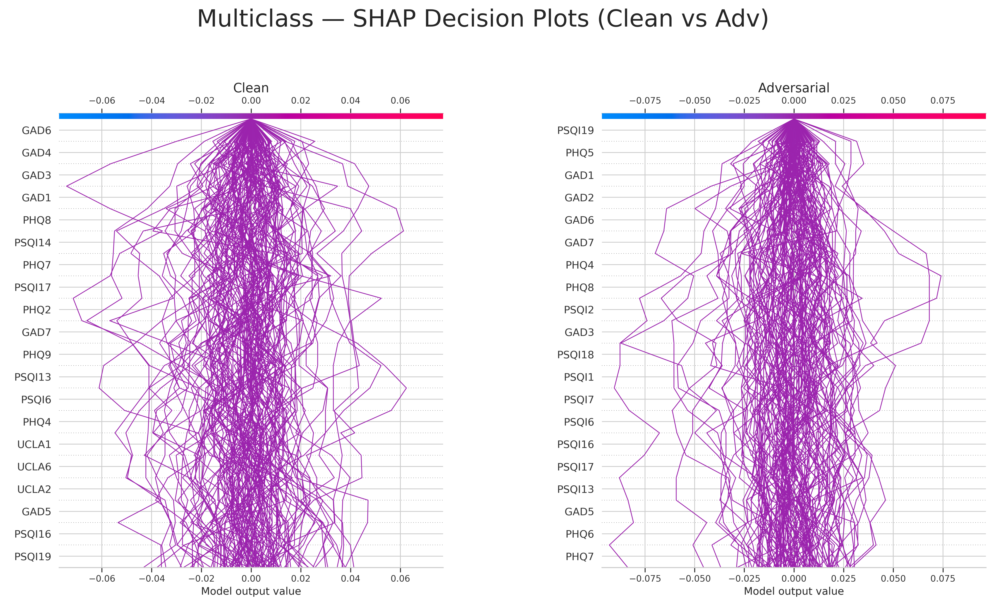

In [191]:
import shap
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image
import numpy as np

def plot_multiclass_decision_clean_vs_adv(shap_values_clean, shap_values_adv,
                                          X_clean, X_adv, feature_names,
                                          title_prefix="Multiclass"):
    # Aggregate SHAP contributions (mean across classes)
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    base_value_clean = 0
    base_value_adv = 0

    # Generate Clean decision plot
    buf_clean = BytesIO()
    shap.decision_plot(
        base_value=base_value_clean,
        shap_values=shap_clean_arr,
        features=X_clean.values,
        feature_names=feature_names,
        show=False
    )
    plt.title("Clean", fontsize=16)
    plt.tight_layout()
    plt.savefig(buf_clean, format="png", dpi=300, bbox_inches="tight")
    plt.close()
    buf_clean.seek(0)
    img_clean = Image.open(buf_clean)

    # Generate Adv decision plot
    buf_adv = BytesIO()
    shap.decision_plot(
        base_value=base_value_adv,
        shap_values=shap_adv_arr,
        features=X_adv.values,
        feature_names=feature_names,
        show=False
    )
    plt.title("Adversarial", fontsize=16)
    plt.tight_layout()
    plt.savefig(buf_adv, format="png", dpi=300, bbox_inches="tight")
    plt.close()
    buf_adv.seek(0)
    img_adv = Image.open(buf_adv)

    # Merge into single figure
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), dpi=450)
    axes[0].imshow(img_clean)
    axes[0].axis("off")
    axes[1].imshow(img_adv)
    axes[1].axis("off")

    fig.suptitle(f"{title_prefix} — SHAP Decision Plots (Clean vs Adv)", fontsize=20)
    plt.subplots_adjust(top=0.88, wspace=0.05)
    plt.savefig(f"{title_prefix.lower()}_decision_clean_vs_adv_fixed.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
plot_multiclass_decision_clean_vs_adv(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    title_prefix="Multiclass"
)

In [192]:
import shap
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image
import numpy as np

def plot_multiclass_merged_waterfalls(shap_values_clean, shap_values_adv, 
                                      X_clean, X_adv, feature_names, 
                                      sample_indices=None, title_prefix="Multiclass"):
    # Aggregate SHAP contributions (mean across classes)
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    if sample_indices is None:
        sample_indices = np.random.choice(range(X_clean.shape[0]), size=3, replace=False)

    fig, axes = plt.subplots(len(sample_indices), 2, figsize=(14, 5*len(sample_indices)), dpi=450)

    for row_idx, idx in enumerate(sample_indices):
        # Clean plot
        buf_clean = BytesIO()
        shap.waterfall_plot(shap.Explanation(
            values=shap_clean_arr[idx],
            base_values=0,  # aggregated mean base value
            data=X_clean.iloc[idx].values,
            feature_names=feature_names
        ), show=False)
        plt.tight_layout()
        plt.savefig(buf_clean, format="png", dpi=300, bbox_inches="tight")
        plt.close()
        buf_clean.seek(0)
        img_clean = Image.open(buf_clean)

        # Adv plot
        buf_adv = BytesIO()
        shap.waterfall_plot(shap.Explanation(
            values=shap_adv_arr[idx],
            base_values=0,
            data=X_adv.iloc[idx].values,
            feature_names=feature_names
        ), show=False)
        plt.tight_layout()
        plt.savefig(buf_adv, format="png", dpi=300, bbox_inches="tight")
        plt.close()
        buf_adv.seek(0)
        img_adv = Image.open(buf_adv)

        # Place in subplot grid
        axes[row_idx, 0].imshow(img_clean)
        axes[row_idx, 0].axis("off")
        axes[row_idx, 0].set_title(f"Sample {idx} — Clean", fontsize=14)

        axes[row_idx, 1].imshow(img_adv)
        axes[row_idx, 1].axis("off")
        axes[row_idx, 1].set_title(f"Sample {idx} — Adversarial", fontsize=14)

    fig.suptitle(f"{title_prefix} — SHAP Waterfalls (Clean vs Adv)", fontsize=20)
    plt.subplots_adjust(top=0.92, wspace=0.05, hspace=0.15)
    plt.savefig(f"{title_prefix.lower()}_merged_waterfalls_clean_vs_adv.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
plot_multiclass_merged_waterfalls(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    sample_indices=[0, 5, 10],  # choose N sample indices
    title_prefix="Multiclass"
)

<Figure size 640x480 with 0 Axes>

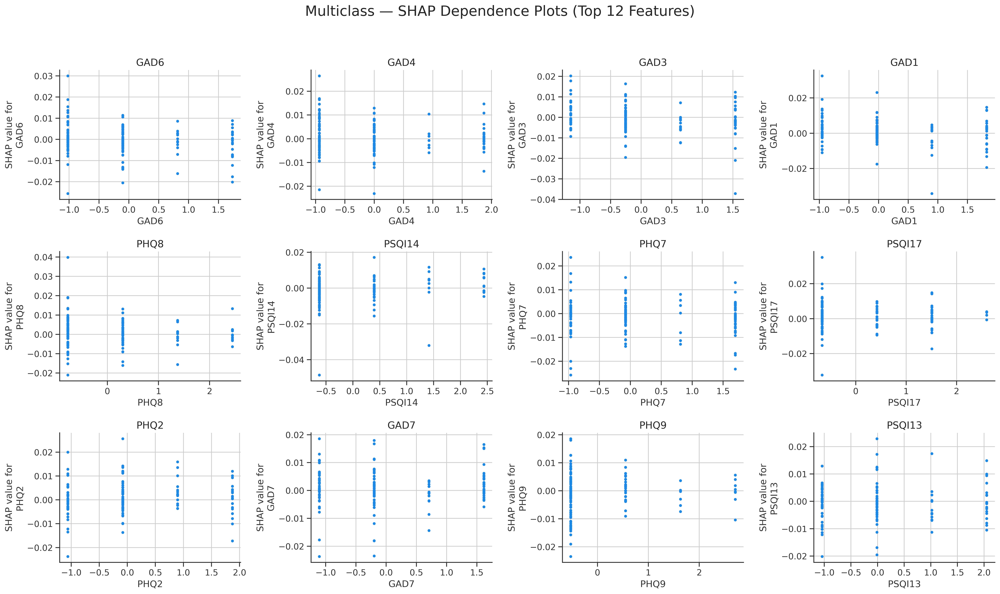

In [193]:
import numpy as np
import matplotlib.pyplot as plt
import shap

def plot_multiclass_dependence_topN(shap_values_clean, X_clean, feature_names, top_n=12, title_prefix="Multiclass"):
    # Aggregate SHAP values across classes by mean absolute value
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean

    mean_abs_shap = np.abs(shap_clean_arr).mean(axis=0)
    top_features_idx = np.argsort(mean_abs_shap)[-top_n:][::-1]
    top_features = [feature_names[i] for i in top_features_idx]

    # Plot in 4-column grid
    n_cols = 4
    n_rows = int(np.ceil(top_n / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), dpi=450)

    for i, feature in enumerate(top_features):
        row, col = divmod(i, n_cols)
        ax = axes[row, col] if n_rows > 1 else axes[col]

        shap.dependence_plot(
            ind=feature,
            shap_values=shap_clean_arr,
            features=X_clean,
            feature_names=feature_names,
            interaction_index=None,
            ax=ax,
            show=False
        )
        ax.set_title(feature, fontsize=14)
        ax.tick_params(axis='both', labelsize=12)

    # Remove unused subplots
    for j in range(len(top_features), n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])

    fig.suptitle(f"{title_prefix} — SHAP Dependence Plots (Top {top_n} Features)", fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"{title_prefix.lower()}_dependence_top{top_n}.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
plot_multiclass_dependence_topN(
    shap_values_clean=shap_values_multi_clean,
    X_clean=X_test_multi_selected,
    feature_names=X_test_multi_selected.columns.tolist(),
    top_n=12,
    title_prefix="Multiclass"
)

In [194]:
import numpy as np
import shap
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image

def plot_multiclass_flip_case_waterfalls(shap_values_clean, shap_values_adv,
                                         X_clean, X_adv, preds_clean, preds_adv,
                                         feature_names, max_cases=5,
                                         title_prefix="Multiclass"):
    # Aggregate SHAP values across classes by mean
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    # Find indices where prediction changes
    flip_indices = np.where(preds_clean != preds_adv)[0]
    if len(flip_indices) == 0:
        print("No flip cases found.")
        return
    flip_indices = flip_indices[:max_cases]

    fig, axes = plt.subplots(len(flip_indices), 2, figsize=(14, 5*len(flip_indices)), dpi=450)

    for row_idx, idx in enumerate(flip_indices):
        # Clean waterfall
        buf_clean = BytesIO()
        shap.waterfall_plot(shap.Explanation(
            values=shap_clean_arr[idx],
            base_values=0,
            data=X_clean.iloc[idx].values,
            feature_names=feature_names
        ), show=False)
        plt.tight_layout()
        plt.savefig(buf_clean, format="png", dpi=300, bbox_inches="tight")
        plt.close()
        buf_clean.seek(0)
        img_clean = Image.open(buf_clean)

        # Adv waterfall
        buf_adv = BytesIO()
        shap.waterfall_plot(shap.Explanation(
            values=shap_adv_arr[idx],
            base_values=0,
            data=X_adv.iloc[idx].values,
            feature_names=feature_names
        ), show=False)
        plt.tight_layout()
        plt.savefig(buf_adv, format="png", dpi=300, bbox_inches="tight")
        plt.close()
        buf_adv.seek(0)
        img_adv = Image.open(buf_adv)

        # Place in subplot
        axes[row_idx, 0].imshow(img_clean)
        axes[row_idx, 0].axis("off")
        axes[row_idx, 0].set_title(f"Sample {idx} — Clean (Pred: {preds_clean[idx]})", fontsize=14)

        axes[row_idx, 1].imshow(img_adv)
        axes[row_idx, 1].axis("off")
        axes[row_idx, 1].set_title(f"Sample {idx} — Adv (Pred: {preds_adv[idx]})", fontsize=14)

    fig.suptitle(f"{title_prefix} — Flip‑Case SHAP Waterfalls (Clean vs Adv)", fontsize=20)
    plt.subplots_adjust(top=0.92, wspace=0.05, hspace=0.15)
    plt.savefig(f"{title_prefix.lower()}_flip_cases_waterfalls_clean_vs_adv.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
# preds_clean_multi & preds_adv_multi should be the predicted class indices for each sample
plot_multiclass_flip_case_waterfalls(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    preds_clean=preds_clean_multi,
    preds_adv=preds_adv_multi,
    feature_names=X_test_multi_selected.columns.tolist(),
    max_cases=5,
    title_prefix="Multiclass"
)

<Figure size 640x480 with 0 Axes>

In [195]:
import torch
import numpy as np
from scipy.stats import entropy

def mc_dropout_uncertainty_multiclass(model, X, num_samples=30):
    model.train()  # keep dropout active
    X_tensor = torch.tensor(X.values, dtype=torch.float32).to(device)

    probs_list = []
    with torch.no_grad():
        for _ in range(num_samples):
            outputs = model(X_tensor)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probs_list.append(probs)

    probs_array = np.stack(probs_list)  # shape: (num_samples, N, num_classes)
    mean_probs = probs_array.mean(axis=0)  # shape: (N, num_classes)
    
    # Predictive entropy
    pred_entropy = entropy(mean_probs.T)  # shape: (N,)

    return pred_entropy

# ===== Compute uncertainties =====
uncertainties_clean_multi = mc_dropout_uncertainty_multiclass(model_multi, X_test_multi_selected, num_samples=30)
uncertainties_adv_multi = mc_dropout_uncertainty_multiclass(model_multi, X_test_multi_selected_adv, num_samples=30)

NameError: name 'device' is not defined

In [196]:
import numpy as np
import matplotlib.pyplot as plt
import shap

def plot_multiclass_uncertainty_beeswarm(shap_values_clean, shap_values_adv,
                                         X_clean, X_adv, uncertainties_clean, uncertainties_adv,
                                         feature_names, title_prefix="Multiclass", max_display=15):
    # Aggregate SHAP values across classes
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    fig, axes = plt.subplots(1, 2, figsize=(18, 8), dpi=450)

    # Clean beeswarm
    shap.summary_plot(
        shap_clean_arr,
        X_clean,
        feature_names=feature_names,
        max_display=max_display,
        plot_type="dot",
        color=uncertainties_clean,
        show=False
    )
    axes[0].set_title("Clean (Colored by Uncertainty)", fontsize=16)
    axes[0].tick_params(axis='both', labelsize=12)

    # Adv beeswarm
    shap.summary_plot(
        shap_adv_arr,
        X_adv,
        feature_names=feature_names,
        max_display=max_display,
        plot_type="dot",
        color=uncertainties_adv,
        show=False
    )
    axes[1].set_title("Adversarial (Colored by Uncertainty)", fontsize=16)
    axes[1].tick_params(axis='both', labelsize=12)

    fig.suptitle(f"{title_prefix} — SHAP Beeswarm (Uncertainty‑Colored)", fontsize=20)
    plt.subplots_adjust(top=0.90, wspace=0.3)
    plt.savefig(f"{title_prefix.lower()}_uncertainty_beeswarm_clean_vs_adv.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
# uncertainties_clean_multi & uncertainties_adv_multi should be per-sample values (entropy, variance, etc.)
plot_multiclass_uncertainty_beeswarm(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    uncertainties_clean=uncertainties_clean_multi,
    uncertainties_adv=uncertainties_adv_multi,
    feature_names=X_test_multi_selected.columns.tolist(),
    title_prefix="Multiclass"
)

NameError: name 'uncertainties_clean_multi' is not defined

The figure layout has changed to tight


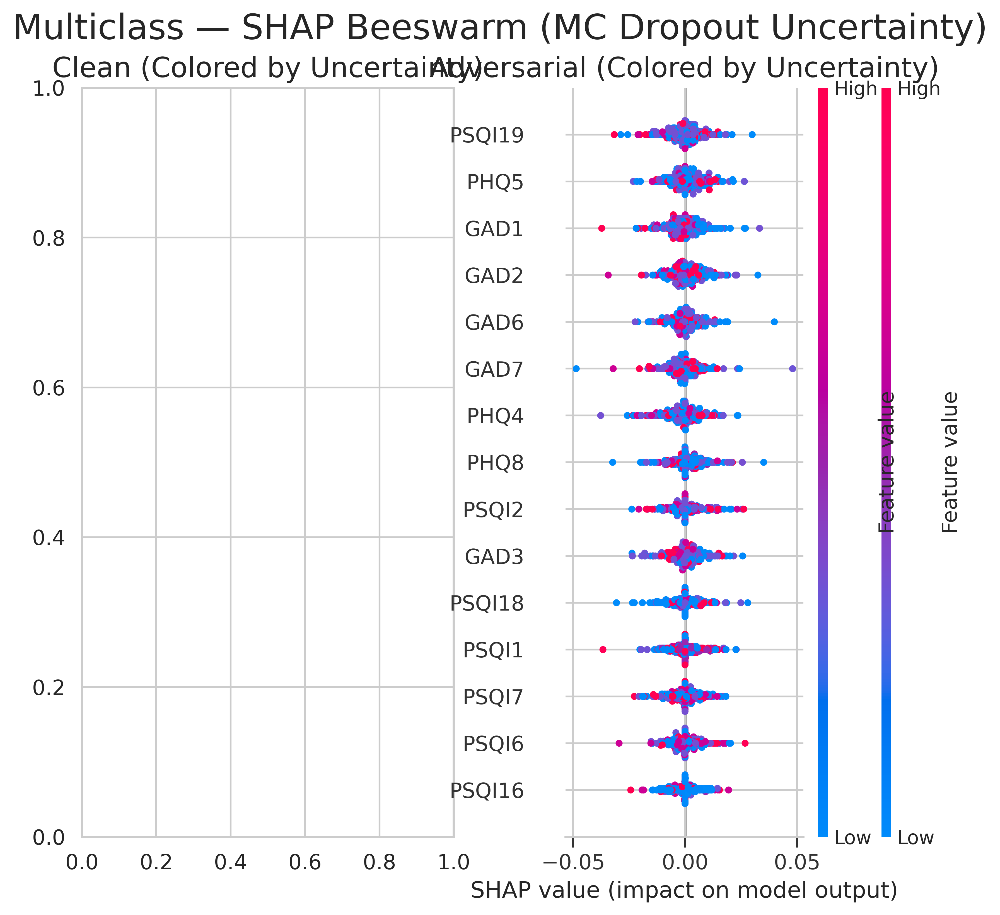

In [201]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import shap
from scipy.stats import entropy

def plot_multiclass_mc_dropout_beeswarm(model, X_clean, X_adv, shap_values_clean, shap_values_adv,
                                        feature_names, device=None, num_samples=30, max_display=15,
                                        title_prefix="Multiclass"):
    """
    Computes MC Dropout uncertainties and creates Clean vs Adv uncertainty-colored SHAP beeswarm plots.
    """
    # ===== Device setup =====
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # ===== Function to compute predictive entropy =====
    def mc_dropout_entropy(X):
        model.train()  # keep dropout active
        X_tensor = torch.tensor(X.values, dtype=torch.float32).to(device)
        probs_list = []
        with torch.no_grad():
            for _ in range(num_samples):
                outputs = model(X_tensor)
                probs = torch.softmax(outputs, dim=1).cpu().numpy()
                probs_list.append(probs)
        probs_array = np.stack(probs_list)  # (num_samples, N, num_classes)
        mean_probs = probs_array.mean(axis=0)  # (N, num_classes)
        return entropy(mean_probs.T)  # predictive entropy (N,)

    # ===== Compute uncertainties =====
    uncertainties_clean = mc_dropout_entropy(X_clean)
    uncertainties_adv = mc_dropout_entropy(X_adv)

    # ===== Aggregate SHAP across classes =====
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    # ===== Create figure =====
    fig, axes = plt.subplots(1, 2, figsize=(18, 8), dpi=450)

    # Clean Beeswarm
    shap.summary_plot(
        shap_clean_arr,
        X_clean,
        feature_names=feature_names,
        max_display=max_display,
        plot_type="dot",
        color=uncertainties_clean,
        show=False
    )
    axes[0].set_title("Clean (Colored by Uncertainty)", fontsize=16)
    axes[0].tick_params(axis='both', labelsize=12)

    # Adv Beeswarm
    shap.summary_plot(
        shap_adv_arr,
        X_adv,
        feature_names=feature_names,
        max_display=max_display,
        plot_type="dot",
        color=uncertainties_adv,
        show=False
    )
    axes[1].set_title("Adversarial (Colored by Uncertainty)", fontsize=16)
    axes[1].tick_params(axis='both', labelsize=12)

    # Main title
    fig.suptitle(f"{title_prefix} — SHAP Beeswarm (MC Dropout Uncertainty)", fontsize=20)
    plt.subplots_adjust(top=0.90, wspace=0.3)
    plt.savefig(f"{title_prefix.lower()}_uncertainty_beeswarm_clean_vs_adv.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
plot_multiclass_mc_dropout_beeswarm(
    model=model_multi,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    feature_names=X_test_multi_selected.columns.tolist(),
    num_samples=30,
    title_prefix="Multiclass")

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


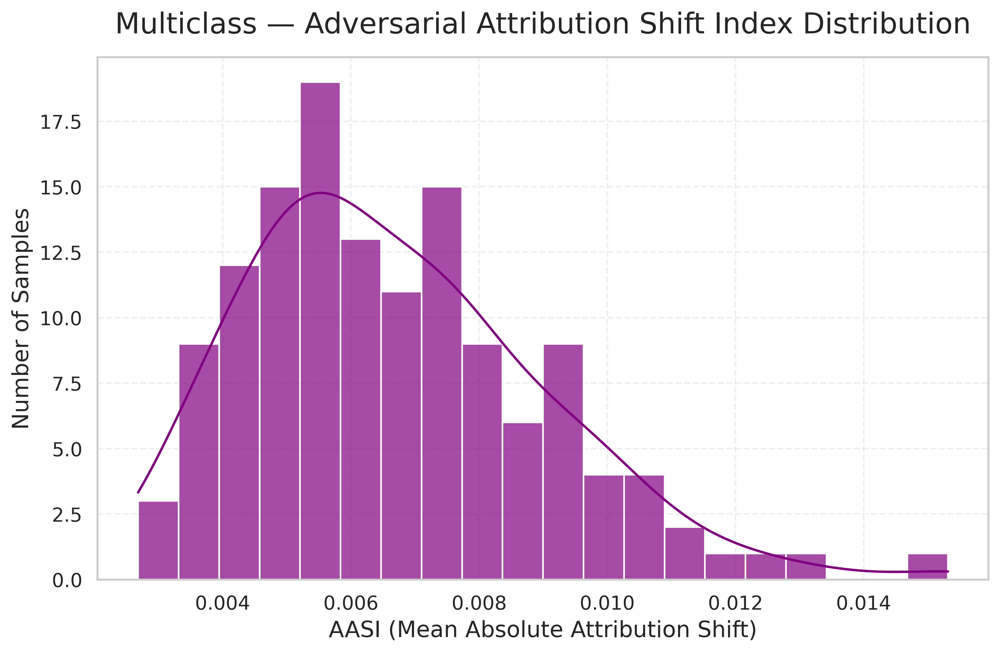

✅ Saved AASI distribution plot to multiclass_aasi_distribution.png


In [199]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_multiclass_aasi_distribution(shap_values_clean, shap_values_adv, title_prefix="Multiclass"):
    # ===== Aggregate SHAP across classes =====
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    # ===== Compute AASI for each sample =====
    aasi_values = np.mean(np.abs(shap_clean_arr - shap_adv_arr), axis=1)

    # ===== Plot Distribution =====
    plt.figure(figsize=(9, 6), dpi=450)
    sns.histplot(aasi_values, bins=20, kde=True, color="purple", alpha=0.7)
    plt.xlabel("AASI (Mean Absolute Attribution Shift)", fontsize=14)
    plt.ylabel("Number of Samples", fontsize=14)
    plt.title(f"{title_prefix} — Adversarial Attribution Shift Index Distribution", fontsize=18, pad=15)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(alpha=0.3, linestyle="--")

    # Save and show
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_aasi_distribution.png", dpi=450, bbox_inches="tight")
    plt.show()

    print(f"✅ Saved AASI distribution plot to {title_prefix.lower()}_aasi_distribution.png")

# ===== Example usage =====
plot_multiclass_aasi_distribution(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    title_prefix="Multiclass"
)

In [203]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import entropy
import torch

def extended_aasi_analysis_multiclass(
    model, X_clean, X_adv, shap_values_clean, shap_values_adv,
    device=None, num_mc_samples=30, title_prefix="Multiclass"
):
    # ==== Font sizes for publication ====
    title_size = 26
    label_size = 24
    tick_size = 22
    legend_size = 22
    scatter_size = 90

    # ===== Device setup =====
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # ===== Aggregate SHAP across classes =====
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    # ===== Compute AASI =====
    aasi_values = np.mean(np.abs(shap_clean_arr - shap_adv_arr), axis=1)

    # ===== Compute Uncertainty (MC Dropout) =====
    def mc_dropout_entropy(X):
        model.train()
        X_tensor = torch.tensor(X.values, dtype=torch.float32).to(device)
        probs_list = []
        with torch.no_grad():
            for _ in range(num_mc_samples):
                outputs = model(X_tensor)
                probs = torch.softmax(outputs, dim=1).cpu().numpy()
                probs_list.append(probs)
        mean_probs = np.mean(np.stack(probs_list), axis=0)
        return entropy(mean_probs.T)

    uncertainties_clean = mc_dropout_entropy(X_clean)
    uncertainties_adv = mc_dropout_entropy(X_adv)

    # ===== Compute Prediction Confidence =====
    model.eval()
    with torch.no_grad():
        clean_probs = torch.softmax(model(torch.tensor(X_clean.values, dtype=torch.float32).to(device)), dim=1).cpu().numpy()
        adv_probs = torch.softmax(model(torch.tensor(X_adv.values, dtype=torch.float32).to(device)), dim=1).cpu().numpy()
    clean_conf = np.max(clean_probs, axis=1)
    adv_conf = np.max(adv_probs, axis=1)

    # ===== Compute Attribution Norms =====
    clean_norms = np.linalg.norm(shap_clean_arr, axis=1)
    adv_norms = np.linalg.norm(shap_adv_arr, axis=1)

    # ===== Plotting =====
    fig, axes = plt.subplots(2, 2, figsize=(18, 14), dpi=400)
    plt.subplots_adjust(hspace=0.4, wspace=0.35)

    # (a) AASI Distribution
    sns.histplot(aasi_values, bins=20, kde=True, color="purple", alpha=0.7, ax=axes[0, 0])
    axes[0, 0].set_title("(a) AASI Distribution", fontsize=title_size, pad=15)
    axes[0, 0].set_xlabel("AASI", fontsize=label_size)
    axes[0, 0].set_ylabel("Samples", fontsize=label_size)
    axes[0, 0].tick_params(axis='x', labelsize=tick_size)
    axes[0, 0].tick_params(axis='y', labelsize=tick_size)

    # (b) AASI vs Uncertainty
    axes[0, 1].scatter(uncertainties_clean, aasi_values, alpha=0.6, label="Clean", color="blue", s=scatter_size, edgecolors='k')
    axes[0, 1].scatter(uncertainties_adv, aasi_values, alpha=0.6, label="Adversarial", color="red", s=scatter_size, edgecolors='k')
    axes[0, 1].set_title("(b) AASI vs Uncertainty", fontsize=title_size, pad=15)
    axes[0, 1].set_xlabel("Predictive Entropy", fontsize=label_size)
    axes[0, 1].set_ylabel("AASI", fontsize=label_size)
    axes[0, 1].tick_params(axis='x', labelsize=tick_size)
    axes[0, 1].tick_params(axis='y', labelsize=tick_size)
    axes[0, 1].legend(fontsize=legend_size)

    # (c) AASI vs Confidence
    axes[1, 0].scatter(clean_conf, aasi_values, alpha=0.6, label="Clean", color="blue", s=scatter_size, edgecolors='k')
    axes[1, 0].scatter(adv_conf, aasi_values, alpha=0.6, label="Adversarial", color="red", s=scatter_size, edgecolors='k')
    axes[1, 0].set_title("(c) AASI vs Prediction Confidence", fontsize=title_size, pad=15)
    axes[1, 0].set_xlabel("Max Predicted Probability", fontsize=label_size)
    axes[1, 0].set_ylabel("AASI", fontsize=label_size)
    axes[1, 0].tick_params(axis='x', labelsize=tick_size)
    axes[1, 0].tick_params(axis='y', labelsize=tick_size)
    axes[1, 0].legend(fontsize=legend_size)

    # (d) Clean vs Adv Attribution Norms
    axes[1, 1].scatter(clean_norms, adv_norms, alpha=0.6, color="green", s=scatter_size, edgecolors='k')
    axes[1, 1].plot([clean_norms.min(), clean_norms.max()],
                    [clean_norms.min(), clean_norms.max()], 'k--', lw=2)
    axes[1, 1].set_title("(d) Clean vs Adv Attribution Norms", fontsize=title_size, pad=15)
    axes[1, 1].set_xlabel("Clean L2 Norm", fontsize=label_size)
    axes[1, 1].set_ylabel("Adversarial L2 Norm", fontsize=label_size)
    axes[1, 1].tick_params(axis='x', labelsize=tick_size)
    axes[1, 1].tick_params(axis='y', labelsize=tick_size)

    fig.suptitle(f"{title_prefix} — Extended AASI Analysis", fontsize=title_size + 2, y=1.02)
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_extended_aasi_analysis.png", dpi=400, bbox_inches="tight")
    plt.close()

    print(f"✅ Saved extended AASI analysis plot to {title_prefix.lower()}_extended_aasi_analysis.png")

# ===== Example usage =====
extended_aasi_analysis_multiclass(
    model=model_multi,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    num_mc_samples=30,
    title_prefix="Multiclass"
)

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


✅ Saved extended AASI analysis plot to multiclass_extended_aasi_analysis.png


In [209]:
import torch
import numpy as np
from scipy.stats import entropy

def mc_dropout_entropy(model, X, num_samples=30, device=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.train()  # keep dropout ON
    X_tensor = torch.tensor(X.values, dtype=torch.float32).to(device)

    probs_list = []
    with torch.no_grad():
        for _ in range(num_samples):
            logits = model(X_tensor)
            probs = torch.softmax(logits, dim=1)
            probs_list.append(probs)
    mean_probs = torch.stack(probs_list, dim=0).mean(dim=0).cpu().numpy()  # [N, C]
    return entropy(mean_probs.T)  # [N], predictive entropy per sample

In [211]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
uncertainties_clean_multi = mc_dropout_entropy(model_multi, X_test_multi_selected, num_samples=30, device=device)

# (Optional) sanity check: lengths must match the SHAP arrays' N
N = (shap_values_multi_clean[0].shape[0] if isinstance(shap_values_multi_clean, list)
     else shap_values_multi_clean.shape[0])
assert len(uncertainties_clean_multi) == N, "Uncertainty length must match SHAP samples"

# Now run the multiclass AASI plot you defined earlier
aasi_df_multi, stats_df_multi, corr_multi, fig_path = plot_aasi_4panel_multiclass(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    uncertainties_clean=uncertainties_clean_multi,
    feature_names=feature_names_multi,
    title_prefix="Multiclass"
)

print("✅ Multiclass AASI–Uncertainty Spearman correlation:", corr_multi)
print("🖼️ Figure saved to:", fig_path)

invalid value encountered in greater
invalid value encountered in less
unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


✅ Multiclass AASI–Uncertainty Spearman correlation: (0.02101258413813287, 0.8088571928089553)
🖼️ Figure saved to: multiclass_aasi_4panel.png


In [212]:
from scipy.stats import wilcoxon, spearmanr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def _to_2d_shap(shap_vals):
    """
    Accepts:
      - 2D array: (n_samples, n_features)
      - 3D array: (n_samples, n_features, n_classes)  -> mean over classes
      - list of length n_classes with arrays (n_samples, n_features) -> mean over classes
    Returns 2D array (n_samples, n_features)
    """
    if isinstance(shap_vals, list):
        arr = np.mean(np.stack([np.asarray(x) for x in shap_vals], axis=0), axis=0)
    else:
        arr = np.asarray(shap_vals)
        if arr.ndim == 3:
            arr = np.mean(arr, axis=-1)
        elif arr.ndim != 2:
            raise ValueError(f"Unsupported SHAP shape: {arr.shape}")
    return arr

def plot_aasi_4panel_multiclass(
    shap_values_clean, shap_values_adv, uncertainties_clean, feature_names, title_prefix="Multiclass"
):
    """
    Multiclass version of your binary AASI 4-panel plot.
    - Averages SHAP across classes (if needed) before computing AASI.
    - Keeps the same visuals/layout as your binary function.
    """
    # === Step 0: Normalize SHAP shapes to (N, F) ===
    shap_clean_2d = _to_2d_shap(shap_values_clean)
    shap_adv_2d   = _to_2d_shap(shap_values_adv)
    feature_names = list(feature_names)

    if shap_clean_2d.shape != shap_adv_2d.shape:
        raise ValueError("Clean and adversarial SHAP shapes must match after class-averaging.")
    if shap_clean_2d.shape[1] != len(feature_names):
        raise ValueError("Number of features in SHAP values does not match feature_names.")

    # === Step 1: Compute AASI ===
    eps = 1e-8
    aasi = np.abs(shap_adv_2d - shap_clean_2d) / (np.abs(shap_adv_2d) + np.abs(shap_clean_2d) + eps)
    aasi_df = pd.DataFrame(aasi, columns=feature_names)

    # Mean AASI per feature for ordering
    feature_order = aasi_df.mean().sort_values(ascending=False).index

    # === Step 2: Wilcoxon signed-rank test (|clean| vs |adv| per feature) ===
    stats_results = []
    for j, feat in enumerate(feature_names):
        try:
            stat, p = wilcoxon(np.abs(shap_clean_2d[:, j]), np.abs(shap_adv_2d[:, j]))
            stats_results.append((feat, stat, p))
        except ValueError:
            stats_results.append((feat, np.nan, np.nan))
    stats_df = pd.DataFrame(stats_results, columns=["Feature", "Wilcoxon_stat", "p_value"])
    stats_df["Significant"] = stats_df["p_value"] < 0.05

    # === Step 3: AASI vs Uncertainty correlation ===
    mean_aasi_per_sample = aasi_df.mean(axis=1)
    uncertainties_clean = np.asarray(uncertainties_clean).reshape(-1)
    if len(uncertainties_clean) != len(mean_aasi_per_sample):
        raise ValueError("Length of uncertainties_clean must match number of samples in SHAP arrays.")
    corr_val, corr_p = spearmanr(mean_aasi_per_sample, uncertainties_clean)

    # === Step 4: Plot 4-panel figure (same style/layout as binary) ===
    fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=450)

    # Panel A: Boxplots of AASI per feature
    sns.boxplot(data=aasi_df[feature_order], orient="h", ax=axes[0, 0], palette="coolwarm")
    axes[0, 0].set_title("A) AASI Distribution per Feature", fontsize=14)
    axes[0, 0].set_xlabel("AASI")
    axes[0, 0].set_ylabel("Feature")

    # Panel B: Mean AASI bar plot
    mean_aasi = aasi_df.mean().loc[feature_order]
    sns.barplot(x=mean_aasi.values, y=mean_aasi.index, ax=axes[0, 1], palette="coolwarm")
    axes[0, 1].set_title("B) Mean AASI per Feature", fontsize=14)
    axes[0, 1].set_xlabel("Mean AASI")
    axes[0, 1].set_ylabel("")

    # Panel C: AASI vs Uncertainty scatter
    sns.regplot(x=mean_aasi_per_sample, y=uncertainties_clean, ax=axes[1, 0],
                scatter_kws={'alpha': 0.7})
    axes[1, 0].set_title(f"C) AASI vs Uncertainty\nSpearman r={corr_val:.3f}, p={corr_p:.3g}", fontsize=14)
    axes[1, 0].set_xlabel("Mean AASI per Sample")
    axes[1, 0].set_ylabel("Predictive Uncertainty (Clean)")

    # Panel D: Significant feature shift count
    sig_count = int(stats_df["Significant"].sum())
    nonsig_count = int(len(stats_df) - sig_count)
    sns.barplot(x=["Significant Shift", "No Significant Shift"], y=[sig_count, nonsig_count],
                palette=["red", "grey"], ax=axes[1, 1])
    axes[1, 1].set_title("D) Count of Significant Feature Attribution Shifts", fontsize=14)
    axes[1, 1].set_ylabel("Number of Features")
    axes[1, 1].set_xlabel("")

    fig.suptitle(f"{title_prefix} — Adversarial Attribution Shift Index (AASI) Analysis",
                 fontsize=18, fontweight="bold", y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    out_path = f"{title_prefix.lower()}_aasi_4panel.png"
    plt.savefig(out_path, dpi=450, bbox_inches="tight")
    plt.close()

    return aasi_df, stats_df, (corr_val, corr_p), out_path

# ===== Example usage for Multiclass =====
aasi_df_multi, stats_df_multi, corr_multi, fig_path = plot_aasi_4panel_multiclass(
    shap_values_clean=shap_values_multi_clean,   # 2D (N,F) or 3D (N,F,C) or list-of-classes
     shap_values_adv=shap_values_multi_adv,       # same structure as clean
     uncertainties_clean=uncertainties_clean_multi,
     feature_names=feature_names_multi,
     title_prefix="Multiclass"
 )
# print("✅ AASI–Uncertainty correlation:", corr_multi)
# print("📊 Wilcoxon results (top 5):")
# print(stats_df_multi.sort_values("p_value").head())
# print(f"🖼️ Figure saved to: {fig_path}")

invalid value encountered in greater
invalid value encountered in less
unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


In [214]:
from scipy.stats import wilcoxon, spearmanr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap

def _to_2d_shap(shap_vals):
    if isinstance(shap_vals, list):
        arr = np.mean(np.stack([np.asarray(x) for x in shap_vals], axis=0), axis=0)
    else:
        arr = np.asarray(shap_vals)
        if arr.ndim == 3:  # (N,F,C)
            arr = np.mean(arr, axis=-1)
        elif arr.ndim != 2:
            raise ValueError(f"Unsupported SHAP shape: {arr.shape}")
    return arr

def _wrap_labels(labels, width=18):
    return ['\n'.join(textwrap.wrap(str(l), width=width, break_long_words=False)) for l in labels]

def plot_aasi_4panel_multiclass(
    shap_values_clean, shap_values_adv, uncertainties_clean, feature_names,
    title_prefix="Multiclass", top_k=20, wrap_at=18, dpi=450
):
    """
    Multiclass AASI 4-panel with label-overlap fixes:
      - shows only top_k features by mean AASI
      - wraps long feature names at wrap_at characters
      - increases figure height with top_k
    """
    # === Normalize SHAP to (N, F) ===
    shap_clean = _to_2d_shap(shap_values_clean)
    shap_adv   = _to_2d_shap(shap_values_adv)
    feature_names = list(feature_names)

    if shap_clean.shape != shap_adv.shape:
        raise ValueError("Clean and adversarial SHAP shapes must match after class-averaging.")
    if shap_clean.shape[1] != len(feature_names):
        raise ValueError("Number of features in SHAP values does not match feature_names.")

    # === AASI ===
    eps = 1e-8
    aasi = np.abs(shap_adv - shap_clean) / (np.abs(shap_adv) + np.abs(shap_clean) + eps)
    aasi_df = pd.DataFrame(aasi, columns=feature_names)

    # Order by mean AASI, pick top_k (descending)
    mean_aasi_full = aasi_df.mean()
    feature_order_full = mean_aasi_full.sort_values(ascending=False).index
    sel = feature_order_full[:top_k]
    aasi_top = aasi_df[sel]
    mean_aasi_top = mean_aasi_full.loc[sel]

    # === Wilcoxon per-feature (|clean| vs |adv|) on the selected set ===
    stats_results = []
    name_to_idx = {f:i for i, f in enumerate(feature_names)}
    for feat in sel:
        j = name_to_idx[feat]
        try:
            stat, p = wilcoxon(np.abs(shap_clean[:, j]), np.abs(shap_adv[:, j]))
            stats_results.append((feat, stat, p))
        except ValueError:
            stats_results.append((feat, np.nan, np.nan))
    stats_df = pd.DataFrame(stats_results, columns=["Feature", "Wilcoxon_stat", "p_value"])
    stats_df["Significant"] = stats_df["p_value"] < 0.05

    # === AASI vs Uncertainty correlation ===
    mean_aasi_per_sample = aasi_df.mean(axis=1)
    uncertainties_clean = np.asarray(uncertainties_clean).reshape(-1)
    if len(uncertainties_clean) != len(mean_aasi_per_sample):
        raise ValueError("Length of uncertainties_clean must match number of samples in SHAP arrays.")
    corr_val, corr_p = spearmanr(mean_aasi_per_sample, uncertainties_clean)

    # === Figure (taller if more features) ===
    # about ~0.45 inch per label in top row (tweak if needed)
    height = max(12, 8 + 0.45 * len(sel))
    fig, axes = plt.subplots(2, 2, figsize=(16, height), dpi=dpi)
    plt.subplots_adjust(hspace=0.35, wspace=0.35)

    # Wrapped labels (reverse so highest mean is at top)
    wrapped = _wrap_labels(list(sel), width=wrap_at)[::-1]

    # Panel A: Boxplots of AASI per feature (top_k)
    sns.boxplot(data=aasi_top[sel[::-1]], orient="h", ax=axes[0, 0], palette="coolwarm")
    axes[0, 0].set_title("A) AASI Distribution per Feature", fontsize=16, pad=8)
    axes[0, 0].set_xlabel("AASI", fontsize=14)
    axes[0, 0].set_ylabel("Feature", fontsize=14)
    axes[0, 0].set_yticklabels(wrapped, fontsize=12)

    # Panel B: Mean AASI bar plot (top_k)
    # Use matplotlib barh for precise label wrapping control
    axB = axes[0, 1]
    vals = mean_aasi_top.values[::-1]
    idxs = np.arange(len(sel))
    axB.barh(idxs, vals, color=sns.color_palette("coolwarm", len(sel))[-1])
    axB.set_yticks(idxs)
    axB.set_yticklabels(wrapped, fontsize=12)
    axB.set_title("B) Mean AASI per Feature", fontsize=16, pad=8)
    axB.set_xlabel("Mean AASI", fontsize=14)
    axB.set_ylabel("")
    axB.margins(y=0.02)

    # Panel C: AASI vs Uncertainty scatter with trend
    sns.regplot(x=mean_aasi_per_sample, y=uncertainties_clean, ax=axes[1, 0],
                scatter_kws={'alpha': 0.7, 's': 40, 'edgecolor': 'k', 'linewidth': 0.5})
    axes[1, 0].set_title(f"C) AASI vs Uncertainty\nSpearman r={corr_val:.3f}, p={corr_p:.3g}", fontsize=16, pad=8)
    axes[1, 0].set_xlabel("Mean AASI per Sample", fontsize=14)
    axes[1, 0].set_ylabel("Predictive Uncertainty (Clean)", fontsize=14)
    axes[1, 0].tick_params(labelsize=12)

    # Panel D: Significant feature shift count (top_k only, to match panels A/B)
    sig_count = int(stats_df["Significant"].sum())
    nonsig_count = int(len(stats_df) - sig_count)
    sns.barplot(x=["Significant Shift", "No Significant Shift"], y=[sig_count, nonsig_count],
                palette=["red", "grey"], ax=axes[1, 1])
    axes[1, 1].set_title(f"D) Significant Attribution Shifts (Top {len(sel)})", fontsize=16, pad=8)
    axes[1, 1].set_ylabel("Number of Features", fontsize=14)
    axes[1, 1].set_xlabel("")
    axes[1, 1].tick_params(labelsize=12)

    fig.suptitle(f"{title_prefix} — Adversarial Attribution Shift Index (AASI) Analysis",
                 fontsize=18, fontweight="bold", y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    out_path = f"{title_prefix.lower()}_aasi_5panel.png"
    plt.savefig(out_path, dpi=dpi, bbox_inches="tight")
    plt.close()

    return aasi_df, stats_df, (corr_val, corr_p), out_path

# ===== Example usage for Multiclass =====
aasi_df_multi, stats_df_multi, corr_multi, fig_path = plot_aasi_4panel_multiclass(
    shap_values_clean=shap_values_multi_clean,   # 2D (N,F) or 3D (N,F,C) or list-of-classes
     shap_values_adv=shap_values_multi_adv,       # same structure as clean
     uncertainties_clean=uncertainties_clean_multi,
     feature_names=feature_names_multi,
     title_prefix="Multiclass"
 )

invalid value encountered in greater
invalid value encountered in less
unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.


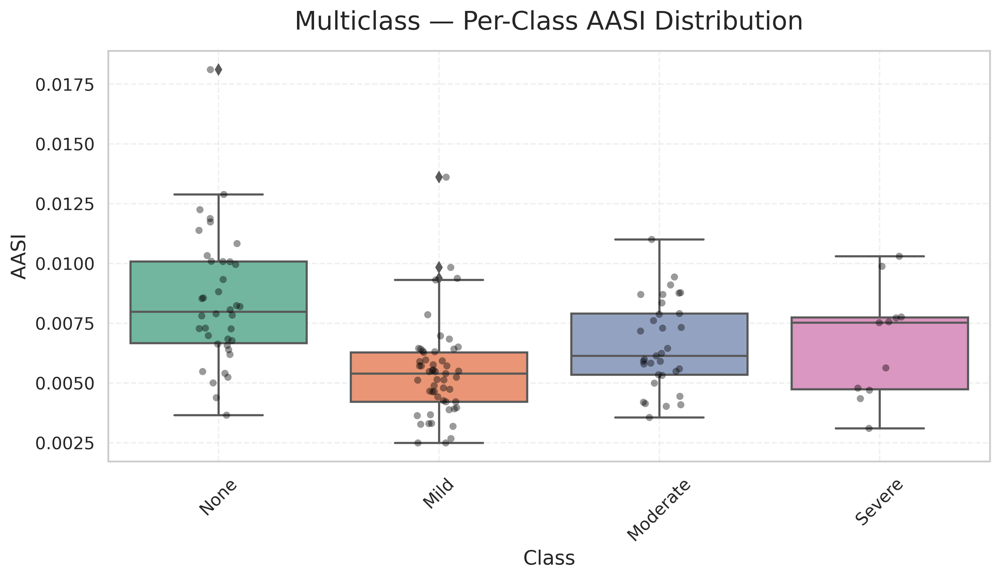

✅ Saved per-class AASI plot to multiclass_aasi_per_class.png


In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_multiclass_aasi_per_class(shap_values_clean, shap_values_adv, y_labels, 
                                   class_names=None, group_by="true", title_prefix="Multiclass"):
    """
    group_by: "true" → group by true class labels
              "pred" → group by predicted labels on clean data
    """
    # ===== Aggregate SHAP across classes =====
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    # ===== Compute AASI per sample =====
    aasi_values = np.mean(np.abs(shap_clean_arr - shap_adv_arr), axis=1)

    # ===== Create DataFrame =====
    df = pd.DataFrame({"AASI": aasi_values, "Class": y_labels})
    if class_names is not None:
        df["Class"] = df["Class"].map(lambda c: class_names[c] if c < len(class_names) else f"Class {c}")

    # ===== Plot =====
    plt.figure(figsize=(10, 6), dpi=450)
    sns.boxplot(x="Class", y="AASI", data=df, palette="Set2")
    sns.stripplot(x="Class", y="AASI", data=df, color="black", alpha=0.4, jitter=True)

    plt.title(f"{title_prefix} — Per-Class AASI Distribution", fontsize=18, pad=15)
    plt.xlabel("Class", fontsize=14)
    plt.ylabel("AASI", fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(alpha=0.3, linestyle="--")
    plt.tight_layout()
    plt.savefig(f"{title_prefix.lower()}_aasi_per_class.png", dpi=450, bbox_inches="tight")
    plt.show()

    print(f"✅ Saved per-class AASI plot to {title_prefix.lower()}_aasi_per_class.png")

# ===== Example usage =====
# y_test_multi should be your true labels for the multiclass test set
# Optionally pass class_names=["None","Mild","Moderate","Severe"] if you have them
plot_multiclass_aasi_per_class(
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    y_labels=y_test_multi.values,
    class_names=["None", "Mild", "Moderate", "Severe"],  # optional
    group_by="true",
    title_prefix="Multiclass"
)

In [101]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import entropy
import torch

def combined_aasi_summary_multiclass(model, X_clean, X_adv, shap_values_clean, shap_values_adv,
                                     y_labels, class_names=None, device=None, num_mc_samples=30,
                                     title_prefix="Multiclass"):
    # ===== Device setup =====
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # ===== Aggregate SHAP across classes =====
    if isinstance(shap_values_clean, list):
        shap_clean_arr = np.mean(np.stack(shap_values_clean, axis=0), axis=0)
        shap_adv_arr = np.mean(np.stack(shap_values_adv, axis=0), axis=0)
    else:
        shap_clean_arr = shap_values_clean
        shap_adv_arr = shap_values_adv

    # ===== Compute AASI =====
    aasi_values = np.mean(np.abs(shap_clean_arr - shap_adv_arr), axis=1)

    # ===== Compute Uncertainty (MC Dropout) =====
    def mc_dropout_entropy(X):
        model.train()
        X_tensor = torch.tensor(X.values, dtype=torch.float32).to(device)
        probs_list = []
        with torch.no_grad():
            for _ in range(num_mc_samples):
                outputs = model(X_tensor)
                probs = torch.softmax(outputs, dim=1).cpu().numpy()
                probs_list.append(probs)
        mean_probs = np.mean(np.stack(probs_list), axis=0)
        return entropy(mean_probs.T)

    uncertainties_clean = mc_dropout_entropy(X_clean)
    uncertainties_adv = mc_dropout_entropy(X_adv)

    # ===== Compute Attribution Norms =====
    clean_norms = np.linalg.norm(shap_clean_arr, axis=1)
    adv_norms = np.linalg.norm(shap_adv_arr, axis=1)

    # ===== Prepare DataFrame for Per-Class Plot =====
    df_classes = pd.DataFrame({"AASI": aasi_values, "Class": y_labels})
    if class_names is not None:
        df_classes["Class"] = df_classes["Class"].map(lambda c: class_names[c] if c < len(class_names) else f"Class {c}")

    # ===== Plotting =====
    fig, axes = plt.subplots(2, 2, figsize=(14, 10), dpi=450)

    # (a) AASI Distribution
    sns.histplot(aasi_values, bins=20, kde=True, color="purple", alpha=0.7, ax=axes[0, 0])
    axes[0, 0].set_title("(a) AASI Distribution", fontsize=14)
    axes[0, 0].set_xlabel("AASI", fontsize=12)
    axes[0, 0].set_ylabel("Samples", fontsize=12)

    # (b) Per-Class AASI
    sns.boxplot(x="Class", y="AASI", data=df_classes, palette="Set2", ax=axes[0, 1])
    sns.stripplot(x="Class", y="AASI", data=df_classes, color="black", alpha=0.4, jitter=True, ax=axes[0, 1])
    axes[0, 1].set_title("(b) Per-Class AASI", fontsize=14)
    axes[0, 1].set_xlabel("Class", fontsize=12)
    axes[0, 1].set_ylabel("AASI", fontsize=12)
    axes[0, 1].tick_params(axis='x', rotation=45)

    # (c) AASI vs Uncertainty (Clean + Adv)
    axes[1, 0].scatter(uncertainties_clean, aasi_values, alpha=0.6, label="Clean", color="blue")
    axes[1, 0].scatter(uncertainties_adv, aasi_values, alpha=0.6, label="Adv", color="red")
    axes[1, 0].set_title("(c) AASI vs Uncertainty", fontsize=14)
    axes[1, 0].set_xlabel("Predictive Entropy", fontsize=12)
    axes[1, 0].set_ylabel("AASI", fontsize=12)
    axes[1, 0].legend()

    # (d) Clean vs Adv Attribution Norms
    axes[1, 1].scatter(clean_norms, adv_norms, alpha=0.6, color="green")
    axes[1, 1].plot([clean_norms.min(), clean_norms.max()],
                    [clean_norms.min(), clean_norms.max()], 'k--', lw=1)
    axes[1, 1].set_title("(d) Clean vs Adv Attribution Norms", fontsize=14)
    axes[1, 1].set_xlabel("Clean L2 Norm", fontsize=12)
    axes[1, 1].set_ylabel("Adv L2 Norm", fontsize=12)

    fig.suptitle(f"{title_prefix} — Combined Robustness–Explainability Summary", fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"{title_prefix.lower()}_combined_aasi_summary.png", dpi=450, bbox_inches="tight")
    plt.show()

    print(f"✅ Saved combined robustness–XAI summary to {title_prefix.lower()}_combined_aasi_summary.png")

# ===== Example usage =====
combined_aasi_summary_multiclass(
    model=model_multi,
    X_clean=X_test_multi_selected,
    X_adv=X_test_multi_selected_adv,
    shap_values_clean=shap_values_multi_clean,
    shap_values_adv=shap_values_multi_adv,
    y_labels=y_test_multi.values,
    class_names=["None", "Mild", "Moderate", "Severe"],  # optional
    device=device,
    num_mc_samples=30,
    title_prefix="Multiclass"
)

NameError: name 'device' is not defined

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
When grouping with a length-1 list-like, you will 

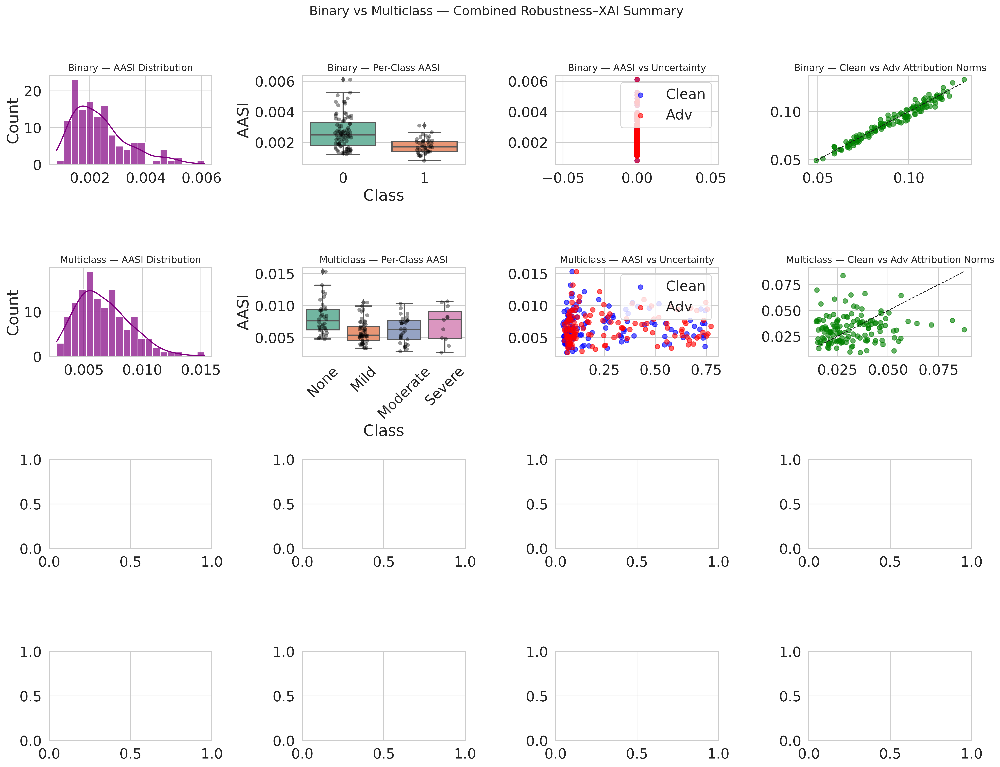

In [217]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import entropy
import torch

def combined_binary_multiclass_summary(
    model_bin, X_clean_bin, X_adv_bin, shap_clean_bin, shap_adv_bin, y_bin,
    model_multi, X_clean_multi, X_adv_multi, shap_clean_multi, shap_adv_multi, y_multi,
    class_names_multi=None, device=None, num_mc_samples=30
):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # ===== Helper to compute AASI & norms =====
    def compute_metrics(model, X_clean, X_adv, shap_clean, shap_adv):
        # Aggregate SHAP
        if isinstance(shap_clean, list):
            shap_clean_arr = np.mean(np.stack(shap_clean, axis=0), axis=0)
            shap_adv_arr = np.mean(np.stack(shap_adv, axis=0), axis=0)
        else:
            shap_clean_arr = shap_clean
            shap_adv_arr = shap_adv

        # AASI
        aasi_values = np.mean(np.abs(shap_clean_arr - shap_adv_arr), axis=1)

        # Uncertainty (MC Dropout predictive entropy)
        def mc_dropout_entropy(X):
            model.train()
            X_tensor = torch.tensor(X.values, dtype=torch.float32).to(device)
            probs_list = []
            with torch.no_grad():
                for _ in range(num_mc_samples):
                    outputs = model(X_tensor)
                    probs = torch.softmax(outputs, dim=1).cpu().numpy()
                    probs_list.append(probs)
            mean_probs = np.mean(np.stack(probs_list), axis=0)
            return entropy(mean_probs.T)

        unc_clean = mc_dropout_entropy(X_clean)
        unc_adv = mc_dropout_entropy(X_adv)

        # Norms
        clean_norms = np.linalg.norm(shap_clean_arr, axis=1)
        adv_norms = np.linalg.norm(shap_adv_arr, axis=1)

        return aasi_values, unc_clean, unc_adv, clean_norms, adv_norms

    # ===== Binary =====
    aasi_bin, unc_clean_bin, unc_adv_bin, norms_clean_bin, norms_adv_bin = compute_metrics(
        model_bin, X_clean_bin, X_adv_bin, shap_clean_bin, shap_adv_bin
    )

    # ===== Multiclass =====
    aasi_multi, unc_clean_multi, unc_adv_multi, norms_clean_multi, norms_adv_multi = compute_metrics(
        model_multi, X_clean_multi, X_adv_multi, shap_clean_multi, shap_adv_multi
    )

    # ===== Prepare plotting =====
    fig, axes = plt.subplots(4, 4, figsize=(18, 14), dpi=450)  # 4 rows × 4 columns

    # Shared y-label mapping
    titles = [
        "AASI Distribution",
        "Per-Class AASI",
        "AASI vs Uncertainty",
        "Clean vs Adv Attribution Norms"
    ]

    # ===== Binary Plots =====
    sns.histplot(aasi_bin, bins=20, kde=True, color="purple", alpha=0.7, ax=axes[0, 0])
    axes[0, 0].set_title(f"Binary — {titles[0]}", fontsize=12)

    df_bin_classes = pd.DataFrame({"AASI": aasi_bin, "Class": y_bin})
    sns.boxplot(x="Class", y="AASI", data=df_bin_classes, palette="Set2", ax=axes[0, 1])
    sns.stripplot(x="Class", y="AASI", data=df_bin_classes, color="black", alpha=0.4, jitter=True, ax=axes[0, 1])
    axes[0, 1].set_title(f"Binary — {titles[1]}", fontsize=12)

    axes[0, 2].scatter(unc_clean_bin, aasi_bin, alpha=0.6, label="Clean", color="blue")
    axes[0, 2].scatter(unc_adv_bin, aasi_bin, alpha=0.6, label="Adv", color="red")
    axes[0, 2].set_title(f"Binary — {titles[2]}", fontsize=12)
    axes[0, 2].legend()

    axes[0, 3].scatter(norms_clean_bin, norms_adv_bin, alpha=0.6, color="green")
    axes[0, 3].plot([norms_clean_bin.min(), norms_clean_bin.max()],
                    [norms_clean_bin.min(), norms_clean_bin.max()], 'k--', lw=1)
    axes[0, 3].set_title(f"Binary — {titles[3]}", fontsize=12)

    # ===== Multiclass Plots =====
    sns.histplot(aasi_multi, bins=20, kde=True, color="purple", alpha=0.7, ax=axes[1, 0])
    axes[1, 0].set_title(f"Multiclass — {titles[0]}", fontsize=12)

    df_multi_classes = pd.DataFrame({"AASI": aasi_multi, "Class": y_multi})
    if class_names_multi is not None:
        df_multi_classes["Class"] = df_multi_classes["Class"].map(lambda c: class_names_multi[c] if c < len(class_names_multi) else f"Class {c}")
    sns.boxplot(x="Class", y="AASI", data=df_multi_classes, palette="Set2", ax=axes[1, 1])
    sns.stripplot(x="Class", y="AASI", data=df_multi_classes, color="black", alpha=0.4, jitter=True, ax=axes[1, 1])
    axes[1, 1].set_title(f"Multiclass — {titles[1]}", fontsize=12)
    axes[1, 1].tick_params(axis='x', rotation=45)

    axes[1, 2].scatter(unc_clean_multi, aasi_multi, alpha=0.6, label="Clean", color="blue")
    axes[1, 2].scatter(unc_adv_multi, aasi_multi, alpha=0.6, label="Adv", color="red")
    axes[1, 2].set_title(f"Multiclass — {titles[2]}", fontsize=12)
    axes[1, 2].legend()

    axes[1, 3].scatter(norms_clean_multi, norms_adv_multi, alpha=0.6, color="green")
    axes[1, 3].plot([norms_clean_multi.min(), norms_clean_multi.max()],
                    [norms_clean_multi.min(), norms_clean_multi.max()], 'k--', lw=1)
    axes[1, 3].set_title(f"Multiclass — {titles[3]}", fontsize=12)

    fig.suptitle("Binary vs Multiclass — Combined Robustness–XAI Summary", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig("binary_multiclass_combined_aasi_summary3.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
combined_binary_multiclass_summary(
    model_bin=model_bin,
    X_clean_bin=X_test_bin_selected,
    X_adv_bin=X_test_bin_selected_adv,
    shap_clean_bin=shap_values_bin_clean,
    shap_adv_bin=shap_values_bin_adv,
    y_bin=y_test_bin.values,
    model_multi=model_multi,
    X_clean_multi=X_test_multi_selected,
    X_adv_multi=X_test_multi_selected_adv,
    shap_clean_multi=shap_values_multi_clean,
    shap_adv_multi=shap_values_multi_adv,
    y_multi=y_test_multi.values,
    class_names_multi=["None", "Mild", "Moderate", "Severe"],
    num_mc_samples=30
)

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
When grouping with a length-1 list-like, you will 

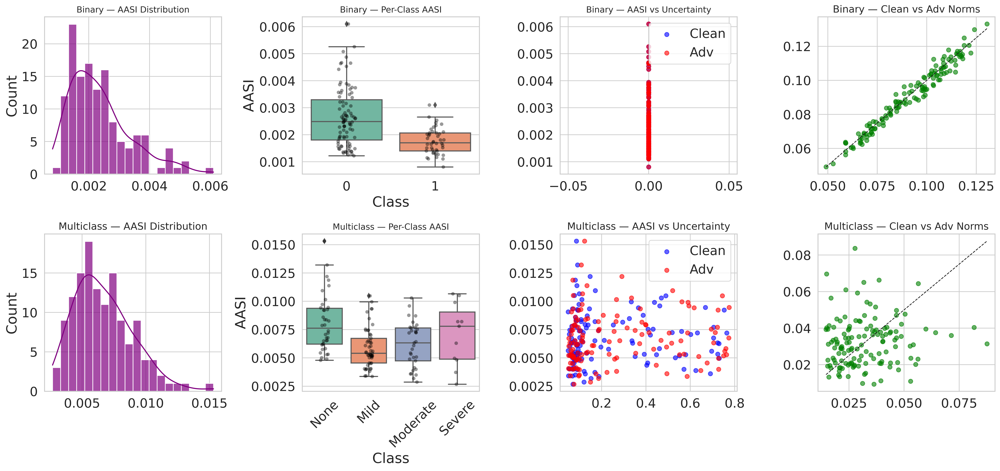

In [220]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import entropy
import torch

def condensed_binary_multiclass_summary(
    model_bin, X_clean_bin, X_adv_bin, shap_clean_bin, shap_adv_bin, y_bin,
    model_multi, X_clean_multi, X_adv_multi, shap_clean_multi, shap_adv_multi, y_multi,
    class_names_multi=None, device=None, num_mc_samples=30
):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # ===== Helper to compute AASI, uncertainty, and norms =====
    def compute_metrics(model, X_clean, X_adv, shap_clean, shap_adv):
        # Aggregate SHAP
        if isinstance(shap_clean, list):
            shap_clean_arr = np.mean(np.stack(shap_clean, axis=0), axis=0)
            shap_adv_arr = np.mean(np.stack(shap_adv, axis=0), axis=0)
        else:
            shap_clean_arr = shap_clean
            shap_adv_arr = shap_adv

        # AASI
        aasi_values = np.mean(np.abs(shap_clean_arr - shap_adv_arr), axis=1)

        # MC Dropout predictive entropy
        def mc_dropout_entropy(X):
            model.train()
            X_tensor = torch.tensor(X.values, dtype=torch.float32).to(device)
            probs_list = []
            with torch.no_grad():
                for _ in range(num_mc_samples):
                    outputs = model(X_tensor)
                    probs = torch.softmax(outputs, dim=1).cpu().numpy()
                    probs_list.append(probs)
            mean_probs = np.mean(np.stack(probs_list), axis=0)
            return entropy(mean_probs.T)

        unc_clean = mc_dropout_entropy(X_clean)
        unc_adv = mc_dropout_entropy(X_adv)

        # Norms
        clean_norms = np.linalg.norm(shap_clean_arr, axis=1)
        adv_norms = np.linalg.norm(shap_adv_arr, axis=1)

        return aasi_values, unc_clean, unc_adv, clean_norms, adv_norms

    # ===== Binary =====
    aasi_bin, unc_clean_bin, unc_adv_bin, norms_clean_bin, norms_adv_bin = compute_metrics(
        model_bin, X_clean_bin, X_adv_bin, shap_clean_bin, shap_adv_bin
    )

    # ===== Multiclass =====
    aasi_multi, unc_clean_multi, unc_adv_multi, norms_clean_multi, norms_adv_multi = compute_metrics(
        model_multi, X_clean_multi, X_adv_multi, shap_clean_multi, shap_adv_multi
    )

    # ===== Prepare figure =====
    fig, axes = plt.subplots(2, 4, figsize=(20, 10), dpi=450)
    metrics_titles = ["AASI Distribution", "Per-Class AASI", "AASI vs Uncertainty", "Clean vs Adv Norms"]

    # ===== Row 1 — Binary =====
    sns.histplot(aasi_bin, bins=20, kde=True, color="purple", alpha=0.7, ax=axes[0, 0])
    axes[0, 0].set_title(f"Binary — {metrics_titles[0]}", fontsize=12)

    df_bin = pd.DataFrame({"AASI": aasi_bin, "Class": y_bin})
    sns.boxplot(x="Class", y="AASI", data=df_bin, palette="Set2", ax=axes[0, 1])
    sns.stripplot(x="Class", y="AASI", data=df_bin, color="black", alpha=0.4, jitter=True, ax=axes[0, 1])
    axes[0, 1].set_title(f"Binary — {metrics_titles[1]}", fontsize=12)

    axes[0, 2].scatter(unc_clean_bin, aasi_bin, alpha=0.6, label="Clean", color="blue")
    axes[0, 2].scatter(unc_adv_bin, aasi_bin, alpha=0.6, label="Adv", color="red")
    axes[0, 2].set_title(f"Binary — {metrics_titles[2]}", fontsize=12)
    axes[0, 2].legend()

    axes[0, 3].scatter(norms_clean_bin, norms_adv_bin, alpha=0.6, color="green")
    axes[0, 3].plot([norms_clean_bin.min(), norms_clean_bin.max()],
                    [norms_clean_bin.min(), norms_clean_bin.max()], 'k--', lw=1)
    axes[0, 3].set_title(f"Binary — {metrics_titles[3]}", fontsize=14)

    # ===== Row 2 — Multiclass =====
    sns.histplot(aasi_multi, bins=20, kde=True, color="purple", alpha=0.7, ax=axes[1, 0])
    axes[1, 0].set_title(f"Multiclass — {metrics_titles[0]}", fontsize=14)

    df_multi = pd.DataFrame({"AASI": aasi_multi, "Class": y_multi})
    if class_names_multi is not None:
        df_multi["Class"] = df_multi["Class"].map(lambda c: class_names_multi[c] if c < len(class_names_multi) else f"Class {c}")
    sns.boxplot(x="Class", y="AASI", data=df_multi, palette="Set2", ax=axes[1, 1])
    sns.stripplot(x="Class", y="AASI", data=df_multi, color="black", alpha=0.4, jitter=True, ax=axes[1, 1])
    axes[1, 1].set_title(f"Multiclass — {metrics_titles[1]}", fontsize=12)
    axes[1, 1].tick_params(axis='x', rotation=45)

    axes[1, 2].scatter(unc_clean_multi, aasi_multi, alpha=0.6, label="Clean", color="blue")
    axes[1, 2].scatter(unc_adv_multi, aasi_multi, alpha=0.6, label="Adv", color="red")
    axes[1, 2].set_title(f"Multiclass — {metrics_titles[2]}", fontsize=14)
    axes[1, 2].legend()

    axes[1, 3].scatter(norms_clean_multi, norms_adv_multi, alpha=0.6, color="green")
    axes[1, 3].plot([norms_clean_multi.min(), norms_clean_multi.max()],
                    [norms_clean_multi.min(), norms_clean_multi.max()], 'k--', lw=1)
    axes[1, 3].set_title(f"Multiclass — {metrics_titles[3]}", fontsize=14)

    # ===== Main title & save =====
    #fig.suptitle("Condensed Binary vs Multiclass — Robustness–XAI Summary", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig("condensed_binary_multiclass_aasi_summary2.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
condensed_binary_multiclass_summary(
    model_bin=model_bin,
    X_clean_bin=X_test_bin_selected,
    X_adv_bin=X_test_bin_selected_adv,
    shap_clean_bin=shap_values_bin_clean,
    shap_adv_bin=shap_values_bin_adv,
    y_bin=y_test_bin.values,
    model_multi=model_multi,
    X_clean_multi=X_test_multi_selected,
    X_adv_multi=X_test_multi_selected_adv,
    shap_clean_multi=shap_values_multi_clean,
    shap_adv_multi=shap_values_multi_adv,
    y_multi=y_test_multi.values,
    class_names_multi=["None", "Mild", "Moderate", "Severe"],
    num_mc_samples=30
)

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
When grouping with a length-1 list-like, you will 

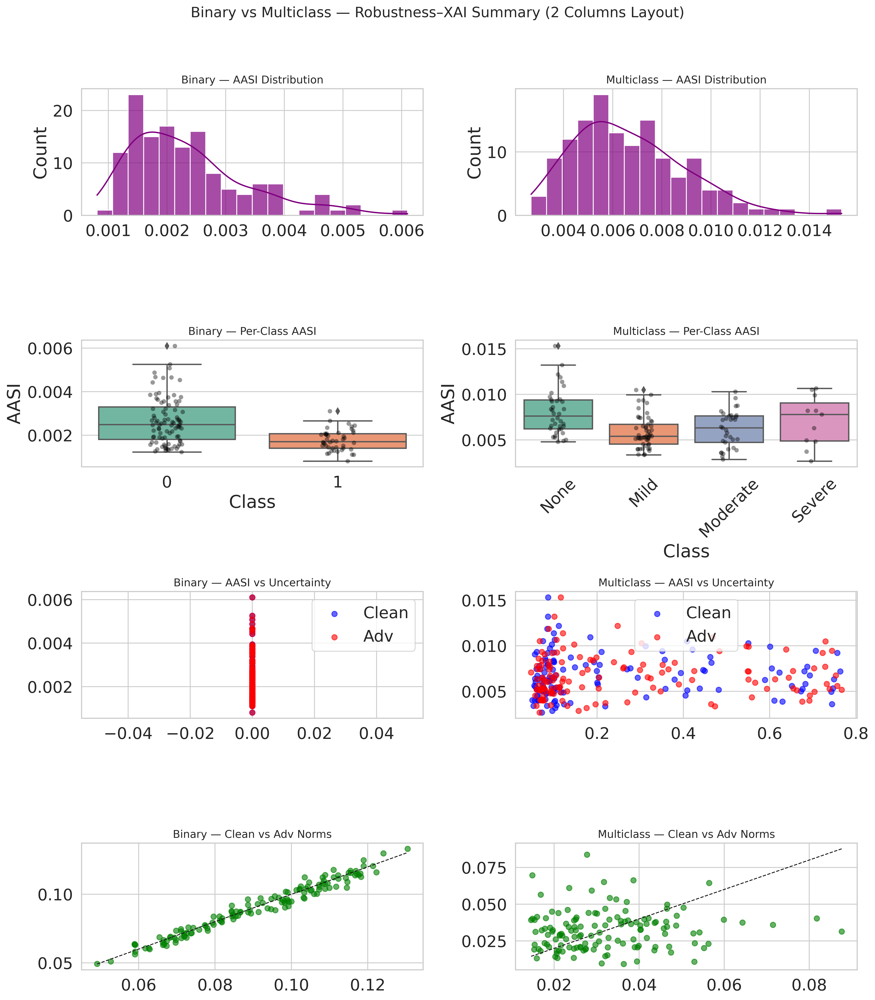

In [216]:
def condensed_binary_multiclass_summary_2cols(
    model_bin, X_clean_bin, X_adv_bin, shap_clean_bin, shap_adv_bin, y_bin,
    model_multi, X_clean_multi, X_adv_multi, shap_clean_multi, shap_adv_multi, y_multi,
    class_names_multi=None, device=None, num_mc_samples=30
):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # ===== Helper to compute metrics =====
    def compute_metrics(model, X_clean, X_adv, shap_clean, shap_adv):
        if isinstance(shap_clean, list):
            shap_clean_arr = np.mean(np.stack(shap_clean, axis=0), axis=0)
            shap_adv_arr = np.mean(np.stack(shap_adv, axis=0), axis=0)
        else:
            shap_clean_arr = shap_clean
            shap_adv_arr = shap_adv

        aasi_values = np.mean(np.abs(shap_clean_arr - shap_adv_arr), axis=1)

        def mc_dropout_entropy(X):
            model.train()
            X_tensor = torch.tensor(X.values, dtype=torch.float32).to(device)
            probs_list = []
            with torch.no_grad():
                for _ in range(num_mc_samples):
                    outputs = model(X_tensor)
                    probs = torch.softmax(outputs, dim=1).cpu().numpy()
                    probs_list.append(probs)
            mean_probs = np.mean(np.stack(probs_list), axis=0)
            return entropy(mean_probs.T)

        unc_clean = mc_dropout_entropy(X_clean)
        unc_adv = mc_dropout_entropy(X_adv)

        clean_norms = np.linalg.norm(shap_clean_arr, axis=1)
        adv_norms = np.linalg.norm(shap_adv_arr, axis=1)

        return aasi_values, unc_clean, unc_adv, clean_norms, adv_norms

    # ===== Binary =====
    aasi_bin, unc_clean_bin, unc_adv_bin, norms_clean_bin, norms_adv_bin = compute_metrics(
        model_bin, X_clean_bin, X_adv_bin, shap_clean_bin, shap_adv_bin
    )

    # ===== Multiclass =====
    aasi_multi, unc_clean_multi, unc_adv_multi, norms_clean_multi, norms_adv_multi = compute_metrics(
        model_multi, X_clean_multi, X_adv_multi, shap_clean_multi, shap_adv_multi
    )

    # ===== Prepare plotting =====
    fig, axes = plt.subplots(4, 2, figsize=(14, 16), dpi=450)  # 4 rows × 2 columns
    metrics_titles = ["AASI Distribution", "Per-Class AASI", "AASI vs Uncertainty", "Clean vs Adv Norms"]

    # Row 1 — AASI Distribution
    sns.histplot(aasi_bin, bins=20, kde=True, color="purple", alpha=0.7, ax=axes[0, 0])
    axes[0, 0].set_title(f"Binary — {metrics_titles[0]}", fontsize=12)

    sns.histplot(aasi_multi, bins=20, kde=True, color="purple", alpha=0.7, ax=axes[0, 1])
    axes[0, 1].set_title(f"Multiclass — {metrics_titles[0]}", fontsize=12)

    # Row 2 — Per-Class AASI
    df_bin = pd.DataFrame({"AASI": aasi_bin, "Class": y_bin})
    sns.boxplot(x="Class", y="AASI", data=df_bin, palette="Set2", ax=axes[1, 0])
    sns.stripplot(x="Class", y="AASI", data=df_bin, color="black", alpha=0.4, jitter=True, ax=axes[1, 0])
    axes[1, 0].set_title(f"Binary — {metrics_titles[1]}", fontsize=12)

    df_multi = pd.DataFrame({"AASI": aasi_multi, "Class": y_multi})
    if class_names_multi is not None:
        df_multi["Class"] = df_multi["Class"].map(lambda c: class_names_multi[c] if c < len(class_names_multi) else f"Class {c}")
    sns.boxplot(x="Class", y="AASI", data=df_multi, palette="Set2", ax=axes[1, 1])
    sns.stripplot(x="Class", y="AASI", data=df_multi, color="black", alpha=0.4, jitter=True, ax=axes[1, 1])
    axes[1, 1].set_title(f"Multiclass — {metrics_titles[1]}", fontsize=12)
    axes[1, 1].tick_params(axis='x', rotation=45)

    # Row 3 — AASI vs Uncertainty
    axes[2, 0].scatter(unc_clean_bin, aasi_bin, alpha=0.6, label="Clean", color="blue")
    axes[2, 0].scatter(unc_adv_bin, aasi_bin, alpha=0.6, label="Adv", color="red")
    axes[2, 0].set_title(f"Binary — {metrics_titles[2]}", fontsize=12)
    axes[2, 0].legend()

    axes[2, 1].scatter(unc_clean_multi, aasi_multi, alpha=0.6, label="Clean", color="blue")
    axes[2, 1].scatter(unc_adv_multi, aasi_multi, alpha=0.6, label="Adv", color="red")
    axes[2, 1].set_title(f"Multiclass — {metrics_titles[2]}", fontsize=12)
    axes[2, 1].legend()

    # Row 4 — Clean vs Adv Norms
    axes[3, 0].scatter(norms_clean_bin, norms_adv_bin, alpha=0.6, color="green")
    axes[3, 0].plot([norms_clean_bin.min(), norms_clean_bin.max()],
                    [norms_clean_bin.min(), norms_clean_bin.max()], 'k--', lw=1)
    axes[3, 0].set_title(f"Binary — {metrics_titles[3]}", fontsize=12)

    axes[3, 1].scatter(norms_clean_multi, norms_adv_multi, alpha=0.6, color="green")
    axes[3, 1].plot([norms_clean_multi.min(), norms_clean_multi.max()],
                    [norms_clean_multi.min(), norms_clean_multi.max()], 'k--', lw=1)
    axes[3, 1].set_title(f"Multiclass — {metrics_titles[3]}", fontsize=12)

    fig.suptitle("Binary vs Multiclass — Robustness–XAI Summary (2 Columns Layout)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig("binary_multiclass_aasi_summary_2cols.png", dpi=450, bbox_inches="tight")
    plt.show()

# ===== Example usage =====
condensed_binary_multiclass_summary_2cols(
    model_bin=model_bin,
    X_clean_bin=X_test_bin_selected,
    X_adv_bin=X_test_bin_selected_adv,
    shap_clean_bin=shap_values_bin_clean,
    shap_adv_bin=shap_values_bin_adv,
    y_bin=y_test_bin.values,
    model_multi=model_multi,
    X_clean_multi=X_test_multi_selected,
    X_adv_multi=X_test_multi_selected_adv,
    shap_clean_multi=shap_values_multi_clean,
    shap_adv_multi=shap_values_multi_adv,
    y_multi=y_test_multi.values,
    class_names_multi=["None", "Mild", "Moderate", "Severe"],
    num_mc_samples=30
)

In [ ]:
# === Step 1: Import ML Models ===
from sklearn.linear_model import LogisticRegression, SGDClassifier, RidgeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier
)
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.preprocessing import label_binarize

# === Step 2: Define Models Dictionary ===
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, multi_class='ovr'),
    "Naive Bayes": GaussianNB(),
    "SVM": SVC(probability=True),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
    "LightGBM": LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0),
    "KNN": KNeighborsClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "QDA": QuadraticDiscriminantAnalysis(),
    "LDA": LinearDiscriminantAnalysis(),
    "SGD (Log Loss)": SGDClassifier(loss='log_loss'),
    "Ridge Classifier": RidgeClassifier(),
    "Lasso": LogisticRegression(penalty='l1', solver='saga', max_iter=10000, multi_class='ovr')
}

# === Step 3: Prepare for Multiclass Evaluation ===
classes = sorted(y_test_multi.unique())
y_test_multi_bin = label_binarize(y_test_multi, classes=classes)

# === Step 4: Evaluate Models on Clean Multiclass Data ===
results_multi_clean = []

for name, model in models.items():
    try:
        # Train
        model.fit(X_train_multi_selected, y_res_multi)
        y_pred = model.predict(X_test_multi_selected)

        # Probabilities for AUC (if available)
        if hasattr(model, "predict_proba"):
            y_proba = model.predict_proba(X_test_multi_selected)
            auc = roc_auc_score(y_test_multi_bin, y_proba, multi_class='ovr')
        else:
            auc = None

        acc = accuracy_score(y_test_multi, y_pred)
        f1 = f1_score(y_test_multi, y_pred, average='macro')

        results_multi_clean.append({
            'Model': name,
            'Accuracy': round(acc * 100, 2),
            'Macro F1': round(f1 * 100, 2),
            'AUC (OVR)': round(auc * 100, 2) if auc is not None else "N/A"
        })

    except Exception as e:
        print(f"❌ {name} failed on multiclass test set: {e}")

# === Step 5: Display Final Table ===
df_results_multi_clean = pd.DataFrame(results_multi_clean).sort_values(by='Macro F1', ascending=False)
display(df_results_multi_clean)

In [ ]:
from tensorflow.keras.utils import to_categorical

# One-hot encode training and test targets
y_train_multi_cat = to_categorical(y_res_multi)
y_test_multi_cat = to_categorical(y_test_multi)

num_classes = y_train_multi_cat.shape[1]
input_dim = X_train_multi_selected.shape[1]

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

def build_surrogate_multiclass(input_dim, num_classes):
    model = Sequential([
        Dense(64, activation='relu', input_shape=(input_dim,)),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer=Adam(1e-3), loss='categorical_crossentropy')
    return model

# Train surrogate model
surrogate_multi = build_surrogate_multiclass(input_dim, num_classes)
surrogate_multi.fit(X_train_multi_selected, y_train_multi_cat, epochs=20, batch_size=32, verbose=0)

def generate_fgsm_adversarial_examples_multiclass(model, X, y_cat, epsilon=0.05):
    X_tensor = tf.convert_to_tensor(X, dtype=tf.float32)
    y_tensor = tf.convert_to_tensor(y_cat, dtype=tf.float32)

    with tf.GradientTape() as tape:
        tape.watch(X_tensor)
        preds = model(X_tensor)
        loss = tf.keras.losses.categorical_crossentropy(y_true=y_tensor, y_pred=preds)

    gradients = tape.gradient(loss, X_tensor)
    perturbations = epsilon * tf.sign(gradients)
    X_adv = X_tensor + perturbations
    X_adv = tf.clip_by_value(X_adv, 0, 1)  # Keep within valid range
    return X_adv.numpy()

# Generate adversarial samples from test set
X_test_fgsm_multi = generate_fgsm_adversarial_examples_multiclass(surrogate_multi, X_test_multi_selected, y_test_multi_cat, epsilon=0.05)

# Evaluate all models on FGSM samples
results_fgsm_multi = []
y_test_multi_bin = label_binarize(y_test_multi, classes=classes)

for name, model in models.items():
    try:
        y_pred = model.predict(X_test_fgsm_multi)

        # AUC (if supported)
        if hasattr(model, "predict_proba"):
            y_proba = model.predict_proba(X_test_fgsm_multi)
            auc = roc_auc_score(y_test_multi_bin, y_proba, multi_class='ovr')
        else:
            auc = None

        acc = accuracy_score(y_test_multi, y_pred)
        f1 = f1_score(y_test_multi, y_pred, average='macro')

        results_fgsm_multi.append({
            'Model': name,
            'Accuracy (FGSM)': round(acc * 100, 2),
            'Macro F1 (FGSM)': round(f1 * 100, 2),
            'AUC (FGSM)': round(auc * 100, 2) if auc is not None else "N/A"
        })
        
    except Exception as e:
        print(f"❌ {name} failed on FGSM multiclass data: {e}")

# Display Results
df_results_fgsm_multi = pd.DataFrame(results_fgsm_multi).sort_values(by='Macro F1 (FGSM)', ascending=False)
display(df_results_fgsm_multi)

In [ ]:
def generate_pgd_adversarial_examples_multiclass(model, X, y_cat, epsilon=0.05, alpha=0.01, num_iter=10):
    X_adv = tf.convert_to_tensor(X, dtype=tf.float32)

    for _ in range(num_iter):
        with tf.GradientTape() as tape:
            tape.watch(X_adv)
            preds = model(X_adv)
            loss = tf.keras.losses.categorical_crossentropy(y_true=y_cat, y_pred=preds)
        gradients = tape.gradient(loss, X_adv)
        X_adv = X_adv + alpha * tf.sign(gradients)
        X_adv = tf.clip_by_value(X_adv, X - epsilon, X + epsilon)
        X_adv = tf.clip_by_value(X_adv, 0.0, 1.0)  # Keep input valid

    return X_adv.numpy()

from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.preprocessing import label_binarize

epsilons = [0.01, 0.03, 0.05, 0.07]
pgd_records_multi = []

# One-hot for surrogate loss
y_test_multi_cat = to_categorical(y_test_multi)
y_test_multi_bin = label_binarize(y_test_multi, classes=classes)  # For AUC

for eps in epsilons:
    print(f"\n⚠️ PGD Evaluation at ε = {eps}")
    X_pgd_multi = generate_pgd_adversarial_examples_multiclass(
        model=surrogate_multi,
        X=X_test_multi_selected,
        y_cat=y_test_multi_cat,
        epsilon=eps,
        alpha=eps / 5
    )

    for name, model in models.items():
        try:
            y_pred = model.predict(X_pgd_multi)

            # AUC
            if hasattr(model, "predict_proba"):
                y_proba = model.predict_proba(X_pgd_multi)
                auc = roc_auc_score(y_test_multi_bin, y_proba, multi_class='ovr')
            else:
                auc = None

            acc = accuracy_score(y_test_multi, y_pred)
            f1 = f1_score(y_test_multi, y_pred, average='macro')

            pgd_records_multi.append({
                'Model': name,
                'Epsilon': eps,
                'Accuracy (PGD)': round(acc * 100, 2),
                'F1 Score (PGD)': round(f1 * 100, 2),
                'AUC (PGD)': round(auc * 100, 2) if auc is not None else "N/A"
            })

        except Exception as e:
            print(f"❌ {name} failed at ε={eps}: {e}")

df_results_pgd_multi = pd.DataFrame(pgd_records_multi)
display(df_results_pgd_multi)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")
plt.figure(figsize=(18, 5), dpi=300)

# === AUC Degradation Plot ===
plt.subplot(1, 3, 1)
df_auc = df_results_pgd_multi[df_results_pgd_multi["AUC (PGD)"] != "N/A"]
df_auc["AUC (PGD)"] = df_auc["AUC (PGD)"].astype(float)
sns.lineplot(data=df_auc, x='Epsilon', y='AUC (PGD)', hue='Model', marker='o')
plt.title('🔻 AUC Degradation vs Epsilon (Multiclass)')
plt.xlabel('Epsilon (PGD Attack Strength)')
plt.ylabel('AUC Score')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# === Accuracy Degradation Plot ===
plt.subplot(1, 3, 2)
sns.lineplot(data=df_results_pgd_multi, x='Epsilon', y='Accuracy (PGD)', hue='Model', marker='s')
plt.title('🔻 Accuracy Degradation vs Epsilon (Multiclass)')
plt.xlabel('Epsilon (PGD Attack Strength)')
plt.ylabel('Accuracy (%)')
plt.legend([],[], frameon=False)

# === F1 Score Degradation Plot ===
plt.subplot(1, 3, 3)
sns.lineplot(data=df_results_pgd_multi, x='Epsilon', y='F1 Score (PGD)', hue='Model', marker='^')
plt.title('🔻 F1 Score Degradation vs Epsilon (Multiclass)')
plt.xlabel('Epsilon (PGD Attack Strength)')
plt.ylabel('F1 Score (%)')
plt.legend([],[], frameon=False)

plt.tight_layout()
plt.show()

In [ ]:
# === Required Imports ===
import torch
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# === Multi-Head Self-Attention Block ===
class MultiHeadAttentionBlock(nn.Module):
    def __init__(self, d_model, n_heads, dropout=0.1):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=n_heads, batch_first=True)
        self.norm1 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        attn_output, _ = self.attn(x, x, x)
        x = self.norm1(x + self.dropout(attn_output))
        return x

# === Transformer Encoder Block ===
class TransformerEncoderBlock(nn.Module):
    def __init__(self, d_model, n_heads, dim_feedforward=128, dropout=0.1):
        super().__init__()
        self.attn_block = MultiHeadAttentionBlock(d_model, n_heads, dropout)
        self.ff = nn.Sequential(
            nn.Linear(d_model, dim_feedforward),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(dim_feedforward, d_model)
        )
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        x = self.attn_block(x)
        ff_output = self.ff(x)
        x = self.norm2(x + self.dropout(ff_output))
        return x

class TabularTransformerMulticlass(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=64, n_heads=4, n_layers=2, dropout=0.2):
        super().__init__()
        self.project = nn.Linear(input_dim, d_model)
        self.encoder_blocks = nn.ModuleList([
            TransformerEncoderBlock(d_model, n_heads, dropout=dropout) for _ in range(n_layers)
        ])
        self.output = nn.Sequential(
            nn.Flatten(),
            nn.Linear(d_model, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, num_classes)  # No softmax here; CrossEntropyLoss handles it
        )

    def forward(self, x):
        x = self.project(x).unsqueeze(1)
        for block in self.encoder_blocks:
            x = block(x)
        return self.output(x)  # raw logits

In [ ]:
X_tensor = torch.tensor(X_train_multi_selected.values, dtype=torch.float32)
y_tensor = torch.tensor(y_res_multi.values, dtype=torch.long)  # Long for CE Loss

X_test_tensor = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long)

num_classes = len(np.unique(y_res_multi))

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score
import numpy as np

def evaluate_multiclass(model, X_val, y_val):
    model.eval()
    with torch.no_grad():
        logits = model(X_val)
        preds = torch.argmax(logits, dim=1)
        acc = accuracy_score(y_val.cpu(), preds.cpu())
        f1 = f1_score(y_val.cpu(), preds.cpu(), average='macro')
    return acc, f1

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
all_metrics = {'Accuracy': [], 'F1': []}

for fold, (train_idx, val_idx) in enumerate(kfold.split(X_tensor, y_res_multi.values)):
    print(f"\n🔁 Fold {fold+1}/5")

    X_train_fold = X_tensor[train_idx]
    y_train_fold = y_tensor[train_idx]
    X_val_fold = X_tensor[val_idx]
    y_val_fold = y_tensor[val_idx]

    model = TabularTransformerMulticlass(input_dim=X_tensor.shape[1], num_classes=num_classes)
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
    criterion = nn.CrossEntropyLoss()

    for epoch in range(50):
        model.train()
        optimizer.zero_grad()
        logits = model(X_train_fold)
        loss = criterion(logits, y_train_fold)
        loss.backward()
        optimizer.step()

    acc, f1 = evaluate_multiclass(model, X_val_fold, y_val_fold)
    print(f"✅ Fold {fold+1} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}")
    all_metrics['Accuracy'].append(acc)
    all_metrics['F1'].append(f1)

# === Cross-Validation Summary ===
print("\n📊 Cross-Validation Results (5-fold):")
for metric in all_metrics:
    mean = np.mean(all_metrics[metric])
    std = np.std(all_metrics[metric])
    print(f"{metric}: {mean:.4f} ± {std:.4f}")

In [ ]:
# Final model on all training data
final_model = TabularTransformerMulticlass(input_dim=X_tensor.shape[1], num_classes=num_classes)
optimizer = torch.optim.AdamW(final_model.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss()

# Train on full training set
for epoch in range(50):
    final_model.train()
    optimizer.zero_grad()
    logits = final_model(X_tensor)
    loss = criterion(logits, y_tensor)
    loss.backward()
    optimizer.step()

# Evaluate on test set
final_model.eval()
with torch.no_grad():
    logits_test = final_model(X_test_tensor)
    preds_test = torch.argmax(logits_test, dim=1)
    acc = accuracy_score(y_test_tensor, preds_test)
    f1 = f1_score(y_test_tensor, preds_test, average='macro')

print("\n📌 Hold-out Test Set Results:")
print(f"Accuracy: {acc:.4f}")
print(f"F1 Score: {f1:.4f}")

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt

# === Label Smoothing Cross-Entropy ===
class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, smoothing=0.1):
        super().__init__()
        self.smoothing = smoothing

    def forward(self, pred, target):
        confidence = 1.0 - self.smoothing
        log_probs = F.log_softmax(pred, dim=-1)
        true_dist = torch.zeros_like(log_probs)
        true_dist.fill_(self.smoothing / (pred.size(1) - 1))
        true_dist.scatter_(1, target.unsqueeze(1), confidence)
        return torch.mean(torch.sum(-true_dist * log_probs, dim=-1))

# === Multi-Head Self-Attention Block ===
class MultiHeadAttentionBlock(nn.Module):
    def __init__(self, d_model, n_heads, dropout=0.1):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=n_heads, batch_first=True)
        self.norm1 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        attn_output, _ = self.attn(x, x, x)
        x = self.norm1(x + self.dropout(attn_output))
        return x

# === Transformer Encoder Block ===
class TransformerEncoderBlock(nn.Module):
    def __init__(self, d_model, n_heads, dim_feedforward=256, dropout=0.1):
        super().__init__()
        self.attn_block = MultiHeadAttentionBlock(d_model, n_heads, dropout)
        self.ff = nn.Sequential(
            nn.Linear(d_model, dim_feedforward),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(dim_feedforward, dim_feedforward),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(dim_feedforward, d_model)
        )
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        x = self.attn_block(x)
        ff_output = self.ff(x)
        x = self.norm2(x + self.dropout(ff_output))
        return x

# === Tabular Transformer with MC Dropout ===
class TabularTransformerMulticlass(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=128, n_heads=4, n_layers=2, dropout=0.1):
        super().__init__()
        self.project = nn.Linear(input_dim, d_model)
        self.encoder_blocks = nn.ModuleList([
            TransformerEncoderBlock(d_model, n_heads, dropout=dropout) for _ in range(n_layers)
        ])
        self.output = nn.Sequential(
            nn.Flatten(),
            nn.Linear(d_model, 128),
            nn.ReLU(),
            nn.Dropout(dropout),  # MC Dropout active at test time
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        x = self.project(x).unsqueeze(1)
        for block in self.encoder_blocks:
            x = block(x)
        return self.output(x)

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score

def train_with_early_stopping(model, optimizer, criterion, X_train, y_train, X_val, y_val, max_epochs=100, patience=10):
    best_acc = 0
    best_weights = None
    patience_counter = 0

    acc_curve, loss_curve = [], []

    for epoch in range(max_epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()

        model.eval()
        with torch.no_grad():
            val_logits = model(X_val)
            val_preds = torch.argmax(val_logits, dim=1)
            acc = accuracy_score(y_val.cpu(), val_preds.cpu())
            acc_curve.append(acc)
            loss_curve.append(loss.item())

            if acc > best_acc:
                best_acc = acc
                best_weights = model.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    break

    model.load_state_dict(best_weights)
    return best_acc, acc_curve, loss_curve

# === Run 5-Fold Training ===
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_curves = []

X_tensor = torch.tensor(X_train_multi_selected.values, dtype=torch.float32)
y_tensor = torch.tensor(y_res_multi.values, dtype=torch.long)

for fold, (train_idx, val_idx) in enumerate(kfold.split(X_tensor, y_res_multi.values)):
    print(f"\n🔁 Fold {fold+1}/5")
    X_train_fold, y_train_fold = X_tensor[train_idx], y_tensor[train_idx]
    X_val_fold, y_val_fold = X_tensor[val_idx], y_tensor[val_idx]

    model = TabularTransformerMulticlass(input_dim=X_tensor.shape[1], num_classes=len(np.unique(y_res_multi)))
    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)
    criterion = LabelSmoothingCrossEntropy(smoothing=0.1)

    acc, acc_curve, loss_curve = train_with_early_stopping(
        model, optimizer, criterion,
        X_train_fold, y_train_fold, X_val_fold, y_val_fold,
        max_epochs=100, patience=10
    )
    print(f"✅ Fold {fold+1} Best Accuracy: {acc:.4f}")
    all_curves.append((acc_curve, loss_curve))

In [ ]:
plt.figure(figsize=(14, 5))

# Accuracy curves
plt.subplot(1, 2, 1)
for i, (acc_curve, _) in enumerate(all_curves):
    plt.plot(acc_curve, label=f'Fold {i+1}')
plt.title('📈 Accuracy per Epoch (All Folds)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss curves
plt.subplot(1, 2, 2)
for i, (_, loss_curve) in enumerate(all_curves):
    plt.plot(loss_curve, label=f'Fold {i+1}')
plt.title('📉 Loss per Epoch (All Folds)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# === Convert full train and test sets to tensors ===
X_train_full = torch.tensor(X_train_multi_selected.values, dtype=torch.float32)
y_train_full = torch.tensor(y_res_multi.values, dtype=torch.long)

X_test_tensor = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long)

# === Final Model Initialization ===
final_model = TabularTransformerMulticlass(
    input_dim=X_train_full.shape[1],
    num_classes=len(np.unique(y_res_multi))
)
optimizer = torch.optim.AdamW(final_model.parameters(), lr=5e-4)
criterion = LabelSmoothingCrossEntropy(smoothing=0.1)

# === Early Stopping Parameters ===
best_acc = 0
best_weights = None
patience = 10
counter = 0
max_epochs = 100

for epoch in range(max_epochs):
    final_model.train()
    optimizer.zero_grad()
    outputs = final_model(X_train_full)
    loss = criterion(outputs, y_train_full)
    loss.backward()
    optimizer.step()

    # Evaluate on training data as proxy for early stopping
    final_model.eval()
    with torch.no_grad():
        val_logits = final_model(X_train_full)
        val_preds = torch.argmax(val_logits, dim=1)
        acc = accuracy_score(y_train_full.cpu(), val_preds.cpu())

        if acc > best_acc:
            best_acc = acc
            best_weights = final_model.state_dict()
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                break

# Load best weights
final_model.load_state_dict(best_weights)

# === Evaluate on Hold-out Test Set ===
final_model.eval()
with torch.no_grad():
    test_logits = final_model(X_test_tensor)
    test_preds = torch.argmax(test_logits, dim=1)

    acc = accuracy_score(y_test_tensor.cpu(), test_preds.cpu())
    f1 = f1_score(y_test_tensor.cpu(), test_preds.cpu(), average='macro')

print("\n📌 Final Hold-Out Test Set Evaluation:")
print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Macro F1 Score: {f1:.4f}")

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc, precision_recall_curve, average_precision_score
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize

# === Predict on Hold-out Test Set ===
final_model.eval()
with torch.no_grad():
    logits = final_model(X_test_tensor)
    probs = F.softmax(logits, dim=1).cpu().numpy()
    preds = torch.argmax(logits, dim=1).cpu().numpy()

# === Classification Report ===
print("📋 Classification Report:")
print(classification_report(y_test_tensor.cpu(), preds, digits=4))

# === Confusion Matrix ===
cm = confusion_matrix(y_test_tensor.cpu(), preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

# === Binarize Labels for Multi-Class ROC/PR Curves ===
classes = np.unique(y_test_tensor.cpu().numpy())
y_test_bin = label_binarize(y_test_tensor.cpu().numpy(), classes=classes)
n_classes = y_test_bin.shape[1]

# === ROC Curve (One-vs-Rest) ===
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.title("📈 ROC Curve (OvR)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Precision-Recall Curve ===
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], probs[:, i])
    pr_auc = average_precision_score(y_test_bin[:, i], probs[:, i])
    plt.plot(recall, precision, lw=2, label=f"Class {i} (AP = {pr_auc:.2f})")

plt.title("📉 Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# === FGSM Attack Function ===
def fgsm_attack(model, inputs, labels, epsilon=0.1):
    inputs.requires_grad = True
    outputs = model(inputs)
    loss = F.cross_entropy(outputs, labels)
    model.zero_grad()
    loss.backward()
    perturbation = epsilon * inputs.grad.data.sign()
    adv_inputs = inputs + perturbation
    return adv_inputs.detach()

# === Updated Final Training with FGSM Adversarial Training ===
final_model = TabularTransformerMulticlass(
    input_dim=X_train_full.shape[1],
    num_classes=len(np.unique(y_res_multi))
).to('cuda' if torch.cuda.is_available() else 'cpu')

device = next(final_model.parameters()).device
X_train_full = X_train_full.to(device)
y_train_full = y_train_full.to(device)
X_test_tensor = X_test_tensor.to(device)
y_test_tensor = y_test_tensor.to(device)

optimizer = torch.optim.AdamW(final_model.parameters(), lr=5e-4)
criterion = LabelSmoothingCrossEntropy(smoothing=0.1)

best_acc = 0
best_weights = None
patience = 10
counter = 0
max_epochs = 100
epsilon = 0.1  # Adversarial strength

for epoch in range(max_epochs):
    final_model.train()

    # === Clean Forward ===
    optimizer.zero_grad()
    clean_outputs = final_model(X_train_full)
    clean_loss = criterion(clean_outputs, y_train_full)

    # === FGSM Adversarial Forward ===
    adv_inputs = fgsm_attack(final_model, X_train_full.clone().detach(), y_train_full, epsilon=epsilon)
    adv_outputs = final_model(adv_inputs)
    adv_loss = criterion(adv_outputs, y_train_full)

    # === Combined Loss ===
    total_loss = 0.5 * clean_loss + 0.5 * adv_loss
    total_loss.backward()
    optimizer.step()

    # Early stopping based on clean training accuracy
    final_model.eval()
    with torch.no_grad():
        val_logits = final_model(X_train_full)
        val_preds = torch.argmax(val_logits, dim=1)
        acc = accuracy_score(y_train_full.cpu(), val_preds.cpu())

        if acc > best_acc:
            best_acc = acc
            best_weights = final_model.state_dict()
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                print(f"⏹️ Early stopping at epoch {epoch+1}")
                break

# Load best model
final_model.load_state_dict(best_weights)

# === Evaluate on Clean Test Set ===
final_model.eval()
with torch.no_grad():
    test_logits = final_model(X_test_tensor)
    test_preds = torch.argmax(test_logits, dim=1)

    acc = accuracy_score(y_test_tensor.cpu(), test_preds.cpu())
    f1 = f1_score(y_test_tensor.cpu(), test_preds.cpu(), average='macro')

print("\n📌 Final Hold-Out Test Set (Clean) Evaluation After FGSM Adversarial Training:")
print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Macro F1 Score: {f1:.4f}")

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

# === Enable dropout during inference ===
def mc_dropout_predict(model, X, T=50):
    model.train()  # keep dropout on
    all_probs = []

    for _ in range(T):
        with torch.no_grad():
            logits = model(X)
            probs = F.softmax(logits, dim=1).cpu().numpy()
            all_probs.append(probs)

    all_probs = np.stack(all_probs)  # shape: [T, N, C]
    mean_probs = np.mean(all_probs, axis=0)
    std_probs = np.std(all_probs, axis=0)
    entropy = -np.sum(mean_probs * np.log(mean_probs + 1e-8), axis=1)

    return mean_probs, std_probs, entropy

# === Run MC Dropout on Clean Test Set ===
T = 50  # number of stochastic forward passes
mean_probs, std_probs, entropy = mc_dropout_predict(final_model, X_test_tensor, T=T)

# === Evaluate performance ===
pred_labels = np.argmax(mean_probs, axis=1)
true_labels = y_test_tensor.cpu().numpy()

acc = accuracy_score(true_labels, pred_labels)
f1 = f1_score(true_labels, pred_labels, average='macro')
try:
    auc = roc_auc_score(true_labels, mean_probs, multi_class='ovr', average='macro')
except:
    auc = None

print("📊 MC Dropout-Based UQ Evaluation on Clean Test Set")
print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Macro F1 Score: {f1:.4f}")
print(f"✅ AUC (macro): {auc if auc is not None else 'N/A'}")

# Optional: Display uncertainty statistics
print(f"\n📉 Avg Std Deviation (Epistemic): {np.mean(std_probs):.4f}")
print(f"🧠 Avg Predictive Entropy (Total UQ): {np.mean(entropy):.4f}")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score

# === 1. Predictive Entropy Distribution ===
plt.figure(figsize=(6,4))
sns.histplot(entropy, bins=30, kde=True, color='purple')
plt.title("🔍 Predictive Entropy Distribution")
plt.xlabel("Entropy")
plt.ylabel("Count")
plt.grid(True)
plt.tight_layout()
plt.show()

# === 2. Epistemic Uncertainty (Std Deviation) ===
avg_std = np.mean(std_probs, axis=1)  # mean std across classes per sample

plt.figure(figsize=(6,4))
sns.histplot(avg_std, bins=30, kde=True, color='teal')
plt.title("🧠 Epistemic Uncertainty (Std Dev) Distribution")
plt.xlabel("Average Standard Deviation")
plt.ylabel("Count")
plt.grid(True)
plt.tight_layout()
plt.show()

# === 3. Confidence-Rejection Curve ===
# Confidence = max(mean probability per sample)
confidence = np.max(mean_probs, axis=1)
uncertainty = 1 - confidence
sorted_indices = np.argsort(uncertainty)  # ascending order (low uncertainty to high)
acc_list = []

for i in range(1, len(sorted_indices)+1):
    selected = sorted_indices[:i]
    acc = accuracy_score(true_labels[selected], pred_labels[selected])
    acc_list.append(acc)

plt.figure(figsize=(6,4))
plt.plot(np.linspace(0, 100, len(acc_list)), acc_list, color='darkgreen')
plt.title("📉 Confidence-Rejection Curve")
plt.xlabel("Retained Samples (%)")
plt.ylabel("Accuracy")
plt.grid(True)
plt.tight_layout()
plt.show()

# === 4. Optional: Radar Plot of Aggregate Uncertainty Metrics ===
from math import pi

labels = ['Avg Entropy', 'Max Entropy', 'Min Entropy', 
          'Avg Std', 'Max Std', 'Min Std']

values = [
    np.mean(entropy),
    np.max(entropy),
    np.min(entropy),
    np.mean(avg_std),
    np.max(avg_std),
    np.min(avg_std)
]

# Radar plot prep
values += values[:1]  # repeat the first value to close the circle
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]

plt.figure(figsize=(6,6))
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], labels, color='black', size=10)
ax.plot(angles, values, linewidth=2, linestyle='solid', color='royalblue')
ax.fill(angles, values, color='skyblue', alpha=0.4)
plt.title("📊 Radar Plot of Uncertainty Metrics", size=13, y=1.1)
plt.tight_layout()
plt.show()

In [ ]:
# Ensure model is in eval mode with gradients enabled
final_model.eval()

# Clone the test set and enable gradients
X_adv = X_test_tensor.clone().detach()
X_adv.requires_grad = True

# Forward pass
logits = final_model(X_adv)
loss = F.cross_entropy(logits, y_test_tensor)
final_model.zero_grad()
loss.backward()

# Generate FGSM perturbation
epsilon = 0.1  # Same as used in training
X_adv = X_adv + epsilon * X_adv.grad.sign()
X_adv = X_adv.detach()  # Detach for safety

In [ ]:
# === Run MC Dropout Predictions on Adversarial Data ===
num_mc_passes = 50

final_model.train()  # Enable dropout at test time

# Collect MC predictions: [N_samples, N_classes, N_passes]
mc_preds_adv = []
for _ in range(num_mc_passes):
    with torch.no_grad():
        logits = final_model(X_adv)
        probs = F.softmax(logits, dim=1)
        mc_preds_adv.append(probs.cpu().numpy())

mc_preds_adv = np.stack(mc_preds_adv, axis=2)  # shape: [N, C, T]
mean_probs_adv = np.mean(mc_preds_adv, axis=2)  # [N, C]
std_probs_adv = np.std(mc_preds_adv, axis=2)    # [N, C]
entropy_adv = -np.sum(mean_probs_adv * np.log(mean_probs_adv + 1e-8), axis=1)

true_labels_adv = y_test_tensor.cpu().numpy()
pred_labels_adv = np.argmax(mean_probs_adv, axis=1)
avg_std_adv = np.mean(std_probs_adv, axis=1)


In [ ]:
plt.figure(figsize=(6,4))
sns.histplot(entropy_adv, bins=30, kde=True, color='orangered')
plt.title("🔍 Adversarial Predictive Entropy Distribution")
plt.xlabel("Entropy")
plt.ylabel("Count")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
sns.histplot(avg_std_adv, bins=30, kde=True, color='darkorange')
plt.title("🧠 Adversarial Epistemic Uncertainty (Std Dev)")
plt.xlabel("Average Std Dev")
plt.ylabel("Count")
plt.grid(True)
plt.tight_layout()
plt.show()

confidence_adv = np.max(mean_probs_adv, axis=1)
uncertainty_adv = 1 - confidence_adv
sorted_indices_adv = np.argsort(uncertainty_adv)
acc_list_adv = []

for i in range(1, len(sorted_indices_adv)+1):
    selected = sorted_indices_adv[:i]
    acc = accuracy_score(true_labels_adv[selected], pred_labels_adv[selected])
    acc_list_adv.append(acc)

plt.figure(figsize=(6,4))
plt.plot(np.linspace(0, 100, len(acc_list_adv)), acc_list_adv, color='crimson')
plt.title("📉 Adversarial Confidence-Rejection Curve")
plt.xlabel("Retained Samples (%)")
plt.ylabel("Accuracy")
plt.grid(True)
plt.tight_layout()
plt.show()

from math import pi

labels = ['Avg Entropy', 'Max Entropy', 'Min Entropy', 
          'Avg Std', 'Max Std', 'Min Std']

values_adv = [
    np.mean(entropy_adv),
    np.max(entropy_adv),
    np.min(entropy_adv),
    np.mean(avg_std_adv),
    np.max(avg_std_adv),
    np.min(avg_std_adv)
]

values_adv += values_adv[:1]
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]

plt.figure(figsize=(6,6))
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], labels, color='black', size=10)
ax.plot(angles, values_adv, linewidth=2, linestyle='solid', color='darkred')
ax.fill(angles, values_adv, color='lightcoral', alpha=0.4)
plt.title("📊 Adversarial Uncertainty Metrics (Radar Plot)", size=13, y=1.1)
plt.tight_layout()
plt.show()

In [ ]:
def pgd_attack(model, inputs, labels, epsilon=0.1, alpha=0.01, iters=10):
    inputs = inputs.clone().detach().to(device)
    labels = labels.to(device)
    delta = torch.zeros_like(inputs, requires_grad=True).to(device)

    for _ in range(iters):
        outputs = model(inputs + delta)
        loss = F.cross_entropy(outputs, labels)
        model.zero_grad()
        loss.backward()
        delta.data = (delta + alpha * delta.grad.detach().sign()).clamp(-epsilon, epsilon)
        delta.grad.zero_()

    adv_inputs = (inputs + delta).detach()
    return adv_inputs

# Put model in eval mode
final_model.eval()

# Generate PGD adversarial test data
X_adv_pgd = pgd_attack(final_model, X_test_tensor, y_test_tensor, epsilon=0.1, alpha=0.01, iters=10)

import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# Enable dropout at test time
def enable_dropout(model):
    for m in model.modules():
        if isinstance(m, nn.Dropout):
            m.train()

enable_dropout(final_model)

# Perform multiple stochastic forward passes
num_mc_passes = 50
mc_preds_adv = []

for _ in range(num_mc_passes):
    with torch.no_grad():
        logits = final_model(X_adv_pgd)
        probs = F.softmax(logits, dim=1)
        mc_preds_adv.append(probs.cpu().numpy())

# Stack predictions
mc_preds_adv = np.stack(mc_preds_adv)
mean_probs_adv = mc_preds_adv.mean(axis=0)
std_probs_adv = mc_preds_adv.std(axis=0)
entropy_adv = -np.sum(mean_probs_adv * np.log(mean_probs_adv + 1e-8), axis=1)
mutual_info_adv = entropy_adv - np.mean(-np.sum(mc_preds_adv * np.log(mc_preds_adv + 1e-8), axis=2), axis=0)

# Plot Uncertainty Metrics
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.hist(entropy_adv, bins=30, color='darkred', alpha=0.7)
plt.title("Predictive Entropy (PGD Adversarial)")
plt.xlabel("Entropy")
plt.ylabel("Frequency")

plt.subplot(1, 3, 2)
plt.hist(std_probs_adv.max(axis=1), bins=30, color='orange', alpha=0.7)
plt.title("Max-Class Std Dev (PGD Adversarial)")
plt.xlabel("Standard Deviation")
plt.ylabel("Frequency")

plt.subplot(1, 3, 3)
plt.hist(mutual_info_adv, bins=30, color='purple', alpha=0.7)
plt.title("Mutual Information (PGD Adversarial)")
plt.xlabel("Mutual Info")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

In [ ]:
# Enable dropout for MC sampling
enable_dropout(final_model)

# Monte Carlo sampling
num_mc_passes = 50
mc_preds_clean = []

for _ in range(num_mc_passes):
    with torch.no_grad():
        logits = final_model(X_test_tensor)
        probs = F.softmax(logits, dim=1)
        mc_preds_clean.append(probs.cpu().numpy())

mc_preds_clean = np.stack(mc_preds_clean)
mean_probs_clean = mc_preds_clean.mean(axis=0)
std_probs_clean = mc_preds_clean.std(axis=0)
entropy_clean = -np.sum(mean_probs_clean * np.log(mean_probs_clean + 1e-8), axis=1)
mutual_info_clean = entropy_clean - np.mean(-np.sum(mc_preds_clean * np.log(mc_preds_clean + 1e-8), axis=2), axis=0)

import seaborn as sns

max_confidence = mean_probs_clean.max(axis=1)
plt.figure(figsize=(6, 5))
sns.scatterplot(x=max_confidence, y=entropy_clean, alpha=0.6)
plt.xlabel("Prediction Confidence (Max Prob)")
plt.ylabel("Predictive Entropy")
plt.title("Confidence vs. Entropy (Clean)")
plt.grid(True)
plt.show()

from sklearn.calibration import calibration_curve

y_true = y_test_tensor.cpu().numpy()
y_pred_labels = mean_probs_clean.argmax(axis=1)
y_pred_conf = mean_probs_clean.max(axis=1)

fraction_of_positives, mean_predicted_value = calibration_curve(
    (y_true == y_pred_labels).astype(int), y_pred_conf, n_bins=10
)

plt.figure(figsize=(6, 6))
plt.plot(mean_predicted_value, fraction_of_positives, marker='o', label='Model')
plt.plot([0, 1], [0, 1], 'k--', label='Perfectly Calibrated')
plt.xlabel("Mean Predicted Confidence")
plt.ylabel("Fraction of Correct Predictions")
plt.title("Reliability Diagram (Clean)")
plt.legend()
plt.grid(True)
plt.show()

from sklearn.metrics import f1_score

sorted_indices = np.argsort(max_confidence)
accuracies = []
f1s = []

for reject_frac in np.linspace(0, 0.5, 30):
    keep_n = int((1 - reject_frac) * len(sorted_indices))
    keep_idx = sorted_indices[-keep_n:]
    
    acc = accuracy_score(y_true[keep_idx], y_pred_labels[keep_idx])
    f1 = f1_score(y_true[keep_idx], y_pred_labels[keep_idx], average='macro')
    
    accuracies.append(acc)
    f1s.append(f1)

plt.figure(figsize=(7, 5))
plt.plot(np.linspace(0, 50, 30), accuracies, label='Accuracy')
plt.plot(np.linspace(0, 50, 30), f1s, label='Macro F1')
plt.xlabel("Rejection Rate (%)")
plt.ylabel("Performance")
plt.title("Confidence-Based Rejection Curve (Clean)")
plt.legend()
plt.grid(True)
plt.show()

pred_classes = y_pred_labels
plt.figure(figsize=(10, 6))
sns.violinplot(x=pred_classes, y=entropy_clean)
plt.xlabel("Predicted Class")
plt.ylabel("Predictive Entropy")
plt.title("Entropy per Predicted Class (Clean)")
plt.grid(True)
plt.show()

correct_mask = y_true == y_pred_labels
incorrect_mask = ~correct_mask

plt.figure(figsize=(8, 5))
sns.kdeplot(entropy_clean[correct_mask], label='Correct', fill=True)
sns.kdeplot(entropy_clean[incorrect_mask], label='Incorrect', fill=True)
plt.xlabel("Predictive Entropy")
plt.title("Uncertainty Distribution: Correct vs. Incorrect (Clean)")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
classwise_entropy = []
for cls in np.unique(y_pred_labels):
    class_entropy = entropy_clean[y_pred_labels == cls]
    classwise_entropy.append(class_entropy.mean())

plt.figure(figsize=(8, 5))
sns.barplot(x=np.unique(y_pred_labels), y=classwise_entropy)
plt.xlabel("Predicted Class")
plt.ylabel("Mean Predictive Entropy")
plt.title("Class-wise Mean Predictive Entropy (Clean)")
plt.grid(True)
plt.show()

plt.figure(figsize=(7, 5))
sns.scatterplot(x=np.arange(len(entropy_clean)), y=entropy_clean, hue=correct_mask, palette={True: "green", False: "red"}, alpha=0.6)
plt.xlabel("Sample Index")
plt.ylabel("Predictive Entropy")
plt.title("Per-Sample Uncertainty: Correct vs Incorrect Predictions")
plt.legend(title="Correct")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
sns.kdeplot(entropy_clean, label="Predictive Entropy", fill=True)
sns.kdeplot(mutual_info_clean, label="Mutual Information", fill=True)
plt.xlabel("Uncertainty Value")
plt.ylabel("Density")
plt.title("Distribution of Different Uncertainty Metrics")
plt.legend()
plt.grid(True)
plt.show()

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_embeds = tsne.fit_transform(mean_probs_clean)

plt.figure(figsize=(7, 6))
plt.scatter(tsne_embeds[:, 0], tsne_embeds[:, 1], c=entropy_clean, cmap='viridis', alpha=0.7)
plt.colorbar(label='Entropy')
plt.title("t-SNE of MC Mean Predictions (Colored by Entropy)")
plt.xlabel("t-SNE-1")
plt.ylabel("t-SNE-2")
plt.grid(True)
plt.show()

sorted_idx = np.argsort(entropy_clean)
accuracies = []
f1s = []
kept_frac = []

for keep_ratio in np.linspace(1.0, 0.5, 25):
    top_n = int(keep_ratio * len(sorted_idx))
    selected = sorted_idx[:top_n]

    acc = accuracy_score(y_true[selected], y_pred_labels[selected])
    f1 = f1_score(y_true[selected], y_pred_labels[selected], average='macro')

    accuracies.append(acc)
    f1s.append(f1)
    kept_frac.append(keep_ratio)

plt.figure(figsize=(7, 5))
plt.plot(kept_frac, accuracies, label="Accuracy")
plt.plot(kept_frac, f1s, label="Macro F1")
plt.xlabel("Fraction of Samples Kept")
plt.ylabel("Performance")
plt.title("Uncertainty Threshold Curve (Clean)")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from math import pi

class_labels = np.unique(y_pred_labels)
entropy_by_class = [entropy_clean[y_pred_labels == c].mean() for c in class_labels]
mi_by_class = [mutual_info_clean[y_pred_labels == c].mean() for c in class_labels]

labels = [f"Class {c}" for c in class_labels]
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
entropy_by_class += [entropy_by_class[0]]
mi_by_class += [mi_by_class[0]]
angles += [angles[0]]

plt.figure(figsize=(8, 6))
ax = plt.subplot(111, polar=True)
ax.plot(angles, entropy_by_class, label="Entropy", linewidth=2)
ax.plot(angles, mi_by_class, label="Mutual Info", linewidth=2)
ax.fill(angles, entropy_by_class, alpha=0.25)
ax.fill(angles, mi_by_class, alpha=0.25)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
plt.title("Per-Class Average UQ (Radar Plot)")
plt.legend()
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# === Compute predictive entropy and confidence ===
probs_mc = np.mean(mc_preds_clean, axis=0)
entropy = -np.sum(probs_mc * np.log(probs_mc + 1e-8), axis=1)
confidence = np.max(probs_mc, axis=1)
correct = (np.argmax(probs_mc, axis=1) == y_test_tensor.cpu().numpy())

# === Plot ===
plt.figure(figsize=(8, 6))
plt.scatter(confidence[correct], entropy[correct], c='green', label='Correct', alpha=0.6)
plt.scatter(confidence[~correct], entropy[~correct], c='red', label='Incorrect', alpha=0.6)
plt.axhline(y=np.median(entropy), color='gray', linestyle='--', linewidth=1)
plt.axvline(x=np.median(confidence), color='gray', linestyle='--', linewidth=1)
plt.xlabel("Prediction Confidence")
plt.ylabel("Predictive Entropy")
plt.title("🧠 Predictive Entropy vs. Confidence\n(Green=Correct, Red=Incorrect)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# === Enable dropout at test time ===
def enable_mc_dropout(model):
    for module in model.modules():
        if isinstance(module, torch.nn.Dropout):
            module.train()

enable_mc_dropout(final_model)

# === Perform MC sampling ===
import torch.nn.functional as F

num_mc_passes = 50
mc_preds = []

for _ in range(num_mc_passes):
    with torch.no_grad():
        logits = final_model(X_test_tensor)
        probs = F.softmax(logits, dim=1)
        mc_preds.append(probs.cpu().numpy())

In [ ]:
import numpy as np
from scipy.stats import entropy as scipy_entropy

mc_preds_array = np.stack(mc_preds, axis=0)  # shape: [n_mc, n_samples, n_classes]
mean_preds = mc_preds_array.mean(axis=0)     # shape: [n_samples, n_classes]
std_preds = mc_preds_array.std(axis=0)       # shape: [n_samples, n_classes]

# === Sample-wise metrics ===
confidence = np.max(mean_preds, axis=1)
pred_entropy = scipy_entropy(mean_preds.T)       # [n_samples]
pred_std = np.mean(std_preds, axis=1)            # [n_samples]

pred_label = np.argmax(mean_preds, axis=1)
true_label = y_test_tensor.cpu().numpy()
correct = (pred_label == true_label).astype(int)

In [ ]:
import pandas as pd
df_viz = pd.DataFrame({
    'Confidence': confidence,
    'Correct': ['Correct' if c else 'Incorrect' for c in correct]
})

plt.figure(figsize=(8, 6))
sns.violinplot(x='Correct', y='Confidence', data=df_viz, palette='Set2')
plt.title('Confidence Distribution: Correct vs Incorrect Predictions')
plt.grid(True)
plt.tight_layout()
plt.show()

from sklearn.calibration import calibration_curve

prob_true, prob_pred = calibration_curve(correct, confidence, n_bins=10)

plt.figure(figsize=(6, 6))
plt.plot(prob_pred, prob_true, marker='o', label='Model')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly Calibrated')
plt.xlabel('Confidence')
plt.ylabel('Accuracy')
plt.title('Reliability Diagram (Calibration Curve)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

from math import pi

# Select top misclassified samples
num_samples = 5
idxs = np.where(correct == 0)[0][:num_samples]

labels = ['Confidence', 'Entropy', 'Avg Std Dev']
data = []
for i in idxs:
    data.append([confidence[i], pred_entropy[i], pred_std[i]])

# Normalize
data = np.array(data)
data_min = data.min(axis=0)
data_max = data.max(axis=0)
data_norm = (data - data_min) / (data_max - data_min)

# Radar plot
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]

plt.figure(figsize=(7, 7))
for i, d in enumerate(data_norm):
    values = d.tolist()
    values += values[:1]
    plt.polar(angles, values, label=f'Sample {i+1}', alpha=0.7)

plt.xticks(angles[:-1], labels)
plt.title('Radar Plot: Uncertainty Profiles of Misclassified Samples')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

df_uncertainty = pd.DataFrame({
    'Confidence': confidence,
    'Entropy': pred_entropy,
    'Prediction Std': pred_std,
    'Correct': correct
})

plt.figure(figsize=(8, 6))
sns.heatmap(df_uncertainty.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Uncertainty Measures')
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(confidence, pred_entropy, c=correct, cmap='coolwarm', alpha=0.7)
plt.xlabel('Confidence')
plt.ylabel('Predictive Entropy')
plt.title('Predictive Entropy vs Confidence')
plt.colorbar(label='Correct (1) / Incorrect (0)')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import entropy
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# === Stack MC predictions ===
mc_preds_array = np.stack(mc_preds, axis=0)  # shape: [n_mc, n_samples, n_classes]
mean_preds = mc_preds_array.mean(axis=0)     # shape: [n_samples, n_classes]
std_preds = mc_preds_array.std(axis=0)       # shape: [n_samples, n_classes]
predicted_classes = np.argmax(mean_preds, axis=1)

# === Entropy (Aleatoric Uncertainty) ===
entropy_values = entropy(mean_preds.T)  # shape: [n_samples]

# === Mutual Information (Epistemic Uncertainty) ===
expected_entropy = entropy(mc_preds_array, axis=-1).mean(axis=0)  # shape: [n_samples]
mutual_info = entropy_values - expected_entropy  # shape: [n_samples]

# === UQ Metrics to DataFrame ===
uq_df = pd.DataFrame({
    'Sample': np.arange(len(entropy_values)),
    'Predicted Class': predicted_classes,
    'Entropy (Total)': entropy_values,
    'Expected Entropy (Aleatoric)': expected_entropy,
    'Mutual Information (Epistemic)': mutual_info,
    'Prediction Std': std_preds.std(axis=1)
})

# === Save to Excel ===
uq_df.to_excel("uncertainty_metrics_clean.xlsx", index=False)

# === Plot 1: Histogram of Entropy and Mutual Information ===
plt.figure(figsize=(10, 5))
sns.histplot(entropy_values, kde=True, color="skyblue", label="Total Entropy", bins=30)
sns.histplot(mutual_info, kde=True, color="orange", label="Mutual Information", bins=30)
plt.title("Distribution of Predictive Entropy and Mutual Information")
plt.xlabel("Uncertainty Score")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
plt.show()

# === Plot 2: Scatter Plot (Mutual Info vs Entropy) ===
plt.figure(figsize=(8, 6))
plt.scatter(entropy_values, mutual_info, alpha=0.6, c=predicted_classes, cmap='viridis')
plt.xlabel("Total Entropy")
plt.ylabel("Mutual Information (Epistemic)")
plt.title("Uncertainty Scatter by Predicted Class")
plt.colorbar(label="Predicted Class")
plt.tight_layout()
plt.show()

# === Plot 3: PCA/TSNE colored by entropy ===
pca = PCA(n_components=2)
flat_logits = mean_preds
reduced = pca.fit_transform(flat_logits)

plt.figure(figsize=(8, 6))
plt.scatter(reduced[:, 0], reduced[:, 1], c=entropy_values, cmap='plasma', alpha=0.7)
plt.colorbar(label="Predictive Entropy")
plt.title("PCA Visualization Colored by Entropy")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.tight_layout()
plt.show()

# === Plot 4: Violin Plot by Predicted Class ===
uq_df["Predicted Class"] = uq_df["Predicted Class"].astype(str)
plt.figure(figsize=(10, 6))
sns.violinplot(data=uq_df, x="Predicted Class", y="Entropy (Total)", inner="point")
plt.title("Distribution of Entropy per Predicted Class")
plt.tight_layout()
plt.show()

In [ ]:
import shap
import torch
import numpy as np

# Track the model's device properly
device = next(final_model.parameters()).device

# Convert tensors to numpy arrays
X_test_np = X_test_tensor.cpu().numpy()
X_train_np = X_train_full[:200].detach().cpu().numpy()  # background dataset

# Define a prediction function that works with numpy input and returns probabilities
def predict_fn(x_np):
    x_tensor = torch.tensor(x_np, dtype=torch.float32).to(device)
    final_model.eval()
    with torch.no_grad():
        logits = final_model(x_tensor)
        probs = torch.nn.functional.softmax(logits, dim=1)
    return probs.cpu().numpy()

# Initialize SHAP KernelExplainer with fixed predict function
explainer = shap.KernelExplainer(predict_fn, X_train_np)

# Compute SHAP values for the first 100 test samples
shap_values = explainer.shap_values(X_test_np[:100], nsamples="auto")

In [ ]:
# Summary bar plot
shap.summary_plot(shap_values, X_test_np[:100], feature_names=X.columns.tolist())

# Beeswarm plot
shap.summary_plot(shap_values, X_test_np[:100], feature_names=X.columns.tolist(), plot_type="violin")

In [ ]:
# For class 0 (can loop over all classes)
class_idx = 0
shap.summary_plot(shap_values[class_idx], X_test_np[:100], feature_names=X.columns.tolist(), show=True)

In [ ]:
# Waterfall plot for a single prediction for class 0
shap.plots._waterfall.waterfall_legacy(
    explainer.expected_value[class_idx],
    shap_values[class_idx][0],
    feature_names=X.columns.tolist()
)

In [ ]:
# Generate summary plots for all classes
for i in range(len(shap_values)):
    print(f"🔍 SHAP Summary Plot for Class {i}")
    shap.summary_plot(shap_values[i], X_test_np[:100], feature_names=X.columns.tolist(), show=True)

In [ ]:
X_train_tensor = X_train_full.detach().cpu() if hasattr(X_train_full, "detach") else torch.tensor(X_train_full, dtype=torch.float32)

In [ ]:
X_train_tensor = X_train_tensor.to(device)

with torch.no_grad():
    background_logits = final_model(X_train_tensor[:100])
    background_probs = torch.softmax(background_logits, dim=1)
    expected_value_class_0 = background_probs[:, 0].mean().item()

In [ ]:
shap.plots._waterfall.waterfall_legacy(
    expected_value_class_0,
    shap_values[0][0],
    feature_names=X.columns.tolist()  # or use the correct column list from your features
)

In [ ]:
import shap
import matplotlib.pyplot as plt

# Convert test data for plotting
X_test_np = X_test_sample.detach().cpu().numpy()  # ensure correct sample
feature_names = X.columns.tolist()

# Summary plot (beeswarm) for class 0
shap.summary_plot(shap_values[0], X_test_np, feature_names=feature_names, plot_type="dot")

In [ ]:
# Bar plot to show average magnitude of SHAP values
shap.summary_plot(shap_values[0], X_test_np, feature_names=feature_names, plot_type="bar")

In [ ]:
# Plot heatmap for top 20 samples and top 15 features
shap.plots.heatmap(shap.Explanation(values=shap_values[0][:20], 
                                     data=X_test_np[:20], 
                                     feature_names=feature_names))

In [ ]:
# === Convert selected training data to tensor ===
X_train_tensor = torch.tensor(X_train_multi_selected.values, dtype=torch.float32).to(device)

# === Compute model output on a small background sample ===
with torch.no_grad():
    background_logits = final_model(X_train_tensor[:100])  # use a small subset
    background_probs = torch.softmax(background_logits, dim=1)  # convert logits to probabilities
    expected_value = background_probs.mean(dim=0).cpu().numpy()  # mean across samples for each class

In [ ]:
for class_idx in range(len(shap_values)):
    print(f"\n🎯 SHAP Decision Plot for Class {class_idx}")
    shap.decision_plot(
        base_value=expected_value[class_idx],  # average model output for class
        shap_values=shap_values[class_idx][:10],
        features=X_test_df,
        feature_names=selected_feature_names
    )

In [ ]:
# === Use top 29 selected feature names from ANOVA selection ===
selected_feature_names = top_features_multi

# === Reconstruct top 10 test samples with correct feature names ===
X_test_df = pd.DataFrame(X_test_np[:10], columns=selected_feature_names)

# === SHAP Decision Plot for Class 0 ===
shap.decision_plot(
    base_value=expected_value_class_0,
    shap_values=shap_values[0][:10],
    features=X_test_df,
    feature_names=selected_feature_names
)

In [ ]:
import shap
import pandas as pd
import random
import os

# === Ensure output directory exists ===
os.makedirs("shap_force_plots_html", exist_ok=True)

# === Convert test data to DataFrame ===
X_test_np = X_test_multi_selected.to_numpy()
X_test_df = pd.DataFrame(X_test_np, columns=top_features_multi)

# === Use SHAP values for class 1 (you may change class index) ===
class_idx = 1
force_shap_values = shap_values[class_idx]
expected_val = expected_value[class_idx]

# === Select 5 random samples ===
random.seed(42)
sample_indices = random.sample(range(len(X_test_df)), 5)

# === Generate and save force plots ===
for i, idx in enumerate(sample_indices):
    sample_feats = X_test_df.iloc[idx:idx+1]  # SHAP expects 2D input
    sample_shap = force_shap_values[idx:idx+1]  # Same: keep as 2D

    force_plot = shap.force_plot(
        base_value=expected_val,
        shap_values=sample_shap,
        features=sample_feats,
        feature_names=top_features_multi
    )

    shap.save_html(f"shap_force_plots_html/force_plot_sample_{i+1}.html", force_plot)

print("✅ SHAP force plots saved in 'shap_force_plots_html/' as interactive HTML files.")

In [ ]:
from html2image import Html2Image
import os
import shap
import pandas as pd
import random

# === Setup ===
output_dir = "shap_force_plots"
html_dir = "shap_force_plots_html"
os.makedirs(output_dir, exist_ok=True)
os.makedirs(html_dir, exist_ok=True)

# === SHAP Setup ===
class_idx = 1  # Change if needed
shap_vals = shap_values[class_idx]
expected_val = expected_value[class_idx]

X_test_np = X_test_multi_selected.to_numpy()
X_test_df = pd.DataFrame(X_test_np, columns=top_features_multi)

# === Select 5 random samples ===
random.seed(42)
sample_indices = random.sample(range(len(X_test_df)), 5)

# === Initialize HTML-to-image converter ===
hti = Html2Image(browser_executable='chromium-browser')

for i, idx in enumerate(sample_indices):
    sample_feats = X_test_df.iloc[idx:idx+1]
    sample_shap = shap_vals[idx:idx+1]

    # Generate force plot
    force_plot = shap.force_plot(
        base_value=expected_val,
        shap_values=sample_shap,
        features=sample_feats,
        feature_names=top_features_multi
    )

    html_file = os.path.join(html_dir, f"force_plot_sample_{i+1}.html")
    png_file = os.path.join(output_dir, f"force_plot_sample_{i+1}.png")

    # Save HTML
    shap.save_html(html_file, force_plot)

    # Convert HTML to PNG
    hti.screenshot(
        html_file=html_file,
        save_as=os.path.basename(png_file),
        size=(1200, 400),
        output_path=output_dir
    )

print("✅ Saved SHAP force plots as PNGs in:", output_dir)

In [ ]:
# === PGD Adversarial Training Loop ===
def pgd_adversarial_training(model, X_train, y_train, optimizer, criterion, epsilon=0.1, alpha=0.01, iters=5, epochs=30):
    model.train()
    for epoch in range(epochs):
        epoch_loss = 0
        for i in range(X_train.size(0)):
            x_i = X_train[i].unsqueeze(0).clone().detach().requires_grad_(True)
            y_i = y_train[i].unsqueeze(0)

            # === PGD Attack ===
            x_adv = x_i.clone().detach()
            for _ in range(iters):
                x_adv.requires_grad = True
                logits = model(x_adv)
                loss = criterion(logits, y_i)
                model.zero_grad()
                loss.backward()
                x_adv = x_adv + alpha * x_adv.grad.sign()
                perturb = torch.clamp(x_adv - x_i, min=-epsilon, max=epsilon)
                x_adv = torch.clamp(x_i + perturb, min=0, max=1).detach()

            # === Train on adversarial example ===
            model.train()
            optimizer.zero_grad()
            logits_adv = model(x_adv)
            loss_adv = criterion(logits_adv, y_i)
            loss_adv.backward()
            optimizer.step()

            epoch_loss += loss_adv.item()

        print(f"Epoch {epoch+1}/{epochs} ➤ PGD Adv Train Loss: {epoch_loss / X_train.size(0):.4f}")

# Use previously defined model or re-instantiate
pgd_model = TabularTransformerMulticlass(
    input_dim=X_train_full.shape[1],
    num_classes=len(np.unique(y_res_multi))
)

optimizer = torch.optim.AdamW(pgd_model.parameters(), lr=5e-4)
criterion = LabelSmoothingCrossEntropy(smoothing=0.1)

# Run PGD-based adversarial training
pgd_adversarial_training(
    pgd_model,
    X_train_full,
    y_train_full,
    optimizer,
    criterion,
    epsilon=0.1, alpha=0.01, iters=5, epochs=30
)

pgd_model.eval()
with torch.no_grad():
    test_logits = pgd_model(X_test_tensor)
    test_preds = torch.argmax(test_logits, dim=1)

    acc = accuracy_score(y_test_tensor.cpu(), test_preds.cpu())
    f1 = f1_score(y_test_tensor.cpu(), test_preds.cpu(), average='macro')

print("\n📌 PGD-Trained Model ➤ Clean Test Set Evaluation:")
print(f"✅ Accuracy: {acc:.4f}")
print(f"✅ Macro F1 Score: {f1:.4f}")

In [ ]:
def fgsm_attack(model, inputs, labels, epsilon):
    inputs.requires_grad = True
    outputs = model(inputs)
    loss = F.cross_entropy(outputs, labels)
    model.zero_grad()
    loss.backward()
    perturbed = inputs + epsilon * inputs.grad.sign()
    return torch.clamp(perturbed, 0, 1).detach()

def pgd_attack(model, inputs, labels, epsilon=0.1, alpha=0.01, iters=5):
    x_adv = inputs.clone().detach()
    for _ in range(iters):
        x_adv.requires_grad = True
        logits = model(x_adv)
        loss = F.cross_entropy(logits, labels)
        model.zero_grad()
        loss.backward()
        x_adv = x_adv + alpha * x_adv.grad.sign()
        perturb = torch.clamp(x_adv - inputs, min=-epsilon, max=epsilon)
        x_adv = torch.clamp(inputs + perturb, min=0, max=1).detach()
    return x_adv

def evaluate_adversarial(model, X_test, y_test, attack_fn, epsilons, name="Attack"):
    model.eval()
    for eps in epsilons:
        X_test_adv = attack_fn(model, X_test.clone().detach(), y_test, epsilon=eps)
        with torch.no_grad():
            logits = model(X_test_adv)
            preds = torch.argmax(logits, dim=1)
        acc = accuracy_score(y_test.cpu(), preds.cpu())
        f1 = f1_score(y_test.cpu(), preds.cpu(), average='macro')
        print(f"{name} ε = {eps:.2f} ➤ Accuracy: {acc:.4f}, Macro F1: {f1:.4f}")

epsilons = [0.0, 0.02, 0.05, 0.1, 0.15, 0.2]

print("\n🔍 Evaluating ⚡ FGSM Robustness")
evaluate_adversarial(pgd_model, X_test_tensor, y_test_tensor, fgsm_attack, epsilons, name="⚡ FGSM")

print("\n🔍 Evaluating 🔁 PGD Robustness")
evaluate_adversarial(pgd_model, X_test_tensor, y_test_tensor, pgd_attack, epsilons, name="🔁 PGD")

In [ ]:
# === FGSM Attack ===
def fgsm_attack(model, inputs, labels, epsilon):
    inputs = inputs.clone().detach().requires_grad_(True)
    model.eval()
    outputs = model(inputs)
    loss = F.cross_entropy(outputs, labels)
    model.zero_grad()
    loss.backward()
    perturbed = inputs + epsilon * inputs.grad.sign()
    return perturbed.detach()

# === PGD Attack ===
def pgd_attack(model, inputs, labels, epsilon, alpha=0.01, num_iter=10):
    ori_inputs = inputs.clone().detach()
    perturbed = ori_inputs.clone().detach().requires_grad_(True)

    for _ in range(num_iter):
        outputs = model(perturbed)
        loss = F.cross_entropy(outputs, labels)
        model.zero_grad()
        loss.backward()
        with torch.no_grad():
            perturbed = perturbed + alpha * perturbed.grad.sign()
            perturbation = torch.clamp(perturbed - ori_inputs, min=-epsilon, max=epsilon)
            perturbed = torch.clamp(ori_inputs + perturbation, 0, 1).detach().requires_grad_(True)

    return perturbed.detach()

# === Evaluation Function ===
def evaluate_adversarial(model, X_test, y_test, attack_fn, epsilons, name="Attack"):
    print(f"\n🔍 Evaluating {name} Robustness")
    model.eval()
    for eps in epsilons:
        X_adv = attack_fn(model, X_test.clone(), y_test, epsilon=eps)
        with torch.no_grad():
            preds = model(X_adv)
            pred_labels = torch.argmax(preds, dim=1)
            acc = accuracy_score(y_test.cpu(), pred_labels.cpu())
            f1 = f1_score(y_test.cpu(), pred_labels.cpu(), average='macro')
            print(f"{name} ε = {eps:.2f} ➤ Accuracy: {acc:.4f}, Macro F1: {f1:.4f}")

# === Run Adversarial Evaluation ===
epsilons = [0.0, 0.02, 0.05, 0.1, 0.15, 0.2]

evaluate_adversarial(final_model, X_test_tensor, y_test_tensor, fgsm_attack, epsilons, name="⚡ FGSM")
evaluate_adversarial(final_model, X_test_tensor, y_test_tensor, pgd_attack, epsilons, name="🔁 PGD")

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.preprocessing import label_binarize

def fgsm_attack_multiclass(model, X, y, epsilon):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    logits = model(X_adv)
    loss = F.cross_entropy(logits, y)
    loss.backward()
    grad = X_adv.grad.data
    X_adv = X_adv + epsilon * grad.sign()
    return X_adv.detach()

def pgd_attack_multiclass(model, X, y, epsilon, alpha=0.01, num_iter=10):
    X_adv = X.clone().detach()
    X_orig = X.clone().detach()

    for _ in range(num_iter):
        X_adv.requires_grad_(True)
        logits = model(X_adv)
        loss = F.cross_entropy(logits, y)
        loss.backward()
        grad = X_adv.grad.data
        X_adv = X_adv.detach() + alpha * grad.sign()
        X_adv = torch.max(torch.min(X_adv, X_orig + epsilon), X_orig - epsilon)
        X_adv = torch.clamp(X_adv, 0, 1)
    return X_adv.detach()

def evaluate_attack_multiclass(model, X_adv, y_true_tensor):
    model.eval()
    with torch.no_grad():
        logits = model(X_adv)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        preds = np.argmax(probs, axis=1)
        y_true = y_true_tensor.cpu().numpy()
        
        acc = accuracy_score(y_true, preds)
        f1 = f1_score(y_true, preds, average='macro')
        y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
        auc = roc_auc_score(y_true_bin, probs, average='macro', multi_class='ovr')
        return acc, f1, auc

epsilons = [0.0, 0.01, 0.03, 0.05, 0.07, 0.1]

# Convert test set to tensors
X_test_tensor = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long)

# Containers
fgsm_results = {'epsilon': [], 'accuracy': [], 'f1': [], 'auc': []}
pgd_results = {'epsilon': [], 'accuracy': [], 'f1': [], 'auc': []}

for eps in epsilons:
    # FGSM
    X_fgsm = fgsm_attack_multiclass(final_model, X_test_tensor, y_test_tensor, epsilon=eps)
    acc, f1, auc = evaluate_attack_multiclass(final_model, X_fgsm, y_test_tensor)
    fgsm_results['epsilon'].append(eps)
    fgsm_results['accuracy'].append(acc)
    fgsm_results['f1'].append(f1)
    fgsm_results['auc'].append(auc)
    print(f"⚡ FGSM ε={eps:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")
    
    # PGD
    X_pgd = pgd_attack_multiclass(final_model, X_test_tensor, y_test_tensor, epsilon=eps, alpha=eps/5, num_iter=10)
    acc, f1, auc = evaluate_attack_multiclass(final_model, X_pgd, y_test_tensor)
    pgd_results['epsilon'].append(eps)
    pgd_results['accuracy'].append(acc)
    pgd_results['f1'].append(f1)
    pgd_results['auc'].append(auc)
    print(f"🔁 PGD  ε={eps:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.preprocessing import label_binarize

def fgsm_attack_multiclass(model, X, y, epsilon):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    logits = model(X_adv)
    loss = F.cross_entropy(logits, y)
    loss.backward()
    grad = X_adv.grad.data
    X_adv = X_adv + epsilon * grad.sign()
    return X_adv.detach()

def pgd_attack_multiclass(model, X, y, epsilon, alpha=0.01, num_iter=10):
    X_adv = X.clone().detach()
    X_orig = X.clone().detach()

    for _ in range(num_iter):
        X_adv.requires_grad_(True)
        logits = model(X_adv)
        loss = F.cross_entropy(logits, y)
        loss.backward()
        grad = X_adv.grad.data
        X_adv = X_adv.detach() + alpha * grad.sign()
        X_adv = torch.max(torch.min(X_adv, X_orig + epsilon), X_orig - epsilon)
        X_adv = torch.clamp(X_adv, 0, 1)
    return X_adv.detach()

def evaluate_attack_multiclass(model, X_adv, y_true_tensor):
    model.eval()
    with torch.no_grad():
        logits = model(X_adv)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        preds = np.argmax(probs, axis=1)
        y_true = y_true_tensor.cpu().numpy()
        
        acc = accuracy_score(y_true, preds)
        f1 = f1_score(y_true, preds, average='macro')
        y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
        auc = roc_auc_score(y_true_bin, probs, average='macro', multi_class='ovr')
        return acc, f1, auc

epsilons = [0.0, 0.01, 0.03, 0.05, 0.07, 0.1]

# Convert test set to tensors
X_test_tensor = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long)

# Containers
fgsm_results = {'epsilon': [], 'accuracy': [], 'f1': [], 'auc': []}
pgd_results = {'epsilon': [], 'accuracy': [], 'f1': [], 'auc': []}

for eps in epsilons:
    # FGSM
    X_fgsm = fgsm_attack_multiclass(final_model, X_test_tensor, y_test_tensor, epsilon=eps)
    acc, f1, auc = evaluate_attack_multiclass(final_model, X_fgsm, y_test_tensor)
    fgsm_results['epsilon'].append(eps)
    fgsm_results['accuracy'].append(acc)
    fgsm_results['f1'].append(f1)
    fgsm_results['auc'].append(auc)
    print(f"⚡ FGSM ε={eps:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")
    
    # PGD
    X_pgd = pgd_attack_multiclass(final_model, X_test_tensor, y_test_tensor, epsilon=eps, alpha=eps/5, num_iter=10)
    acc, f1, auc = evaluate_attack_multiclass(final_model, X_pgd, y_test_tensor)
    pgd_results['epsilon'].append(eps)
    pgd_results['accuracy'].append(acc)
    pgd_results['f1'].append(f1)
    pgd_results['auc'].append(auc)
    print(f"🔁 PGD  ε={eps:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

In [ ]:
import matplotlib.pyplot as plt

# === Plot Accuracy, F1, AUC across Epsilons ===
plt.figure(figsize=(15, 4))

# Accuracy
plt.subplot(1, 3, 1)
plt.plot(fgsm_results['epsilon'], fgsm_results['accuracy'], marker='o', label='FGSM', color='orange')
plt.plot(pgd_results['epsilon'], pgd_results['accuracy'], marker='s', label='PGD', color='red')
plt.title("📉 Accuracy Degradation")
plt.xlabel("Epsilon")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.grid(True)
plt.legend()

# F1 Score
plt.subplot(1, 3, 2)
plt.plot(fgsm_results['epsilon'], fgsm_results['f1'], marker='o', label='FGSM', color='orange')
plt.plot(pgd_results['epsilon'], pgd_results['f1'], marker='s', label='PGD', color='red')
plt.title("📉 F1 Score Degradation")
plt.xlabel("Epsilon")
plt.ylabel("Macro F1 Score")
plt.ylim(0, 1)
plt.grid(True)
plt.legend()

# AUC
plt.subplot(1, 3, 3)
plt.plot(fgsm_results['epsilon'], fgsm_results['auc'], marker='o', label='FGSM', color='orange')
plt.plot(pgd_results['epsilon'], pgd_results['auc'], marker='s', label='PGD', color='red')
plt.title("📉 AUC Degradation")
plt.xlabel("Epsilon")
plt.ylabel("Macro ROC-AUC")
plt.ylim(0, 1)
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
def pgd_attack_multiclass(model, X, y, epsilon=0.05, alpha=0.01, num_iter=3):
    X_adv = X.clone().detach()
    X_orig = X.clone().detach()

    for _ in range(num_iter):
        X_adv.requires_grad = True
        logits = model(X_adv)
        loss = F.cross_entropy(logits, y)
        loss.backward()
        grad = X_adv.grad.data
        X_adv = X_adv.detach() + alpha * grad.sign()
        X_adv = torch.max(torch.min(X_adv, X_orig + epsilon), X_orig - epsilon)
        X_adv = torch.clamp(X_adv, 0, 1)
    return X_adv.detach()

from sklearn.metrics import accuracy_score, f1_score

def train_adversarial_with_early_stopping(model, optimizer, criterion, X_train, y_train, 
                                          X_val, y_val, max_epochs=100, patience=10, 
                                          epsilon=0.05, alpha=0.01, num_iter=3):
    best_acc = 0
    best_weights = None
    patience_counter = 0
    acc_curve, loss_curve = [], []

    for epoch in range(max_epochs):
        model.train()

        # === Create PGD Adversarial Samples ===
        X_adv = pgd_attack_multiclass(model, X_train, y_train, epsilon, alpha, num_iter)

        # === Combine Clean + Adversarial ===
        X_aug = torch.cat([X_train, X_adv])
        y_aug = torch.cat([y_train, y_train])

        # === Forward Pass & Optimization ===
        optimizer.zero_grad()
        logits = model(X_aug)
        loss = criterion(logits, y_aug)
        loss.backward()
        optimizer.step()

        # === Validation Accuracy ===
        model.eval()
        with torch.no_grad():
            val_logits = model(X_val)
            val_preds = torch.argmax(val_logits, dim=1)
            acc = accuracy_score(y_val.cpu(), val_preds.cpu())
            acc_curve.append(acc)
            loss_curve.append(loss.item())

            if acc > best_acc:
                best_acc = acc
                best_weights = model.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    break

    model.load_state_dict(best_weights)
    return best_acc, acc_curve, loss_curve

In [ ]:
# Data
X_train_full = torch.tensor(X_train_multi_selected.values, dtype=torch.float32)
y_train_full = torch.tensor(y_res_multi.values, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_multi_selected.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long)

# Model, optimizer, loss
model = TabularTransformerMulticlass(
    input_dim=X_train_full.shape[1], num_classes=len(np.unique(y_res_multi))
)
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)
criterion = LabelSmoothingCrossEntropy(smoothing=0.1)

# Train with PGD-based adversarial training
acc, acc_curve, loss_curve = train_adversarial_with_early_stopping(
    model, optimizer, criterion,
    X_train_full, y_train_full,
    X_train_full, y_train_full,  # Use same for early stopping on full set (or split if preferred)
    max_epochs=100, patience=10,
    epsilon=0.05, alpha=0.01, num_iter=3
)

# Evaluate on clean test set
model.eval()
with torch.no_grad():
    logits = model(X_test_tensor)
    probs = F.softmax(logits, dim=1).cpu().numpy()
    preds = np.argmax(probs, axis=1)

acc = accuracy_score(y_test_tensor.cpu(), preds)
f1 = f1_score(y_test_tensor.cpu(), preds, average='macro')
print(f"\n✅ Final Evaluation (Clean Test Set):")
print(f"Accuracy: {acc:.4f}")
print(f"Macro F1 Score: {f1:.4f}")

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(acc_curve, label="Accuracy", marker='o')
plt.title("Accuracy over Epochs (Adversarial Training)")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(loss_curve, label="Loss", marker='s', color='red')
plt.title("Loss over Epochs (Adversarial Training)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.preprocessing import label_binarize

def fgsm_attack_multiclass(model, X, y, epsilon):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    logits = model(X_adv)
    loss = F.cross_entropy(logits, y)
    loss.backward()
    X_adv = X_adv + epsilon * X_adv.grad.sign()
    X_adv = torch.clamp(X_adv, 0, 1)
    return X_adv.detach()

def pgd_attack_multiclass(model, X, y, epsilon, alpha=0.01, num_iter=10):
    X_adv = X.clone().detach()
    X_orig = X.clone().detach()
    for _ in range(num_iter):
        X_adv.requires_grad_(True)
        logits = model(X_adv)
        loss = F.cross_entropy(logits, y)
        loss.backward()
        grad = X_adv.grad.data
        X_adv = X_adv.detach() + alpha * grad.sign()
        X_adv = torch.max(torch.min(X_adv, X_orig + epsilon), X_orig - epsilon)
        X_adv = torch.clamp(X_adv, 0, 1)
    return X_adv.detach()

def evaluate_multiclass_attack(model, X_adv, y_true_tensor, num_classes):
    model.eval()
    logits = model(X_adv).detach()
    probs = F.softmax(logits, dim=1).cpu().numpy()
    preds = torch.argmax(logits, dim=1).cpu().numpy()
    y_true_np = y_true_tensor.cpu().numpy()

    acc = accuracy_score(y_true_np, preds)
    f1 = f1_score(y_true_np, preds, average='macro')
    
    # Binarize labels for ROC-AUC (One-vs-Rest)
    y_bin = label_binarize(y_true_np, classes=np.arange(num_classes))
    roc_auc = roc_auc_score(y_bin, probs, average='macro', multi_class='ovr')
    
    return acc, f1, roc_auc

epsilons = [0.00, 0.01, 0.03, 0.05, 0.07, 0.10]
num_classes = len(np.unique(y_test_multi))

# Containers
fgsm_results = {'epsilon': [], 'accuracy': [], 'f1': [], 'auc': []}
pgd_results = {'epsilon': [], 'accuracy': [], 'f1': [], 'auc': []}

for eps in epsilons:
    # === FGSM Evaluation ===
    X_fgsm = fgsm_attack_multiclass(model, X_test_tensor, y_test_tensor, epsilon=eps)
    acc, f1, auc = evaluate_multiclass_attack(model, X_fgsm, y_test_tensor, num_classes)
    fgsm_results['epsilon'].append(eps)
    fgsm_results['accuracy'].append(acc)
    fgsm_results['f1'].append(f1)
    fgsm_results['auc'].append(auc)
    print(f"⚡ FGSM ε={eps:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

    # === PGD Evaluation ===
    X_pgd = pgd_attack_multiclass(model, X_test_tensor, y_test_tensor, epsilon=eps, alpha=0.01, num_iter=10)
    acc, f1, auc = evaluate_multiclass_attack(model, X_pgd, y_test_tensor, num_classes)
    pgd_results['epsilon'].append(eps)
    pgd_results['accuracy'].append(acc)
    pgd_results['f1'].append(f1)
    pgd_results['auc'].append(auc)
    print(f"🔁 PGD  ε={eps:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# === Data ===
epsilons = [0.00, 0.01, 0.03, 0.05, 0.07, 0.10]

metrics = ['Accuracy', 'F1 Score', 'AUC']
fgsm_vals = [
    fgsm_results['accuracy'],
    fgsm_results['f1'],
    fgsm_results['auc']
]
pgd_vals = [
    pgd_results['accuracy'],
    pgd_results['f1'],
    pgd_results['auc']
]

# === Plot ===
angles = np.linspace(0, 2 * np.pi, len(epsilons), endpoint=False).tolist()
angles += angles[:1]  # Close the loop

fig, axs = plt.subplots(1, 3, figsize=(18, 6), subplot_kw=dict(polar=True))
fig.suptitle("📉 Robustness Degradation Under Adversarial Attacks", fontsize=16, fontweight='bold')

for i, ax in enumerate(axs):
    fgsm = fgsm_vals[i] + fgsm_vals[i][:1]
    pgd = pgd_vals[i] + pgd_vals[i][:1]

    ax.plot(angles, fgsm, label='FGSM', marker='o')
    ax.plot(angles, pgd, label='PGD', marker='s')
    ax.fill(angles, fgsm, alpha=0.1)
    ax.fill(angles, pgd, alpha=0.1)
    
    ax.set_title(metrics[i])
    ax.set_thetagrids(np.degrees(angles[:-1]), labels=[f'ε={e:.2f}' for e in epsilons])
    ax.set_ylim(0, 1)
    ax.legend(loc='lower left')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
import torch
import torch.nn as nn

# === Residual Transformer Encoder Block with PreNorm ===
class ResidualTransformerEncoderBlock(nn.Module):
    def __init__(self, d_model, n_heads, dropout=0.3):
        super().__init__()
        self.norm1 = nn.LayerNorm(d_model)
        self.attn = nn.MultiheadAttention(d_model, n_heads, dropout=dropout, batch_first=True)
        self.dropout1 = nn.Dropout(dropout)

        self.norm2 = nn.LayerNorm(d_model)
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * 2, d_model),
        )
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, x):
        # PreNorm attention
        x_norm = self.norm1(x)
        attn_output, _ = self.attn(x_norm, x_norm, x_norm)
        x = x + self.dropout1(attn_output)

        # PreNorm feedforward
        ffn_output = self.ffn(self.norm2(x))
        x = x + self.dropout2(ffn_output)
        return x

# === Final Improved Tabular Transformer Model ===
class ImprovedTabularTransformerMulticlass(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=128, n_heads=4, n_layers=3, dropout=0.3):
        super().__init__()
        self.project = nn.Linear(input_dim, d_model)
        self.encoder_blocks = nn.ModuleList([
            ResidualTransformerEncoderBlock(d_model, n_heads, dropout) for _ in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.output = nn.Sequential(
            nn.Linear(d_model, d_model // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model // 2, num_classes)
        )

    def forward(self, x):
        x = self.project(x).unsqueeze(1)  # Shape: (batch, 1, d_model)
        for block in self.encoder_blocks:
            x = block(x)
        x = self.norm(x).squeeze(1)
        return self.output(x)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, f1_score
import numpy as np
import matplotlib.pyplot as plt

# === Model Class (Same as defined before) ===
class ResidualTransformerEncoderBlock(nn.Module):
    def __init__(self, d_model, n_heads, dropout=0.3):
        super().__init__()
        self.norm1 = nn.LayerNorm(d_model)
        self.attn = nn.MultiheadAttention(d_model, n_heads, dropout=dropout, batch_first=True)
        self.dropout1 = nn.Dropout(dropout)

        self.norm2 = nn.LayerNorm(d_model)
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * 2, d_model),
        )
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, x):
        x_norm = self.norm1(x)
        attn_output, _ = self.attn(x_norm, x_norm, x_norm)
        x = x + self.dropout1(attn_output)

        ffn_output = self.ffn(self.norm2(x))
        x = x + self.dropout2(ffn_output)
        return x

class ImprovedTabularTransformerMulticlass(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=128, n_heads=4, n_layers=3, dropout=0.3):
        super().__init__()
        self.project = nn.Linear(input_dim, d_model)
        self.encoder_blocks = nn.ModuleList([
            ResidualTransformerEncoderBlock(d_model, n_heads, dropout) for _ in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.output = nn.Sequential(
            nn.Linear(d_model, d_model // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model // 2, num_classes)
        )

    def forward(self, x):
        x = self.project(x).unsqueeze(1)
        for block in self.encoder_blocks:
            x = block(x)
        x = self.norm(x).squeeze(1)
        return self.output(x)

# === Prepare Data (Tensors) ===
X_tensor = torch.tensor(X_train_multi.values, dtype=torch.float32)
y_tensor = torch.tensor(y_train_multi.values, dtype=torch.long)

# === K-Fold Setup ===
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_losses, val_losses = [], []
train_accs, val_accs = [], []

for fold, (train_idx, val_idx) in enumerate(kfold.split(X_tensor)):
    print(f"\n🔁 Fold {fold+1}/5")

    X_train_fold = X_tensor[train_idx].to(device)
    y_train_fold = y_tensor[train_idx].to(device)
    X_val_fold = X_tensor[val_idx].to(device)
    y_val_fold = y_tensor[val_idx].to(device)

    model = ImprovedTabularTransformerMulticlass(
        input_dim=X_tensor.shape[1], num_classes=len(np.unique(y_tensor))
    ).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-2)
    criterion = nn.CrossEntropyLoss()

    best_val_acc = 0
    patience, counter = 10, 0

    train_loss_hist, val_loss_hist = [], []
    train_acc_hist, val_acc_hist = [], []

    for epoch in range(100):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train_fold)
        loss = criterion(outputs, y_train_fold)
        loss.backward()
        optimizer.step()

        train_loss = loss.item()
        train_pred = torch.argmax(outputs, dim=1)
        train_acc = accuracy_score(y_train_fold.cpu(), train_pred.cpu())

        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val_fold)
            val_loss = criterion(val_outputs, y_val_fold).item()
            val_pred = torch.argmax(val_outputs, dim=1)
            val_acc = accuracy_score(y_val_fold.cpu(), val_pred.cpu())

        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)
        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)

        # Early stopping
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model = model.state_dict()
            counter = 0
        else:
            counter += 1
        if counter >= patience:
            print(f"⏹️ Early stopping at epoch {epoch+1}")
            break

        if epoch % 10 == 0 or epoch == 99:
            print(f"Epoch {epoch+1:02d} ➤ Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

    train_losses.append(train_loss_hist)
    val_losses.append(val_loss_hist)
    train_accs.append(train_acc_hist)
    val_accs.append(val_acc_hist)

# === Plot Curves ===
plt.figure(figsize=(12, 5))

# Loss
plt.subplot(1, 2, 1)
for fold in range(5):
    plt.plot(val_losses[fold], label=f'Fold {fold+1}')
plt.title("Validation Loss per Fold")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
for fold in range(5):
    plt.plot(val_accs[fold], label=f'Fold {fold+1}')
plt.title("Validation Accuracy per Fold")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
import torch
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
import numpy as np

# === Convert test set ===
X_test_tensor = torch.tensor(X_test_multi.values, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long).to(device)

# === Load best model ===
final_model = ImprovedTabularTransformerMulticlass(
    input_dim=X_test_tensor.shape[1],
    num_classes=len(np.unique(y_test_multi))
).to(device)
final_model.load_state_dict(best_model)
final_model.eval()

# === FGSM Attack for Multiclass ===
def fgsm_attack_multiclass(model, X, y, epsilon):
    X_adv = X.clone().detach().requires_grad_(True)
    output = model(X_adv)
    loss = F.cross_entropy(output, y)
    loss.backward()
    X_adv = X_adv + epsilon * X_adv.grad.sign()
    return X_adv.detach()

# === PGD Attack for Multiclass ===
def pgd_attack_multiclass(model, X, y, epsilon, alpha=0.01, num_iter=10):
    X_adv = X.clone().detach()
    X_orig = X.clone().detach()
    for _ in range(num_iter):
        X_adv.requires_grad_(True)
        output = model(X_adv)
        loss = F.cross_entropy(output, y)
        loss.backward()
        grad = X_adv.grad.data
        X_adv = X_adv + alpha * grad.sign()
        X_adv = torch.max(torch.min(X_adv, X_orig + epsilon), X_orig - epsilon)
        X_adv = X_adv.detach()
    return X_adv

# === Evaluation Function ===
def evaluate(model, X, y_true):
    model.eval()
    with torch.no_grad():
        logits = model(X)
        probs = F.softmax(logits, dim=1).detach().cpu().numpy()
        preds = np.argmax(probs, axis=1)
        y_true = y_true.cpu().numpy()
        acc = accuracy_score(y_true, preds)
        f1 = f1_score(y_true, preds, average='weighted')
        auc = roc_auc_score(y_true, probs, multi_class='ovr')
    return acc, f1, auc

# === Epsilons ===
epsilons = [0.00, 0.01, 0.03, 0.05, 0.07, 0.10]

# === Run Evaluation ===
for eps in epsilons:
    X_fgsm = fgsm_attack_multiclass(final_model, X_test_tensor, y_test_tensor, epsilon=eps)
    acc, f1, auc = evaluate(final_model, X_fgsm, y_test_tensor)
    print(f"⚡ FGSM ε={eps:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

    X_pgd = pgd_attack_multiclass(final_model, X_test_tensor, y_test_tensor, epsilon=eps, alpha=0.01, num_iter=10)
    acc, f1, auc = evaluate(final_model, X_pgd, y_test_tensor)
    print(f"🔁 PGD  ε={eps:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

In [ ]:
def fgsm_attack_multiclass(model, X, y, epsilon):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    outputs = model(X_adv)
    loss = F.cross_entropy(outputs, y)
    loss.backward()
    X_adv = X_adv + epsilon * X_adv.grad.sign()
    return X_adv.detach()

epsilon = 0.01  # FGSM perturbation size for adversarial training

train_losses, val_losses = [], []
train_accs, val_accs = [], []

for fold, (train_idx, val_idx) in enumerate(kfold.split(X_tensor)):
    print(f"\n🔁 Fold {fold+1}/5")

    X_train_fold = X_tensor[train_idx].to(device)
    y_train_fold = y_tensor[train_idx].to(device)
    X_val_fold = X_tensor[val_idx].to(device)
    y_val_fold = y_tensor[val_idx].to(device)

    model = ImprovedTabularTransformerMulticlass(
        input_dim=X_tensor.shape[1], num_classes=len(np.unique(y_tensor))
    ).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-2)
    criterion = nn.CrossEntropyLoss()

    best_val_acc = 0
    patience, counter = 10, 0

    train_loss_hist, val_loss_hist = [], []
    train_acc_hist, val_acc_hist = [], []

    for epoch in range(100):
        model.train()
        optimizer.zero_grad()

        # Adversarial training
        X_adv_train = fgsm_attack_multiclass(model, X_train_fold, y_train_fold, epsilon)
        X_combined = torch.cat([X_train_fold, X_adv_train], dim=0)
        y_combined = torch.cat([y_train_fold, y_train_fold], dim=0)

        outputs = model(X_combined)
        loss = criterion(outputs, y_combined)
        loss.backward()
        optimizer.step()

        train_loss = loss.item()
        train_pred = torch.argmax(outputs, dim=1)
        train_acc = accuracy_score(y_combined.cpu(), train_pred.cpu())

        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val_fold)
            val_loss = criterion(val_outputs, y_val_fold).item()
            val_pred = torch.argmax(val_outputs, dim=1)
            val_acc = accuracy_score(y_val_fold.cpu(), val_pred.cpu())

        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)
        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model = model.state_dict()
            counter = 0
        else:
            counter += 1
        if counter >= patience:
            print(f"⏹️ Early stopping at epoch {epoch+1}")
            break

        if epoch % 10 == 0 or epoch == 99:
            print(f"Epoch {epoch+1:02d} ➤ Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

    train_losses.append(train_loss_hist)
    val_losses.append(val_loss_hist)
    train_accs.append(train_acc_hist)
    val_accs.append(val_acc_hist)

In [ ]:
def fgsm_attack_multiclass(model, X, y, epsilon):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    outputs = model(X_adv)
    loss = F.cross_entropy(outputs, y)
    loss.backward()
    X_adv = X_adv + epsilon * X_adv.grad.sign()
    return X_adv.detach()

def pgd_attack_multiclass(model, X, y, epsilon, alpha=0.01, iters=10):
    X_adv = X.clone().detach()
    ori_X = X.clone().detach()
    for _ in range(iters):
        X_adv.requires_grad = True
        model.eval()
        outputs = model(X_adv)
        loss = F.cross_entropy(outputs, y)
        loss.backward()
        X_adv = X_adv + alpha * X_adv.grad.sign()
        eta = torch.clamp(X_adv - ori_X, min=-epsilon, max=epsilon)
        X_adv = torch.clamp(ori_X + eta, min=0, max=1).detach()
    return X_adv

from sklearn.metrics import f1_score, accuracy_score, roc_auc_score
from sklearn.preprocessing import label_binarize

# Convert to one-hot for multiclass AUC
num_classes = len(torch.unique(y_tensor))
y_test_bin = label_binarize(y_val_fold.cpu(), classes=np.arange(num_classes))

epsilons = [0.00, 0.01, 0.03, 0.05, 0.07, 0.10]

print("⚠️ Adversarial Robustness Evaluation (Multiclass FGSM & PGD)\n")

for eps in epsilons:
    # FGSM
    X_fgsm = fgsm_attack_multiclass(model, X_val_fold, y_val_fold, epsilon=eps)
    with torch.no_grad():
        preds_fgsm = model(X_fgsm)
        probs_fgsm = F.softmax(preds_fgsm, dim=1).cpu().numpy()
        pred_labels_fgsm = np.argmax(probs_fgsm, axis=1)
        f1_fgsm = f1_score(y_val_fold.cpu(), pred_labels_fgsm, average='macro')
        acc_fgsm = accuracy_score(y_val_fold.cpu(), pred_labels_fgsm)
        auc_fgsm = roc_auc_score(y_test_bin, probs_fgsm, multi_class='ovr')
    print(f"⚡ FGSM ε={eps:.2f} ➤ Accuracy: {acc_fgsm:.4f}, F1: {f1_fgsm:.4f}, AUC: {auc_fgsm:.4f}")

    # PGD
    X_pgd = pgd_attack_multiclass(model, X_val_fold, y_val_fold, epsilon=eps, alpha=0.01, iters=10)
    with torch.no_grad():
        preds_pgd = model(X_pgd)
        probs_pgd = F.softmax(preds_pgd, dim=1).cpu().numpy()
        pred_labels_pgd = np.argmax(probs_pgd, axis=1)
        f1_pgd = f1_score(y_val_fold.cpu(), pred_labels_pgd, average='macro')
        acc_pgd = accuracy_score(y_val_fold.cpu(), pred_labels_pgd)
        auc_pgd = roc_auc_score(y_test_bin, probs_pgd, multi_class='ovr')
    print(f"🔁 PGD  ε={eps:.2f} ➤ Accuracy: {acc_pgd:.4f}, F1: {f1_pgd:.4f}, AUC: {auc_pgd:.4f}")

In [ ]:
import torch.nn.functional as F

def pgd_attack(model, X, y, epsilon=0.03, alpha=0.007, iters=5):
    model.eval()
    delta = torch.zeros_like(X, requires_grad=True)

    for _ in range(iters):
        outputs = model(X + delta)
        loss = F.cross_entropy(outputs, y)
        loss.backward()

        with torch.no_grad():
            grad = delta.grad.detach()
            delta.data = (delta + alpha * torch.sign(grad)).clamp(-epsilon, epsilon)
            delta.grad.zero_()

    return (X + delta).detach()

for epoch in range(100):
    model.train()
    optimizer.zero_grad()

    # Adversarial Training Step
    X_adv = pgd_attack(model, X_train_fold, y_train_fold, epsilon=0.03, alpha=0.007, iters=5)
    outputs = model(X_adv)
    loss = criterion(outputs, y_train_fold)
    loss.backward()
    optimizer.step()

    train_loss = loss.item()
    train_pred = torch.argmax(outputs, dim=1)
    train_acc = accuracy_score(y_train_fold.cpu(), train_pred.cpu())

    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val_fold)
        val_loss = criterion(val_outputs, y_val_fold).item()
        val_pred = torch.argmax(val_outputs, dim=1)
        val_acc = accuracy_score(y_val_fold.cpu(), val_pred.cpu())

    train_loss_hist.append(train_loss)
    val_loss_hist.append(val_loss)
    train_acc_hist.append(train_acc)
    val_acc_hist.append(val_acc)

    # Early stopping
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model = model.state_dict()
        counter = 0
    else:
        counter += 1
    if counter >= patience:
        print(f"⏹️ Early stopping at epoch {epoch+1}")
        break

    if epoch % 10 == 0 or epoch == 99:
        print(f"Epoch {epoch+1:02d} ➤ Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import matplotlib.pyplot as plt

# === Model Classes ===
class ResidualTransformerEncoderBlock(nn.Module):
    def __init__(self, d_model, n_heads, dropout=0.3):
        super().__init__()
        self.norm1 = nn.LayerNorm(d_model)
        self.attn = nn.MultiheadAttention(d_model, n_heads, dropout=dropout, batch_first=True)
        self.dropout1 = nn.Dropout(dropout)

        self.norm2 = nn.LayerNorm(d_model)
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * 2, d_model),
        )
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, x):
        x_norm = self.norm1(x)
        attn_output, _ = self.attn(x_norm, x_norm, x_norm)
        x = x + self.dropout1(attn_output)
        ffn_output = self.ffn(self.norm2(x))
        x = x + self.dropout2(ffn_output)
        return x

class ImprovedTabularTransformerMulticlass(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=128, n_heads=4, n_layers=3, dropout=0.3):
        super().__init__()
        self.project = nn.Linear(input_dim, d_model)
        self.encoder_blocks = nn.ModuleList([
            ResidualTransformerEncoderBlock(d_model, n_heads, dropout) for _ in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.output = nn.Sequential(
            nn.Linear(d_model, d_model // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model // 2, num_classes)
        )

    def forward(self, x):
        x = self.project(x).unsqueeze(1)
        for block in self.encoder_blocks:
            x = block(x)
        x = self.norm(x).squeeze(1)
        return self.output(x)

# === PGD Attack for Adversarial Training ===
def pgd_attack(model, X, y, epsilon=0.03, alpha=0.007, iters=5):
    model.eval()
    delta = torch.zeros_like(X, requires_grad=True)

    for _ in range(iters):
        outputs = model(X + delta)
        loss = F.cross_entropy(outputs, y)
        loss.backward()

        with torch.no_grad():
            grad = delta.grad.detach()
            delta.data = (delta + alpha * torch.sign(grad)).clamp(-epsilon, epsilon)
            delta.grad.zero_()

    return (X + delta).detach()

# === Prepare Data ===
X_tensor = torch.tensor(X_train_multi.values, dtype=torch.float32)
y_tensor = torch.tensor(y_train_multi.values, dtype=torch.long)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# === K-Fold Training ===
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
train_losses, val_losses = [], []
train_accs, val_accs = [], []

for fold, (train_idx, val_idx) in enumerate(kfold.split(X_tensor)):
    print(f"\n🔁 Fold {fold+1}/5")

    X_train_fold = X_tensor[train_idx].to(device)
    y_train_fold = y_tensor[train_idx].to(device)
    X_val_fold = X_tensor[val_idx].to(device)
    y_val_fold = y_tensor[val_idx].to(device)

    model = ImprovedTabularTransformerMulticlass(
        input_dim=X_tensor.shape[1], num_classes=len(np.unique(y_tensor))
    ).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-2)
    criterion = nn.CrossEntropyLoss()

    best_val_acc = 0
    patience, counter = 10, 0

    train_loss_hist, val_loss_hist = [], []
    train_acc_hist, val_acc_hist = [], []

    for epoch in range(100):
        model.train()
        optimizer.zero_grad()

        # Adversarial training step
        X_adv = pgd_attack(model, X_train_fold, y_train_fold, epsilon=0.03, alpha=0.007, iters=5)
        outputs = model(X_adv)
        loss = criterion(outputs, y_train_fold)
        loss.backward()
        optimizer.step()

        train_loss = loss.item()
        train_pred = torch.argmax(outputs, dim=1)
        train_acc = accuracy_score(y_train_fold.cpu(), train_pred.cpu())

        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val_fold)
            val_loss = criterion(val_outputs, y_val_fold).item()
            val_pred = torch.argmax(val_outputs, dim=1)
            val_acc = accuracy_score(y_val_fold.cpu(), val_pred.cpu())

        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)
        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model = model.state_dict()
            counter = 0
        else:
            counter += 1

        if counter >= patience:
            print(f"⏹️ Early stopping at epoch {epoch+1}")
            break

        if epoch % 10 == 0 or epoch == 99:
            print(f"Epoch {epoch+1:02d} ➤ Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

    train_losses.append(train_loss_hist)
    val_losses.append(val_loss_hist)
    train_accs.append(train_acc_hist)
    val_accs.append(val_acc_hist)

# === Plot Curves ===
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
for fold in range(5):
    plt.plot(val_losses[fold], label=f'Fold {fold+1}')
plt.title("Validation Loss per Fold")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1, 2, 2)
for fold in range(5):
    plt.plot(val_accs[fold], label=f'Fold {fold+1}')
plt.title("Validation Accuracy per Fold")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from torch.nn.functional import softmax
from tqdm import tqdm

# === FGSM Function ===
def fgsm_attack(model, X, y, epsilon=0.03):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    outputs = model(X_adv)
    loss = F.cross_entropy(outputs, y)
    loss.backward()
    X_grad = X_adv.grad.data
    X_adv = X_adv + epsilon * X_grad.sign()
    return X_adv.detach()

# === PGD Function ===
def pgd_attack_eval(model, X, y, epsilon=0.03, alpha=0.007, iters=5):
    X_adv = X.clone().detach()
    X_adv.requires_grad = True

    for _ in range(iters):
        outputs = model(X_adv)
        loss = F.cross_entropy(outputs, y)
        loss.backward()

        with torch.no_grad():
            grad = X_adv.grad
            X_adv = X_adv + alpha * grad.sign()
            delta = torch.clamp(X_adv - X, min=-epsilon, max=epsilon)
            X_adv = torch.clamp(X + delta, 0, 1).detach()
            X_adv.requires_grad = True

    return X_adv

# === Evaluation Function ===
def evaluate_adversarial(model, X, y, epsilons=[0.00, 0.01, 0.03, 0.05, 0.07, 0.10]):
    model.eval()
    for eps in epsilons:
        # === FGSM ===
        X_fgsm = fgsm_attack(model, X, y, epsilon=eps)
        with torch.no_grad():
            preds_fgsm = model(X_fgsm)
            probs_fgsm = softmax(preds_fgsm, dim=1).cpu().numpy()
            y_true_np = y.cpu().numpy()
            y_pred_fgsm = preds_fgsm.argmax(dim=1).cpu().numpy()

            acc_fgsm = accuracy_score(y_true_np, y_pred_fgsm)
            f1_fgsm = f1_score(y_true_np, y_pred_fgsm, average="weighted")
            auc_fgsm = roc_auc_score(y_true_np, probs_fgsm, multi_class="ovo")

        print(f"⚡ FGSM ε={eps:.2f} ➤ Accuracy: {acc_fgsm:.4f}, F1: {f1_fgsm:.4f}, AUC: {auc_fgsm:.4f}")

        # === PGD ===
        X_pgd = pgd_attack_eval(model, X, y, epsilon=eps, alpha=0.007, iters=5)
        with torch.no_grad():
            preds_pgd = model(X_pgd)
            probs_pgd = softmax(preds_pgd, dim=1).cpu().numpy()
            y_pred_pgd = preds_pgd.argmax(dim=1).cpu().numpy()

            acc_pgd = accuracy_score(y_true_np, y_pred_pgd)
            f1_pgd = f1_score(y_true_np, y_pred_pgd, average="weighted")
            auc_pgd = roc_auc_score(y_true_np, probs_pgd, multi_class="ovo")

        print(f"🔁 PGD  ε={eps:.2f} ➤ Accuracy: {acc_pgd:.4f}, F1: {f1_pgd:.4f}, AUC: {auc_pgd:.4f}")

# === Prepare Best Model and Test Data ===
model.load_state_dict(best_model)
model.to(device)
X_test_tensor = torch.tensor(X_test_multi.values, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long).to(device)

# === Run Evaluation ===
evaluate_adversarial(model, X_test_tensor, y_test_tensor)

In [ ]:
class AdvWeightPerturb:
    def __init__(self, model, proxy_optim, adv_lr=1e-2, adv_eps=1e-1):
        self.model = model
        self.proxy_optim = proxy_optim
        self.adv_lr = adv_lr
        self.adv_eps = adv_eps
        self.backup = {}
        self.backup_eps = {}

    def perturb(self):
        for name, param in self.model.named_parameters():
            if param.requires_grad and param.grad is not None:
                grad = param.grad
                if grad.norm() != 0:
                    norm = torch.norm(param.data)
                    r_at = self.adv_lr * grad / (grad.norm() + 1e-6) * (norm + 1e-6)
                    self.backup[name] = param.data.clone()
                    param.data.add_(r_at)
                    self.backup_eps[name] = r_at

    def restore(self):
        for name, param in self.model.named_parameters():
            if name in self.backup:
                param.data = self.backup[name]
        self.backup = {}
        self.backup_eps = {}

# Define optimizer and AWP module
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-2)
criterion = nn.CrossEntropyLoss()
awp = AdvWeightPerturb(model, optimizer, adv_lr=1e-2, adv_eps=1e-1)

for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_fold)
    loss = criterion(outputs, y_train_fold)
    loss.backward()

    # === Apply adversarial weight perturbation ===
    awp.perturb()

    # Forward again with perturbed weights
    outputs_awp = model(X_train_fold)
    loss_awp = criterion(outputs_awp, y_train_fold)
    loss_awp.backward()

    # Restore weights and update
    awp.restore()
    optimizer.step()

    # (Optional) Validation section unchanged...

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import numpy as np
import matplotlib.pyplot as plt

# === Define Residual Transformer Block ===
class ResidualTransformerEncoderBlock(nn.Module):
    def __init__(self, d_model, n_heads, dropout=0.3):
        super().__init__()
        self.norm1 = nn.LayerNorm(d_model)
        self.attn = nn.MultiheadAttention(d_model, n_heads, dropout=dropout, batch_first=True)
        self.dropout1 = nn.Dropout(dropout)

        self.norm2 = nn.LayerNorm(d_model)
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * 2, d_model),
        )
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, x):
        x_norm = self.norm1(x)
        attn_output, _ = self.attn(x_norm, x_norm, x_norm)
        x = x + self.dropout1(attn_output)
        ffn_output = self.ffn(self.norm2(x))
        x = x + self.dropout2(ffn_output)
        return x

# === Define Transformer Model ===
class ImprovedTabularTransformerMulticlass(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=128, n_heads=4, n_layers=3, dropout=0.3):
        super().__init__()
        self.project = nn.Linear(input_dim, d_model)
        self.encoder_blocks = nn.ModuleList([
            ResidualTransformerEncoderBlock(d_model, n_heads, dropout) for _ in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.output = nn.Sequential(
            nn.Linear(d_model, d_model // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model // 2, num_classes)
        )

    def forward(self, x):
        x = self.project(x).unsqueeze(1)
        for block in self.encoder_blocks:
            x = block(x)
        x = self.norm(x).squeeze(1)
        return self.output(x)

# === Define AWP class ===
class AdvWeightPerturb:
    def __init__(self, model, proxy_optim, adv_lr=1e-2, adv_eps=1e-1):
        self.model = model
        self.proxy_optim = proxy_optim
        self.adv_lr = adv_lr
        self.adv_eps = adv_eps
        self.backup = {}
        self.backup_eps = {}

    def perturb(self):
        for name, param in self.model.named_parameters():
            if param.requires_grad and param.grad is not None:
                grad = param.grad
                if grad.norm() != 0:
                    norm = torch.norm(param.data)
                    r_at = self.adv_lr * grad / (grad.norm() + 1e-6) * (norm + 1e-6)
                    self.backup[name] = param.data.clone()
                    param.data.add_(r_at)
                    self.backup_eps[name] = r_at

    def restore(self):
        for name, param in self.model.named_parameters():
            if name in self.backup:
                param.data = self.backup[name]
        self.backup = {}
        self.backup_eps = {}

# === Prepare Data (PyTorch tensors) ===
X_tensor = torch.tensor(X_train_multi.values, dtype=torch.float32)
y_tensor = torch.tensor(y_train_multi.values, dtype=torch.long)

# === K-Fold Training ===
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_losses, val_losses = [], []
train_accs, val_accs = [], []

for fold, (train_idx, val_idx) in enumerate(kfold.split(X_tensor)):
    print(f"\n🔁 Fold {fold+1}/5")

    X_train_fold = X_tensor[train_idx].to(device)
    y_train_fold = y_tensor[train_idx].to(device)
    X_val_fold = X_tensor[val_idx].to(device)
    y_val_fold = y_tensor[val_idx].to(device)

    model = ImprovedTabularTransformerMulticlass(
        input_dim=X_tensor.shape[1], num_classes=len(np.unique(y_tensor))
    ).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-2)
    criterion = nn.CrossEntropyLoss()
    awp = AdvWeightPerturb(model, optimizer, adv_lr=1e-2, adv_eps=1e-1)

    best_val_acc = 0
    patience, counter = 10, 0

    train_loss_hist, val_loss_hist = [], []
    train_acc_hist, val_acc_hist = [], []

    for epoch in range(100):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train_fold)
        loss = criterion(outputs, y_train_fold)
        loss.backward()

        # === Apply AWP ===
        awp.perturb()
        outputs_awp = model(X_train_fold)
        loss_awp = criterion(outputs_awp, y_train_fold)
        loss_awp.backward()
        awp.restore()
        optimizer.step()

        # Evaluate train
        train_loss = loss_awp.item()
        train_pred = torch.argmax(outputs_awp, dim=1)
        train_acc = accuracy_score(y_train_fold.cpu(), train_pred.cpu())

        # Evaluate val
        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val_fold)
            val_loss = criterion(val_outputs, y_val_fold).item()
            val_pred = torch.argmax(val_outputs, dim=1)
            val_acc = accuracy_score(y_val_fold.cpu(), val_pred.cpu())

        train_loss_hist.append(train_loss)
        val_loss_hist.append(val_loss)
        train_acc_hist.append(train_acc)
        val_acc_hist.append(val_acc)

        # Early stopping
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model = model.state_dict()
            counter = 0
        else:
            counter += 1
        if counter >= patience:
            print(f"⏹️ Early stopping at epoch {epoch+1}")
            break

        if epoch % 10 == 0 or epoch == 99:
            print(f"Epoch {epoch+1:02d} ➤ Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

    train_losses.append(train_loss_hist)
    val_losses.append(val_loss_hist)
    train_accs.append(train_acc_hist)
    val_accs.append(val_acc_hist)

# === Plot Accuracy and Loss ===
plt.figure(figsize=(12, 5))

# Loss
plt.subplot(1, 2, 1)
for fold in range(5):
    plt.plot(val_losses[fold], label=f'Fold {fold+1}')
plt.title("Validation Loss per Fold")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
for fold in range(5):
    plt.plot(val_accs[fold], label=f'Fold {fold+1}')
plt.title("Validation Accuracy per Fold")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import f1_score, roc_auc_score
import torch.nn.functional as F

# === Helper: Get softmax probabilities ===
def get_probs(logits):
    return F.softmax(logits, dim=1).detach().cpu().numpy()

# === FGSM Attack ===
def fgsm_attack(model, x, y, epsilon):
    x_adv = x.clone().detach().requires_grad_(True)
    outputs = model(x_adv)
    loss = criterion(outputs, y)
    loss.backward()
    perturbation = epsilon * x_adv.grad.data.sign()
    return (x_adv + perturbation).detach()

# === PGD Attack ===
def pgd_attack(model, x, y, epsilon, alpha=0.01, iters=10):
    x_adv = x.clone().detach()
    x_adv.requires_grad = True
    for _ in range(iters):
        outputs = model(x_adv)
        loss = criterion(outputs, y)
        model.zero_grad()
        loss.backward()
        x_adv = x_adv + alpha * x_adv.grad.sign()
        x_adv = torch.min(torch.max(x_adv, x - epsilon), x + epsilon).detach().requires_grad_(True)
    return x_adv.detach()

# === Evaluation Function ===
def evaluate_attack(x_adv, y_true, model, attack_name, epsilon):
    model.eval()
    with torch.no_grad():
        logits = model(x_adv)
        probs = get_probs(logits)
        preds = torch.argmax(logits, dim=1).cpu().numpy()
    acc = accuracy_score(y_true.cpu(), preds)
    f1 = f1_score(y_true.cpu(), preds, average='macro')
    try:
        auc = roc_auc_score(y_true.cpu().numpy(), probs, multi_class='ovr')
    except:
        auc = float('nan')
    print(f"{attack_name} ε={epsilon:.2f} ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

# === Run Evaluations ===
epsilons = [0.00, 0.01, 0.03, 0.05, 0.07, 0.10]

for eps in epsilons:
    # FGSM
    x_fgsm = fgsm_attack(model, X_val_fold, y_val_fold, epsilon=eps)
    evaluate_attack(x_fgsm, y_val_fold, model, attack_name='⚡ FGSM', epsilon=eps)

    # PGD
    x_pgd = pgd_attack(model, X_val_fold, y_val_fold, epsilon=eps, alpha=0.01, iters=10)
    evaluate_attack(x_pgd, y_val_fold, model, attack_name='🔁 PGD ', epsilon=eps)

In [ ]:
import torch
import numpy as np
from sklearn.metrics import accuracy_score, f1_score

# === Enable Dropout at Inference Time ===
def enable_mc_dropout(model):
    for m in model.modules():
        if isinstance(m, torch.nn.Dropout):
            m.train()

# === MC Dropout Prediction Function ===
def mc_dropout_predict(model, X_input, T=50):
    """
    Perform T stochastic forward passes through the model.
    Returns:
        - mean_probs: average predicted class probabilities
        - std_probs: standard deviation (epistemic uncertainty)
    """
    model.eval()
    enable_mc_dropout(model)

    probs_list = []
    with torch.no_grad():
        for _ in range(T):
            logits = model(X_input)
            probs = torch.softmax(logits, dim=1)
            probs_list.append(probs.cpu().numpy())

    stacked_probs = np.stack(probs_list, axis=0)  # [T, N, C]
    mean_probs = np.mean(stacked_probs, axis=0)   # [N, C]
    std_probs = np.std(stacked_probs, axis=0)     # [N, C]
    return mean_probs, std_probs

# === Example Usage ===
# X_test_tensor = your test data as torch.tensor, moved to same device as model
# model = your trained model
# T = number of MC samples

mean_probs, std_probs = mc_dropout_predict(model, X_test_tensor, T=50)

# Convert to predictions and evaluate
pred_labels = np.argmax(mean_probs, axis=1)
true_labels = y_test_tensor.cpu().numpy()

acc = accuracy_score(true_labels, pred_labels)
f1 = f1_score(true_labels, pred_labels, average='macro')
print(f"🧪 MC Dropout ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}")

# std_probs can be analyzed further for per-class or per-sample uncertainty
sample_uncertainty = np.mean(std_probs, axis=1)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# === Histogram of Predictive Uncertainty ===
plt.figure(figsize=(8, 5))
sns.histplot(sample_uncertainty, bins=30, kde=True, color='royalblue')
plt.title("Distribution of Predictive Uncertainty (MC Dropout Std)")
plt.xlabel("Mean Std Deviation across Classes")
plt.ylabel("Number of Samples")
plt.grid(True)
plt.tight_layout()
plt.show()

# === Show Top-N Most Uncertain Samples ===
N = 10
uncertainty_df = pd.DataFrame({
    'True Label': true_labels,
    'Predicted Label': pred_labels,
    'Uncertainty': sample_uncertainty
})
top_uncertain = uncertainty_df.sort_values(by='Uncertainty', ascending=False).head(N)
print("🔍 Top Most Uncertain Predictions:")
print(top_uncertain)

# === Optional: Referral Strategy ===
# Flag uncertain samples based on percentile + low confidence
uncertainty_threshold = np.percentile(sample_uncertainty, 90)  # top 10%
confidence = np.max(mean_probs, axis=1)
confidence_threshold = 0.7

referral_mask = (sample_uncertainty >= uncertainty_threshold) & (confidence <= confidence_threshold)
num_referred = np.sum(referral_mask)
print(f"\n📌 {num_referred} samples flagged for referral (High uncertainty + Low confidence)")

# Visualize referred sample uncertainty
plt.figure(figsize=(6, 4))
sns.scatterplot(x=confidence, y=sample_uncertainty, hue=referral_mask, palette=['gray', 'red'])
plt.xlabel("Prediction Confidence")
plt.ylabel("Uncertainty (Std Dev)")
plt.title("Confidence vs Uncertainty (Referral Zone Highlighted)")
plt.legend(title='Referred')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
import torch.nn.functional as F

# === Ensure model is in eval mode with dropout ON ===
model.eval()

# === Move test data to device ===
X_test_tensor = torch.tensor(X_test_multi.values, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long).to(device)

# === Run MC Dropout Inference ===
T = 50  # Number of stochastic passes
with torch.no_grad():
    all_preds = []
    for _ in range(T):
        preds = F.softmax(model(X_test_tensor), dim=1)
        all_preds.append(preds.unsqueeze(0))  # Shape: [1, batch, num_classes]
    all_preds = torch.cat(all_preds, dim=0)  # Shape: [T, batch, num_classes]

# === Compute Mean & Std ===
mean_probs = all_preds.mean(dim=0).cpu().numpy()         # [batch, num_classes]
std_probs = all_preds.std(dim=0).cpu().numpy()           # [batch, num_classes]
pred_labels = mean_probs.argmax(axis=1)
true_labels = y_test_tensor.cpu().numpy()

# === Uncertainty per sample (mean std across classes) ===
sample_uncertainty = std_probs.mean(axis=1)

# === Evaluation Metrics ===
acc = accuracy_score(true_labels, pred_labels)
f1 = f1_score(true_labels, pred_labels, average='macro')
auc = roc_auc_score(true_labels, mean_probs, multi_class='ovo')

print(f"✅ Clean Test Set Results:")
print(f"Accuracy: {acc:.4f}, Macro F1: {f1:.4f}, ROC-AUC: {auc:.4f}")

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import accuracy_score
import numpy as np

# === Prepare Data ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_train_tensor = torch.tensor(X_train_multi.values, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_multi.values, dtype=torch.long).to(device)
X_val_tensor = torch.tensor(X_test_multi.values, dtype=torch.float32).to(device)  # ← FIXED
y_val_tensor = torch.tensor(y_test_multi.values, dtype=torch.long).to(device)      # ← FIXED
num_classes = len(np.unique(y_train_multi))

# === Label Smoothing Cross Entropy ===
class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, smoothing=0.1):
        super().__init__()
        self.smoothing = smoothing

    def forward(self, pred, target):
        confidence = 1.0 - self.smoothing
        logprobs = F.log_softmax(pred, dim=-1)
        nll_loss = -logprobs.gather(dim=-1, index=target.unsqueeze(1)).squeeze(1)
        smooth_loss = -logprobs.mean(dim=-1)
        loss = confidence * nll_loss + self.smoothing * smooth_loss
        return loss.mean()

# === Residual Transformer Block ===
class ResidualTransformerEncoderBlock(nn.Module):
    def __init__(self, d_model, n_heads, dropout=0.3):
        super().__init__()
        self.norm1 = nn.LayerNorm(d_model)
        self.attn = nn.MultiheadAttention(d_model, n_heads, dropout=dropout, batch_first=True)
        self.dropout1 = nn.Dropout(dropout)

        self.norm2 = nn.LayerNorm(d_model)
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * 2, d_model),
        )
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, x):
        x_norm = self.norm1(x)
        attn_output, _ = self.attn(x_norm, x_norm, x_norm)
        x = x + self.dropout1(attn_output)
        ffn_output = self.ffn(self.norm2(x))
        x = x + self.dropout2(ffn_output)
        return x

# === Full Transformer Model ===
class ImprovedTabularTransformerMulticlass(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=128, n_heads=4, n_layers=3, dropout=0.3):
        super().__init__()
        self.project = nn.Linear(input_dim, d_model)
        self.encoder_blocks = nn.ModuleList([
            ResidualTransformerEncoderBlock(d_model, n_heads, dropout) for _ in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.output = nn.Sequential(
            nn.Linear(d_model, d_model // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model // 2, num_classes)
        )

    def forward(self, x):
        x = self.project(x).unsqueeze(1)
        for block in self.encoder_blocks:
            x = block(x)
        x = self.norm(x).squeeze(1)
        return self.output(x)

# === Adversarial Weight Perturbation ===
class AdvWeightPerturb:
    def __init__(self, model, proxy_optim, adv_lr=1e-2, adv_eps=1e-1):
        self.model = model
        self.proxy_optim = proxy_optim
        self.adv_lr = adv_lr
        self.adv_eps = adv_eps
        self.backup = {}

    def perturb(self):
        for name, param in self.model.named_parameters():
            if param.requires_grad and param.grad is not None:
                grad = param.grad
                if grad.norm() != 0:
                    norm = torch.norm(param.data)
                    r_at = self.adv_lr * grad / (grad.norm() + 1e-6) * (norm + 1e-6)
                    self.backup[name] = param.data.clone()
                    param.data.add_(r_at)

    def restore(self):
        for name, param in self.model.named_parameters():
            if name in self.backup:
                param.data = self.backup[name]
        self.backup = {}

# === Train Final Model ===
def train_final_model():
    model = ImprovedTabularTransformerMulticlass(
        input_dim=X_train_tensor.shape[1],
        num_classes=num_classes
    ).to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
    criterion = LabelSmoothingCrossEntropy(smoothing=0.1)
    awp = AdvWeightPerturb(model, optimizer)

    best_val_acc = 0
    best_weights = None
    patience = 10
    counter = 0

    # === Stage 1: Clean + AWP blended training ===
    for epoch in range(50):
        model.train()
        optimizer.zero_grad()

        # Clean loss
        logits_clean = model(X_train_tensor)
        clean_loss = criterion(logits_clean, y_train_tensor)
        clean_loss.backward()

        # AWP loss
        awp.perturb()
        logits_adv = model(X_train_tensor)
        adv_loss = criterion(logits_adv, y_train_tensor)
        adv_loss.backward()
        awp.restore()

        optimizer.step()

        # Validation
        model.eval()
        with torch.no_grad():
            val_logits = model(X_val_tensor)
            val_preds = torch.argmax(val_logits, dim=1)
            val_acc = accuracy_score(y_val_tensor.cpu(), val_preds.cpu())

        print(f"Epoch {epoch+1:02d} ➤ Clean Loss: {clean_loss.item():.4f}, Adv Loss: {adv_loss.item():.4f}, Val Acc: {val_acc:.4f}")

        # Early stopping
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_weights = model.state_dict()
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                print("⏹️ Early stopping triggered")
                break

    # === Stage 2: Clean fine-tuning ===
    print("\n🎯 Starting Fine-Tuning Phase...")
    model.load_state_dict(best_weights)
    optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)

    for epoch in range(10):
        model.train()
        optimizer.zero_grad()
        logits = model(X_train_tensor)
        loss = criterion(logits, y_train_tensor)
        loss.backward()
        optimizer.step()
        print(f"[Fine-Tune] Epoch {epoch+1:02d} | Loss: {loss.item():.4f}")

    # Final evaluation
    model.eval()
    with torch.no_grad():
        final_logits = model(X_val_tensor)
        final_preds = torch.argmax(final_logits, dim=1)
        final_val_acc = accuracy_score(y_val_tensor.cpu(), final_preds.cpu())

    print(f"\n✅ Final Post-AWP Validation Accuracy: {final_val_acc:.4f}")
    return model

# === Run training ===
final_model = train_final_model()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

# === Model and AWP Definition ===
class ResidualTransformerEncoderBlock(nn.Module):
    def __init__(self, d_model, n_heads, dropout=0.3):
        super().__init__()
        self.norm1 = nn.LayerNorm(d_model)
        self.attn = nn.MultiheadAttention(d_model, n_heads, dropout=dropout, batch_first=True)
        self.dropout1 = nn.Dropout(dropout)
        self.norm2 = nn.LayerNorm(d_model)
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * 2, d_model)
        )
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, x):
        x_norm = self.norm1(x)
        attn_output, _ = self.attn(x_norm, x_norm, x_norm)
        x = x + self.dropout1(attn_output)
        ffn_output = self.ffn(self.norm2(x))
        x = x + self.dropout2(ffn_output)
        return x

class ImprovedTabularTransformerMulticlass(nn.Module):
    def __init__(self, input_dim, num_classes, d_model=128, n_heads=4, n_layers=3, dropout=0.3):
        super().__init__()
        self.project = nn.Linear(input_dim, d_model)
        self.encoder_blocks = nn.ModuleList([
            ResidualTransformerEncoderBlock(d_model, n_heads, dropout) for _ in range(n_layers)
        ])
        self.norm = nn.LayerNorm(d_model)
        self.output = nn.Sequential(
            nn.Linear(d_model, d_model // 2),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(d_model // 2, num_classes)
        )

    def forward(self, x):
        x = self.project(x).unsqueeze(1)
        for block in self.encoder_blocks:
            x = block(x)
        x = self.norm(x).squeeze(1)
        return self.output(x)

class AdvWeightPerturb:
    def __init__(self, model, proxy_optim, adv_lr=1e-2, adv_eps=1e-1):
        self.model = model
        self.proxy_optim = proxy_optim
        self.adv_lr = adv_lr
        self.adv_eps = adv_eps
        self.backup = {}
        self.backup_eps = {}

    def perturb(self):
        for name, param in self.model.named_parameters():
            if param.requires_grad and param.grad is not None:
                grad = param.grad
                if grad.norm() != 0:
                    norm = torch.norm(param.data)
                    r_at = self.adv_lr * grad / (grad.norm() + 1e-6) * (norm + 1e-6)
                    self.backup[name] = param.data.clone()
                    param.data.add_(r_at)
                    self.backup_eps[name] = r_at

    def restore(self):
        for name, param in self.model.named_parameters():
            if name in self.backup:
                param.data = self.backup[name]
        self.backup = {}
        self.backup_eps = {}

class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, smoothing=0.1):
        super().__init__()
        self.smoothing = smoothing

    def forward(self, pred, target):
        confidence = 1.0 - self.smoothing
        log_probs = F.log_softmax(pred, dim=-1)
        nll_loss = -log_probs.gather(dim=-1, index=target.unsqueeze(1)).squeeze(1)
        smooth_loss = -log_probs.mean(dim=-1)
        return (confidence * nll_loss + self.smoothing * smooth_loss).mean()

# === Prepare Tensors ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_train_tensor = torch.tensor(X_train_multi.values, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_multi.values, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test_multi.values, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test_multi.values, dtype=torch.long).to(device)
num_classes = len(np.unique(y_train_multi))

# === Initialize Model and Optimizer ===
model = ImprovedTabularTransformerMulticlass(input_dim=X_train_tensor.shape[1], num_classes=num_classes).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-2)
criterion = LabelSmoothingCrossEntropy(smoothing=0.1)
awp = AdvWeightPerturb(model, optimizer)

# === Phase 1: AWP Training ===
print("\n🛡️ Phase 1: AWP + Label Smoothing Training")
for epoch in range(30):
    model.train()
    optimizer.zero_grad()
    out = model(X_train_tensor)
    loss = criterion(out, y_train_tensor)
    loss.backward()

    awp.perturb()
    out_adv = model(X_train_tensor)
    loss_adv = criterion(out_adv, y_train_tensor)
    loss_adv.backward()
    awp.restore()

    optimizer.step()

    preds = torch.argmax(out, dim=1)
    acc = accuracy_score(y_train_tensor.cpu(), preds.cpu())
    print(f"Epoch {epoch+1:02d} ➤ Train Acc: {acc:.4f}, Loss: {loss_adv.item():.4f}")

# === Phase 2: Clean Fine-Tuning ===
print("\n✨ Phase 2: Clean Fine-Tuning")
for epoch in range(10):
    model.train()
    optimizer.zero_grad()
    out = model(X_train_tensor)
    loss = criterion(out, y_train_tensor)
    loss.backward()
    optimizer.step()

    preds = torch.argmax(out, dim=1)
    acc = accuracy_score(y_train_tensor.cpu(), preds.cpu())
    print(f"Fine-Tune Epoch {epoch+1:02d} ➤ Train Acc: {acc:.4f}, Loss: {loss.item():.4f}")

# === Evaluate on Clean Test Set ===
print("\n🧪 Clean Test Set Evaluation")
model.eval()
with torch.no_grad():
    out = model(X_test_tensor)
    probs = F.softmax(out, dim=1).cpu().numpy()
    preds = probs.argmax(axis=1)
    acc = accuracy_score(y_test_tensor.cpu(), preds)
    f1 = f1_score(y_test_tensor.cpu(), preds, average='macro')
    auc = roc_auc_score(y_test_tensor.cpu(), probs, multi_class='ovo')
print(f"✅ Accuracy: {acc:.4f}, Macro F1: {f1:.4f}, AUC: {auc:.4f}")

In [ ]:
from sklearn.metrics import classification_report

# === FGSM Attack Function ===
def fgsm_attack(model, X, y, epsilon):
    X_adv = X.clone().detach().requires_grad_(True)
    model.eval()
    out = model(X_adv)
    loss = F.cross_entropy(out, y)
    loss.backward()
    X_adv = X_adv + epsilon * X_adv.grad.sign()
    return torch.clamp(X_adv, X.min(), X.max())

# === PGD Attack Function ===
def pgd_attack(model, X, y, epsilon, alpha=0.01, num_iter=10):
    X_adv = X.clone().detach()
    X_adv = X_adv + 0.001 * torch.randn_like(X_adv)  # small random start
    X_adv.requires_grad = True

    for _ in range(num_iter):
        model.eval()
        out = model(X_adv)
        loss = F.cross_entropy(out, y)
        loss.backward()
        eta = alpha * X_adv.grad.data.sign()
        X_adv = X_adv + eta
        eta = torch.clamp(X_adv - X, min=-epsilon, max=epsilon)
        X_adv = torch.clamp(X + eta, X.min(), X.max()).detach_()
        X_adv.requires_grad = True

    return X_adv

# === Evaluation Function ===
def evaluate_adversarial(model, X_adv, y_true, name="FGSM"):
    model.eval()
    with torch.no_grad():
        logits = model(X_adv)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        preds = probs.argmax(axis=1)
        acc = accuracy_score(y_true.cpu(), preds)
        f1 = f1_score(y_true.cpu(), preds, average='macro')
        auc = roc_auc_score(y_true.cpu(), probs, multi_class='ovo')
        print(f"{name} Evaluation ➤ Accuracy: {acc:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")
        print(classification_report(y_true.cpu(), preds))

# === Run Evaluations ===
epsilons = [0.01, 0.03, 0.05, 0.07, 0.1]

for eps in epsilons:
    print(f"\n⚡ FGSM ε={eps:.2f}")
    X_fgsm = fgsm_attack(model, X_test_tensor, y_test_tensor, epsilon=eps)
    evaluate_adversarial(model, X_fgsm, y_test_tensor, name=f"FGSM ε={eps:.2f}")

    print(f"🔁 PGD  ε={eps:.2f}")
    X_pgd = pgd_attack(model, X_test_tensor, y_test_tensor, epsilon=eps, alpha=eps/4, num_iter=10)
    evaluate_adversarial(model, X_pgd, y_test_tensor, name=f"PGD ε={eps:.2f}")